In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('directional_cnns')
import os
os.environ[ 'NUMBA_CACHE_DIR' ] = '/tmp/'

import numpy as np
import matplotlib.pyplot as plt

from directional_cnns.feature_extraction import *
from directional_cnns.groundtruth import TempoGroundTruth

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-g82au41v because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


# preprocessing

#### very slow, don't run if already generated

In [3]:
!sh concatBeatmapAnno.sh dsOsu annoOsu rawTempOsu.tsv

rm: cannot remove 'rawTempOsu.tsv': No such file or directory
-450291-0.bpm
1001653-2096799-0.bpm
1006385-2106456-0.bpm
100931-542442-0.bpm
1011011-2116202-0.bpm
1011573-2117268-0.bpm
1011573-2117268-275377.bpm
101188-268272-0.bpm
1020429-2143040-0.bpm
1020429-2143040-23930.bpm
1022393-2154520-0.bpm
1022787-2146288-0.bpm
1022787-2146288-10339.bpm
1022787-2146288-19371.bpm
1022787-2146288-20659.bpm
1032163-2185535-0.bpm
103372-333080-0.bpm
103372-333080-125010.bpm
1034008-2161929-0.bpm
1034108-2182483-0.bpm
1035110-2164190-0.bpm
10353-0-0.bpm
10368-0-0.bpm
1041518-2184660-0.bpm
10435-0-0.bpm
105350-276588-0.bpm
105350-276588-60632.bpm
105350-276588-62253.bpm
1054045-2202493-0.bpm
1054045-2202493-203420.bpm
1054045-2202493-368935.bpm
1054045-2202493-369592.bpm
1054045-2202493-370259.bpm
1054045-2202493-371216.bpm
1054045-2202493-372671.bpm
1054045-2202493-374968.bpm
1054045-2202493-375139.bpm
1054045-2202493-376168.bpm
1054045-2202493-380556.bpm
1057368-2210068-0.bpm
1058282-2361078-0.bp

1107950-2315562-83313.bpm
1107950-2315562-84668.bpm
1107950-2315562-84986.bpm
1107950-2315562-86003.bpm
111045-310385-0.bpm
111045-310385-111666.bpm
111045-310385-44856.bpm
1111107-2384692-0.bpm
1111107-2384692-259603.bpm
1111107-2384692-260228.bpm
1111107-2384692-260925.bpm
1111107-2384692-262195.bpm
1111295-2361060-0.bpm
1114556-2328228-0.bpm
111760-290581-0.bpm
1118283-2335871-0.bpm
1118726-2346547-0.bpm
112037-294729-0.bpm
1121120-2342557-0.bpm
1121120-2342557-312551.bpm
1121120-2342557-315051.bpm
1121120-2342557-317604.bpm
1121120-2342557-320241.bpm
1121120-2342557-322937.bpm
1121120-2342557-325727.bpm
1121120-2342557-328567.bpm
1121120-2342557-331529.bpm
1121120-2342557-333029.bpm
1121120-2342557-420033.bpm
1121120-2342557-422942.bpm
1121120-2342557-425799.bpm
1121120-2342557-428622.bpm
1121120-2342557-650184.bpm
1121120-2342557-652684.bpm
112408-292006-0.bpm
11264-0-0.bpm
dsOsu/11264-0-0.mp3: No such file or directory
112651-305259-0.bpm
1126845-2354365-0.bpm
112941-293193-0.bpm

133278-334760-373803.bpm
133278-334760-376593.bpm
133278-334760-380130.bpm
133278-334760-49158.bpm
133440-335041-0.bpm
133440-335041-11431.bpm
133440-335041-136908.bpm
133440-335041-13795.bpm
133440-335041-142677.bpm
133440-335041-15019.bpm
133440-335041-16323.bpm
133440-335041-18735.bpm
133440-335041-21123.bpm
133440-335041-23120.bpm
133440-335041-23581.bpm
133440-335041-3311.bpm
133440-335041-4446.bpm
133440-335041-5578.bpm
133440-335041-67580.bpm
133440-335041-73349.bpm
133440-335041-7885.bpm
134203-336701-0.bpm
135058-446215-0.bpm
135058-446215-118100.bpm
135058-446215-71464.bpm
13516-0-0.bpm
dsOsu/13516-0-0.mp3: No such file or directory
136095-340843-0.bpm
13762-0-0.bpm
137665-368261-0.bpm
138554-346020-0.bpm
13887-0-0.bpm
138982-346988-0.bpm
13953-0-0.bpm
1398443-2885482-0.bpm
140241-537484-0.bpm
140662-351189-0.bpm
140845-358001-0.bpm
140845-358001-104824.bpm
141437-352756-0.bpm
141437-352756-19705.bpm
141437-352756-210047.bpm
141437-352756-248756.bpm
141437-352756-250304.bpm
1

226995-994893-218846.bpm
226995-994893-220659.bpm
226995-994893-222491.bpm
226995-994893-224264.bpm
226995-994893-262672.bpm
226995-994893-277072.bpm
226995-994893-297472.bpm
226995-994893-298684.bpm
226995-994893-299908.bpm
226995-994893-301198.bpm
226995-994893-302546.bpm
226995-994893-303957.bpm
226995-994893-305475.bpm
226995-994893-306363.bpm
226995-994893-307363.bpm
226995-994893-307963.bpm
226995-994893-310008.bpm
226995-994893-310689.bpm
226995-994893-312117.bpm
226995-994893-312896.bpm
226995-994893-323888.bpm
227128-749723-0.bpm
227693-530504-0.bpm
228402-531896-0.bpm
228402-531896-1494.bpm
228402-531896-1736.bpm
228402-531896-1960.bpm
228402-531896-2169.bpm
228402-531896-2365.bpm
228402-531896-2549.bpm
228402-531896-2699.bpm
228402-531896-2854.bpm
228402-531896-2990.bpm
228402-531896-3111.bpm
228402-531896-3217.bpm
228402-531896-3340.bpm
228402-531896-3464.bpm
228402-531896-3565.bpm
228402-531896-3690.bpm
228402-531896-3797.bpm
228402-531896-3893.bpm
228402-531896-3994.bpm
2

291689-759823-2840.bpm
291689-759823-29180.bpm
291689-759823-30226.bpm
291689-759823-31193.bpm
291689-759823-31522.bpm
291689-759823-3215.bpm
291689-759823-32855.bpm
291689-759823-343789.bpm
291689-759823-343970.bpm
291689-759823-344276.bpm
291689-759823-345663.bpm
291689-759823-3548.bpm
291689-759823-35484.bpm
291689-759823-4148.bpm
291689-759823-44714.bpm
291689-759823-4837.bpm
291689-759823-5152.bpm
291689-759823-5515.bpm
291689-759823-6194.bpm
291689-759823-6860.bpm
291689-759823-7175.bpm
291689-759823-8186.bpm
291689-759823-8845.bpm
291689-759823-9504.bpm
292077-658387-0.bpm
292083-657519-0.bpm
292418-658120-0.bpm
292418-658120-130382.bpm
292418-658120-281810.bpm
292418-658120-283397.bpm
292418-658120-298636.bpm
292644-658561-0.bpm
292644-658561-112727.bpm
292644-658561-121959.bpm
292644-658561-123673.bpm
292644-658561-125273.bpm
292644-658561-126773.bpm
292644-658561-128184.bpm
292644-658561-129517.bpm
292644-658561-130780.bpm
292644-658561-13397.bpm
292644-658561-136780.bpm
2926

377907-827283-44839.bpm
378060-903801-0.bpm
380143-831868-0.bpm
380143-831868-14819.bpm
380143-831868-22884.bpm
380404-940882-0.bpm
380404-940882-164121.bpm
380404-940882-191778.bpm
380404-940882-199401.bpm
380404-940882-23269.bpm
380404-940882-47380.bpm
380404-940882-72085.bpm
380404-940882-92044.bpm
380740-849499-0.bpm
381604-834774-0.bpm
381644-958392-0.bpm
382707-836853-0.bpm
383094-1095418-0.bpm
383094-1095418-130608.bpm
383094-1095418-131508.bpm
383094-1095418-134208.bpm
383094-1095418-135108.bpm
383094-1095418-136008.bpm
383094-1095418-136908.bpm
383094-1095418-137808.bpm
383094-1095418-150408.bpm
383094-1095418-155658.bpm
383094-1095418-170208.bpm
383094-1095418-182808.bpm
383094-1095418-183391.bpm
383094-1095418-183882.bpm
383094-1095418-184606.bpm
383094-1095418-186106.bpm
383094-1095418-6108.bpm
383094-1095418-7308.bpm
38345-0-0.bpm
383857-1079078-0.bpm
383857-1079078-11018.bpm
383857-1079078-257875.bpm
383857-1079078-289875.bpm
384400-839945-0.bpm
3847-0-0.bpm
384772-854616

412280-894425-152622.bpm
412280-894425-153327.bpm
412280-894425-154927.bpm
412280-894425-157181.bpm
412280-894425-157608.bpm
412280-894425-158901.bpm
412280-894425-159759.bpm
412280-894425-160634.bpm
412280-894425-160694.bpm
412280-894425-161842.bpm
412280-894425-76117.bpm
412280-894425-82635.bpm
412280-894425-83260.bpm
412280-894425-84000.bpm
412280-894425-85000.bpm
412280-894425-86264.bpm
412280-894425-87085.bpm
412280-894425-87863.bpm
412280-894425-88503.bpm
412280-894425-89177.bpm
412280-894425-89801.bpm
412280-894425-91622.bpm
412280-894425-92098.bpm
412280-894425-92717.bpm
412280-894425-93314.bpm
412280-894425-93929.bpm
412280-894425-94090.bpm
412280-894425-94389.bpm
412280-894425-94738.bpm
412280-894425-95314.bpm
412280-894425-95768.bpm
412280-894425-96086.bpm
412280-894425-96229.bpm
412280-894425-96535.bpm
412280-894425-97745.bpm
412280-894425-98360.bpm
412280-894425-98990.bpm
412280-894425-99451.bpm
413251-1270471-0.bpm
413510-896703-0.bpm
413592-915097-0.bpm
413909-931858-0.b

468042-1023345-69968.bpm
468042-1023345-90331.bpm
468184-1001463-0.bpm
468402-1001891-0.bpm
468402-1001891-169639.bpm
468404-1001894-0.bpm
46848-204672-0.bpm
468917-1002831-0.bpm
469434-1105879-0.bpm
469679-1084306-0.bpm
469679-1084306-170640.bpm
469679-1084306-183140.bpm
469679-1084306-2329.bpm
470976-1006820-0.bpm
471255-1007344-0.bpm
471255-1007344-102106.bpm
471255-1007344-103562.bpm
471255-1007344-140653.bpm
471255-1007344-163925.bpm
471255-1007344-259198.bpm
471255-1007344-259925.bpm
471255-1007344-273743.bpm
471255-1007344-6835.bpm
471255-1007344-68653.bpm
471255-1007344-8290.bpm
471255-1007344-91925.bpm
472735-1010053-0.bpm
472735-1010053-177930.bpm
472735-1010053-192593.bpm
472735-1010053-204089.bpm
472735-1010053-28243.bpm
472735-1010053-72346.bpm
472735-1010053-97416.bpm
473245-1011203-0.bpm
473449-1011670-0.bpm
473449-1011670-61533.bpm
473449-1011670-84121.bpm
473509-1011770-0.bpm
473735-1012160-0.bpm
473735-1012160-180564.bpm
473862-1012384-0.bpm
474420-1013404-0.bpm
47466

50060-162765-0.bpm
501804-1093148-0.bpm
501804-1093148-25495.bpm
501804-1093148-26352.bpm
501804-1093148-28752.bpm
501804-1093148-29609.bpm
501804-1093148-32725.bpm
501804-1093148-35925.bpm
501804-1093148-39082.bpm
501804-1093148-41547.bpm
501804-1093148-42357.bpm
501804-1093148-44664.bpm
501804-1093148-45521.bpm
501804-1093148-47121.bpm
501804-1093148-48699.bpm
501920-1071210-0.bpm
501992-1073711-0.bpm
50258-0-0.bpm
502851-1113462-0.bpm
503461-1071209-0.bpm
503493-1075194-0.bpm
503553-1074082-0.bpm
504005-1355778-0.bpm
504171-1079573-0.bpm
50479-155632-0.bpm
504958-1074427-0.bpm
504958-1074427-11506.bpm
505401-1075139-0.bpm
505751-1075888-0.bpm
505751-1075888-290775.bpm
506140-1115362-0.bpm
506155-1082882-0.bpm
506155-1082882-172661.bpm
506155-1082882-192090.bpm
506155-1082882-210947.bpm
506155-1082882-3518.bpm
506155-1082882-97232.bpm
50626-0-0.bpm
50643-0-0.bpm
506863-1078110-0.bpm
506908-1078194-0.bpm
506976-1078432-0.bpm
507943-1080362-0.bpm
508222-1082444-0.bpm
508320-1081116-0.b

518426-1101611-204813.bpm
518426-1101611-205232.bpm
518426-1101611-205616.bpm
518426-1101611-206159.bpm
518426-1101611-206762.bpm
518426-1101611-207150.bpm
518426-1101611-207690.bpm
518426-1101611-207878.bpm
518426-1101611-208267.bpm
518426-1101611-208683.bpm
518426-1101611-209432.bpm
518426-1101611-210218.bpm
518426-1101611-210942.bpm
518426-1101611-211335.bpm
518426-1101611-211739.bpm
518426-1101611-212282.bpm
518426-1101611-212903.bpm
518426-1101611-214352.bpm
518426-1101611-214791.bpm
518426-1101611-215515.bpm
518426-1101611-216320.bpm
518426-1101611-217044.bpm
518426-1101611-217330.bpm
518426-1101611-217451.bpm
518426-1101611-217832.bpm
518426-1101611-218556.bpm
518426-1101611-21889.bpm
518426-1101611-218992.bpm
518426-1101611-219378.bpm
518426-1101611-220464.bpm
518426-1101611-221942.bpm
518426-1101611-223390.bpm
518426-1101611-224856.bpm
518426-1101611-226359.bpm
518426-1101611-226753.bpm
518426-1101611-227498.bpm
518426-1101611-227882.bpm
518426-1101611-228269.bpm
518426-110161

518426-1101611-96002.bpm
518426-1101611-96745.bpm
518426-1101611-99268.bpm
518426-1101611-9954.bpm
518426-1101611-99643.bpm
518932-1109569-0.bpm
519154-1246405-0.bpm
519154-1246405-89236.bpm
519154-1246405-90902.bpm
519154-1246405-95068.bpm
519335-1344425-0.bpm
519990-1270687-0.bpm
520141-1164385-0.bpm
520363-1105515-0.bpm
520363-1105515-38638.bpm
520363-1105515-39838.bpm
520363-1105515-42152.bpm
520363-1105515-42837.bpm
520363-1105515-43522.bpm
520363-1105515-44207.bpm
520363-1105515-66246.bpm
522857-1113616-0.bpm
522857-1113616-283255.bpm
522857-1113616-283870.bpm
522857-1113616-284039.bpm
522857-1113616-285819.bpm
522857-1113616-286474.bpm
522857-1113616-286643.bpm
522857-1113616-286955.bpm
522857-1113616-287155.bpm
522857-1113616-287840.bpm
522857-1113616-288497.bpm
522857-1113616-289318.bpm
522857-1113616-290823.bpm
522857-1113616-291126.bpm
522857-1113616-293768.bpm
522857-1113616-294124.bpm
522857-1113616-294602.bpm
522857-1113616-295125.bpm
522857-1113616-295447.bpm
522857-1113

580214-1228509-159509.bpm
580214-1228509-159872.bpm
580214-1228509-160350.bpm
580214-1228509-161210.bpm
580215-1290618-0.bpm
580215-1290618-113845.bpm
580215-1290618-114526.bpm
580215-1290618-115114.bpm
580215-1290618-164582.bpm
580215-1290618-50558.bpm
581584-1587973-0.bpm
581816-1231420-0.bpm
581816-1231420-105464.bpm
581816-1231420-148464.bpm
581816-1231420-200798.bpm
581816-1231420-204464.bpm
581816-1231420-205464.bpm
581816-1231420-22798.bpm
581816-1231420-269463.bpm
581816-1231420-280129.bpm
581816-1231420-283211.bpm
581816-1231420-283877.bpm
581816-1231420-70798.bpm
582785-1233352-0.bpm
582785-1233352-1251.bpm
583227-1234260-0.bpm
58387-454641-0.bpm
58387-454641-62156.bpm
58736-0-0.bpm
587616-1734126-0.bpm
587616-1734126-2074.bpm
587616-1734126-5247.bpm
587616-1734126-8447.bpm
589359-1247516-0.bpm
58951-243850-0.bpm
58951-243850-123562.bpm
58951-243850-137962.bpm
58951-243850-210562.bpm
58951-243850-211257.bpm
58951-243850-212702.bpm
58951-243850-213481.bpm
58951-243850-214297.b

641441-1360148-3417.bpm
641441-1360148-344425.bpm
641441-1360148-345621.bpm
641441-1360148-349313.bpm
641441-1360148-3573.bpm
641441-1360148-3948.bpm
641441-1360148-4532.bpm
641441-1360148-4904.bpm
641441-1360148-5054.bpm
641441-1360148-5448.bpm
641441-1360148-61388.bpm
641441-1360148-6576.bpm
641441-1360148-6935.bpm
641441-1360148-7303.bpm
641441-1360148-7504.bpm
641441-1360148-8092.bpm
641441-1360148-8457.bpm
641441-1360148-8844.bpm
641441-1360148-9022.bpm
641441-1360148-949.bpm
641441-1360148-9588.bpm
641441-1360148-9956.bpm
641718-1385091-0.bpm
641718-1385091-152566.bpm
641718-1385091-152715.bpm
641718-1385091-154519.bpm
641718-1385091-183168.bpm
641718-1385091-190332.bpm
641718-1385091-213615.bpm
641718-1385091-214079.bpm
641718-1385091-215400.bpm
641718-1385091-227970.bpm
641718-1385091-233764.bpm
641718-1385091-235131.bpm
641718-1385091-263787.bpm
641718-1385091-265595.bpm
641718-1385091-267379.bpm
641718-1385091-270967.bpm
641718-1385091-68555.bpm
643513-1364063-0.bpm
644968-13

668693-1414600-348946.bpm
668693-1414600-349152.bpm
668693-1414600-349358.bpm
668693-1414600-349468.bpm
668693-1414600-349570.bpm
668693-1414600-349882.bpm
668693-1414600-349994.bpm
668693-1414600-350211.bpm
668693-1414600-350436.bpm
668693-1414600-350641.bpm
668693-1414600-350861.bpm
668693-1414600-351485.bpm
668693-1414600-351598.bpm
668693-1414600-351715.bpm
668693-1414600-351929.bpm
668693-1414600-352345.bpm
668693-1414600-352799.bpm
668693-1414600-353013.bpm
668693-1414600-353224.bpm
668693-1414600-353438.bpm
668693-1414600-353649.bpm
668693-1414600-353869.bpm
668693-1414600-354297.bpm
668693-1414600-354511.bpm
668693-1414600-354933.bpm
668693-1414600-355158.bpm
668693-1414600-355366.bpm
668693-1414600-355600.bpm
668693-1414600-356005.bpm
668693-1414600-356433.bpm
668693-1414600-356635.bpm
668693-1414600-356735.bpm
668693-1414600-356848.bpm
668693-1414600-357282.bpm
668693-1414600-357509.bpm
668693-1414600-357729.bpm
668693-1414600-358145.bpm
668693-1414600-359428.bpm
668693-14146

[mp3 @ 0x55e683576f00] Failed to read frame size: Could not seek to 1026.
dsOsu/690687-1475314-21552.mp3: Invalid argument
69137-425385-0.bpm
692091-1488808-0.bpm
692433-1512476-0.bpm
692559-1572052-0.bpm
693727-1473795-0.bpm
693946-1468282-0.bpm
696175-1480224-0.bpm
696607-1483353-0.bpm
697961-1525129-0.bpm
698737-1479802-0.bpm
70057-201601-0.bpm
703347-1488097-0.bpm
705434-1492042-0.bpm
70596-126873-0.bpm
70596-126873-178895.bpm
70596-126873-29707.bpm
70596-126873-32463.bpm
706818-1494420-0.bpm
70716-206840-0.bpm
707371-1541347-0.bpm
707380-1503470-0.bpm
707380-1503470-10902.bpm
707380-1503470-11103.bpm
707380-1503470-11784.bpm
707380-1503470-63602.bpm
[mp3 @ 0x55ec7bc09f00] Invalid frame size (576): Could not seek to 1197.
dsOsu/707380-1503470-63602.mp3: Invalid argument
707380-1503470-63625.bpm
708535-1653047-0.bpm
708535-1653047-1893.bpm
710228-1501394-0.bpm
710228-1501394-46598.bpm
710228-1501394-46982.bpm
710228-1501394-47371.bpm
710228-1501394-47765.bpm
710228-1501394-48187.bpm

722463-1525241-68186.bpm
722463-1525241-68647.bpm
722463-1525241-69045.bpm
722463-1525241-69880.bpm
722463-1525241-70314.bpm
722463-1525241-70764.bpm
722463-1525241-71827.bpm
722463-1525241-72054.bpm
722463-1525241-72492.bpm
722463-1525241-7324.bpm
722463-1525241-73341.bpm
722463-1525241-73832.bpm
722463-1525241-74230.bpm
722463-1525241-74811.bpm
722463-1525241-75043.bpm
722463-1525241-75478.bpm
722463-1525241-75902.bpm
722463-1525241-77641.bpm
722463-1525241-78486.bpm
722463-1525241-78895.bpm
722463-1525241-79346.bpm
722463-1525241-79552.bpm
722463-1525241-80623.bpm
722463-1525241-81061.bpm
722463-1525241-82765.bpm
722463-1525241-83202.bpm
722463-1525241-84079.bpm
722463-1525241-84495.bpm
722463-1525241-87925.bpm
722463-1525241-89617.bpm
722463-1525241-9093.bpm
723024-1559935-0.bpm
72345-206818-0.bpm
7238-0-0.bpm
72420-206971-0.bpm
72420-206971-1889.bpm
72420-206971-31888.bpm
72420-206971-33586.bpm
72420-206971-39623.bpm
72420-206971-41132.bpm
72420-206971-4907.bpm
72420-206971-74339.

756794-1605148-64271.bpm
756794-1605148-65071.bpm
756794-1605148-65871.bpm
756794-1605148-66271.bpm
756794-1605148-66471.bpm
756794-1605148-66671.bpm
756794-1605148-67471.bpm
756794-1605148-68271.bpm
756794-1605148-69071.bpm
756794-1605148-69671.bpm
756794-1605148-69871.bpm
756794-1605148-72271.bpm
756794-1605148-72871.bpm
756794-1605148-73071.bpm
756794-1605148-77071.bpm
756794-1605148-77871.bpm
756794-1605148-78671.bpm
756794-1605148-79071.bpm
756794-1605148-79271.bpm
756794-1605148-79471.bpm
756794-1605148-80271.bpm
756794-1605148-80871.bpm
756794-1605148-81071.bpm
756794-1605148-82071.bpm
756794-1605148-82671.bpm
756794-1605148-83471.bpm
756794-1605148-84271.bpm
756794-1605148-85471.bpm
756794-1605148-85671.bpm
756794-1605148-85871.bpm
756794-1605148-89871.bpm
756794-1605148-91471.bpm
756794-1605148-93071.bpm
757813-1596819-0.bpm
758130-1603339-0.bpm
758130-1603339-244916.bpm
758130-1603339-245798.bpm
758130-1603339-247016.bpm
760100-1660979-0.bpm
760100-1660979-10503.bpm
760100-16

785902-1649916-261388.bpm
785902-1649916-261686.bpm
785902-1649916-261982.bpm
785902-1649916-262544.bpm
785902-1649916-262886.bpm
785902-1649916-263448.bpm
785902-1649916-263659.bpm
785902-1649916-264028.bpm
785902-1649916-264380.bpm
785902-1649916-265907.bpm
785902-1649916-266206.bpm
785902-1649916-266476.bpm
785902-1649916-26669.bpm
785902-1649916-267380.bpm
785902-1649916-268131.bpm
785902-1649916-269621.bpm
785902-1649916-271887.bpm
785902-1649916-272463.bpm
785902-1649916-273391.bpm
785902-1649916-27374.bpm
785902-1649916-273971.bpm
785902-1649916-274899.bpm
785902-1649916-275656.bpm
785902-1649916-277145.bpm
785902-1649916-277527.bpm
785902-1649916-27766.bpm
785902-1649916-277887.bpm
785902-1649916-28138.bpm
785902-1649916-28512.bpm
785902-1649916-288762.bpm
785902-1649916-28887.bpm
785902-1649916-289190.bpm
785902-1649916-289530.bpm
785902-1649916-289910.bpm
785902-1649916-292889.bpm
785902-1649916-295139.bpm
785902-1649916-295894.bpm
785902-1649916-299831.bpm
785902-1649916-299

824132-1742530-149039.bpm
824132-1742530-203553.bpm
824132-1742530-41950.bpm
824132-1742530-42605.bpm
824132-1742530-46123.bpm
824132-1742530-5819.bpm
824132-1742530-70430.bpm
824132-1742530-70648.bpm
824132-1742530-95488.bpm
824132-1742530-95823.bpm
824132-1742530-96041.bpm
824517-1727898-0.bpm
824959-1733441-0.bpm
825240-0-0.bpm
dsOsu/825240-0-0.mp3: No such file or directory
827286-1734522-0.bpm
827875-1763997-0.bpm
827875-1763997-107844.bpm
827875-1763997-111339.bpm
827875-1763997-13733.bpm
827875-1763997-162601.bpm
827875-1763997-164639.bpm
827875-1763997-166969.bpm
827875-1763997-183279.bpm
827875-1763997-186775.bpm
827875-1763997-264250.bpm
827875-1763997-3724.bpm
827875-1763997-39333.bpm
827875-1763997-40861.bpm
827875-1763997-4129.bpm
827875-1763997-6938.bpm
827875-1763997-7333.bpm
827875-1763997-82802.bpm
827875-1763997-84840.bpm
827875-1763997-87170.bpm
827875-1763997-89210.bpm
827875-1763997-91540.bpm
8284-0-0.bpm
828808-1736412-0.bpm
828808-1736412-25445.bpm
828808-1736412

861819-1809769-23988.bpm
861819-1809769-241554.bpm
861819-1809769-242364.bpm
861819-1809769-242982.bpm
861819-1809769-24374.bpm
861819-1809769-243940.bpm
861819-1809769-244495.bpm
861819-1809769-245192.bpm
861819-1809769-246485.bpm
861819-1809769-246969.bpm
861819-1809769-247549.bpm
861819-1809769-248011.bpm
861819-1809769-248646.bpm
861819-1809769-250292.bpm
861819-1809769-250721.bpm
861819-1809769-251530.bpm
861819-1809769-252498.bpm
861819-1809769-253498.bpm
861819-1809769-253954.bpm
861819-1809769-25404.bpm
861819-1809769-254402.bpm
861819-1809769-254956.bpm
861819-1809769-255406.bpm
861819-1809769-255873.bpm
861819-1809769-256415.bpm
861819-1809769-258914.bpm
861819-1809769-259379.bpm
861819-1809769-259831.bpm
861819-1809769-25992.bpm
861819-1809769-260580.bpm
861819-1809769-261027.bpm
861819-1809769-261496.bpm
861819-1809769-262239.bpm
861819-1809769-262747.bpm
861819-1809769-263207.bpm
861819-1809769-264349.bpm
861819-1809769-266147.bpm
861819-1809769-267057.bpm
861819-1809769-2

876259-1831801-290486.bpm
876259-1831801-290998.bpm
876259-1831801-291313.bpm
876259-1831801-291653.bpm
876259-1831801-292028.bpm
876259-1831801-292838.bpm
876259-1831801-294481.bpm
876259-1831801-294833.bpm
876259-1831801-295063.bpm
87689-239363-0.bpm
877973-1837184-0.bpm
879193-1838662-0.bpm
879193-1838662-2684.bpm
880285-1840789-0.bpm
880456-1871931-0.bpm
881769-1849408-0.bpm
8830-0-0.bpm
[mp3 @ 0x55908cd0af00] Failed to read frame size: Could not seek to 1026.
dsOsu/8830-0-0.mp3: Invalid argument
883502-1846878-0.bpm
883502-1846878-12075.bpm
884100-1848062-0.bpm
884589-1848941-0.bpm
884845-1851542-0.bpm
884977-1858518-0.bpm
885837-1851411-0.bpm
885837-1851411-41229.bpm
885837-1851411-48086.bpm
885837-1851411-54943.bpm
885837-1851411-61800.bpm
88743-241695-0.bpm
888109-1906894-0.bpm
88911-294387-0.bpm
890270-1899839-0.bpm
891337-1863226-0.bpm
891632-1864006-0.bpm
893089-1866725-0.bpm
893694-1867644-0.bpm
894026-1869428-0.bpm
894026-1869428-20184.bpm
894026-1869428-24543.bpm
894296-1

In [14]:
upper = !cat rawTempOsu.tsv | awk '{print $2}' | sort -n | tail -1
upper = int(float(upper[0]))
print(upper)

6400


In [15]:
bpms = np.zeros(upper + 1)
x = np.arange(0, upper + 1)

with open('rawTempOsu.tsv', 'r') as f:
    for ln in f:
        awk = ln.split("\t")
        bpms[int(float(awk[1]))] += 1

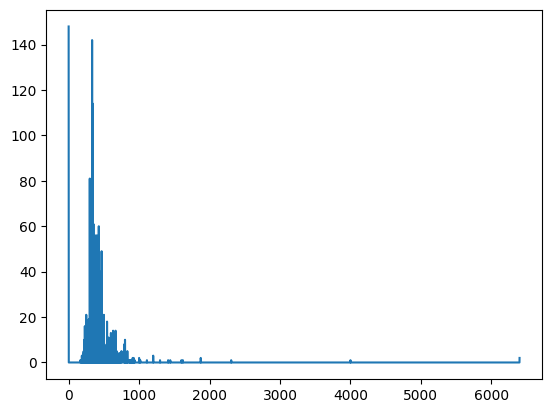

In [16]:
plt.plot(x, bpms)
plt.show()

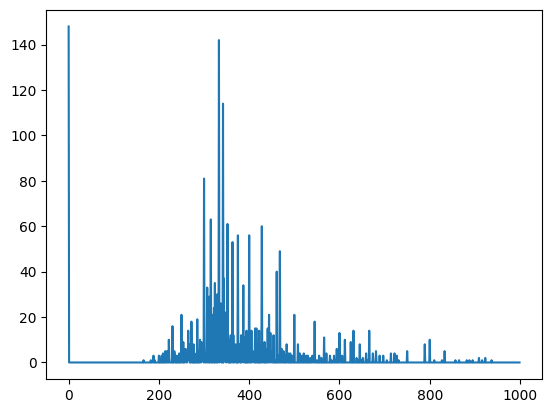

In [17]:
plt.plot(x[0:1000], bpms[0:1000])
plt.show()

### reduce classes to 256, center around highest amount of data

In [2]:
class_num = 256
class_offset = 230

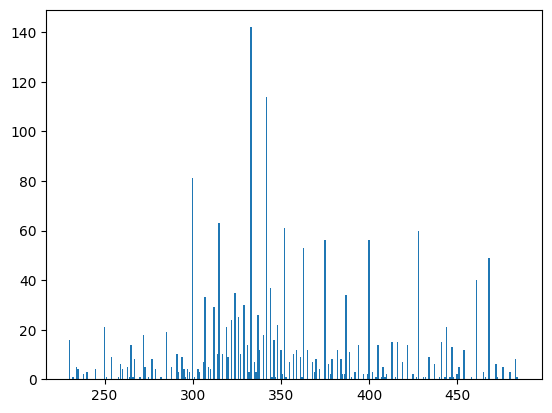

In [18]:
plt.bar(x[class_offset:class_offset+class_num], 
        bpms[class_offset:class_offset+class_num])
plt.show()

In [20]:
!sh filterBeatmapAnno.sh $class_num $class_offset rawTempOsu.tsv tempOsu.tsv

rm: cannot remove 'tempOsu.tsv': No such file or directory
-450291-0	333	X	X
1001653-2096799-0	323	X	X
1006385-2106456-0	316	X	X
100931-542442-0	405	X	X
1011011-2116202-0	462	X	X
1011573-2117268-0	313	X	X
1011573-2117268-275377	313	X	X
101188-268272-0	462	X	X
1020429-2143040-0	337	X	X
1020429-2143040-23930	337	X	X
1022393-2154520-0	323	X	X
1022787-2146288-20659	323	X	X
1032163-2185535-0	353	X	X
103372-333080-0	333	X	X
103372-333080-125010	333	X	X
1034008-2161929-0	300	X	X
1035110-2164190-0	323	X	X
1041518-2184660-0	359	X	X
105350-276588-0	405	X	X
105350-276588-62253	405	X	X
1054045-2202493-0	333	X	X
1054045-2202493-203420	414	X	X
1054045-2202493-380556	333	X	X
1057368-2210068-0	390	X	X
1058282-2361078-0	405	X	X
106010-278273-0	240	X	X
1065214-2230617-0	469	X	X
1065214-2230617-127816	352	X	X
1065214-2230617-157840	469	X	X
1073023-0-0	387	X	X
107644-281989-0	382	X	X
1076622-2252784-155043	375	X	X
1078668-2256987-0	429	X	X
1079510-2258534-0	353	X	X
1079510-2258534-144243	387	X	X
1079510-2

224203-524096-36271	333	X	X
224203-524096-52270	333	X	X
224293-606563-0	357	X	X
226582-531151-14887	333	X	X
226582-531151-36220	333	X	X
226582-531151-52219	333	X	X
226995-994893-224264	300	X	X
226995-994893-262672	300	X	X
226995-994893-277072	300	X	X
227128-749723-0	343	X	X
227693-530504-0	331	X	X
228402-531896-4352	353	X	X
229745-534445-0	353	X	X
230040-567254-0	345	X	X
230442-535973-0	359	X	X
230736-561814-0	333	X	X
231691-538286-0	444	X	X
232290-539578-0	296	X	X
232290-539578-19588	296	X	X
232290-539578-76336	296	X	X
233039-541044-0	273	X	X
234281-1079813-0	231	X	X
234455-638175-0	429	X	X
234919-599979-51881	333	X	X
234919-599979-8715	333	X	X
236231-547254-0	400	X	X
236231-547254-147804	400	X	X
236231-547254-88565	400	X	X
237490-599293-0	326	X	X
237490-599293-157173	326	X	X
237490-599293-183260	326	X	X
237515-609855-0	343	X	X
238004-550615-0	469	X	X
239727-554198-0	286	X	X
239822-554438-0	403	X	X
240406-556619-0	319	X	X
240926-576789-0	323	X	X
240926-576789-188499	323	X	X
241064-556

392958-861021-0	347	X	X
393273-894471-0	345	X	X
394270-858798-1806	357	X	X
394270-858798-78932	357	X	X
394290-858205-0	333	X	X
394674-859007-0	343	X	X
394742-860793-0	343	X	X
394816-859248-21513	328	X	X
395149-860022-0	343	X	X
395241-860180-0	364	X	X
395690-861092-0	469	X	X
396516-873389-0	335	X	X
396532-862636-0	380	X	X
398466-866384-0	343	X	X
398921-884638-0	375	X	X
398921-884638-151312	375	X	X
399056-867630-0	435	X	X
399061-871844-0	364	X	X
400109-870695-0	382	X	X
400109-870695-176571	382	X	X
400109-870695-201921	333	X	X
400109-870695-220504	382	X	X
400109-870695-245346	382	X	X
400109-870695-272020	382	X	X
400652-883912-0	333	X	X
401352-1150541-0	314	X	X
402173-874717-0	400	X	X
402173-874717-13188	400	X	X
402173-874717-53158	400	X	X
402187-874746-0	333	X	X
403282-967559-0	417	X	X
403427-887095-0	324	X	X
403897-880023-0	335	X	X
404417-879323-0	337	X	X
404649-879785-0	341	X	X
404709-879929-0	333	X	X
404781-880091-0	300	X	X
404781-880091-294932	395	X	X
40521-128529-0	324	X	X
405516-926

506155-1082882-97232	286	X	X
506863-1078110-0	462	X	X
506908-1078194-0	333	X	X
506976-1078432-0	462	X	X
507943-1080362-0	343	X	X
508222-1082444-0	323	X	X
508320-1081116-0	343	X	X
508320-1081116-11672	343	X	X
508680-1081834-21690	299	X	X
508947-1207717-0	333	X	X
508947-1207717-132035	333	X	X
508947-1207717-164034	333	X	X
508947-1207717-94702	333	X	X
509341-1146122-0	400	X	X
510300-1087040-0	405	X	X
510723-1085829-0	469	X	X
510859-1086050-36380	314	X	X
510871-1086071-0	366	X	X
510871-1086071-23761	366	X	X
510871-1086071-286158	366	X	X
510871-1086071-36768	366	X	X
510931-1086190-0	317	X	X
512168-1088531-0	231	X	X
512659-1089647-0	375	X	X
513274-1090652-0	403	X	X
513293-1090698-134304	438	X	X
513293-1090698-51158	438	X	X
513574-1091228-0	400	X	X
514181-1092367-0	299	X	X
514550-1101627-0	469	X	X
514772-1098329-0	330	X	X
514980-1125982-0	375	X	X
516013-1102734-0	375	X	X
516013-1102734-119883	326	X	X
516013-1102734-163017	316	X	X
516013-1102734-203731	308	X	X
516013-1102734-244823	321	X	X
516

664099-1413791-185047	417	X	X
664099-1413791-5047	417	X	X
664522-1406451-0	349	X	X
664636-1406645-0	370	X	X
664758-1406861-215320	414	X	X
665175-1407811-0	337	X	X
666776-1411083-0	238	X	X
666776-1411083-32020	238	X	X
667097-1427204-0	300	X	X
667097-1427204-31916	300	X	X
667290-1411984-0	333	X	X
667433-1412248-147539	343	X	X
667433-1412248-166739	343	X	X
667433-1412248-35768	343	X	X
667433-1412248-91311	343	X	X
668693-1414600-0	429	X	X
668693-1414600-250570	429	X	X
668693-1414600-312271	429	X	X
668693-1414600-368845	429	X	X
668693-1414600-398008	429	X	X
668693-1414600-451134	429	X	X
668693-1414600-485417	429	X	X
668693-1414600-558838	429	X	X
668693-1414600-635533	429	X	X
668693-1414600-649223	429	X	X
668693-1414600-669820	429	X	X
668693-1414600-69487	429	X	X
668693-1414600-784687	429	X	X
668799-1414762-5443	353	X	X
670800-1543364-0	331	X	X
67105-891250-0	343	X	X
67276-195633-0	316	X	X
672960-1423969-14867	466	X	X
673138-1463669-0	451	X	X
673138-1463669-63400	438	X	X
673365-1425096-0	392

819611-1718454-199665	316	X	X
820198-1761413-0	429	X	X
820198-1761413-109701	440	X	X
820198-1761413-123683	429	X	X
820198-1761413-64027	429	X	X
822892-1724600-16830	400	X	X
822892-1724600-255230	400	X	X
823314-1725430-0	279	X	X
824959-1733441-0	353	X	X
827286-1734522-0	254	X	X
827875-1763997-111339	291	X	X
827875-1763997-13733	400	X	X
827875-1763997-166969	291	X	X
827875-1763997-186775	291	X	X
827875-1763997-264250	291	X	X
827875-1763997-40861	291	X	X
827875-1763997-91540	291	X	X
828808-1736412-25445	263	X	X
828808-1736412-254918	263	X	X
829511-1737885-0	451	X	X
829511-1737885-174541	351	X	X
829511-1737885-222260	351	X	X
829511-1737885-259101	351	X	X
829511-1737885-362960	351	X	X
829511-1737885-98402	351	X	X
829940-1745634-0	333	X	X
829940-1745634-213315	333	X	X
829940-1745634-371314	333	X	X
829940-1745634-463314	333	X	X
829940-1745634-78648	333	X	X
831242-1741498-0	441	X	X
831242-1741498-172987	441	X	X
831242-1741498-195928	441	X	X
83130-289999-0	353	X	X
832467-1744005-0	441	X	X
83246

In [69]:
!sh dsSplit.sh tempOsu.tsv

1792


In [3]:
ground_truth = TempoGroundTruth('tempOsu.tsv', nb_classes=class_num, label_offset=class_offset)
audio_folder = 'dsOsu'
joblib_file = 'tempo_features.joblib'

In [39]:
def tempo_extractor(file):
    return extract_tempo_features(file, window_length=1024)

In [40]:
convert_audio_folder_to_joblib(audio_folder, ground_truth, 
                            joblib_file, tempo_extractor)

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)
/usr/local/lib/python3.8/dist-packages/librosa/util/decora

{'789095-1656150-251741': array([[[0.599   ],
         [2.793   ],
         [2.273   ],
         ...,
         [2.248   ],
         [1.945   ],
         [4.04    ]],
 
        [[0.2081  ],
         [2.008   ],
         [1.397   ],
         ...,
         [1.218   ],
         [1.268   ],
         [2.936   ]],
 
        [[0.11975 ],
         [0.9746  ],
         [0.9355  ],
         ...,
         [4.2     ],
         [1.652   ],
         [1.248   ]],
 
        ...,
 
        [[0.007088],
         [0.0663  ],
         [0.1058  ],
         ...,
         [0.246   ],
         [0.2375  ],
         [0.3447  ]],
 
        [[0.01124 ],
         [0.0575  ],
         [0.0813  ],
         ...,
         [0.1599  ],
         [0.1683  ],
         [0.3003  ]],
 
        [[0.00994 ],
         [0.05045 ],
         [0.0645  ],
         ...,
         [0.116   ],
         [0.1735  ],
         [0.2622  ]]], dtype=float16),
 '559776-1183803-0': array([[[0.],
         [0.],
         [0.],
         ...,
        

# define model

In [4]:
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Conv2D, BatchNormalization, Dropout, GlobalAveragePooling2D, \
    Activation, MaxPooling2D, AveragePooling2D

In [5]:
def create_shallow_tempo_model(input_shape=(40, 256, 1), output_dim=class_num, filters=4,
                               short_filter_length=3, long_filter_length=256, dropout=0.2):
    short_filter_shape = (1, short_filter_length)
    long_filter_shape = (1, long_filter_length)

    model_name = 'shallow_tempo_in-{}_out-{}_filters-{}_short_shape-{}_long_shape-{}_dropout-{}'\
        .format(input_shape, output_dim, filters, short_filter_shape, long_filter_shape, dropout) \
        .replace(',', '_').replace(' ', '_').replace('(', '').replace(')', '')

    visible = Input(shape=(input_shape[0], None, input_shape[2]))
    x = visible
    x = Conv2D(filters, short_filter_shape, padding='same', activation='relu', name='Conv0')(x)
    if dropout > 0.:
        x = Dropout(dropout)(x)
    x = AveragePooling2D(pool_size=(input_shape[0], 1), name='Avg0')(x)
    x = Conv2D(filters * 64, long_filter_shape, padding='same', activation='relu', name='Conv2')(x)
    if dropout > 0.:
        x = Dropout(dropout)(x)
    x = Conv2D(output_dim, (1, 1), padding='same', activation='relu', name='1x1')(x)
    x = GlobalAveragePooling2D()(x)
    x = Activation('softmax')(x)
    return Model(inputs=visible, outputs=x, name=model_name)

def create_shallow_key_model(input_shape=(168, 60, 1), output_dim=class_num, filters=4,
                             short_filter_length=3, long_filter_length=168, dropout=0.2):

    short_filter_shape = (short_filter_length, 1)
    long_filter_shape = (long_filter_length, 1)

    model_name = 'shallow_key_in-{}_out-{}_filters-{}_short_shape-{}_long_shape-{}_dropout-{}'\
        .format(input_shape, output_dim, filters, short_filter_shape, long_filter_shape, dropout) \
        .replace(',', '_').replace(' ', '_').replace('(', '').replace(')', '')

    visible = Input(shape=(input_shape[0], None, input_shape[2]))
    x = visible
    x = Conv2D(filters, short_filter_shape, padding='same', activation='relu', name='Conv0')(x)
    if dropout > 0.:
        x = Dropout(dropout)(x)
    x = AveragePooling2D(pool_size=(1, input_shape[1]), name='Avg0')(x)
    x = Conv2D(filters * 64, long_filter_shape, padding='same', activation='relu', name='Conv2')(x)
    if dropout > 0.:
        x = Dropout(dropout)(x)
    x = Conv2D(output_dim, (1, 1), padding='same', activation='relu', name='1x1')(x)
    x = GlobalAveragePooling2D()(x)
    x = Activation('softmax')(x)
    return Model(inputs=visible, outputs=x, name=model_name)

In [6]:
def possible_pool(layer, input_shape, pool_shape, max_pool, x):
    w = pool_shape[0]
    if input_shape[0] is not None and pool_shape[0] ** layer > input_shape[0]:
        w = 1

    h = pool_shape[1]
    if input_shape[1] is not None and pool_shape[1] ** layer > input_shape[1]:
        h = 1
    if max_pool:
        return MaxPooling2D((w, h), name='MaxPool2D' + str(layer))(x)
    else:
        return AveragePooling2D((w, h), name='AvgPool2D' + str(layer))(x)

In [7]:
def create_vgg_like_model(input_shape=(40, 256, 1), output_dim=class_num, filters=64, pool_shape=(1, 2), max_pool=True,
                          filter_shapes=[(1, 5), (1, 3)], dropout=0.3):

    model_name = 'vgg_like_in-{}_out-{}_filters-{}_pool_shape-{}_max-{}_filter_shapes-{}_dropout-{}'\
        .format(input_shape, output_dim, filters, pool_shape, max_pool, filter_shapes, dropout)\
        .replace(',', '_').replace(' ', '_').replace('(', '').replace(')', '').replace('[', '').replace(']', '')

    visible = Input(shape=(input_shape[0], None, input_shape[2]))
    x = visible
    x = Conv2D(filters*2**0, filter_shapes[0], padding='same', activation='relu', name='Conv0')(x)
    x = BatchNormalization(name='BN0')(x)
    x = Conv2D(filters*2**0, filter_shapes[1], padding='same', activation='relu', name='Conv1')(x)
    x = BatchNormalization(name='BN1')(x)
    x = possible_pool(1, input_shape, pool_shape, max_pool, x)
    x = Dropout(dropout)(x)

    x = Conv2D(filters*2**1, filter_shapes[0], padding='same', activation='relu', name='Conv2')(x)
    x = BatchNormalization(name='BN2')(x)
    x = Conv2D(filters*2**1, filter_shapes[1], padding='same', activation='relu', name='Conv3')(x)
    x = BatchNormalization(name='BN3')(x)
    x = possible_pool(2, input_shape, pool_shape, max_pool, x)

    x = Dropout(dropout)(x)

    x = Conv2D(filters*2**2, filter_shapes[0], padding='same', activation='relu', name='Conv4')(x)
    x = BatchNormalization(name='BN4')(x)
    x = Conv2D(filters*2**2, filter_shapes[1], padding='same', activation='relu', name='Conv5')(x)
    x = BatchNormalization(name='BN5')(x)
    x = possible_pool(3, input_shape, pool_shape, max_pool, x)
    x = Dropout(dropout)(x)

    x = Conv2D(filters*2**2, filter_shapes[0], padding='same', activation='relu', name='Conv6')(x)
    x = BatchNormalization(name='BN6')(x)
    x = Conv2D(filters*2**2, filter_shapes[1], padding='same', activation='relu', name='Conv7')(x)
    x = BatchNormalization(name='BN7')(x)
    x = possible_pool(4, input_shape, pool_shape, max_pool, x)

    x = Dropout(dropout)(x)

    x = Conv2D(filters*2**3, filter_shapes[0], padding='same', activation='relu', name='Conv8')(x)
    x = BatchNormalization(name='BN8')(x)
    x = Conv2D(filters*2**3, filter_shapes[1], padding='same', activation='relu', name='Conv9')(x)
    x = BatchNormalization(name='BN9')(x)
    x = possible_pool(5, input_shape, pool_shape, max_pool, x)
    x = Dropout(dropout)(x)

    x = Conv2D(filters*2**3, filter_shapes[0], padding='same', activation='relu', name='Conv10')(x)
    x = BatchNormalization(name='BN10')(x)
    x = Conv2D(filters*2**3, filter_shapes[1], padding='same', activation='relu', name='Conv11')(x)
    x = BatchNormalization(name='BN11')(x)
    x = possible_pool(6, input_shape, pool_shape, max_pool, x)
    x = Dropout(dropout)(x)

    x = Conv2D(output_dim, (1, 1), padding='same', activation='relu', name='1x1')(x)
    x = GlobalAveragePooling2D()(x)

    x = Activation('softmax')(x)
    return Model(inputs=visible, outputs=x, name=model_name)

# define training

In [8]:
import numpy as np
from tensorflow.keras.utils import Sequence

def tempo_augmenter():
    return 1

class DataGenerator(Sequence):
    """
    Key-based Keras sequence to be used as generator during fitting and/or predicting.
    This sequence can balance samples for a given set of classes.
    """

    def __init__(self, ground_truth, sample_loader, binarizer, batch_size=32, sample_shape=(32, 32, 32), shuffle=True,
                 augmenter=None):
        """
        Initialization.

        :param scale: scale samples and labels by randomly chosen factors
        :param ground_truth: ground truth containing id (key) and labels
        :param sample_loader: function used to load a sample (features) when given a sample key (e.g. a UUID)
        :param batch_size: batch size
        :param sample_shape: shape of a single feature sample
        :param shuffle: shuffle samples
        """
        self.ground_truth = ground_truth
        self.sample_shape = sample_shape
        self.batch_size = batch_size
        self.sample_ids = list(ground_truth.labels.keys())
        self.binarizer = binarizer
        self.shuffle = shuffle
        self.sample_loader = sample_loader
        self.indexes = None
        self.on_epoch_end()
        self.augmenter = augmenter

    def __len__(self):
        """
        Number of batches per epoch.

        :return: batches per epoch
        """
        return int(np.floor(len(self.sample_ids) / self.batch_size))

    def __getitem__(self, batch_index):
        """
        Generate a batch for the given batch index.

        :param batch_index: batch index
        :return: one batch of data
        """
        indexes = self.indexes[batch_index * self.batch_size:(batch_index + 1) * self.batch_size]
        temp_keys = [self.sample_ids[k] for k in indexes]
        X, y = self.__data_generation(temp_keys)
        return X, y

    def on_epoch_end(self):
        """
        Re-shuffle, if necessary after each epoch.
        """
        self.indexes = np.arange(len(self.sample_ids))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, keys):
        """
        Creates a batch of data.

        :param keys: ids for the samples that should make up the batch
        :return: batch of data
        """
        X = np.empty((self.batch_size, *self.sample_shape))
        augmentation_parameter = None
        if self.augmenter is not None:
            augmentation_parameter = self.augmenter()

        for i, key in enumerate(keys):
            X[i,] = self.sample_loader(key, augmentation_parameter)

        y = self.binarizer.transform([[self.ground_truth.get_index_for_key(key)] for key in keys])

        return X, y

In [9]:
import argparse
import datetime
import time
from os.path import join

import tensorflow as tf
#from sklearn.externals import joblib
import joblib
from sklearn.preprocessing import OneHotEncoder
from tensorflow.python.keras import backend as K
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.models import load_model
#from tensorflow.keras.optimizers import Adam
Adam=tf.keras.optimizers.Adam
from tensorflow.python.lib.io.file_io import FileIO, file_exists

from directional_cnns.cloudml_utils import create_local_copy, save_model, make_missing_dirs
from directional_cnns.loader import create_mel_sample_loader, create_cq_sample_loader
from directional_cnns.prediction import predict
#from directional_cnns.generator import DataGenerator, tempo_augmenter, key_augmenter
from directional_cnns.groundtruth import TempoGroundTruth, KeyGroundTruth
from directional_cnns.models import ModelLoader
#from directional_cnns.network.shallow import create_shallow_key_model, create_shallow_tempo_model
#from directional_cnns.network.vgg import create_vgg_like_model
from directional_cnns.normalizer import std_normalizer

In [10]:
batch_size = 32
#batch_size = 96
lr = 0.001
epochs = 5000 # 5000 ?
#epochs = 5 # 5000 ?
patience = 150 # 150 ?
filters = 4
dropout = 0.3
#runs = 5 # 3
runs = 5 # 3
steps = None #defined later

In [11]:
def create_shallow_key(filters=filters, dropout=dropout):
    return create_shallow_key_model(input_shape=input_shape, output_dim=class_num, filters=filters,
                                    short_filter_length=3,
                                    long_filter_length=input_shape[0],
                                    dropout=dropout)

def create_shallow_tempo(filters=filters, dropout=dropout):
    return create_shallow_tempo_model(input_shape=input_shape, output_dim=class_num, filters=filters,
                                      short_filter_length=3,
                                      long_filter_length=input_shape[1],
                                      dropout=dropout)

def create_rectangular_tempo_vgg_max(filters=filters, dropout=dropout):
    max_pool_shape = (2, 2)
    filter_shapes = [(1, 5), (1, 3)]

    return create_vgg_like_model(input_shape=input_shape, output_dim=class_num, filters=filters,
                                 pool_shape=max_pool_shape, filter_shapes=filter_shapes, dropout=dropout)

def create_rectangular_key_vgg_max(filters=filters, dropout=dropout):
    max_pool_shape = (2, 2)
    filter_shapes = [(5, 1), (3, 1)]

    return create_vgg_like_model(input_shape=input_shape, output_dim=class_num, filters=filters,
                                 pool_shape=max_pool_shape, filter_shapes=filter_shapes, dropout=dropout)

def create_square_vgg_max(filters=filters, dropout=dropout):
    max_pool_shape = (2, 2)
    filter_shapes = [(5, 5), (3, 3)]

    return create_vgg_like_model(input_shape=input_shape, output_dim=class_num, filters=filters,
                                 pool_shape=max_pool_shape, filter_shapes=filter_shapes, dropout=dropout)



In [12]:
models = {}
input_shape = (40, 256, 1)
augmenter = None
log = None
normalizer = None
test_files = None
features = None
log_file_name = join('./jobsOsu', 'log-{}.txt'.format(time.strftime("%Y%m%d-%H%M%S")))
log_file =  FileIO(log_file_name, mode='w')

create_model_functions = [create_shallow_key,
    create_shallow_tempo,
    create_rectangular_tempo_vgg_max,
    create_rectangular_key_vgg_max,
    create_square_vgg_max
    ]
creation_filter = {'square_vgg': [1, 2, 4, 8, 16, 24], 'vgg': [2, 4, 8, 16, 24], 
    'shallow': [1, 2, 4, 6, 8, 12]}
#creation_filter = {'square_vgg': [1, 2, 4, 8, 16, 24], 
    #'vgg': [8, 16, 24], 'shallow': [6, 8, 12]}
creation_dropout = [0.1, 0.3, 0.5]
#creation_dropout = [0.3, 0.5]

In [13]:
def log(message):
    message_bytes = '{}\n'.format(message).encode(encoding='utf-8')
    log_file.write(message_bytes)
    print(message)
def train_and_predict(train_file, valid_file, test_files, feature_files, job_dir, model_dir):
    """
    Main function to execute training and prediction of all architecture variations.

    :param train_file: training ground truth in .tsv format
    :param valid_file: validation ground truth in .tsv format
    :param test_files: comma-separated validation ground truths in .tsv format
    :param feature_files: comma-separated feature dictionaries in .joblib format
    :param job_dir: working directory
    :param model_dir: directory to store models and predictions in
    """
    log_file_name = join(job_dir, 'log-{}.txt'.format(time.strftime("%Y%m%d-%H%M%S")))
    make_missing_dirs(log_file_name)
    print('Logging to {}'.format(log_file_name))
    with FileIO(log_file_name, mode='w') as log_file:

        log('Starting train and predict. {}\n'.format(datetime.datetime.now()))

        if tf.test.gpu_device_name():
            config = tf.compat.v1.ConfigProto()
            config.gpu_options.per_process_gpu_memory_fraction = 0.2
            config.gpu_options.allow_growth = True
            session = tf.compat.v1.Session(config=config)
            tf.compat.v1.keras.backend.set_session(session)
            K.set_session(session)

            physical_devices = tf.config.experimental.list_physical_devices('GPU')
            #tf.config.experimental.set_memory_growth(physical_devices[0], True)
            tf.config.experimental.set_virtual_device_configuration(physical_devices[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4024)])
            log('Default GPU: {}'.format(tf.test.gpu_device_name()))
        else:
            log("Failed to find default GPU.")

        log('Creating local copies, if necessary...')

        train_file = create_local_copy(train_file)
        valid_file = create_local_copy(valid_file)
        test_files = [create_local_copy(test_file) for test_file in test_files.split(',')]
        feature_files = [create_local_copy(feature_file) for feature_file in feature_files.split(',')]

        # add validation set to test sets, so that it always gets evaluated
        test_files.insert(0, valid_file)

        features = {}
        for feature_file in feature_files:
            features.update(joblib.load(feature_file))
        log('Loaded features for {} files from {}.'.format(len(features), feature_files))

        normalizer = std_normalizer

        # tempo or key?
        first_feature = features[list(features.keys())[0]]
        if is_tempo_feature(first_feature):
            log('We assume that we are estimating TEMPO. First feature shape: {}'.format(first_feature.shape))
            augmenter = tempo_augmenter
            input_shape = (40, 256, 1)
            train_loader = create_mel_sample_loader(features, shape=input_shape, random_offset=True,
                                                    normalizer=normalizer)
            valid_loader = create_mel_sample_loader(features, shape=input_shape, random_offset=False,
                                                    normalizer=normalizer)
            log('Loading ground truth...')

            train_ground_truth = TempoGroundTruth(train_file, nb_classes=class_num,
                                                 label_offset=class_offset)
            log('Loaded {} training annotations from {}.'.format(len(train_ground_truth.labels), train_file))

            valid_ground_truth = TempoGroundTruth(valid_file, nb_classes=class_num,
                                                 label_offset=class_offset)
            log('Loaded {} validation annotations from {}.'.format(len(valid_ground_truth.labels), valid_file))


        else:
            log('We assume that we are estimating KEY. First feature shape: {}'.format(first_feature.shape))
            augmenter = key_augmenter
            input_shape = (168, 60, 1)
            train_loader = create_cq_sample_loader(features, shape=input_shape, random_offset=True,
                                                   normalizer=normalizer)
            valid_loader = create_cq_sample_loader(features, shape=input_shape, random_offset=False,
                                                   normalizer=normalizer)

            log('Loading ground truth...')

            train_ground_truth = KeyGroundTruth(train_file)
            log('Loaded {} training annotations from {}.'.format(len(train_ground_truth.labels), train_file))

            valid_ground_truth = KeyGroundTruth(valid_file)
            log('Loaded {} validation annotations from {}.'.format(len(valid_ground_truth.labels), valid_file))


        steps = int(len(train_ground_truth.labels) / batch_size)

        nb_classes = len(train_ground_truth.classes())
        log('Number of classes: {}'.format(nb_classes))
        log('Creating generators...')
        log('Creating model...')

        for create_model in create_model_functions:
            if 'vgg' in create_model.__name__:
                if 'square' in create_model.__name__:
                    filters = creation_filter['square_vgg']
                else:
                    filters = creation_filter['vgg']
            if 'shallow' in create_model.__name__:
                filters = creation_filter['shallow']

            for f in filters:
                for d in creation_dropout:
                    same_kind_models = []
                    for run in range(runs):
                        model = create_model(**{'filters': f, 'dropout': d})
                        model_loader = train(run=run, epochs=epochs, patience=patience, batch_size=batch_size, lr=lr, steps=steps,
                                      input_shape=input_shape, model=model, augmenter=augmenter,
                                      train_ground_truth=train_ground_truth, valid_ground_truth=valid_ground_truth,
                                      train_loader=train_loader, valid_loader=valid_loader, model_dir=model_dir, log=log)
                        same_kind_models.append(model_loader)
                        K.clear_session()
                    model_name = same_kind_models[0].name
                    models[model_name] = same_kind_models

In [14]:
def is_tempo_feature(feature):
    tempo_features = feature.shape[0] == 40
    return tempo_features

In [15]:
def train(run=0, epochs=5000, patience=50, batch_size=32, lr=0.001, steps=1, model=None, input_shape=(40, 256, 1),
          augmenter=None, train_ground_truth=None, valid_ground_truth=None, train_loader=None, valid_loader=None,
          model_dir='./', log=None):
    # and save to model_dir
    model_file = join(model_dir, 'model_{}_run={}.h5'.format(model.name, run))
    if file_exists(model_file):
        log('Model file {} already exists. Skipping training.'.format(model_file))
        return ModelLoader(model_file, model.name)
    else:
        checkpoint_model_file = 'checkpoint_model.h5'
        binarizer = OneHotEncoder(sparse=False)
        binarizer.fit([[c] for c in range(train_ground_truth.nb_classes)])
        model.compile(loss='categorical_crossentropy', optimizer=(Adam(lr=lr)), metrics=['accuracy'], steps_per_execution=8)
        log('Run {}, {}, params={}'.format(run, model.name, model.count_params()))
        log(model.summary())
        train_generator = DataGenerator(train_ground_truth,
                                        train_loader,
                                        binarizer, batch_size=batch_size,
                                        sample_shape=input_shape, shuffle=True, augmenter=augmenter)
        valid_generator = DataGenerator(valid_ground_truth,
                                        valid_loader,
                                        binarizer, batch_size=batch_size,
                                        sample_shape=input_shape, shuffle=False, augmenter=None)
        callbacks = [EarlyStopping(monitor='val_loss', patience=patience, verbose=1),
                     ModelCheckpoint(checkpoint_model_file, monitor='val_loss')]
        #model.fit_generator(train_generator, epochs=epochs, callbacks=callbacks,
        model.fit(train_generator, epochs=epochs, callbacks=callbacks, steps_per_epoch=steps,
                                      validation_data=valid_generator)
        log(model.summary())
        log('lr={}, batch_size={}, epochs={}, augmenter={}, model_name={}'
              .format(lr, batch_size, epochs, augmenter, model.name))
        log('Run {}, {}, params={}'.format(run, model.name, model.count_params()))
        model = load_model(checkpoint_model_file)
        save_model(model, model_file)
        return ModelLoader(model_file, model.name)

# Train

In [16]:
train_and_predict('train.tsv', 'val.tsv', 'test.tsv', 
  joblib_file, './jobsOsu', './modelsOsu')    

Logging to ./jobsOsu/log-20220317-072435.txt
Starting train and predict. 2022-03-17 07:24:35.771883

Default GPU: /device:GPU:0
Creating local copies, if necessary...
Local copy for train.tsv not needed.
Local copy for val.tsv not needed.
Local copy for test.tsv not needed.
Local copy for tempo_features.joblib not needed.
Loaded features for 1792 files from ['tempo_features.joblib'].
We assume that we are estimating TEMPO. First feature shape: (40, 501, 1)
Loading ground truth...
Loaded 1075 training annotations from train.tsv.
Loaded 358 validation annotations from val.tsv.
Number of classes: 256
Creating generators...
Creating model...
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model

Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu

Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2.h5 already exists. Skipping training.
Mode

Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0.h5 already exists. Skipping training.
Mod

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1_

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


33/33 [==============================] - 4s 121ms/step - loss: 5.5154 - accuracy: 0.0142 - val_loss: 5.5260 - val_accuracy: 0.0312
Epoch 2/5000
33/33 [==============================] - 1s 21ms/step - loss: 5.3680 - accuracy: 0.0265 - val_loss: 5.4908 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.1970 - accuracy: 0.0530 - val_loss: 5.3961 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 20ms/step - loss: 5.0309 - accuracy: 0.0653 - val_loss: 5.2899 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8800 - accuracy: 0.0966 - val_loss: 5.1832 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.7126 - accuracy: 0.0966 - val_loss: 4.9945 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6180 - accuracy: 0.1023 - val_loss: 4.9183 - val_accuracy: 0.0909
Epoch 8/500

33/33 [==============================] - 1s 19ms/step - loss: 2.6207 - accuracy: 0.3352 - val_loss: 3.4610 - val_accuracy: 0.2926
Epoch 59/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.5516 - accuracy: 0.3485 - val_loss: 3.7625 - val_accuracy: 0.2727
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.5360 - accuracy: 0.3409 - val_loss: 3.4189 - val_accuracy: 0.3466
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.5124 - accuracy: 0.3504 - val_loss: 3.4282 - val_accuracy: 0.3068
Epoch 62/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.4420 - accuracy: 0.3447 - val_loss: 3.3629 - val_accuracy: 0.3409
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.4389 - accuracy: 0.3456 - val_loss: 3.4867 - val_accuracy: 0.3324
Epoch 64/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.3981 - accuracy: 0.3570 - val_loss: 3.5430 - val_accuracy: 0.3125
Epoch 

Epoch 115/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4468 - accuracy: 0.5833 - val_loss: 2.6879 - val_accuracy: 0.5057
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4961 - accuracy: 0.5644 - val_loss: 2.5877 - val_accuracy: 0.5426
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4455 - accuracy: 0.6070 - val_loss: 2.5679 - val_accuracy: 0.5511
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4605 - accuracy: 0.5805 - val_loss: 2.5913 - val_accuracy: 0.5142
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4315 - accuracy: 0.5814 - val_loss: 2.6869 - val_accuracy: 0.4858
Epoch 120/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5030 - accuracy: 0.5748 - val_loss: 2.7059 - val_accuracy: 0.5028
Epoch 121/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4467 - accuracy: 0.5938 - val_loss: 2.6613 - val_ac

33/33 [==============================] - 1s 20ms/step - loss: 1.1132 - accuracy: 0.6742 - val_loss: 2.7341 - val_accuracy: 0.4744
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0874 - accuracy: 0.6847 - val_loss: 2.4349 - val_accuracy: 0.5795
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0037 - accuracy: 0.7027 - val_loss: 2.4688 - val_accuracy: 0.5852
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0617 - accuracy: 0.6884 - val_loss: 2.4867 - val_accuracy: 0.5710
Epoch 175/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1513 - accuracy: 0.6648 - val_loss: 2.4558 - val_accuracy: 0.5568
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1119 - accuracy: 0.6799 - val_loss: 2.4197 - val_accuracy: 0.5909
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0608 - accuracy: 0.7064 - val_loss: 2.4789 - val_accuracy: 0.5767


33/33 [==============================] - 1s 20ms/step - loss: 0.8765 - accuracy: 0.7405 - val_loss: 2.3296 - val_accuracy: 0.6307
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8785 - accuracy: 0.7509 - val_loss: 2.4841 - val_accuracy: 0.5994
Epoch 229/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9271 - accuracy: 0.7197 - val_loss: 2.3548 - val_accuracy: 0.6420
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8859 - accuracy: 0.7424 - val_loss: 2.3719 - val_accuracy: 0.6477
Epoch 231/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8796 - accuracy: 0.7405 - val_loss: 2.4252 - val_accuracy: 0.5938
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9808 - accuracy: 0.7045 - val_loss: 2.3607 - val_accuracy: 0.6420
Epoch 233/5000
33/33 [==============================] - 1s 21ms/step - loss: 0.9295 - accuracy: 0.7188 - val_loss: 2.3757 - val_accuracy: 0.6250


33/33 [==============================] - 1s 19ms/step - loss: 0.7948 - accuracy: 0.7737 - val_loss: 2.3229 - val_accuracy: 0.6648
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7816 - accuracy: 0.7633 - val_loss: 2.3352 - val_accuracy: 0.6562
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7293 - accuracy: 0.7708 - val_loss: 2.2188 - val_accuracy: 0.6534
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8214 - accuracy: 0.7633 - val_loss: 2.3428 - val_accuracy: 0.6392
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8099 - accuracy: 0.7689 - val_loss: 2.3356 - val_accuracy: 0.6335
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7668 - accuracy: 0.7689 - val_loss: 2.3427 - val_accuracy: 0.6477
Epoch 289/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7261 - accuracy: 0.7860 - val_loss: 2.2989 - val_accuracy: 0.6733


33/33 [==============================] - 1s 19ms/step - loss: 0.7479 - accuracy: 0.7746 - val_loss: 2.4267 - val_accuracy: 0.6562
Epoch 340/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7441 - accuracy: 0.7737 - val_loss: 2.3203 - val_accuracy: 0.6705
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7207 - accuracy: 0.7850 - val_loss: 2.2795 - val_accuracy: 0.6932
Epoch 342/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7716 - accuracy: 0.7614 - val_loss: 2.3006 - val_accuracy: 0.6733
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7323 - accuracy: 0.7860 - val_loss: 2.3887 - val_accuracy: 0.6534
Epoch 344/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7110 - accuracy: 0.7812 - val_loss: 2.3599 - val_accuracy: 0.6761
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7180 - accuracy: 0.7803 - val_loss: 2.3997 - val_accuracy: 0.6733


33/33 [==============================] - 1s 19ms/step - loss: 0.7231 - accuracy: 0.7879 - val_loss: 2.4224 - val_accuracy: 0.6761
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6457 - accuracy: 0.8106 - val_loss: 2.3835 - val_accuracy: 0.6960
Epoch 397/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6743 - accuracy: 0.7860 - val_loss: 2.4141 - val_accuracy: 0.6705
Epoch 398/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6064 - accuracy: 0.8172 - val_loss: 2.3527 - val_accuracy: 0.6932
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6686 - accuracy: 0.8220 - val_loss: 2.4787 - val_accuracy: 0.6790
Epoch 400/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6686 - accuracy: 0.8191 - val_loss: 2.4419 - val_accuracy: 0.6847
Epoch 401/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6233 - accuracy: 0.8182 - val_loss: 2.4105 - val_accuracy: 0.6847


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1.h5.
Run 2, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_368 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                  

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.4875 - accuracy: 0.0180 - val_loss: 5.5191 - val_accuracy: 0.0511
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.2975 - accuracy: 0.0578 - val_loss: 5.4503 - val_accuracy: 0.0511
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.1437 - accuracy: 0.0786 - val_loss: 5.3204 - val_accuracy: 0.0511
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9902 - accuracy: 0.0653 - val_loss: 5.1128 - val_accuracy: 0.0511
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8238 - accuracy: 0.0833 - val_loss: 5.0045 - val_accuracy: 0.0511
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6788 - accuracy: 0.0843 - val_loss: 4.8789 - val_accuracy: 0.0511
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5896 - accuracy: 0.0739 - val_loss: 4.9022 - val_accuracy: 0.0625

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5031 - accuracy: 0.1629 - val_loss: 4.7764 - val_accuracy: 0.1165
Epoch 59/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.4923 - accuracy: 0.1515 - val_loss: 4.6682 - val_accuracy: 0.0966
Epoch 60/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.5130 - accuracy: 0.1591 - val_loss: 4.5846 - val_accuracy: 0.0966
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.4306 - accuracy: 0.1610 - val_loss: 4.4738 - val_accuracy: 0.1222
Epoch 62/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.3849 - accuracy: 0.1733 - val_loss: 4.5762 - val_accuracy: 0.1222
Epoch 63/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.4270 - accuracy: 0.1544 - val_loss: 4.5656 - val_accuracy: 0.1023
Epoch 64/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.4115 - accuracy: 0.1657 - val_loss: 4.5882 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2250 - accuracy: 0.3883 - val_loss: 3.6018 - val_accuracy: 0.2642
Epoch 116/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.2493 - accuracy: 0.3684 - val_loss: 3.5277 - val_accuracy: 0.2699
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2546 - accuracy: 0.3741 - val_loss: 3.5414 - val_accuracy: 0.2699
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2173 - accuracy: 0.3949 - val_loss: 3.5986 - val_accuracy: 0.2841
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1804 - accuracy: 0.3996 - val_loss: 3.5844 - val_accuracy: 0.3068
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1173 - accuracy: 0.4195 - val_loss: 3.6515 - val_accuracy: 0.2500
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1968 - accuracy: 0.3854 - val_loss: 3.4491 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 1.6331 - accuracy: 0.5303 - val_loss: 3.0458 - val_accuracy: 0.4006
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5847 - accuracy: 0.5341 - val_loss: 3.1100 - val_accuracy: 0.3920
Epoch 173/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.5528 - accuracy: 0.5417 - val_loss: 3.0901 - val_accuracy: 0.4091
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5805 - accuracy: 0.5672 - val_loss: 3.1092 - val_accuracy: 0.4006
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5049 - accuracy: 0.5521 - val_loss: 3.0199 - val_accuracy: 0.4176
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5901 - accuracy: 0.5388 - val_loss: 3.0542 - val_accuracy: 0.4034
Epoch 177/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5331 - accuracy: 0.5559 - val_loss: 2.9639 - val_accuracy: 0.4261


33/33 [==============================] - 1s 19ms/step - loss: 1.2505 - accuracy: 0.6288 - val_loss: 2.9873 - val_accuracy: 0.4773
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1658 - accuracy: 0.6771 - val_loss: 2.9776 - val_accuracy: 0.4801
Epoch 229/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1666 - accuracy: 0.6402 - val_loss: 2.9538 - val_accuracy: 0.4886
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1385 - accuracy: 0.6742 - val_loss: 2.9715 - val_accuracy: 0.4972
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2507 - accuracy: 0.6278 - val_loss: 3.0953 - val_accuracy: 0.4489
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2262 - accuracy: 0.6449 - val_loss: 2.9026 - val_accuracy: 0.4631
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1742 - accuracy: 0.6553 - val_loss: 2.8003 - val_accuracy: 0.5028


33/33 [==============================] - 1s 19ms/step - loss: 1.0549 - accuracy: 0.6809 - val_loss: 2.7220 - val_accuracy: 0.5653
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0058 - accuracy: 0.7093 - val_loss: 2.7588 - val_accuracy: 0.5426
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9585 - accuracy: 0.7159 - val_loss: 2.8738 - val_accuracy: 0.5199
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9543 - accuracy: 0.7150 - val_loss: 2.9139 - val_accuracy: 0.5199
Epoch 287/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0867 - accuracy: 0.6790 - val_loss: 2.8333 - val_accuracy: 0.5398
Epoch 288/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9931 - accuracy: 0.6960 - val_loss: 2.7390 - val_accuracy: 0.5369
Epoch 289/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9831 - accuracy: 0.7254 - val_loss: 2.8367 - val_accuracy: 0.4972


33/33 [==============================] - 1s 20ms/step - loss: 0.8536 - accuracy: 0.7528 - val_loss: 2.6728 - val_accuracy: 0.5852
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9485 - accuracy: 0.7045 - val_loss: 2.6332 - val_accuracy: 0.5966
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9004 - accuracy: 0.7348 - val_loss: 2.7001 - val_accuracy: 0.5767
Epoch 342/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8778 - accuracy: 0.7481 - val_loss: 2.6872 - val_accuracy: 0.5625
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9238 - accuracy: 0.7206 - val_loss: 2.7156 - val_accuracy: 0.5739
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8119 - accuracy: 0.7519 - val_loss: 2.6397 - val_accuracy: 0.5682
Epoch 345/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9253 - accuracy: 0.7320 - val_loss: 2.7895 - val_accuracy: 0.5540


33/33 [==============================] - 1s 19ms/step - loss: 0.7781 - accuracy: 0.7831 - val_loss: 2.7171 - val_accuracy: 0.6222
Epoch 396/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7424 - accuracy: 0.7850 - val_loss: 2.6839 - val_accuracy: 0.5966
Epoch 397/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7832 - accuracy: 0.7509 - val_loss: 2.6403 - val_accuracy: 0.5994
Epoch 398/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7428 - accuracy: 0.7794 - val_loss: 2.6263 - val_accuracy: 0.6023
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6951 - accuracy: 0.7926 - val_loss: 2.7384 - val_accuracy: 0.6193
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7597 - accuracy: 0.7557 - val_loss: 2.6135 - val_accuracy: 0.6051
Epoch 401/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7400 - accuracy: 0.7642 - val_loss: 2.6542 - val_accuracy: 0.5881


33/33 [==============================] - 1s 20ms/step - loss: 0.7194 - accuracy: 0.7822 - val_loss: 2.6718 - val_accuracy: 0.5881
Epoch 452/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7500 - accuracy: 0.7670 - val_loss: 2.6727 - val_accuracy: 0.6165
Epoch 453/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7650 - accuracy: 0.7680 - val_loss: 2.6647 - val_accuracy: 0.6193
Epoch 454/5000
33/33 [==============================] - 1s 17ms/step - loss: 0.7100 - accuracy: 0.7869 - val_loss: 2.5626 - val_accuracy: 0.6534
Epoch 455/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6926 - accuracy: 0.7973 - val_loss: 2.6315 - val_accuracy: 0.6222
Epoch 456/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7602 - accuracy: 0.7585 - val_loss: 2.6943 - val_accuracy: 0.5966
Epoch 457/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6733 - accuracy: 0.8059 - val_loss: 2.6337 - val_accuracy: 0.6222


33/33 [==============================] - 1s 18ms/step - loss: 0.6311 - accuracy: 0.8106 - val_loss: 2.7069 - val_accuracy: 0.5994
Epoch 508/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6853 - accuracy: 0.7926 - val_loss: 2.7482 - val_accuracy: 0.6051
Epoch 509/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6177 - accuracy: 0.8049 - val_loss: 2.7156 - val_accuracy: 0.5994
Epoch 510/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7015 - accuracy: 0.7737 - val_loss: 2.6361 - val_accuracy: 0.6051
Epoch 511/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6302 - accuracy: 0.8163 - val_loss: 2.6109 - val_accuracy: 0.6506
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6480 - accuracy: 0.8097 - val_loss: 2.6915 - val_accuracy: 0.6108
Epoch 513/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7188 - accuracy: 0.7794 - val_loss: 2.6710 - val_accuracy: 0.6080


33/33 [==============================] - 1s 18ms/step - loss: 0.6186 - accuracy: 0.8182 - val_loss: 2.6120 - val_accuracy: 0.6278
Epoch 564/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6505 - accuracy: 0.8049 - val_loss: 2.6091 - val_accuracy: 0.6278
Epoch 565/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6107 - accuracy: 0.8258 - val_loss: 2.5869 - val_accuracy: 0.6250
Epoch 566/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6347 - accuracy: 0.7973 - val_loss: 2.6496 - val_accuracy: 0.6136
Epoch 567/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6703 - accuracy: 0.8087 - val_loss: 2.5831 - val_accuracy: 0.6420
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6563 - accuracy: 0.8153 - val_loss: 2.6306 - val_accuracy: 0.6335
Epoch 569/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6262 - accuracy: 0.8172 - val_loss: 2.5482 - val_accuracy: 0.6335


33/33 [==============================] - 1s 20ms/step - loss: 0.6223 - accuracy: 0.8248 - val_loss: 2.7044 - val_accuracy: 0.6449
Epoch 620/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5831 - accuracy: 0.8333 - val_loss: 2.7947 - val_accuracy: 0.6250
Epoch 621/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6219 - accuracy: 0.8286 - val_loss: 2.8928 - val_accuracy: 0.6080
Epoch 622/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6007 - accuracy: 0.8210 - val_loss: 2.7378 - val_accuracy: 0.6477
Epoch 623/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6267 - accuracy: 0.8078 - val_loss: 2.6887 - val_accuracy: 0.6477
Epoch 624/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5847 - accuracy: 0.8277 - val_loss: 2.6534 - val_accuracy: 0.6364
Epoch 625/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5756 - accuracy: 0.8371 - val_loss: 2.6773 - val_accuracy: 0.6562


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2.h5.
Run 3, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_369 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                  

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 78ms/step - loss: 5.4705 - accuracy: 0.0294 - val_loss: 5.5020 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.3146 - accuracy: 0.0625 - val_loss: 5.4057 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 20ms/step - loss: 5.1867 - accuracy: 0.0710 - val_loss: 5.3002 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.0406 - accuracy: 0.0758 - val_loss: 5.1633 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.8699 - accuracy: 0.0843 - val_loss: 5.0450 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.7698 - accuracy: 0.0748 - val_loss: 4.8795 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5872 - accuracy: 0.0928 - val_loss: 4.8071 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.9603 - accuracy: 0.2633 - val_loss: 3.8413 - val_accuracy: 0.2188
Epoch 59/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.8829 - accuracy: 0.2528 - val_loss: 3.8885 - val_accuracy: 0.1591
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.8785 - accuracy: 0.2528 - val_loss: 4.2305 - val_accuracy: 0.1222
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.8657 - accuracy: 0.2831 - val_loss: 3.6994 - val_accuracy: 0.2727
Epoch 62/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.8129 - accuracy: 0.2689 - val_loss: 3.8138 - val_accuracy: 0.2500
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.7898 - accuracy: 0.2888 - val_loss: 3.6802 - val_accuracy: 0.2699
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.7130 - accuracy: 0.2746 - val_loss: 3.7198 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9272 - accuracy: 0.4621 - val_loss: 3.1847 - val_accuracy: 0.4034
Epoch 116/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.9867 - accuracy: 0.4347 - val_loss: 2.9984 - val_accuracy: 0.4403
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9054 - accuracy: 0.4356 - val_loss: 3.0883 - val_accuracy: 0.3892
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9113 - accuracy: 0.4527 - val_loss: 3.1847 - val_accuracy: 0.3693
Epoch 119/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.8655 - accuracy: 0.4602 - val_loss: 2.9807 - val_accuracy: 0.4347
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8154 - accuracy: 0.4650 - val_loss: 3.0276 - val_accuracy: 0.4205
Epoch 121/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.8621 - accuracy: 0.4612 - val_loss: 3.1818 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 1.3192 - accuracy: 0.6023 - val_loss: 2.6840 - val_accuracy: 0.4915
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2459 - accuracy: 0.6089 - val_loss: 2.5213 - val_accuracy: 0.5597
Epoch 173/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3163 - accuracy: 0.6089 - val_loss: 2.6046 - val_accuracy: 0.5000
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2362 - accuracy: 0.6212 - val_loss: 2.6843 - val_accuracy: 0.5284
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3066 - accuracy: 0.5947 - val_loss: 2.6543 - val_accuracy: 0.5398
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2450 - accuracy: 0.6335 - val_loss: 2.5944 - val_accuracy: 0.5597
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2941 - accuracy: 0.6383 - val_loss: 2.6080 - val_accuracy: 0.5625


33/33 [==============================] - 1s 19ms/step - loss: 0.9817 - accuracy: 0.7027 - val_loss: 2.5293 - val_accuracy: 0.5824
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0747 - accuracy: 0.6761 - val_loss: 2.6477 - val_accuracy: 0.5568
Epoch 229/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0418 - accuracy: 0.6837 - val_loss: 2.6176 - val_accuracy: 0.5824
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0446 - accuracy: 0.6894 - val_loss: 2.4723 - val_accuracy: 0.6051
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9755 - accuracy: 0.6903 - val_loss: 2.6221 - val_accuracy: 0.5682
Epoch 232/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0264 - accuracy: 0.6884 - val_loss: 2.5054 - val_accuracy: 0.6250
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9899 - accuracy: 0.6894 - val_loss: 2.5673 - val_accuracy: 0.5994


33/33 [==============================] - 1s 20ms/step - loss: 0.8801 - accuracy: 0.7434 - val_loss: 2.4645 - val_accuracy: 0.6051
Epoch 284/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.8811 - accuracy: 0.7358 - val_loss: 2.4754 - val_accuracy: 0.6364
Epoch 285/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.8856 - accuracy: 0.7330 - val_loss: 2.4808 - val_accuracy: 0.6165
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8515 - accuracy: 0.7348 - val_loss: 2.5450 - val_accuracy: 0.6222
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9389 - accuracy: 0.7197 - val_loss: 2.4943 - val_accuracy: 0.5994
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8932 - accuracy: 0.7348 - val_loss: 2.4682 - val_accuracy: 0.5994
Epoch 289/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8685 - accuracy: 0.7396 - val_loss: 2.4808 - val_accuracy: 0.6278


33/33 [==============================] - 1s 19ms/step - loss: 0.7289 - accuracy: 0.7964 - val_loss: 2.4625 - val_accuracy: 0.6562
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7703 - accuracy: 0.7803 - val_loss: 2.4054 - val_accuracy: 0.6420
Epoch 341/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7728 - accuracy: 0.7670 - val_loss: 2.4376 - val_accuracy: 0.6420
Epoch 342/5000
33/33 [==============================] - 1s 22ms/step - loss: 0.7915 - accuracy: 0.7718 - val_loss: 2.5106 - val_accuracy: 0.6108
Epoch 343/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7806 - accuracy: 0.7595 - val_loss: 2.5066 - val_accuracy: 0.6250
Epoch 344/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7880 - accuracy: 0.7642 - val_loss: 2.4657 - val_accuracy: 0.6534
Epoch 345/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7527 - accuracy: 0.7633 - val_loss: 2.6182 - val_accuracy: 0.6136


33/33 [==============================] - 1s 19ms/step - loss: 0.7619 - accuracy: 0.7784 - val_loss: 2.4269 - val_accuracy: 0.6705
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7318 - accuracy: 0.7756 - val_loss: 2.4145 - val_accuracy: 0.6733
Epoch 397/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6725 - accuracy: 0.7898 - val_loss: 2.5206 - val_accuracy: 0.6790
Epoch 398/5000
33/33 [==============================] - 1s 21ms/step - loss: 0.7040 - accuracy: 0.7661 - val_loss: 2.4606 - val_accuracy: 0.6534
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7479 - accuracy: 0.7718 - val_loss: 2.4931 - val_accuracy: 0.6648
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7515 - accuracy: 0.7746 - val_loss: 2.4982 - val_accuracy: 0.6562
Epoch 401/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7865 - accuracy: 0.7661 - val_loss: 2.4060 - val_accuracy: 0.6534


33/33 [==============================] - 1s 20ms/step - loss: 0.6518 - accuracy: 0.8011 - val_loss: 2.4439 - val_accuracy: 0.6591
Epoch 452/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6801 - accuracy: 0.7869 - val_loss: 2.4852 - val_accuracy: 0.6477
Epoch 453/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6661 - accuracy: 0.8059 - val_loss: 2.4559 - val_accuracy: 0.6676
Epoch 454/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6584 - accuracy: 0.8068 - val_loss: 2.4541 - val_accuracy: 0.6449
Epoch 455/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6544 - accuracy: 0.7907 - val_loss: 2.5101 - val_accuracy: 0.6364
Epoch 456/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7178 - accuracy: 0.7964 - val_loss: 2.4062 - val_accuracy: 0.6619
Epoch 457/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6578 - accuracy: 0.8021 - val_loss: 2.3794 - val_accuracy: 0.6790


33/33 [==============================] - 1s 19ms/step - loss: 0.6163 - accuracy: 0.8239 - val_loss: 2.4527 - val_accuracy: 0.6875
Epoch 508/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5841 - accuracy: 0.8201 - val_loss: 2.4070 - val_accuracy: 0.6932
Epoch 509/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6002 - accuracy: 0.8258 - val_loss: 2.4169 - val_accuracy: 0.6761
Epoch 510/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5774 - accuracy: 0.8371 - val_loss: 2.5102 - val_accuracy: 0.6790
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7427 - accuracy: 0.7803 - val_loss: 2.4897 - val_accuracy: 0.6648
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6194 - accuracy: 0.8144 - val_loss: 2.4222 - val_accuracy: 0.6761
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5890 - accuracy: 0.8087 - val_loss: 2.4320 - val_accuracy: 0.6875


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3.h5.
Run 4, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_370 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                  

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.5205 - accuracy: 0.0047 - val_loss: 5.5313 - val_accuracy: 0.0426
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.3757 - accuracy: 0.0331 - val_loss: 5.5009 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 20ms/step - loss: 5.2365 - accuracy: 0.0578 - val_loss: 5.4042 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 20ms/step - loss: 5.0566 - accuracy: 0.0729 - val_loss: 5.2830 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8900 - accuracy: 0.0843 - val_loss: 5.0837 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.7122 - accuracy: 0.0758 - val_loss: 5.0066 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5842 - accuracy: 0.0881 - val_loss: 4.8634 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.6747 - accuracy: 0.1392 - val_loss: 5.0761 - val_accuracy: 0.0597
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.6254 - accuracy: 0.1496 - val_loss: 4.7054 - val_accuracy: 0.0682
Epoch 60/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.5934 - accuracy: 0.1525 - val_loss: 4.6877 - val_accuracy: 0.1023
Epoch 61/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.5280 - accuracy: 0.1676 - val_loss: 4.8208 - val_accuracy: 0.0455
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.4864 - accuracy: 0.1866 - val_loss: 4.5255 - val_accuracy: 0.0938
Epoch 63/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.4353 - accuracy: 0.1837 - val_loss: 4.5311 - val_accuracy: 0.0909
Epoch 64/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.3453 - accuracy: 0.2064 - val_loss: 4.4869 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9864 - accuracy: 0.4242 - val_loss: 3.5127 - val_accuracy: 0.3551
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9988 - accuracy: 0.4214 - val_loss: 3.2684 - val_accuracy: 0.3807
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9891 - accuracy: 0.4242 - val_loss: 3.7347 - val_accuracy: 0.3267
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8919 - accuracy: 0.4555 - val_loss: 3.1319 - val_accuracy: 0.3920
Epoch 119/5000
33/33 [==============================] - 1s 21ms/step - loss: 1.8914 - accuracy: 0.4479 - val_loss: 3.0911 - val_accuracy: 0.4006
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9192 - accuracy: 0.4422 - val_loss: 3.1285 - val_accuracy: 0.4091
Epoch 121/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.8786 - accuracy: 0.4527 - val_loss: 3.0897 - val_ac

33/33 [==============================] - 1s 18ms/step - loss: 1.3531 - accuracy: 0.5786 - val_loss: 2.7836 - val_accuracy: 0.4972
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3406 - accuracy: 0.6098 - val_loss: 2.7270 - val_accuracy: 0.5199
Epoch 173/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3958 - accuracy: 0.5871 - val_loss: 2.7404 - val_accuracy: 0.4915
Epoch 174/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2941 - accuracy: 0.6051 - val_loss: 2.7475 - val_accuracy: 0.4801
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3234 - accuracy: 0.5956 - val_loss: 2.8326 - val_accuracy: 0.4801
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2955 - accuracy: 0.6241 - val_loss: 2.8248 - val_accuracy: 0.5000
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3306 - accuracy: 0.6023 - val_loss: 2.7526 - val_accuracy: 0.5000


33/33 [==============================] - 1s 19ms/step - loss: 1.0241 - accuracy: 0.6799 - val_loss: 2.7689 - val_accuracy: 0.5227
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0667 - accuracy: 0.6761 - val_loss: 2.6807 - val_accuracy: 0.5540
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1249 - accuracy: 0.6600 - val_loss: 2.6934 - val_accuracy: 0.5540
Epoch 230/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0682 - accuracy: 0.6780 - val_loss: 2.6701 - val_accuracy: 0.5227
Epoch 231/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0582 - accuracy: 0.6856 - val_loss: 2.6480 - val_accuracy: 0.5511
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0196 - accuracy: 0.7027 - val_loss: 2.6246 - val_accuracy: 0.5710
Epoch 233/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0845 - accuracy: 0.6733 - val_loss: 2.6815 - val_accuracy: 0.5625


33/33 [==============================] - 1s 19ms/step - loss: 0.8660 - accuracy: 0.7443 - val_loss: 2.6243 - val_accuracy: 0.5653
Epoch 284/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8698 - accuracy: 0.7292 - val_loss: 2.6625 - val_accuracy: 0.5881
Epoch 285/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8992 - accuracy: 0.7216 - val_loss: 2.5809 - val_accuracy: 0.6250
Epoch 286/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9123 - accuracy: 0.7263 - val_loss: 2.6009 - val_accuracy: 0.5824
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9413 - accuracy: 0.7235 - val_loss: 2.6123 - val_accuracy: 0.5852
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8965 - accuracy: 0.7311 - val_loss: 2.5926 - val_accuracy: 0.6136
Epoch 289/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9162 - accuracy: 0.7292 - val_loss: 2.6648 - val_accuracy: 0.5881


33/33 [==============================] - 1s 19ms/step - loss: 0.7642 - accuracy: 0.7595 - val_loss: 2.6506 - val_accuracy: 0.6222
Epoch 340/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7906 - accuracy: 0.7670 - val_loss: 2.5886 - val_accuracy: 0.6250
Epoch 341/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7078 - accuracy: 0.7964 - val_loss: 2.6629 - val_accuracy: 0.6023
Epoch 342/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7431 - accuracy: 0.7822 - val_loss: 2.5812 - val_accuracy: 0.6278
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7978 - accuracy: 0.7680 - val_loss: 2.6728 - val_accuracy: 0.6023
Epoch 344/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8027 - accuracy: 0.7623 - val_loss: 2.6104 - val_accuracy: 0.6335
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8038 - accuracy: 0.7566 - val_loss: 2.6857 - val_accuracy: 0.6108


33/33 [==============================] - 1s 20ms/step - loss: 0.7312 - accuracy: 0.7869 - val_loss: 2.6141 - val_accuracy: 0.6477
Epoch 396/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7298 - accuracy: 0.7841 - val_loss: 2.5880 - val_accuracy: 0.6193
Epoch 397/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7206 - accuracy: 0.7822 - val_loss: 2.5614 - val_accuracy: 0.6392
Epoch 398/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7044 - accuracy: 0.8011 - val_loss: 2.5062 - val_accuracy: 0.6648
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7574 - accuracy: 0.7756 - val_loss: 2.6082 - val_accuracy: 0.6562
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6593 - accuracy: 0.7803 - val_loss: 2.4848 - val_accuracy: 0.6761
Epoch 401/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7665 - accuracy: 0.7633 - val_loss: 2.5514 - val_accuracy: 0.6364


33/33 [==============================] - 1s 19ms/step - loss: 0.6331 - accuracy: 0.8078 - val_loss: 2.5865 - val_accuracy: 0.6676
Epoch 452/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6936 - accuracy: 0.7907 - val_loss: 2.5569 - val_accuracy: 0.6591
Epoch 453/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6540 - accuracy: 0.8087 - val_loss: 2.4880 - val_accuracy: 0.6733
Epoch 454/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6376 - accuracy: 0.8011 - val_loss: 2.5011 - val_accuracy: 0.6591
Epoch 455/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6981 - accuracy: 0.7973 - val_loss: 2.5892 - val_accuracy: 0.6506
Epoch 456/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6686 - accuracy: 0.7964 - val_loss: 2.6289 - val_accuracy: 0.6364
Epoch 457/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6818 - accuracy: 0.8040 - val_loss: 2.6246 - val_accuracy: 0.6420


33/33 [==============================] - 1s 19ms/step - loss: 0.5626 - accuracy: 0.8201 - val_loss: 2.4090 - val_accuracy: 0.6733
Epoch 508/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6335 - accuracy: 0.8068 - val_loss: 2.5326 - val_accuracy: 0.6875
Epoch 509/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6072 - accuracy: 0.7945 - val_loss: 2.6102 - val_accuracy: 0.6477
Epoch 510/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6804 - accuracy: 0.8144 - val_loss: 2.5117 - val_accuracy: 0.6761
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6160 - accuracy: 0.8134 - val_loss: 2.5243 - val_accuracy: 0.6761
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6398 - accuracy: 0.8011 - val_loss: 2.4912 - val_accuracy: 0.6790
Epoch 513/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6214 - accuracy: 0.8182 - val_loss: 2.5174 - val_accuracy: 0.6562


33/33 [==============================] - 1s 19ms/step - loss: 0.5932 - accuracy: 0.8267 - val_loss: 2.4757 - val_accuracy: 0.6648
Epoch 564/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6194 - accuracy: 0.8295 - val_loss: 2.4806 - val_accuracy: 0.6619
Epoch 565/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5642 - accuracy: 0.8324 - val_loss: 2.4186 - val_accuracy: 0.6790
Epoch 566/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5749 - accuracy: 0.8248 - val_loss: 2.4806 - val_accuracy: 0.6761
Epoch 567/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6036 - accuracy: 0.8134 - val_loss: 2.4872 - val_accuracy: 0.6847
Epoch 568/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5402 - accuracy: 0.8343 - val_loss: 2.4377 - val_accuracy: 0.6847
Epoch 569/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5746 - accuracy: 0.8286 - val_loss: 2.5495 - val_accuracy: 0.6648


33/33 [==============================] - 1s 20ms/step - loss: 0.5492 - accuracy: 0.8419 - val_loss: 2.4885 - val_accuracy: 0.6847
Epoch 620/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5251 - accuracy: 0.8381 - val_loss: 2.4535 - val_accuracy: 0.6790
Epoch 621/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5201 - accuracy: 0.8343 - val_loss: 2.4677 - val_accuracy: 0.6903
Epoch 622/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5354 - accuracy: 0.8485 - val_loss: 2.4825 - val_accuracy: 0.6847
Epoch 623/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5827 - accuracy: 0.8097 - val_loss: 2.4936 - val_accuracy: 0.6847
Epoch 624/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5497 - accuracy: 0.8333 - val_loss: 2.5065 - val_accuracy: 0.6790
Epoch 625/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5936 - accuracy: 0.8144 - val_loss: 2.5613 - val_accuracy: 0.6705


33/33 [==============================] - 1s 18ms/step - loss: 0.5141 - accuracy: 0.8447 - val_loss: 2.4557 - val_accuracy: 0.6761
Epoch 676/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5573 - accuracy: 0.8438 - val_loss: 2.5173 - val_accuracy: 0.6761
Epoch 677/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5064 - accuracy: 0.8447 - val_loss: 2.4221 - val_accuracy: 0.7074
Epoch 678/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5039 - accuracy: 0.8475 - val_loss: 2.4699 - val_accuracy: 0.6705
Epoch 679/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4903 - accuracy: 0.8542 - val_loss: 2.5059 - val_accuracy: 0.6761
Epoch 680/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5726 - accuracy: 0.8419 - val_loss: 2.5639 - val_accuracy: 0.6733
Epoch 681/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4960 - accuracy: 0.8494 - val_loss: 2.5549 - val_accuracy: 0.6790


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4.h5.
Run 0, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_371 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                  

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.5220 - accuracy: 0.0123 - val_loss: 5.5298 - val_accuracy: 0.0341
Epoch 2/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.3474 - accuracy: 0.0398 - val_loss: 5.4976 - val_accuracy: 0.0312
Epoch 3/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.2101 - accuracy: 0.0436 - val_loss: 5.4239 - val_accuracy: 0.0426
Epoch 4/5000
33/33 [==============================] - 1s 17ms/step - loss: 5.0455 - accuracy: 0.0691 - val_loss: 5.3035 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.9007 - accuracy: 0.0843 - val_loss: 5.1667 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.7925 - accuracy: 0.0843 - val_loss: 5.0155 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 17ms/step - loss: 4.6376 - accuracy: 0.0833 - val_loss: 4.8915 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.9215 - accuracy: 0.1231 - val_loss: 4.8449 - val_accuracy: 0.0483
Epoch 59/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.8934 - accuracy: 0.1108 - val_loss: 4.8113 - val_accuracy: 0.0398
Epoch 60/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.9348 - accuracy: 0.1155 - val_loss: 4.8097 - val_accuracy: 0.0540
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9132 - accuracy: 0.1127 - val_loss: 4.7896 - val_accuracy: 0.0653
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9331 - accuracy: 0.1222 - val_loss: 4.7836 - val_accuracy: 0.0653
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9071 - accuracy: 0.1155 - val_loss: 4.8356 - val_accuracy: 0.0710
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.8846 - accuracy: 0.1155 - val_loss: 4.8234 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.5434 - accuracy: 0.1458 - val_loss: 5.0184 - val_accuracy: 0.0483
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5287 - accuracy: 0.1430 - val_loss: 4.9226 - val_accuracy: 0.0824
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.4912 - accuracy: 0.1506 - val_loss: 4.8757 - val_accuracy: 0.0852
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.4805 - accuracy: 0.1534 - val_loss: 4.9182 - val_accuracy: 0.0682
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.4407 - accuracy: 0.1733 - val_loss: 5.3309 - val_accuracy: 0.0511
Epoch 120/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.4193 - accuracy: 0.1799 - val_loss: 4.7854 - val_accuracy: 0.1023
Epoch 121/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.4036 - accuracy: 0.1780 - val_loss: 4.7915 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 2.3934 - accuracy: 0.3438 - val_loss: 3.5173 - val_accuracy: 0.3125
Epoch 172/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.4163 - accuracy: 0.3314 - val_loss: 3.5790 - val_accuracy: 0.3239
Epoch 173/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.4553 - accuracy: 0.3191 - val_loss: 3.6369 - val_accuracy: 0.3011
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.5088 - accuracy: 0.3314 - val_loss: 3.6249 - val_accuracy: 0.2955
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.4161 - accuracy: 0.3409 - val_loss: 3.5706 - val_accuracy: 0.3239
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.4616 - accuracy: 0.3248 - val_loss: 3.7100 - val_accuracy: 0.3011
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.4622 - accuracy: 0.3191 - val_loss: 3.6130 - val_accuracy: 0.2898


33/33 [==============================] - 1s 18ms/step - loss: 2.2369 - accuracy: 0.3646 - val_loss: 3.3990 - val_accuracy: 0.3125
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.2251 - accuracy: 0.3684 - val_loss: 3.3899 - val_accuracy: 0.3807
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1545 - accuracy: 0.3939 - val_loss: 3.3013 - val_accuracy: 0.3750
Epoch 230/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.1994 - accuracy: 0.3608 - val_loss: 3.2374 - val_accuracy: 0.3977
Epoch 231/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.1833 - accuracy: 0.3731 - val_loss: 3.2505 - val_accuracy: 0.3920
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1490 - accuracy: 0.3835 - val_loss: 3.2904 - val_accuracy: 0.3920
Epoch 233/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.1521 - accuracy: 0.3911 - val_loss: 3.3635 - val_accuracy: 0.3551


33/33 [==============================] - 1s 18ms/step - loss: 1.9546 - accuracy: 0.4375 - val_loss: 3.1372 - val_accuracy: 0.4034
Epoch 284/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9133 - accuracy: 0.4451 - val_loss: 3.1078 - val_accuracy: 0.3864
Epoch 285/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9763 - accuracy: 0.4366 - val_loss: 3.0507 - val_accuracy: 0.3920
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8921 - accuracy: 0.4621 - val_loss: 3.0381 - val_accuracy: 0.4034
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8689 - accuracy: 0.4318 - val_loss: 3.0042 - val_accuracy: 0.4034
Epoch 288/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.0184 - accuracy: 0.4233 - val_loss: 3.0585 - val_accuracy: 0.3807
Epoch 289/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9369 - accuracy: 0.4337 - val_loss: 2.9592 - val_accuracy: 0.4347


33/33 [==============================] - 1s 18ms/step - loss: 1.6524 - accuracy: 0.5076 - val_loss: 2.9608 - val_accuracy: 0.4318
Epoch 340/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.6645 - accuracy: 0.5057 - val_loss: 3.0400 - val_accuracy: 0.4091
Epoch 341/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.6440 - accuracy: 0.5095 - val_loss: 3.1135 - val_accuracy: 0.3920
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6215 - accuracy: 0.5189 - val_loss: 3.0439 - val_accuracy: 0.4205
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7321 - accuracy: 0.4811 - val_loss: 3.0762 - val_accuracy: 0.4233
Epoch 344/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7292 - accuracy: 0.5028 - val_loss: 2.9771 - val_accuracy: 0.4432
Epoch 345/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.6048 - accuracy: 0.5294 - val_loss: 3.0441 - val_accuracy: 0.4290


33/33 [==============================] - 1s 19ms/step - loss: 1.4826 - accuracy: 0.5606 - val_loss: 2.8736 - val_accuracy: 0.5000
Epoch 396/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4312 - accuracy: 0.5710 - val_loss: 2.8450 - val_accuracy: 0.5284
Epoch 397/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4935 - accuracy: 0.5597 - val_loss: 2.8187 - val_accuracy: 0.5341
Epoch 398/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4484 - accuracy: 0.5634 - val_loss: 2.8602 - val_accuracy: 0.5199
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4554 - accuracy: 0.5691 - val_loss: 2.8460 - val_accuracy: 0.5227
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4977 - accuracy: 0.5540 - val_loss: 2.8283 - val_accuracy: 0.5227
Epoch 401/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5112 - accuracy: 0.5407 - val_loss: 2.7883 - val_accuracy: 0.5369


33/33 [==============================] - 1s 19ms/step - loss: 1.3128 - accuracy: 0.5909 - val_loss: 2.6983 - val_accuracy: 0.5653
Epoch 452/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4325 - accuracy: 0.5729 - val_loss: 2.7181 - val_accuracy: 0.5653
Epoch 453/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3979 - accuracy: 0.5843 - val_loss: 2.6782 - val_accuracy: 0.5625
Epoch 454/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.3449 - accuracy: 0.5966 - val_loss: 2.7444 - val_accuracy: 0.5597
Epoch 455/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3292 - accuracy: 0.5938 - val_loss: 2.6913 - val_accuracy: 0.5483
Epoch 456/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2540 - accuracy: 0.6080 - val_loss: 2.7120 - val_accuracy: 0.5568
Epoch 457/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2912 - accuracy: 0.6070 - val_loss: 2.6680 - val_accuracy: 0.5511


33/33 [==============================] - 1s 18ms/step - loss: 1.1892 - accuracy: 0.6458 - val_loss: 2.6357 - val_accuracy: 0.5909
Epoch 508/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2030 - accuracy: 0.6477 - val_loss: 2.6821 - val_accuracy: 0.5824
Epoch 509/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1749 - accuracy: 0.6392 - val_loss: 2.7544 - val_accuracy: 0.5852
Epoch 510/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2647 - accuracy: 0.6373 - val_loss: 2.6711 - val_accuracy: 0.5852
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1551 - accuracy: 0.6487 - val_loss: 2.6026 - val_accuracy: 0.6023
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2097 - accuracy: 0.6288 - val_loss: 2.6883 - val_accuracy: 0.5852
Epoch 513/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2202 - accuracy: 0.6203 - val_loss: 2.7103 - val_accuracy: 0.5739


33/33 [==============================] - 1s 20ms/step - loss: 1.0919 - accuracy: 0.6553 - val_loss: 2.5893 - val_accuracy: 0.5994
Epoch 564/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0745 - accuracy: 0.6733 - val_loss: 2.6220 - val_accuracy: 0.6080
Epoch 565/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1040 - accuracy: 0.6676 - val_loss: 2.5875 - val_accuracy: 0.5994
Epoch 566/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1398 - accuracy: 0.6591 - val_loss: 2.6687 - val_accuracy: 0.5767
Epoch 567/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1216 - accuracy: 0.6780 - val_loss: 2.6079 - val_accuracy: 0.6023
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1340 - accuracy: 0.6600 - val_loss: 2.7105 - val_accuracy: 0.5682
Epoch 569/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0919 - accuracy: 0.6648 - val_loss: 2.7108 - val_accuracy: 0.5824


33/33 [==============================] - 1s 19ms/step - loss: 1.1061 - accuracy: 0.6705 - val_loss: 2.5885 - val_accuracy: 0.6392
Epoch 620/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1038 - accuracy: 0.6761 - val_loss: 2.6461 - val_accuracy: 0.5994
Epoch 621/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1081 - accuracy: 0.6695 - val_loss: 2.6243 - val_accuracy: 0.5938
Epoch 622/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1029 - accuracy: 0.6761 - val_loss: 2.5805 - val_accuracy: 0.6392
Epoch 623/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0469 - accuracy: 0.6847 - val_loss: 2.5879 - val_accuracy: 0.6136
Epoch 624/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0517 - accuracy: 0.6866 - val_loss: 2.6854 - val_accuracy: 0.5966
Epoch 625/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1181 - accuracy: 0.6676 - val_loss: 2.6430 - val_accuracy: 0.5767


33/33 [==============================] - 1s 20ms/step - loss: 1.0036 - accuracy: 0.6894 - val_loss: 2.5976 - val_accuracy: 0.6051
Epoch 676/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0079 - accuracy: 0.6780 - val_loss: 2.5876 - val_accuracy: 0.6165
Epoch 677/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9719 - accuracy: 0.7093 - val_loss: 2.5928 - val_accuracy: 0.6023
Epoch 678/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0527 - accuracy: 0.6723 - val_loss: 2.5765 - val_accuracy: 0.6165
Epoch 679/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0075 - accuracy: 0.6998 - val_loss: 2.5198 - val_accuracy: 0.6534
Epoch 680/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0159 - accuracy: 0.6884 - val_loss: 2.5265 - val_accuracy: 0.6250
Epoch 681/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0481 - accuracy: 0.6960 - val_loss: 2.5859 - val_accuracy: 0.6278


33/33 [==============================] - 1s 20ms/step - loss: 1.0464 - accuracy: 0.6780 - val_loss: 2.7475 - val_accuracy: 0.6051
Epoch 732/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9489 - accuracy: 0.7197 - val_loss: 2.6181 - val_accuracy: 0.6420
Epoch 733/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9755 - accuracy: 0.7074 - val_loss: 2.6102 - val_accuracy: 0.6335
Epoch 734/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0332 - accuracy: 0.6960 - val_loss: 2.6892 - val_accuracy: 0.6193
Epoch 735/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9589 - accuracy: 0.6875 - val_loss: 2.6020 - val_accuracy: 0.6165
Epoch 736/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9936 - accuracy: 0.7131 - val_loss: 2.6139 - val_accuracy: 0.6449
Epoch 737/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9536 - accuracy: 0.7263 - val_loss: 2.6297 - val_accuracy: 0.6420


33/33 [==============================] - 1s 19ms/step - loss: 0.8732 - accuracy: 0.7509 - val_loss: 2.6127 - val_accuracy: 0.6165
Epoch 788/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9712 - accuracy: 0.7008 - val_loss: 2.5657 - val_accuracy: 0.6364
Epoch 789/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9206 - accuracy: 0.7367 - val_loss: 2.6117 - val_accuracy: 0.6278
Epoch 790/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9309 - accuracy: 0.7140 - val_loss: 2.5522 - val_accuracy: 0.6222
Epoch 791/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9214 - accuracy: 0.7121 - val_loss: 2.5254 - val_accuracy: 0.6364
Epoch 792/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9622 - accuracy: 0.6941 - val_loss: 2.5750 - val_accuracy: 0.6335
Epoch 793/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9828 - accuracy: 0.7169 - val_loss: 2.5402 - val_accuracy: 0.6250


33/33 [==============================] - 1s 20ms/step - loss: 0.8910 - accuracy: 0.7112 - val_loss: 2.6118 - val_accuracy: 0.6193
Epoch 844/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8163 - accuracy: 0.7576 - val_loss: 2.6725 - val_accuracy: 0.6193
Epoch 845/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9878 - accuracy: 0.7131 - val_loss: 2.5783 - val_accuracy: 0.6534
Epoch 846/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8416 - accuracy: 0.7538 - val_loss: 2.5926 - val_accuracy: 0.6562
Epoch 847/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9141 - accuracy: 0.7150 - val_loss: 2.6506 - val_accuracy: 0.6335
Epoch 848/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.8904 - accuracy: 0.7178 - val_loss: 2.5131 - val_accuracy: 0.6420
Epoch 849/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8995 - accuracy: 0.7386 - val_loss: 2.5648 - val_accuracy: 0.6250


33/33 [==============================] - 1s 19ms/step - loss: 0.9198 - accuracy: 0.7339 - val_loss: 2.6039 - val_accuracy: 0.6364
Epoch 900/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8967 - accuracy: 0.7367 - val_loss: 2.6343 - val_accuracy: 0.6364
Epoch 901/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8611 - accuracy: 0.7301 - val_loss: 2.6087 - val_accuracy: 0.6364
Epoch 902/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8694 - accuracy: 0.7405 - val_loss: 2.6971 - val_accuracy: 0.6193
Epoch 903/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8652 - accuracy: 0.7462 - val_loss: 2.5414 - val_accuracy: 0.6534
Epoch 904/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9017 - accuracy: 0.7216 - val_loss: 2.6013 - val_accuracy: 0.6420
Epoch 905/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8876 - accuracy: 0.7301 - val_loss: 2.5757 - val_accuracy: 0.6562


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0.h5.
Run 1, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_372 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                  

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.5163 - accuracy: 0.0114 - val_loss: 5.5255 - val_accuracy: 0.0511
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.3571 - accuracy: 0.0350 - val_loss: 5.4893 - val_accuracy: 0.0511
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.2273 - accuracy: 0.0502 - val_loss: 5.4099 - val_accuracy: 0.0511
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.0823 - accuracy: 0.0606 - val_loss: 5.3221 - val_accuracy: 0.0710
Epoch 5/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.9419 - accuracy: 0.0682 - val_loss: 5.2446 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.7878 - accuracy: 0.0634 - val_loss: 5.1526 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.6616 - accuracy: 0.0843 - val_loss: 4.9486 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.9485 - accuracy: 0.1080 - val_loss: 4.8856 - val_accuracy: 0.0540
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9361 - accuracy: 0.1174 - val_loss: 4.8274 - val_accuracy: 0.0653
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9215 - accuracy: 0.1146 - val_loss: 4.8212 - val_accuracy: 0.0739
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9139 - accuracy: 0.1098 - val_loss: 4.8126 - val_accuracy: 0.0625
Epoch 62/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9254 - accuracy: 0.1155 - val_loss: 4.7949 - val_accuracy: 0.0682
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.8841 - accuracy: 0.1184 - val_loss: 4.7849 - val_accuracy: 0.0682
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.8662 - accuracy: 0.1136 - val_loss: 4.8002 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.7476 - accuracy: 0.2803 - val_loss: 3.7226 - val_accuracy: 0.2528
Epoch 116/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.7167 - accuracy: 0.2983 - val_loss: 3.5451 - val_accuracy: 0.2614
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.7535 - accuracy: 0.2841 - val_loss: 3.6226 - val_accuracy: 0.2670
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.7009 - accuracy: 0.2775 - val_loss: 3.6466 - val_accuracy: 0.2614
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6699 - accuracy: 0.3030 - val_loss: 3.7315 - val_accuracy: 0.2216
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6510 - accuracy: 0.2964 - val_loss: 3.7960 - val_accuracy: 0.2244
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6688 - accuracy: 0.3030 - val_loss: 3.7192 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 2.2250 - accuracy: 0.3722 - val_loss: 3.3261 - val_accuracy: 0.3352
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1794 - accuracy: 0.3845 - val_loss: 3.4091 - val_accuracy: 0.3153
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2160 - accuracy: 0.3731 - val_loss: 3.4537 - val_accuracy: 0.3097
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1373 - accuracy: 0.3911 - val_loss: 3.3679 - val_accuracy: 0.3324
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1855 - accuracy: 0.3646 - val_loss: 3.2878 - val_accuracy: 0.3494
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2016 - accuracy: 0.3788 - val_loss: 3.4074 - val_accuracy: 0.3097
Epoch 177/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.1171 - accuracy: 0.3769 - val_loss: 3.3530 - val_accuracy: 0.3523


33/33 [==============================] - 1s 18ms/step - loss: 1.8265 - accuracy: 0.4650 - val_loss: 3.1288 - val_accuracy: 0.3920
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.8033 - accuracy: 0.4754 - val_loss: 3.2074 - val_accuracy: 0.3892
Epoch 229/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9207 - accuracy: 0.4517 - val_loss: 3.1783 - val_accuracy: 0.3807
Epoch 230/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.8868 - accuracy: 0.4706 - val_loss: 3.1309 - val_accuracy: 0.4432
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8495 - accuracy: 0.4527 - val_loss: 3.0368 - val_accuracy: 0.4290
Epoch 232/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9058 - accuracy: 0.4574 - val_loss: 3.0923 - val_accuracy: 0.4148
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9594 - accuracy: 0.4432 - val_loss: 3.1177 - val_accuracy: 0.3608


33/33 [==============================] - 1s 18ms/step - loss: 1.6397 - accuracy: 0.5170 - val_loss: 2.8068 - val_accuracy: 0.4688
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6428 - accuracy: 0.5189 - val_loss: 2.8671 - val_accuracy: 0.4773
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5937 - accuracy: 0.5104 - val_loss: 2.8639 - val_accuracy: 0.4574
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5298 - accuracy: 0.5199 - val_loss: 2.8394 - val_accuracy: 0.4773
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5995 - accuracy: 0.5436 - val_loss: 2.9387 - val_accuracy: 0.4517
Epoch 288/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.5950 - accuracy: 0.5426 - val_loss: 2.9187 - val_accuracy: 0.4602
Epoch 289/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5662 - accuracy: 0.5275 - val_loss: 2.8585 - val_accuracy: 0.4801


33/33 [==============================] - 1s 19ms/step - loss: 1.5082 - accuracy: 0.5540 - val_loss: 2.7508 - val_accuracy: 0.5369
Epoch 340/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4097 - accuracy: 0.5625 - val_loss: 2.6470 - val_accuracy: 0.5398
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4474 - accuracy: 0.5653 - val_loss: 2.6718 - val_accuracy: 0.5398
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3912 - accuracy: 0.5928 - val_loss: 2.6702 - val_accuracy: 0.5369
Epoch 343/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.4504 - accuracy: 0.5578 - val_loss: 2.7171 - val_accuracy: 0.5227
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4050 - accuracy: 0.5710 - val_loss: 2.6978 - val_accuracy: 0.5341
Epoch 345/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4286 - accuracy: 0.5625 - val_loss: 2.6248 - val_accuracy: 0.5341


33/33 [==============================] - 1s 19ms/step - loss: 1.3328 - accuracy: 0.6013 - val_loss: 2.7109 - val_accuracy: 0.5597
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3113 - accuracy: 0.6023 - val_loss: 2.7161 - val_accuracy: 0.5767
Epoch 397/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2300 - accuracy: 0.6383 - val_loss: 2.7159 - val_accuracy: 0.5568
Epoch 398/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2880 - accuracy: 0.6241 - val_loss: 2.7166 - val_accuracy: 0.5653
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2850 - accuracy: 0.6383 - val_loss: 2.7086 - val_accuracy: 0.5682
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2346 - accuracy: 0.6278 - val_loss: 2.6820 - val_accuracy: 0.5540
Epoch 401/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1886 - accuracy: 0.6383 - val_loss: 2.6906 - val_accuracy: 0.5568


33/33 [==============================] - 1s 18ms/step - loss: 1.1666 - accuracy: 0.6477 - val_loss: 2.6233 - val_accuracy: 0.5795
Epoch 452/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2299 - accuracy: 0.6458 - val_loss: 2.6149 - val_accuracy: 0.5909
Epoch 453/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1778 - accuracy: 0.6373 - val_loss: 2.6511 - val_accuracy: 0.5795
Epoch 454/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2056 - accuracy: 0.6439 - val_loss: 2.7206 - val_accuracy: 0.5710
Epoch 455/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1950 - accuracy: 0.6364 - val_loss: 2.6948 - val_accuracy: 0.5938
Epoch 456/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1662 - accuracy: 0.6553 - val_loss: 2.6478 - val_accuracy: 0.5852
Epoch 457/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0923 - accuracy: 0.6695 - val_loss: 2.6921 - val_accuracy: 0.6051


33/33 [==============================] - 1s 19ms/step - loss: 1.1458 - accuracy: 0.6638 - val_loss: 2.6485 - val_accuracy: 0.5795
Epoch 508/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1219 - accuracy: 0.6723 - val_loss: 2.6509 - val_accuracy: 0.5881
Epoch 509/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1067 - accuracy: 0.6686 - val_loss: 2.5839 - val_accuracy: 0.6023
Epoch 510/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1109 - accuracy: 0.6761 - val_loss: 2.5649 - val_accuracy: 0.5966
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1039 - accuracy: 0.6723 - val_loss: 2.6401 - val_accuracy: 0.5909
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0732 - accuracy: 0.6686 - val_loss: 2.5666 - val_accuracy: 0.6165
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1993 - accuracy: 0.6458 - val_loss: 2.6134 - val_accuracy: 0.5994


33/33 [==============================] - 1s 20ms/step - loss: 1.1037 - accuracy: 0.6818 - val_loss: 2.4938 - val_accuracy: 0.6506
Epoch 564/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0136 - accuracy: 0.7017 - val_loss: 2.6100 - val_accuracy: 0.6165
Epoch 565/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0383 - accuracy: 0.6752 - val_loss: 2.6835 - val_accuracy: 0.6023
Epoch 566/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0789 - accuracy: 0.6705 - val_loss: 2.6901 - val_accuracy: 0.6278
Epoch 567/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9941 - accuracy: 0.7102 - val_loss: 2.5601 - val_accuracy: 0.6534
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0712 - accuracy: 0.6875 - val_loss: 2.5196 - val_accuracy: 0.6193
Epoch 569/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0336 - accuracy: 0.6894 - val_loss: 2.5695 - val_accuracy: 0.6222


33/33 [==============================] - 1s 20ms/step - loss: 0.9213 - accuracy: 0.7150 - val_loss: 2.5029 - val_accuracy: 0.6506
Epoch 620/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0473 - accuracy: 0.6866 - val_loss: 2.5568 - val_accuracy: 0.6307
Epoch 621/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0233 - accuracy: 0.6979 - val_loss: 2.5523 - val_accuracy: 0.6335
Epoch 622/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9541 - accuracy: 0.7235 - val_loss: 2.6678 - val_accuracy: 0.6165
Epoch 623/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0441 - accuracy: 0.6979 - val_loss: 2.5121 - val_accuracy: 0.6449
Epoch 624/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9976 - accuracy: 0.7008 - val_loss: 2.5358 - val_accuracy: 0.6449
Epoch 625/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0031 - accuracy: 0.7083 - val_loss: 2.5526 - val_accuracy: 0.6420


33/33 [==============================] - 1s 19ms/step - loss: 0.9675 - accuracy: 0.7159 - val_loss: 2.5111 - val_accuracy: 0.6591
Epoch 676/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9439 - accuracy: 0.7292 - val_loss: 2.5924 - val_accuracy: 0.6506
Epoch 677/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0144 - accuracy: 0.6932 - val_loss: 2.5872 - val_accuracy: 0.6619
Epoch 678/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0037 - accuracy: 0.6989 - val_loss: 2.6012 - val_accuracy: 0.6449
Epoch 679/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0097 - accuracy: 0.7008 - val_loss: 2.5260 - val_accuracy: 0.6506
Epoch 680/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9871 - accuracy: 0.7093 - val_loss: 2.4788 - val_accuracy: 0.6420
Epoch 681/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9531 - accuracy: 0.7150 - val_loss: 2.5368 - val_accuracy: 0.6477


33/33 [==============================] - 1s 18ms/step - loss: 0.9689 - accuracy: 0.7140 - val_loss: 2.5302 - val_accuracy: 0.6506
Epoch 732/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9059 - accuracy: 0.7311 - val_loss: 2.5107 - val_accuracy: 0.6562
Epoch 733/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9138 - accuracy: 0.7358 - val_loss: 2.4588 - val_accuracy: 0.6534
Epoch 734/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9370 - accuracy: 0.7301 - val_loss: 2.4676 - val_accuracy: 0.6619
Epoch 735/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9212 - accuracy: 0.7405 - val_loss: 2.4940 - val_accuracy: 0.6790
Epoch 736/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9115 - accuracy: 0.7377 - val_loss: 2.4254 - val_accuracy: 0.6761
Epoch 737/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0178 - accuracy: 0.7093 - val_loss: 2.5558 - val_accuracy: 0.6307


33/33 [==============================] - 1s 19ms/step - loss: 0.9306 - accuracy: 0.7311 - val_loss: 2.5285 - val_accuracy: 0.6733
Epoch 788/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8713 - accuracy: 0.7358 - val_loss: 2.5051 - val_accuracy: 0.6619
Epoch 789/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9938 - accuracy: 0.7188 - val_loss: 2.4874 - val_accuracy: 0.6591
Epoch 790/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9058 - accuracy: 0.7339 - val_loss: 2.4299 - val_accuracy: 0.6648
Epoch 791/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9183 - accuracy: 0.7396 - val_loss: 2.4516 - val_accuracy: 0.6477
Epoch 792/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9573 - accuracy: 0.7121 - val_loss: 2.5500 - val_accuracy: 0.6392
Epoch 793/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8839 - accuracy: 0.7491 - val_loss: 2.4522 - val_accuracy: 0.6676


33/33 [==============================] - 1s 19ms/step - loss: 0.9311 - accuracy: 0.7453 - val_loss: 2.3933 - val_accuracy: 0.6705
Epoch 844/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8802 - accuracy: 0.7405 - val_loss: 2.5095 - val_accuracy: 0.6648
Epoch 845/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9107 - accuracy: 0.7367 - val_loss: 2.5282 - val_accuracy: 0.6534
Epoch 846/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8625 - accuracy: 0.7339 - val_loss: 2.4179 - val_accuracy: 0.6733
Epoch 847/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8682 - accuracy: 0.7367 - val_loss: 2.5321 - val_accuracy: 0.6619
Epoch 848/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8052 - accuracy: 0.7528 - val_loss: 2.5045 - val_accuracy: 0.6449
Epoch 849/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9275 - accuracy: 0.7358 - val_loss: 2.4894 - val_accuracy: 0.6648


33/33 [==============================] - 1s 20ms/step - loss: 0.8798 - accuracy: 0.7453 - val_loss: 2.4819 - val_accuracy: 0.6790
Epoch 900/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8870 - accuracy: 0.7443 - val_loss: 2.4514 - val_accuracy: 0.6761
Epoch 901/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8474 - accuracy: 0.7453 - val_loss: 2.4693 - val_accuracy: 0.6619
Epoch 902/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8691 - accuracy: 0.7396 - val_loss: 2.5414 - val_accuracy: 0.6761
Epoch 903/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8999 - accuracy: 0.7528 - val_loss: 2.5100 - val_accuracy: 0.6705
Epoch 904/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8647 - accuracy: 0.7528 - val_loss: 2.4008 - val_accuracy: 0.6761
Epoch 905/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8368 - accuracy: 0.7538 - val_loss: 2.4950 - val_accuracy: 0.6648


33/33 [==============================] - 1s 19ms/step - loss: 0.8535 - accuracy: 0.7424 - val_loss: 2.5060 - val_accuracy: 0.6761
Epoch 956/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7480 - accuracy: 0.7926 - val_loss: 2.4748 - val_accuracy: 0.6676
Epoch 957/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8282 - accuracy: 0.7367 - val_loss: 2.4452 - val_accuracy: 0.6648
Epoch 958/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7902 - accuracy: 0.7614 - val_loss: 2.4802 - val_accuracy: 0.6761
Epoch 959/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8616 - accuracy: 0.7528 - val_loss: 2.5168 - val_accuracy: 0.6818
Epoch 960/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8586 - accuracy: 0.7491 - val_loss: 2.4547 - val_accuracy: 0.6761
Epoch 961/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7916 - accuracy: 0.7633 - val_loss: 2.4745 - val_accuracy: 0.6733


33/33 [==============================] - 1s 19ms/step - loss: 0.8012 - accuracy: 0.7680 - val_loss: 2.5050 - val_accuracy: 0.6705
Epoch 1012/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7996 - accuracy: 0.7528 - val_loss: 2.4632 - val_accuracy: 0.6761
Epoch 1013/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7701 - accuracy: 0.7528 - val_loss: 2.4263 - val_accuracy: 0.6761
Epoch 1014/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8164 - accuracy: 0.7614 - val_loss: 2.5178 - val_accuracy: 0.6733
Epoch 1015/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7953 - accuracy: 0.7689 - val_loss: 2.4769 - val_accuracy: 0.6790
Epoch 1016/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.8253 - accuracy: 0.7500 - val_loss: 2.5085 - val_accuracy: 0.6705
Epoch 1017/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8662 - accuracy: 0.7528 - val_loss: 2.5011 - val_accuracy: 0

33/33 [==============================] - 1s 19ms/step - loss: 0.7888 - accuracy: 0.7576 - val_loss: 2.4362 - val_accuracy: 0.6733
Epoch 1068/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8452 - accuracy: 0.7500 - val_loss: 2.4436 - val_accuracy: 0.6761
Epoch 1069/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7734 - accuracy: 0.7718 - val_loss: 2.4801 - val_accuracy: 0.6733
Epoch 1070/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7966 - accuracy: 0.7604 - val_loss: 2.5280 - val_accuracy: 0.6676
Epoch 1071/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8678 - accuracy: 0.7557 - val_loss: 2.4342 - val_accuracy: 0.6562
Epoch 1072/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7803 - accuracy: 0.7718 - val_loss: 2.4978 - val_accuracy: 0.6648
Epoch 1073/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7910 - accuracy: 0.7557 - val_loss: 2.4887 - val_accuracy: 0

33/33 [==============================] - 1s 20ms/step - loss: 0.7925 - accuracy: 0.7652 - val_loss: 2.4616 - val_accuracy: 0.6875
Epoch 1124/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7437 - accuracy: 0.7699 - val_loss: 2.3924 - val_accuracy: 0.6847
Epoch 1125/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7723 - accuracy: 0.7727 - val_loss: 2.4930 - val_accuracy: 0.6818
Epoch 1126/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7141 - accuracy: 0.7869 - val_loss: 2.5088 - val_accuracy: 0.6705
Epoch 1127/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8119 - accuracy: 0.7576 - val_loss: 2.5484 - val_accuracy: 0.6705
Epoch 1128/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7690 - accuracy: 0.7708 - val_loss: 2.5074 - val_accuracy: 0.6761
Epoch 1129/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7647 - accuracy: 0.7661 - val_loss: 2.5109 - val_accuracy: 0

Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1.h5.
Run 2, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_373 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                  

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 78ms/step - loss: 5.5184 - accuracy: 0.0066 - val_loss: 5.5252 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 21ms/step - loss: 5.3672 - accuracy: 0.0388 - val_loss: 5.4838 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 20ms/step - loss: 5.2147 - accuracy: 0.0587 - val_loss: 5.4037 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.0964 - accuracy: 0.0492 - val_loss: 5.2661 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.9540 - accuracy: 0.0625 - val_loss: 5.1445 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8045 - accuracy: 0.0672 - val_loss: 4.9556 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6950 - accuracy: 0.0786 - val_loss: 4.8572 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.0270 - accuracy: 0.1098 - val_loss: 4.8557 - val_accuracy: 0.0682
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9838 - accuracy: 0.1080 - val_loss: 4.8346 - val_accuracy: 0.0511
Epoch 60/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9838 - accuracy: 0.1042 - val_loss: 4.8991 - val_accuracy: 0.0540
Epoch 61/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9879 - accuracy: 0.1070 - val_loss: 4.9596 - val_accuracy: 0.0795
Epoch 62/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9740 - accuracy: 0.1117 - val_loss: 4.9271 - val_accuracy: 0.0767
Epoch 63/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9935 - accuracy: 0.1013 - val_loss: 4.8148 - val_accuracy: 0.0483
Epoch 64/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9725 - accuracy: 0.1108 - val_loss: 4.8935 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.1517 - accuracy: 0.2263 - val_loss: 4.0913 - val_accuracy: 0.2017
Epoch 116/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.0720 - accuracy: 0.2320 - val_loss: 4.0589 - val_accuracy: 0.1818
Epoch 117/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.0236 - accuracy: 0.2415 - val_loss: 3.9926 - val_accuracy: 0.2074
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.0791 - accuracy: 0.2282 - val_loss: 3.9531 - val_accuracy: 0.1989
Epoch 119/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.0614 - accuracy: 0.2367 - val_loss: 3.9627 - val_accuracy: 0.1903
Epoch 120/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.9234 - accuracy: 0.2519 - val_loss: 3.9458 - val_accuracy: 0.2074
Epoch 121/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.9086 - accuracy: 0.2538 - val_loss: 3.9086 - val_ac

33/33 [==============================] - 1s 18ms/step - loss: 2.3476 - accuracy: 0.3475 - val_loss: 3.7166 - val_accuracy: 0.3040
Epoch 172/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.3537 - accuracy: 0.3428 - val_loss: 3.4977 - val_accuracy: 0.3608
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2195 - accuracy: 0.3731 - val_loss: 3.9024 - val_accuracy: 0.2415
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.3294 - accuracy: 0.3608 - val_loss: 3.7025 - val_accuracy: 0.3125
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.3068 - accuracy: 0.3485 - val_loss: 3.5293 - val_accuracy: 0.3608
Epoch 176/5000
33/33 [==============================] - 1s 21ms/step - loss: 2.2184 - accuracy: 0.3996 - val_loss: 3.4724 - val_accuracy: 0.3608
Epoch 177/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.3092 - accuracy: 0.3456 - val_loss: 3.4675 - val_accuracy: 0.3580


33/33 [==============================] - 1s 19ms/step - loss: 2.0221 - accuracy: 0.3949 - val_loss: 3.4292 - val_accuracy: 0.3722
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.0317 - accuracy: 0.4214 - val_loss: 3.2702 - val_accuracy: 0.3722
Epoch 229/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9274 - accuracy: 0.4422 - val_loss: 3.2982 - val_accuracy: 0.3835
Epoch 230/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9791 - accuracy: 0.4195 - val_loss: 3.2323 - val_accuracy: 0.3807
Epoch 231/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.0431 - accuracy: 0.4176 - val_loss: 3.2032 - val_accuracy: 0.3835
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.0389 - accuracy: 0.4176 - val_loss: 3.2806 - val_accuracy: 0.3722
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9595 - accuracy: 0.4299 - val_loss: 3.3175 - val_accuracy: 0.3580


33/33 [==============================] - 1s 18ms/step - loss: 1.6993 - accuracy: 0.5009 - val_loss: 2.9338 - val_accuracy: 0.4858
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6909 - accuracy: 0.4848 - val_loss: 3.0262 - val_accuracy: 0.4460
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7057 - accuracy: 0.5019 - val_loss: 3.1149 - val_accuracy: 0.3977
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7137 - accuracy: 0.4735 - val_loss: 2.8819 - val_accuracy: 0.5085
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6557 - accuracy: 0.5038 - val_loss: 2.9491 - val_accuracy: 0.5114
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6598 - accuracy: 0.5360 - val_loss: 2.9222 - val_accuracy: 0.5085
Epoch 289/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7600 - accuracy: 0.4924 - val_loss: 3.0899 - val_accuracy: 0.4148


33/33 [==============================] - 1s 19ms/step - loss: 1.5100 - accuracy: 0.5492 - val_loss: 2.7026 - val_accuracy: 0.5256
Epoch 340/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.5000 - accuracy: 0.5369 - val_loss: 2.6703 - val_accuracy: 0.5511
Epoch 341/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4425 - accuracy: 0.5606 - val_loss: 2.7060 - val_accuracy: 0.5483
Epoch 342/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.4922 - accuracy: 0.5455 - val_loss: 2.7946 - val_accuracy: 0.4886
Epoch 343/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.4693 - accuracy: 0.5644 - val_loss: 2.7581 - val_accuracy: 0.5256
Epoch 344/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.4340 - accuracy: 0.5824 - val_loss: 2.7201 - val_accuracy: 0.5540
Epoch 345/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.4380 - accuracy: 0.5616 - val_loss: 2.7002 - val_accuracy: 0.5483


33/33 [==============================] - 1s 19ms/step - loss: 1.2931 - accuracy: 0.6061 - val_loss: 2.6196 - val_accuracy: 0.5824
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2435 - accuracy: 0.6098 - val_loss: 2.6033 - val_accuracy: 0.5852
Epoch 397/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3089 - accuracy: 0.6042 - val_loss: 2.6111 - val_accuracy: 0.5653
Epoch 398/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3216 - accuracy: 0.5919 - val_loss: 2.6705 - val_accuracy: 0.5966
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3183 - accuracy: 0.5994 - val_loss: 2.5596 - val_accuracy: 0.5881
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2902 - accuracy: 0.6146 - val_loss: 2.5949 - val_accuracy: 0.5824
Epoch 401/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3142 - accuracy: 0.6259 - val_loss: 2.5714 - val_accuracy: 0.5824


33/33 [==============================] - 1s 19ms/step - loss: 1.2074 - accuracy: 0.6250 - val_loss: 2.6300 - val_accuracy: 0.6080
Epoch 452/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2296 - accuracy: 0.6373 - val_loss: 2.5891 - val_accuracy: 0.5994
Epoch 453/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2148 - accuracy: 0.6335 - val_loss: 2.6236 - val_accuracy: 0.5966
Epoch 454/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2160 - accuracy: 0.6335 - val_loss: 2.5685 - val_accuracy: 0.6222
Epoch 455/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2379 - accuracy: 0.6297 - val_loss: 2.6476 - val_accuracy: 0.5994
Epoch 456/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2181 - accuracy: 0.6288 - val_loss: 2.5665 - val_accuracy: 0.6080
Epoch 457/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2161 - accuracy: 0.6278 - val_loss: 2.6062 - val_accuracy: 0.5795


33/33 [==============================] - 1s 18ms/step - loss: 1.1712 - accuracy: 0.6430 - val_loss: 2.5384 - val_accuracy: 0.6222
Epoch 508/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2082 - accuracy: 0.6364 - val_loss: 2.6922 - val_accuracy: 0.6136
Epoch 509/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2003 - accuracy: 0.6430 - val_loss: 2.6063 - val_accuracy: 0.5994
Epoch 510/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1461 - accuracy: 0.6629 - val_loss: 2.5490 - val_accuracy: 0.6136
Epoch 511/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0876 - accuracy: 0.6686 - val_loss: 2.5546 - val_accuracy: 0.5909
Epoch 512/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0727 - accuracy: 0.6534 - val_loss: 2.6303 - val_accuracy: 0.6136
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1269 - accuracy: 0.6638 - val_loss: 2.5757 - val_accuracy: 0.6108


33/33 [==============================] - 1s 20ms/step - loss: 1.0852 - accuracy: 0.6790 - val_loss: 2.5307 - val_accuracy: 0.6250
Epoch 564/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0292 - accuracy: 0.6818 - val_loss: 2.5875 - val_accuracy: 0.6222
Epoch 565/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0114 - accuracy: 0.6970 - val_loss: 2.5251 - val_accuracy: 0.6392
Epoch 566/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0798 - accuracy: 0.6856 - val_loss: 2.5558 - val_accuracy: 0.6193
Epoch 567/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0610 - accuracy: 0.6752 - val_loss: 2.4493 - val_accuracy: 0.6477
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9854 - accuracy: 0.6979 - val_loss: 2.5707 - val_accuracy: 0.6420
Epoch 569/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0247 - accuracy: 0.6771 - val_loss: 2.5218 - val_accuracy: 0.6278


33/33 [==============================] - 1s 19ms/step - loss: 0.9837 - accuracy: 0.6979 - val_loss: 2.5769 - val_accuracy: 0.6278
Epoch 620/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9869 - accuracy: 0.7036 - val_loss: 2.5271 - val_accuracy: 0.6449
Epoch 621/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0046 - accuracy: 0.6989 - val_loss: 2.5134 - val_accuracy: 0.6477
Epoch 622/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0352 - accuracy: 0.7064 - val_loss: 2.5828 - val_accuracy: 0.6278
Epoch 623/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0015 - accuracy: 0.6903 - val_loss: 2.5506 - val_accuracy: 0.6364
Epoch 624/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0505 - accuracy: 0.6818 - val_loss: 2.5540 - val_accuracy: 0.6165
Epoch 625/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0533 - accuracy: 0.6903 - val_loss: 2.5508 - val_accuracy: 0.6392


33/33 [==============================] - 1s 20ms/step - loss: 0.9852 - accuracy: 0.6979 - val_loss: 2.6139 - val_accuracy: 0.6335
Epoch 676/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9742 - accuracy: 0.7064 - val_loss: 2.5876 - val_accuracy: 0.6534
Epoch 677/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9134 - accuracy: 0.7121 - val_loss: 2.5287 - val_accuracy: 0.6534
Epoch 678/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0083 - accuracy: 0.6932 - val_loss: 2.5763 - val_accuracy: 0.6392
Epoch 679/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9673 - accuracy: 0.7083 - val_loss: 2.5204 - val_accuracy: 0.6222
Epoch 680/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9792 - accuracy: 0.7093 - val_loss: 2.5286 - val_accuracy: 0.6392
Epoch 681/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0458 - accuracy: 0.6903 - val_loss: 2.4644 - val_accuracy: 0.6449


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 3, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_374 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 4)       16        
                                      

33/33 [==============================] - 1s 19ms/step - loss: 4.3325 - accuracy: 0.0777 - val_loss: 4.7665 - val_accuracy: 0.0511
Epoch 17/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.3253 - accuracy: 0.0701 - val_loss: 4.7190 - val_accuracy: 0.0511
Epoch 18/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.2856 - accuracy: 0.0758 - val_loss: 4.7067 - val_accuracy: 0.0511
Epoch 19/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.2736 - accuracy: 0.0767 - val_loss: 4.6971 - val_accuracy: 0.0511
Epoch 20/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.2762 - accuracy: 0.0843 - val_loss: 4.7014 - val_accuracy: 0.0511
Epoch 21/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.2538 - accuracy: 0.0814 - val_loss: 4.7118 - val_accuracy: 0.0511
Epoch 22/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.2572 - accuracy: 0.0795 - val_loss: 4.7408 - val_accuracy: 0.0511
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9821 - accuracy: 0.0928 - val_loss: 4.7072 - val_accuracy: 0.0824
Epoch 74/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9927 - accuracy: 0.0928 - val_loss: 4.6775 - val_accuracy: 0.0625
Epoch 75/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9600 - accuracy: 0.0975 - val_loss: 4.7321 - val_accuracy: 0.0710
Epoch 76/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9250 - accuracy: 0.1004 - val_loss: 4.8002 - val_accuracy: 0.0795
Epoch 77/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.9442 - accuracy: 0.1098 - val_loss: 4.7897 - val_accuracy: 0.0767
Epoch 78/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9384 - accuracy: 0.1108 - val_loss: 4.7955 - val_accuracy: 0.0795
Epoch 79/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9433 - accuracy: 0.1098 - val_loss: 4.7115 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5780 - accuracy: 0.1316 - val_loss: 4.8210 - val_accuracy: 0.0739
Epoch 131/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.6375 - accuracy: 0.1231 - val_loss: 4.7605 - val_accuracy: 0.0795
Epoch 132/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5971 - accuracy: 0.1297 - val_loss: 4.8162 - val_accuracy: 0.1023
Epoch 133/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.6254 - accuracy: 0.1335 - val_loss: 4.9137 - val_accuracy: 0.0938
Epoch 134/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5578 - accuracy: 0.1297 - val_loss: 4.8637 - val_accuracy: 0.0909
Epoch 135/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.5807 - accuracy: 0.1506 - val_loss: 4.9870 - val_accuracy: 0.0824
Epoch 136/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.5389 - accuracy: 0.1458 - val_loss: 4.8682 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 2.7019 - accuracy: 0.2831 - val_loss: 3.8740 - val_accuracy: 0.2756
Epoch 187/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.7287 - accuracy: 0.2888 - val_loss: 3.9713 - val_accuracy: 0.2188
Epoch 188/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6664 - accuracy: 0.3153 - val_loss: 3.8683 - val_accuracy: 0.2557
Epoch 189/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6302 - accuracy: 0.3097 - val_loss: 3.8663 - val_accuracy: 0.2415
Epoch 190/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6258 - accuracy: 0.3049 - val_loss: 3.9258 - val_accuracy: 0.2642
Epoch 191/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6468 - accuracy: 0.2831 - val_loss: 4.0292 - val_accuracy: 0.1960
Epoch 192/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6316 - accuracy: 0.2917 - val_loss: 3.8788 - val_accuracy: 0.2472


33/33 [==============================] - 1s 18ms/step - loss: 2.2330 - accuracy: 0.3712 - val_loss: 3.5560 - val_accuracy: 0.3352
Epoch 243/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1920 - accuracy: 0.3835 - val_loss: 3.6480 - val_accuracy: 0.2926
Epoch 244/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2646 - accuracy: 0.3731 - val_loss: 3.5744 - val_accuracy: 0.3409
Epoch 245/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2024 - accuracy: 0.3826 - val_loss: 3.5422 - val_accuracy: 0.3381
Epoch 246/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.2052 - accuracy: 0.3873 - val_loss: 3.4391 - val_accuracy: 0.3409
Epoch 247/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.2272 - accuracy: 0.3617 - val_loss: 3.6237 - val_accuracy: 0.3097
Epoch 248/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2317 - accuracy: 0.3759 - val_loss: 3.4266 - val_accuracy: 0.3608


33/33 [==============================] - 1s 18ms/step - loss: 2.0306 - accuracy: 0.4157 - val_loss: 3.4331 - val_accuracy: 0.3381
Epoch 299/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9822 - accuracy: 0.4384 - val_loss: 3.3083 - val_accuracy: 0.4034
Epoch 300/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9637 - accuracy: 0.4271 - val_loss: 3.3465 - val_accuracy: 0.3750
Epoch 301/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.0155 - accuracy: 0.4223 - val_loss: 3.3822 - val_accuracy: 0.3835
Epoch 302/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9419 - accuracy: 0.4375 - val_loss: 3.5097 - val_accuracy: 0.3438
Epoch 303/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.0308 - accuracy: 0.4195 - val_loss: 3.3731 - val_accuracy: 0.3580
Epoch 304/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.0718 - accuracy: 0.4110 - val_loss: 3.3487 - val_accuracy: 0.3750


33/33 [==============================] - 1s 20ms/step - loss: 1.8034 - accuracy: 0.4725 - val_loss: 3.1837 - val_accuracy: 0.4233
Epoch 355/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8672 - accuracy: 0.4574 - val_loss: 3.1838 - val_accuracy: 0.4545
Epoch 356/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8236 - accuracy: 0.4479 - val_loss: 3.2192 - val_accuracy: 0.4062
Epoch 357/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8034 - accuracy: 0.4555 - val_loss: 3.2832 - val_accuracy: 0.4176
Epoch 358/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7758 - accuracy: 0.4697 - val_loss: 3.3298 - val_accuracy: 0.4091
Epoch 359/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.8330 - accuracy: 0.4659 - val_loss: 3.2972 - val_accuracy: 0.3892
Epoch 360/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7902 - accuracy: 0.4678 - val_loss: 3.2422 - val_accuracy: 0.3949


33/33 [==============================] - 1s 18ms/step - loss: 1.6820 - accuracy: 0.5114 - val_loss: 3.2058 - val_accuracy: 0.4261
Epoch 411/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.6385 - accuracy: 0.4848 - val_loss: 3.1852 - val_accuracy: 0.4375
Epoch 412/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6380 - accuracy: 0.5360 - val_loss: 3.2318 - val_accuracy: 0.4489
Epoch 413/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6121 - accuracy: 0.5028 - val_loss: 3.2702 - val_accuracy: 0.4375
Epoch 414/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6825 - accuracy: 0.5142 - val_loss: 3.2306 - val_accuracy: 0.4318
Epoch 415/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.5816 - accuracy: 0.5369 - val_loss: 3.1387 - val_accuracy: 0.4261
Epoch 416/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6370 - accuracy: 0.5038 - val_loss: 3.2210 - val_accuracy: 0.4290


33/33 [==============================] - 1s 20ms/step - loss: 1.4927 - accuracy: 0.5445 - val_loss: 2.9676 - val_accuracy: 0.4801
Epoch 467/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4140 - accuracy: 0.5748 - val_loss: 2.9918 - val_accuracy: 0.5000
Epoch 468/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4911 - accuracy: 0.5625 - val_loss: 2.9232 - val_accuracy: 0.5170
Epoch 469/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.4700 - accuracy: 0.5682 - val_loss: 2.8900 - val_accuracy: 0.5341
Epoch 470/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4585 - accuracy: 0.5748 - val_loss: 2.8926 - val_accuracy: 0.5170
Epoch 471/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5061 - accuracy: 0.5388 - val_loss: 2.9887 - val_accuracy: 0.4886
Epoch 472/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4563 - accuracy: 0.5663 - val_loss: 2.9642 - val_accuracy: 0.5000


33/33 [==============================] - 1s 20ms/step - loss: 1.3226 - accuracy: 0.6117 - val_loss: 2.8625 - val_accuracy: 0.5455
Epoch 523/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3684 - accuracy: 0.5975 - val_loss: 2.8542 - val_accuracy: 0.5426
Epoch 524/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3281 - accuracy: 0.6098 - val_loss: 2.8503 - val_accuracy: 0.5398
Epoch 525/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3432 - accuracy: 0.5900 - val_loss: 2.8593 - val_accuracy: 0.5398
Epoch 526/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3136 - accuracy: 0.6004 - val_loss: 2.8362 - val_accuracy: 0.5455
Epoch 527/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3051 - accuracy: 0.5833 - val_loss: 2.8379 - val_accuracy: 0.5455
Epoch 528/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3368 - accuracy: 0.6174 - val_loss: 2.8681 - val_accuracy: 0.5227


33/33 [==============================] - 1s 20ms/step - loss: 1.1992 - accuracy: 0.6411 - val_loss: 2.8360 - val_accuracy: 0.5710
Epoch 579/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2940 - accuracy: 0.5966 - val_loss: 2.8254 - val_accuracy: 0.5795
Epoch 580/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2131 - accuracy: 0.6402 - val_loss: 2.9034 - val_accuracy: 0.5426
Epoch 581/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1638 - accuracy: 0.6496 - val_loss: 2.7929 - val_accuracy: 0.5824
Epoch 582/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2643 - accuracy: 0.6383 - val_loss: 2.8557 - val_accuracy: 0.5710
Epoch 583/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2254 - accuracy: 0.6316 - val_loss: 2.8048 - val_accuracy: 0.5710
Epoch 584/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1923 - accuracy: 0.6525 - val_loss: 2.8091 - val_accuracy: 0.5597


33/33 [==============================] - 1s 19ms/step - loss: 1.1681 - accuracy: 0.6430 - val_loss: 2.7478 - val_accuracy: 0.5653
Epoch 635/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1348 - accuracy: 0.6629 - val_loss: 2.7103 - val_accuracy: 0.5653
Epoch 636/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0981 - accuracy: 0.6619 - val_loss: 2.8600 - val_accuracy: 0.5511
Epoch 637/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1259 - accuracy: 0.6676 - val_loss: 2.8407 - val_accuracy: 0.5540
Epoch 638/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0926 - accuracy: 0.6648 - val_loss: 2.8061 - val_accuracy: 0.5597
Epoch 639/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2417 - accuracy: 0.6316 - val_loss: 2.8359 - val_accuracy: 0.5568
Epoch 640/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0925 - accuracy: 0.6733 - val_loss: 2.7179 - val_accuracy: 0.5568


33/33 [==============================] - 1s 19ms/step - loss: 1.0846 - accuracy: 0.6723 - val_loss: 2.7133 - val_accuracy: 0.5909
Epoch 691/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1069 - accuracy: 0.6676 - val_loss: 2.7407 - val_accuracy: 0.6108
Epoch 692/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1055 - accuracy: 0.6657 - val_loss: 2.6879 - val_accuracy: 0.5682
Epoch 693/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0759 - accuracy: 0.6790 - val_loss: 2.7169 - val_accuracy: 0.5824
Epoch 694/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0745 - accuracy: 0.6534 - val_loss: 2.6717 - val_accuracy: 0.5881
Epoch 695/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1099 - accuracy: 0.6809 - val_loss: 2.7078 - val_accuracy: 0.5909
Epoch 696/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0616 - accuracy: 0.6866 - val_loss: 2.7852 - val_accuracy: 0.5881


33/33 [==============================] - 1s 19ms/step - loss: 1.0887 - accuracy: 0.6780 - val_loss: 2.7287 - val_accuracy: 0.5938
Epoch 747/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9960 - accuracy: 0.7027 - val_loss: 2.7467 - val_accuracy: 0.6051
Epoch 748/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0360 - accuracy: 0.6752 - val_loss: 2.6847 - val_accuracy: 0.6108
Epoch 749/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.0390 - accuracy: 0.6989 - val_loss: 2.6937 - val_accuracy: 0.6051
Epoch 750/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1265 - accuracy: 0.6686 - val_loss: 2.7752 - val_accuracy: 0.5739
Epoch 751/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0254 - accuracy: 0.7027 - val_loss: 2.7912 - val_accuracy: 0.5824
Epoch 752/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9695 - accuracy: 0.7055 - val_loss: 2.7443 - val_accuracy: 0.5881


33/33 [==============================] - 1s 20ms/step - loss: 1.0483 - accuracy: 0.6837 - val_loss: 2.7135 - val_accuracy: 0.6080
Epoch 803/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9770 - accuracy: 0.6847 - val_loss: 2.6786 - val_accuracy: 0.6023
Epoch 804/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9998 - accuracy: 0.6970 - val_loss: 2.6141 - val_accuracy: 0.6165
Epoch 805/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9896 - accuracy: 0.6979 - val_loss: 2.6552 - val_accuracy: 0.6051
Epoch 806/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9938 - accuracy: 0.6979 - val_loss: 2.6263 - val_accuracy: 0.6222
Epoch 807/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0401 - accuracy: 0.6884 - val_loss: 2.7324 - val_accuracy: 0.6051
Epoch 808/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9649 - accuracy: 0.6998 - val_loss: 2.6727 - val_accuracy: 0.6023


33/33 [==============================] - 1s 20ms/step - loss: 0.9577 - accuracy: 0.7121 - val_loss: 2.6378 - val_accuracy: 0.6364
Epoch 859/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9056 - accuracy: 0.7311 - val_loss: 2.6400 - val_accuracy: 0.6335
Epoch 860/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0075 - accuracy: 0.7045 - val_loss: 2.6843 - val_accuracy: 0.6420
Epoch 861/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9667 - accuracy: 0.6866 - val_loss: 2.7539 - val_accuracy: 0.6307
Epoch 862/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9220 - accuracy: 0.7225 - val_loss: 2.8419 - val_accuracy: 0.6051
Epoch 863/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9878 - accuracy: 0.6922 - val_loss: 2.8154 - val_accuracy: 0.5994
Epoch 864/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0122 - accuracy: 0.6960 - val_loss: 2.7803 - val_accuracy: 0.6193


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3.h5.
Run 4, vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=82188
Model: "vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_375 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 4)       104       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 4)       16        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 4)       148       
                  

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 71ms/step - loss: 5.4707 - accuracy: 0.0218 - val_loss: 5.5256 - val_accuracy: 0.0426
Epoch 2/5000
33/33 [==============================] - 1s 20ms/step - loss: 5.3050 - accuracy: 0.0625 - val_loss: 5.4693 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.1291 - accuracy: 0.0767 - val_loss: 5.3232 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9980 - accuracy: 0.0739 - val_loss: 5.2353 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8763 - accuracy: 0.0691 - val_loss: 5.1444 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.7284 - accuracy: 0.0900 - val_loss: 5.0205 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6378 - accuracy: 0.0701 - val_loss: 4.8267 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.0431 - accuracy: 0.0900 - val_loss: 4.8274 - val_accuracy: 0.0426
Epoch 59/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.9997 - accuracy: 0.1051 - val_loss: 4.8439 - val_accuracy: 0.0483
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.0014 - accuracy: 0.1070 - val_loss: 4.9502 - val_accuracy: 0.0341
Epoch 61/5000
33/33 [==============================] - 1s 21ms/step - loss: 4.0206 - accuracy: 0.0938 - val_loss: 4.9453 - val_accuracy: 0.0227
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9820 - accuracy: 0.0956 - val_loss: 5.0567 - val_accuracy: 0.0199
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9870 - accuracy: 0.1023 - val_loss: 5.0554 - val_accuracy: 0.0142
Epoch 64/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.0306 - accuracy: 0.0928 - val_loss: 4.8674 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.0636 - accuracy: 0.2386 - val_loss: 4.9320 - val_accuracy: 0.0682
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.9920 - accuracy: 0.2358 - val_loss: 5.2854 - val_accuracy: 0.0653
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.0093 - accuracy: 0.2320 - val_loss: 5.0752 - val_accuracy: 0.0710
Epoch 118/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.9911 - accuracy: 0.2377 - val_loss: 5.2076 - val_accuracy: 0.0852
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.0412 - accuracy: 0.2358 - val_loss: 5.1426 - val_accuracy: 0.0653
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.9120 - accuracy: 0.2727 - val_loss: 4.8306 - val_accuracy: 0.0966
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.9696 - accuracy: 0.2443 - val_loss: 4.5464 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 2.1387 - accuracy: 0.4176 - val_loss: 3.3267 - val_accuracy: 0.3523
Epoch 172/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.2003 - accuracy: 0.3826 - val_loss: 3.4031 - val_accuracy: 0.3409
Epoch 173/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.2687 - accuracy: 0.3731 - val_loss: 3.3786 - val_accuracy: 0.3409
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.3534 - accuracy: 0.3542 - val_loss: 3.2601 - val_accuracy: 0.3722
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1827 - accuracy: 0.3854 - val_loss: 3.2360 - val_accuracy: 0.3665
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1861 - accuracy: 0.3968 - val_loss: 3.3777 - val_accuracy: 0.3665
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2399 - accuracy: 0.3826 - val_loss: 3.3878 - val_accuracy: 0.3494


33/33 [==============================] - 1s 19ms/step - loss: 1.8776 - accuracy: 0.4545 - val_loss: 3.0905 - val_accuracy: 0.4318
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8948 - accuracy: 0.4489 - val_loss: 3.1038 - val_accuracy: 0.4233
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9758 - accuracy: 0.4280 - val_loss: 3.0985 - val_accuracy: 0.3977
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9445 - accuracy: 0.4366 - val_loss: 3.1948 - val_accuracy: 0.4091
Epoch 231/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9828 - accuracy: 0.4318 - val_loss: 3.1504 - val_accuracy: 0.4062
Epoch 232/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9009 - accuracy: 0.4545 - val_loss: 3.2537 - val_accuracy: 0.3778
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9420 - accuracy: 0.4583 - val_loss: 3.1346 - val_accuracy: 0.4205


33/33 [==============================] - 1s 19ms/step - loss: 1.6744 - accuracy: 0.5057 - val_loss: 3.0112 - val_accuracy: 0.4574
Epoch 284/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.7768 - accuracy: 0.4877 - val_loss: 3.1156 - val_accuracy: 0.4318
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7614 - accuracy: 0.4962 - val_loss: 2.9947 - val_accuracy: 0.4517
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6900 - accuracy: 0.5047 - val_loss: 3.1907 - val_accuracy: 0.4290
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7206 - accuracy: 0.4811 - val_loss: 3.0804 - val_accuracy: 0.4233
Epoch 288/5000
33/33 [==============================] - 1s 21ms/step - loss: 1.7505 - accuracy: 0.5028 - val_loss: 3.0079 - val_accuracy: 0.4659
Epoch 289/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6933 - accuracy: 0.4981 - val_loss: 2.9858 - val_accuracy: 0.4375


33/33 [==============================] - 1s 20ms/step - loss: 1.5730 - accuracy: 0.5189 - val_loss: 2.8531 - val_accuracy: 0.4688
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5433 - accuracy: 0.5464 - val_loss: 2.8096 - val_accuracy: 0.5170
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5442 - accuracy: 0.5464 - val_loss: 2.8827 - val_accuracy: 0.5114
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6049 - accuracy: 0.5322 - val_loss: 2.8849 - val_accuracy: 0.4801
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5727 - accuracy: 0.5559 - val_loss: 2.7901 - val_accuracy: 0.5142
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.5438 - accuracy: 0.5426 - val_loss: 2.8442 - val_accuracy: 0.4858
Epoch 345/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5169 - accuracy: 0.5578 - val_loss: 2.8613 - val_accuracy: 0.4858


33/33 [==============================] - 1s 19ms/step - loss: 1.3895 - accuracy: 0.5852 - val_loss: 2.7305 - val_accuracy: 0.5511
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3063 - accuracy: 0.6250 - val_loss: 2.7760 - val_accuracy: 0.5426
Epoch 397/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3825 - accuracy: 0.5824 - val_loss: 2.7316 - val_accuracy: 0.5341
Epoch 398/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4354 - accuracy: 0.5824 - val_loss: 2.7694 - val_accuracy: 0.4972
Epoch 399/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.4081 - accuracy: 0.5871 - val_loss: 2.8556 - val_accuracy: 0.5170
Epoch 400/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.3409 - accuracy: 0.6174 - val_loss: 2.7791 - val_accuracy: 0.5170
Epoch 401/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.3829 - accuracy: 0.5928 - val_loss: 2.8263 - val_accuracy: 0.5426


33/33 [==============================] - 1s 18ms/step - loss: 1.2753 - accuracy: 0.6241 - val_loss: 2.6357 - val_accuracy: 0.5710
Epoch 452/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2618 - accuracy: 0.6222 - val_loss: 2.8582 - val_accuracy: 0.5284
Epoch 453/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2470 - accuracy: 0.6259 - val_loss: 2.7066 - val_accuracy: 0.5938
Epoch 454/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2477 - accuracy: 0.6297 - val_loss: 2.7830 - val_accuracy: 0.5994
Epoch 455/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2156 - accuracy: 0.6345 - val_loss: 2.6554 - val_accuracy: 0.5824
Epoch 456/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3208 - accuracy: 0.5975 - val_loss: 2.7024 - val_accuracy: 0.5739
Epoch 457/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2961 - accuracy: 0.6193 - val_loss: 2.6232 - val_accuracy: 0.5938


33/33 [==============================] - 1s 20ms/step - loss: 1.1953 - accuracy: 0.6402 - val_loss: 2.7193 - val_accuracy: 0.5597
Epoch 508/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2698 - accuracy: 0.6307 - val_loss: 2.7044 - val_accuracy: 0.5824
Epoch 509/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1591 - accuracy: 0.6629 - val_loss: 2.6601 - val_accuracy: 0.5824
Epoch 510/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1388 - accuracy: 0.6477 - val_loss: 2.7593 - val_accuracy: 0.5625
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1251 - accuracy: 0.6534 - val_loss: 2.7768 - val_accuracy: 0.5625
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1961 - accuracy: 0.6525 - val_loss: 2.6504 - val_accuracy: 0.5994
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1835 - accuracy: 0.6477 - val_loss: 2.7316 - val_accuracy: 0.5682


33/33 [==============================] - 1s 19ms/step - loss: 1.1357 - accuracy: 0.6581 - val_loss: 2.5847 - val_accuracy: 0.5909
Epoch 564/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1187 - accuracy: 0.6572 - val_loss: 2.5844 - val_accuracy: 0.6080
Epoch 565/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1412 - accuracy: 0.6657 - val_loss: 2.7258 - val_accuracy: 0.5966
Epoch 566/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1043 - accuracy: 0.6610 - val_loss: 2.6615 - val_accuracy: 0.5938
Epoch 567/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0639 - accuracy: 0.6960 - val_loss: 2.7035 - val_accuracy: 0.5881
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0635 - accuracy: 0.6723 - val_loss: 2.6265 - val_accuracy: 0.5909
Epoch 569/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1530 - accuracy: 0.6714 - val_loss: 2.5777 - val_accuracy: 0.5852


33/33 [==============================] - 1s 19ms/step - loss: 1.0734 - accuracy: 0.6771 - val_loss: 2.5790 - val_accuracy: 0.6165
Epoch 620/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0998 - accuracy: 0.6562 - val_loss: 2.6802 - val_accuracy: 0.5739
Epoch 621/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0221 - accuracy: 0.6960 - val_loss: 2.6034 - val_accuracy: 0.6023
Epoch 622/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1085 - accuracy: 0.6610 - val_loss: 2.5579 - val_accuracy: 0.5966
Epoch 623/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0335 - accuracy: 0.6866 - val_loss: 2.6974 - val_accuracy: 0.5994
Epoch 624/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0218 - accuracy: 0.6932 - val_loss: 2.5993 - val_accuracy: 0.6136
Epoch 625/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0779 - accuracy: 0.6951 - val_loss: 2.5661 - val_accuracy: 0.6108


33/33 [==============================] - 1s 19ms/step - loss: 1.0565 - accuracy: 0.6884 - val_loss: 2.5068 - val_accuracy: 0.6165
Epoch 676/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0249 - accuracy: 0.6866 - val_loss: 2.5453 - val_accuracy: 0.6051
Epoch 677/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0613 - accuracy: 0.6828 - val_loss: 2.5724 - val_accuracy: 0.5994
Epoch 678/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9623 - accuracy: 0.7131 - val_loss: 2.6404 - val_accuracy: 0.5852
Epoch 679/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0024 - accuracy: 0.7074 - val_loss: 2.6550 - val_accuracy: 0.5909
Epoch 680/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0379 - accuracy: 0.6809 - val_loss: 2.5478 - val_accuracy: 0.6222
Epoch 681/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9700 - accuracy: 0.6970 - val_loss: 2.6483 - val_accuracy: 0.6023


33/33 [==============================] - 1s 19ms/step - loss: 0.9784 - accuracy: 0.7083 - val_loss: 2.5313 - val_accuracy: 0.6222
Epoch 732/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9864 - accuracy: 0.6989 - val_loss: 2.5115 - val_accuracy: 0.6420
Epoch 733/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9798 - accuracy: 0.7121 - val_loss: 2.5554 - val_accuracy: 0.6335
Epoch 734/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0028 - accuracy: 0.7150 - val_loss: 2.6823 - val_accuracy: 0.5938
Epoch 735/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9709 - accuracy: 0.7064 - val_loss: 2.6101 - val_accuracy: 0.6023
Epoch 736/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9918 - accuracy: 0.7235 - val_loss: 2.6267 - val_accuracy: 0.6335
Epoch 737/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9549 - accuracy: 0.7188 - val_loss: 2.5321 - val_accuracy: 0.6278


33/33 [==============================] - 1s 19ms/step - loss: 0.9724 - accuracy: 0.7188 - val_loss: 2.5841 - val_accuracy: 0.6222
Epoch 788/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8729 - accuracy: 0.7386 - val_loss: 2.5942 - val_accuracy: 0.6222
Epoch 789/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9077 - accuracy: 0.7235 - val_loss: 2.6826 - val_accuracy: 0.6051
Epoch 790/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9677 - accuracy: 0.7093 - val_loss: 2.6961 - val_accuracy: 0.5767
Epoch 791/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9446 - accuracy: 0.7140 - val_loss: 2.6418 - val_accuracy: 0.6108
Epoch 792/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9535 - accuracy: 0.7140 - val_loss: 2.6133 - val_accuracy: 0.6193
Epoch 793/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9430 - accuracy: 0.7102 - val_loss: 2.5886 - val_accuracy: 0.6222


33/33 [==============================] - 1s 19ms/step - loss: 0.9130 - accuracy: 0.7263 - val_loss: 2.6036 - val_accuracy: 0.6108
Epoch 844/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9185 - accuracy: 0.7112 - val_loss: 2.5045 - val_accuracy: 0.6278
Epoch 845/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9076 - accuracy: 0.7235 - val_loss: 2.5643 - val_accuracy: 0.6335
Epoch 846/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8857 - accuracy: 0.7405 - val_loss: 2.5388 - val_accuracy: 0.6477
Epoch 847/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9185 - accuracy: 0.7358 - val_loss: 2.5723 - val_accuracy: 0.6364
Epoch 848/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8645 - accuracy: 0.7405 - val_loss: 2.5760 - val_accuracy: 0.6477
Epoch 849/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9056 - accuracy: 0.7112 - val_loss: 2.4953 - val_accuracy: 0.6619


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4.h5.
Run 0, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_376 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 91ms/step - loss: 5.4187 - accuracy: 0.0265 - val_loss: 5.4977 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.1236 - accuracy: 0.0644 - val_loss: 5.3578 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.9083 - accuracy: 0.0729 - val_loss: 5.1813 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.6654 - accuracy: 0.0909 - val_loss: 5.0057 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.4541 - accuracy: 0.0909 - val_loss: 4.9841 - val_accuracy: 0.0795
Epoch 6/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.2888 - accuracy: 0.1080 - val_loss: 4.8138 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.1818 - accuracy: 0.1297 - val_loss: 4.8166 - val_accuracy: 0.0455

Epoch 58/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8472 - accuracy: 0.7330 - val_loss: 2.5173 - val_accuracy: 0.4972
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8630 - accuracy: 0.7595 - val_loss: 2.5681 - val_accuracy: 0.5028
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8201 - accuracy: 0.7491 - val_loss: 2.5635 - val_accuracy: 0.5199
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8109 - accuracy: 0.7746 - val_loss: 2.5574 - val_accuracy: 0.5369
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8656 - accuracy: 0.7481 - val_loss: 2.7636 - val_accuracy: 0.4773
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8113 - accuracy: 0.7699 - val_loss: 2.6082 - val_accuracy: 0.5114
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8098 - accuracy: 0.7718 - val_loss: 2.6577 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4149 - accuracy: 0.8731 - val_loss: 2.3740 - val_accuracy: 0.6335
Epoch 116/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4520 - accuracy: 0.8655 - val_loss: 2.3273 - val_accuracy: 0.5938
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4296 - accuracy: 0.8826 - val_loss: 2.4159 - val_accuracy: 0.6250
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4559 - accuracy: 0.8636 - val_loss: 2.4358 - val_accuracy: 0.6023
Epoch 119/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4578 - accuracy: 0.8665 - val_loss: 2.4263 - val_accuracy: 0.5909
Epoch 120/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4561 - accuracy: 0.8684 - val_loss: 2.6410 - val_accuracy: 0.5625
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4335 - accuracy: 0.8741 - val_loss: 2.5133 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.3293 - accuracy: 0.8977 - val_loss: 2.4828 - val_accuracy: 0.6307
Epoch 172/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.2915 - accuracy: 0.9138 - val_loss: 2.4788 - val_accuracy: 0.6335
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3820 - accuracy: 0.8873 - val_loss: 2.4895 - val_accuracy: 0.6506
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3041 - accuracy: 0.9157 - val_loss: 2.4487 - val_accuracy: 0.6562
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3046 - accuracy: 0.9110 - val_loss: 2.5881 - val_accuracy: 0.6307
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3075 - accuracy: 0.9186 - val_loss: 2.5326 - val_accuracy: 0.6534
Epoch 177/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3386 - accuracy: 0.8968 - val_loss: 2.4720 - val_accuracy: 0.6278


33/33 [==============================] - 1s 18ms/step - loss: 0.2732 - accuracy: 0.9119 - val_loss: 2.4514 - val_accuracy: 0.6648
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2819 - accuracy: 0.9223 - val_loss: 2.4847 - val_accuracy: 0.6818
Epoch 229/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2632 - accuracy: 0.9176 - val_loss: 2.3712 - val_accuracy: 0.6761
Epoch 230/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.2702 - accuracy: 0.9299 - val_loss: 2.5853 - val_accuracy: 0.6705
Epoch 231/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.1840 - accuracy: 0.9470 - val_loss: 2.4690 - val_accuracy: 0.6847
Epoch 232/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2186 - accuracy: 0.9328 - val_loss: 2.6338 - val_accuracy: 0.6335
Epoch 233/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2273 - accuracy: 0.9375 - val_loss: 2.6747 - val_accuracy: 0.6335


33/33 [==============================] - 1s 20ms/step - loss: 0.1926 - accuracy: 0.9413 - val_loss: 2.6296 - val_accuracy: 0.6591
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.1912 - accuracy: 0.9441 - val_loss: 2.6959 - val_accuracy: 0.6307
Epoch 285/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.2342 - accuracy: 0.9252 - val_loss: 2.7580 - val_accuracy: 0.6307
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2047 - accuracy: 0.9403 - val_loss: 2.7020 - val_accuracy: 0.6420
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2335 - accuracy: 0.9280 - val_loss: 2.6849 - val_accuracy: 0.6449
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.1940 - accuracy: 0.9451 - val_loss: 2.8691 - val_accuracy: 0.6278
Epoch 289/5000
33/33 [==============================] - 1s 17ms/step - loss: 0.2565 - accuracy: 0.9290 - val_loss: 2.6045 - val_accuracy: 0.6562


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0.h5.
Run 1, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_377 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 72ms/step - loss: 5.3859 - accuracy: 0.0312 - val_loss: 5.4956 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.0273 - accuracy: 0.0900 - val_loss: 5.3658 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8094 - accuracy: 0.0919 - val_loss: 5.2287 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6037 - accuracy: 0.0909 - val_loss: 5.1003 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.4509 - accuracy: 0.1032 - val_loss: 4.8644 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.3140 - accuracy: 0.0985 - val_loss: 4.8067 - val_accuracy: 0.0312
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.1892 - accuracy: 0.1080 - val_loss: 5.0266 - val_accuracy: 0.0312

Epoch 58/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1755 - accuracy: 0.6591 - val_loss: 2.6692 - val_accuracy: 0.4631
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2412 - accuracy: 0.6506 - val_loss: 2.8374 - val_accuracy: 0.4205
Epoch 60/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2131 - accuracy: 0.6506 - val_loss: 2.8886 - val_accuracy: 0.4517
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1667 - accuracy: 0.6818 - val_loss: 2.5453 - val_accuracy: 0.4943
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1666 - accuracy: 0.6619 - val_loss: 2.7402 - val_accuracy: 0.4517
Epoch 63/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1344 - accuracy: 0.6790 - val_loss: 3.0151 - val_accuracy: 0.4631
Epoch 64/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.1457 - accuracy: 0.6667 - val_loss: 2.6769 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5733 - accuracy: 0.8409 - val_loss: 2.3670 - val_accuracy: 0.6051
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5470 - accuracy: 0.8428 - val_loss: 2.5809 - val_accuracy: 0.5625
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5444 - accuracy: 0.8532 - val_loss: 2.5445 - val_accuracy: 0.5881
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6014 - accuracy: 0.8277 - val_loss: 2.4590 - val_accuracy: 0.6335
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6415 - accuracy: 0.8220 - val_loss: 2.5594 - val_accuracy: 0.5881
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6524 - accuracy: 0.8134 - val_loss: 2.4394 - val_accuracy: 0.6108
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5441 - accuracy: 0.8485 - val_loss: 2.3988 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.3742 - accuracy: 0.8873 - val_loss: 2.3261 - val_accuracy: 0.6562
Epoch 172/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3856 - accuracy: 0.8731 - val_loss: 2.4394 - val_accuracy: 0.6335
Epoch 173/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4274 - accuracy: 0.8741 - val_loss: 2.4748 - val_accuracy: 0.6477
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4234 - accuracy: 0.8769 - val_loss: 2.7174 - val_accuracy: 0.5994
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3734 - accuracy: 0.8911 - val_loss: 2.4746 - val_accuracy: 0.6307
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3473 - accuracy: 0.8996 - val_loss: 2.4042 - val_accuracy: 0.6477
Epoch 177/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3857 - accuracy: 0.8826 - val_loss: 2.5221 - val_accuracy: 0.6648


33/33 [==============================] - 1s 19ms/step - loss: 0.2989 - accuracy: 0.9034 - val_loss: 2.5424 - val_accuracy: 0.6648
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3373 - accuracy: 0.9034 - val_loss: 2.4367 - val_accuracy: 0.6648
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3129 - accuracy: 0.8987 - val_loss: 2.4232 - val_accuracy: 0.6676
Epoch 230/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3150 - accuracy: 0.9053 - val_loss: 2.5694 - val_accuracy: 0.6705
Epoch 231/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2889 - accuracy: 0.9091 - val_loss: 2.5490 - val_accuracy: 0.6676
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2876 - accuracy: 0.9100 - val_loss: 2.4003 - val_accuracy: 0.6875
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2957 - accuracy: 0.9214 - val_loss: 2.5588 - val_accuracy: 0.6903


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1.h5.
Run 2, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_378 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 72ms/step - loss: 5.4480 - accuracy: 0.0246 - val_loss: 5.5196 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.1448 - accuracy: 0.0748 - val_loss: 5.4342 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.9057 - accuracy: 0.0843 - val_loss: 5.3002 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6387 - accuracy: 0.1127 - val_loss: 5.2477 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5029 - accuracy: 0.1042 - val_loss: 5.2091 - val_accuracy: 0.0369
Epoch 6/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.3710 - accuracy: 0.1042 - val_loss: 4.9674 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.2401 - accuracy: 0.1098 - val_loss: 5.0480 - val_accuracy: 0.0398

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9902 - accuracy: 0.7367 - val_loss: 2.6441 - val_accuracy: 0.4972
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9114 - accuracy: 0.7434 - val_loss: 2.5553 - val_accuracy: 0.5114
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9406 - accuracy: 0.7405 - val_loss: 2.6884 - val_accuracy: 0.5114
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9564 - accuracy: 0.7453 - val_loss: 2.7069 - val_accuracy: 0.5312
Epoch 62/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9194 - accuracy: 0.7472 - val_loss: 2.5810 - val_accuracy: 0.5114
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9107 - accuracy: 0.7339 - val_loss: 2.6714 - val_accuracy: 0.4915
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8720 - accuracy: 0.7689 - val_loss: 2.5851 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4780 - accuracy: 0.8617 - val_loss: 2.4151 - val_accuracy: 0.6307
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4360 - accuracy: 0.8807 - val_loss: 2.4877 - val_accuracy: 0.6136
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4455 - accuracy: 0.8731 - val_loss: 2.5586 - val_accuracy: 0.6307
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4643 - accuracy: 0.8674 - val_loss: 2.5678 - val_accuracy: 0.6051
Epoch 119/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4424 - accuracy: 0.8712 - val_loss: 2.6111 - val_accuracy: 0.6278
Epoch 120/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4478 - accuracy: 0.8674 - val_loss: 2.5347 - val_accuracy: 0.6392
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4586 - accuracy: 0.8712 - val_loss: 2.4635 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.2955 - accuracy: 0.9148 - val_loss: 2.5196 - val_accuracy: 0.6250
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3541 - accuracy: 0.8958 - val_loss: 2.4708 - val_accuracy: 0.6136
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3442 - accuracy: 0.9025 - val_loss: 2.3369 - val_accuracy: 0.6733
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3253 - accuracy: 0.9176 - val_loss: 2.6381 - val_accuracy: 0.6364
Epoch 175/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3597 - accuracy: 0.9034 - val_loss: 2.5549 - val_accuracy: 0.6562
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3337 - accuracy: 0.9044 - val_loss: 2.4363 - val_accuracy: 0.6278
Epoch 177/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3407 - accuracy: 0.8996 - val_loss: 2.4473 - val_accuracy: 0.6477


33/33 [==============================] - 1s 20ms/step - loss: 0.2770 - accuracy: 0.9242 - val_loss: 2.6213 - val_accuracy: 0.6449
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2570 - accuracy: 0.9261 - val_loss: 2.5295 - val_accuracy: 0.6676
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2715 - accuracy: 0.9280 - val_loss: 2.5299 - val_accuracy: 0.6619
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2733 - accuracy: 0.9261 - val_loss: 2.4675 - val_accuracy: 0.6477
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2345 - accuracy: 0.9337 - val_loss: 2.5360 - val_accuracy: 0.6449
Epoch 232/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2634 - accuracy: 0.9309 - val_loss: 2.5762 - val_accuracy: 0.6619
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2192 - accuracy: 0.9347 - val_loss: 2.4136 - val_accuracy: 0.6591


33/33 [==============================] - 1s 19ms/step - loss: 0.2274 - accuracy: 0.9214 - val_loss: 2.6165 - val_accuracy: 0.6676
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2449 - accuracy: 0.9242 - val_loss: 2.5799 - val_accuracy: 0.6875
Epoch 285/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.1990 - accuracy: 0.9441 - val_loss: 2.5648 - val_accuracy: 0.6903
Epoch 286/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.2098 - accuracy: 0.9318 - val_loss: 2.5567 - val_accuracy: 0.6790
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2103 - accuracy: 0.9375 - val_loss: 2.4734 - val_accuracy: 0.6960
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.1966 - accuracy: 0.9460 - val_loss: 2.4326 - val_accuracy: 0.7017
Epoch 289/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.1857 - accuracy: 0.9508 - val_loss: 2.5573 - val_accuracy: 0.6847


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2.h5.
Run 3, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_379 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 71ms/step - loss: 5.3976 - accuracy: 0.0492 - val_loss: 5.5031 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.0819 - accuracy: 0.0890 - val_loss: 5.4179 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8921 - accuracy: 0.0975 - val_loss: 5.3700 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.7200 - accuracy: 0.1013 - val_loss: 5.2547 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5373 - accuracy: 0.0966 - val_loss: 5.1669 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.4031 - accuracy: 0.1042 - val_loss: 4.9351 - val_accuracy: 0.0426
Epoch 7/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.2847 - accuracy: 0.1013 - val_loss: 5.0473 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0909 - accuracy: 0.6960 - val_loss: 2.8328 - val_accuracy: 0.4545
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0572 - accuracy: 0.7121 - val_loss: 2.8015 - val_accuracy: 0.4602
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0709 - accuracy: 0.6922 - val_loss: 2.7536 - val_accuracy: 0.4943
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9932 - accuracy: 0.7301 - val_loss: 2.7710 - val_accuracy: 0.4773
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9684 - accuracy: 0.7282 - val_loss: 2.5867 - val_accuracy: 0.5085
Epoch 63/5000
33/33 [==============================] - 1s 21ms/step - loss: 0.9246 - accuracy: 0.7225 - val_loss: 2.5427 - val_accuracy: 0.5540
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9001 - accuracy: 0.7386 - val_loss: 2.6945 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5232 - accuracy: 0.8419 - val_loss: 2.5606 - val_accuracy: 0.5795
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4470 - accuracy: 0.8665 - val_loss: 2.3756 - val_accuracy: 0.6562
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4938 - accuracy: 0.8542 - val_loss: 2.5228 - val_accuracy: 0.6136
Epoch 118/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5268 - accuracy: 0.8390 - val_loss: 2.5573 - val_accuracy: 0.6364
Epoch 119/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5454 - accuracy: 0.8371 - val_loss: 2.3426 - val_accuracy: 0.6591
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4730 - accuracy: 0.8636 - val_loss: 2.4571 - val_accuracy: 0.6193
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4904 - accuracy: 0.8561 - val_loss: 2.4755 - val_ac

33/33 [==============================] - 1s 20ms/step - loss: 0.3659 - accuracy: 0.8958 - val_loss: 2.4782 - val_accuracy: 0.6790
Epoch 172/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4127 - accuracy: 0.8816 - val_loss: 2.5437 - val_accuracy: 0.6534
Epoch 173/5000
33/33 [==============================] - 1s 17ms/step - loss: 0.3538 - accuracy: 0.8977 - val_loss: 2.4708 - val_accuracy: 0.6761
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3310 - accuracy: 0.9091 - val_loss: 2.4258 - val_accuracy: 0.6705
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3281 - accuracy: 0.9091 - val_loss: 2.4492 - val_accuracy: 0.6420
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3402 - accuracy: 0.8968 - val_loss: 2.6191 - val_accuracy: 0.6619
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3194 - accuracy: 0.9015 - val_loss: 2.5489 - val_accuracy: 0.6591


33/33 [==============================] - 1s 20ms/step - loss: 0.2870 - accuracy: 0.9195 - val_loss: 2.3844 - val_accuracy: 0.6847
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2889 - accuracy: 0.9100 - val_loss: 2.4364 - val_accuracy: 0.6761
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2838 - accuracy: 0.9148 - val_loss: 2.6972 - val_accuracy: 0.6562
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2675 - accuracy: 0.9252 - val_loss: 2.4417 - val_accuracy: 0.7102
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2483 - accuracy: 0.9233 - val_loss: 2.4630 - val_accuracy: 0.6761
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2884 - accuracy: 0.9129 - val_loss: 2.4683 - val_accuracy: 0.7045
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2500 - accuracy: 0.9299 - val_loss: 2.4829 - val_accuracy: 0.6676


33/33 [==============================] - 1s 18ms/step - loss: 0.2207 - accuracy: 0.9375 - val_loss: 2.5664 - val_accuracy: 0.6733
Epoch 284/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2708 - accuracy: 0.9176 - val_loss: 2.5490 - val_accuracy: 0.6790
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2078 - accuracy: 0.9366 - val_loss: 2.5841 - val_accuracy: 0.6761
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2210 - accuracy: 0.9413 - val_loss: 2.5896 - val_accuracy: 0.6818
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2117 - accuracy: 0.9384 - val_loss: 2.6411 - val_accuracy: 0.6733
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2354 - accuracy: 0.9299 - val_loss: 2.5492 - val_accuracy: 0.6932
Epoch 289/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.2260 - accuracy: 0.9205 - val_loss: 2.4885 - val_accuracy: 0.6989


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 4, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_380 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 8)       32        
                                     

33/33 [==============================] - 1s 19ms/step - loss: 3.6129 - accuracy: 0.1705 - val_loss: 5.4378 - val_accuracy: 0.0511
Epoch 17/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.5484 - accuracy: 0.1951 - val_loss: 4.9958 - val_accuracy: 0.0824
Epoch 18/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.4701 - accuracy: 0.1979 - val_loss: 5.7486 - val_accuracy: 0.0568
Epoch 19/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.3309 - accuracy: 0.2339 - val_loss: 4.8933 - val_accuracy: 0.1250
Epoch 20/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.1371 - accuracy: 0.2519 - val_loss: 5.8750 - val_accuracy: 0.0767
Epoch 21/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.0017 - accuracy: 0.2737 - val_loss: 5.2428 - val_accuracy: 0.0938
Epoch 22/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.8393 - accuracy: 0.3286 - val_loss: 5.0335 - val_accuracy: 0.1165
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9392 - accuracy: 0.7320 - val_loss: 3.0733 - val_accuracy: 0.4233
Epoch 74/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8976 - accuracy: 0.7377 - val_loss: 3.0482 - val_accuracy: 0.4176
Epoch 75/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9237 - accuracy: 0.7481 - val_loss: 2.8699 - val_accuracy: 0.4574
Epoch 76/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9448 - accuracy: 0.7244 - val_loss: 3.0039 - val_accuracy: 0.4602
Epoch 77/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9443 - accuracy: 0.7273 - val_loss: 2.8674 - val_accuracy: 0.4517
Epoch 78/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9325 - accuracy: 0.7263 - val_loss: 2.7943 - val_accuracy: 0.4688
Epoch 79/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8543 - accuracy: 0.7424 - val_loss: 2.8687 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5428 - accuracy: 0.8485 - val_loss: 2.9203 - val_accuracy: 0.5455
Epoch 131/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4800 - accuracy: 0.8617 - val_loss: 2.7288 - val_accuracy: 0.5511
Epoch 132/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5235 - accuracy: 0.8513 - val_loss: 2.7108 - val_accuracy: 0.5568
Epoch 133/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5138 - accuracy: 0.8561 - val_loss: 2.8600 - val_accuracy: 0.4830
Epoch 134/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4520 - accuracy: 0.8542 - val_loss: 2.8255 - val_accuracy: 0.5625
Epoch 135/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4905 - accuracy: 0.8580 - val_loss: 2.7525 - val_accuracy: 0.5710
Epoch 136/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4702 - accuracy: 0.8646 - val_loss: 2.8210 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.3009 - accuracy: 0.9053 - val_loss: 2.9153 - val_accuracy: 0.5739
Epoch 187/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3916 - accuracy: 0.8892 - val_loss: 2.7272 - val_accuracy: 0.5824
Epoch 188/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3824 - accuracy: 0.8807 - val_loss: 2.7483 - val_accuracy: 0.5767
Epoch 189/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3879 - accuracy: 0.8883 - val_loss: 2.8812 - val_accuracy: 0.5739
Epoch 190/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3471 - accuracy: 0.8902 - val_loss: 2.9238 - val_accuracy: 0.6051
Epoch 191/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3654 - accuracy: 0.8911 - val_loss: 2.8115 - val_accuracy: 0.6108
Epoch 192/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3203 - accuracy: 0.9025 - val_loss: 2.9020 - val_accuracy: 0.5767


33/33 [==============================] - 1s 18ms/step - loss: 0.2837 - accuracy: 0.9129 - val_loss: 2.7478 - val_accuracy: 0.6278
Epoch 243/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.2701 - accuracy: 0.9138 - val_loss: 2.8166 - val_accuracy: 0.5881
Epoch 244/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2587 - accuracy: 0.9271 - val_loss: 2.7821 - val_accuracy: 0.5994
Epoch 245/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2793 - accuracy: 0.9176 - val_loss: 2.8655 - val_accuracy: 0.5938
Epoch 246/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2936 - accuracy: 0.9100 - val_loss: 2.7689 - val_accuracy: 0.5994
Epoch 247/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2765 - accuracy: 0.9119 - val_loss: 2.7917 - val_accuracy: 0.5994
Epoch 248/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2592 - accuracy: 0.9233 - val_loss: 2.8367 - val_accuracy: 0.6136


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 0, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_381 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 8)       32        
                                     

33/33 [==============================] - 1s 18ms/step - loss: 4.0088 - accuracy: 0.1212 - val_loss: 5.4425 - val_accuracy: 0.0426
Epoch 17/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.9669 - accuracy: 0.1307 - val_loss: 6.0745 - val_accuracy: 0.0227
Epoch 18/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.8995 - accuracy: 0.1458 - val_loss: 6.1777 - val_accuracy: 0.0256
Epoch 19/5000
33/33 [==============================] - 1s 17ms/step - loss: 3.7956 - accuracy: 0.1496 - val_loss: 6.7173 - val_accuracy: 0.0227
Epoch 20/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.7625 - accuracy: 0.1562 - val_loss: 5.7521 - val_accuracy: 0.0426
Epoch 21/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.6689 - accuracy: 0.1534 - val_loss: 5.9468 - val_accuracy: 0.0199
Epoch 22/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5892 - accuracy: 0.1686 - val_loss: 5.6672 - val_accuracy: 0.0483
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6325 - accuracy: 0.5170 - val_loss: 3.5263 - val_accuracy: 0.3097
Epoch 74/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5590 - accuracy: 0.5284 - val_loss: 3.2101 - val_accuracy: 0.3494
Epoch 75/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5844 - accuracy: 0.5426 - val_loss: 3.2116 - val_accuracy: 0.3722
Epoch 76/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5317 - accuracy: 0.5521 - val_loss: 3.1853 - val_accuracy: 0.3438
Epoch 77/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5348 - accuracy: 0.5398 - val_loss: 3.1887 - val_accuracy: 0.3892
Epoch 78/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5620 - accuracy: 0.5511 - val_loss: 2.9432 - val_accuracy: 0.4062
Epoch 79/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4803 - accuracy: 0.5616 - val_loss: 3.1741 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8680 - accuracy: 0.7339 - val_loss: 2.5518 - val_accuracy: 0.5256
Epoch 131/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8209 - accuracy: 0.7443 - val_loss: 2.5957 - val_accuracy: 0.5625
Epoch 132/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8208 - accuracy: 0.7547 - val_loss: 2.5504 - val_accuracy: 0.5483
Epoch 133/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8030 - accuracy: 0.7652 - val_loss: 2.7608 - val_accuracy: 0.5227
Epoch 134/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8539 - accuracy: 0.7604 - val_loss: 2.4848 - val_accuracy: 0.5369
Epoch 135/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8660 - accuracy: 0.7424 - val_loss: 2.6118 - val_accuracy: 0.5028
Epoch 136/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8519 - accuracy: 0.7453 - val_loss: 2.5221 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.5746 - accuracy: 0.8210 - val_loss: 2.6805 - val_accuracy: 0.5824
Epoch 187/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6257 - accuracy: 0.8182 - val_loss: 2.6500 - val_accuracy: 0.6023
Epoch 188/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6090 - accuracy: 0.8078 - val_loss: 2.4928 - val_accuracy: 0.6136
Epoch 189/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6063 - accuracy: 0.8201 - val_loss: 2.4986 - val_accuracy: 0.6193
Epoch 190/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6138 - accuracy: 0.8134 - val_loss: 2.6828 - val_accuracy: 0.5767
Epoch 191/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5937 - accuracy: 0.8258 - val_loss: 2.4829 - val_accuracy: 0.5909
Epoch 192/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5560 - accuracy: 0.8343 - val_loss: 2.5863 - val_accuracy: 0.6023


33/33 [==============================] - 1s 18ms/step - loss: 0.4513 - accuracy: 0.8684 - val_loss: 2.5460 - val_accuracy: 0.6193
Epoch 243/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5122 - accuracy: 0.8485 - val_loss: 2.4258 - val_accuracy: 0.6591
Epoch 244/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4843 - accuracy: 0.8542 - val_loss: 2.5551 - val_accuracy: 0.6392
Epoch 245/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5344 - accuracy: 0.8523 - val_loss: 2.4211 - val_accuracy: 0.6506
Epoch 246/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4900 - accuracy: 0.8684 - val_loss: 2.4123 - val_accuracy: 0.6449
Epoch 247/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4742 - accuracy: 0.8636 - val_loss: 2.4552 - val_accuracy: 0.6278
Epoch 248/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4631 - accuracy: 0.8561 - val_loss: 2.4353 - val_accuracy: 0.6392


33/33 [==============================] - 1s 18ms/step - loss: 0.3658 - accuracy: 0.8797 - val_loss: 2.5442 - val_accuracy: 0.6534
Epoch 299/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3929 - accuracy: 0.8864 - val_loss: 2.6658 - val_accuracy: 0.6307
Epoch 300/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4324 - accuracy: 0.8627 - val_loss: 2.4747 - val_accuracy: 0.6648
Epoch 301/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4235 - accuracy: 0.8712 - val_loss: 2.5155 - val_accuracy: 0.6449
Epoch 302/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3962 - accuracy: 0.8797 - val_loss: 2.5117 - val_accuracy: 0.6506
Epoch 303/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4068 - accuracy: 0.8797 - val_loss: 2.4258 - val_accuracy: 0.6591
Epoch 304/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3552 - accuracy: 0.8930 - val_loss: 2.5659 - val_accuracy: 0.6420


33/33 [==============================] - 1s 18ms/step - loss: 0.3621 - accuracy: 0.8930 - val_loss: 2.6646 - val_accuracy: 0.6648
Epoch 355/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3476 - accuracy: 0.8996 - val_loss: 2.6211 - val_accuracy: 0.6619
Epoch 356/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3681 - accuracy: 0.8873 - val_loss: 2.5429 - val_accuracy: 0.6733
Epoch 357/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3660 - accuracy: 0.8930 - val_loss: 2.6037 - val_accuracy: 0.6705
Epoch 358/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3366 - accuracy: 0.8958 - val_loss: 2.6181 - val_accuracy: 0.6648
Epoch 359/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3451 - accuracy: 0.8968 - val_loss: 2.7700 - val_accuracy: 0.6506
Epoch 360/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3501 - accuracy: 0.8902 - val_loss: 2.6168 - val_accuracy: 0.6761


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0.h5.
Run 1, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_382 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 74ms/step - loss: 5.3638 - accuracy: 0.0312 - val_loss: 5.5166 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.0501 - accuracy: 0.0578 - val_loss: 5.4112 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8263 - accuracy: 0.0758 - val_loss: 5.1751 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.6701 - accuracy: 0.0919 - val_loss: 5.0398 - val_accuracy: 0.0312
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5192 - accuracy: 0.1004 - val_loss: 5.0213 - val_accuracy: 0.0312
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.4302 - accuracy: 0.1032 - val_loss: 4.7268 - val_accuracy: 0.0739
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.3692 - accuracy: 0.0928 - val_loss: 4.7806 - val_accuracy: 0.0312

Epoch 58/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9648 - accuracy: 0.4432 - val_loss: 3.4037 - val_accuracy: 0.3438
Epoch 59/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9124 - accuracy: 0.4479 - val_loss: 3.6329 - val_accuracy: 0.3068
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9710 - accuracy: 0.4432 - val_loss: 3.5393 - val_accuracy: 0.3153
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9311 - accuracy: 0.4441 - val_loss: 3.5478 - val_accuracy: 0.2898
Epoch 62/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9134 - accuracy: 0.4612 - val_loss: 3.6575 - val_accuracy: 0.3153
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8573 - accuracy: 0.4792 - val_loss: 3.4165 - val_accuracy: 0.3295
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8418 - accuracy: 0.4678 - val_loss: 3.6353 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9529 - accuracy: 0.7093 - val_loss: 2.6498 - val_accuracy: 0.5426
Epoch 116/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8925 - accuracy: 0.7311 - val_loss: 2.8545 - val_accuracy: 0.5142
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9044 - accuracy: 0.7453 - val_loss: 2.7127 - val_accuracy: 0.5426
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9473 - accuracy: 0.7225 - val_loss: 2.7948 - val_accuracy: 0.5284
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8269 - accuracy: 0.7462 - val_loss: 2.8217 - val_accuracy: 0.5256
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8795 - accuracy: 0.7320 - val_loss: 2.8832 - val_accuracy: 0.4972
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8482 - accuracy: 0.7415 - val_loss: 2.6845 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.6089 - accuracy: 0.8134 - val_loss: 2.7423 - val_accuracy: 0.5653
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6075 - accuracy: 0.8191 - val_loss: 2.6887 - val_accuracy: 0.5994
Epoch 173/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5871 - accuracy: 0.8172 - val_loss: 2.6630 - val_accuracy: 0.5966
Epoch 174/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6645 - accuracy: 0.7983 - val_loss: 2.7505 - val_accuracy: 0.5767
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5804 - accuracy: 0.8172 - val_loss: 2.6223 - val_accuracy: 0.5909
Epoch 176/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5961 - accuracy: 0.8333 - val_loss: 2.7505 - val_accuracy: 0.5994
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5826 - accuracy: 0.8059 - val_loss: 2.6004 - val_accuracy: 0.5938


33/33 [==============================] - 1s 19ms/step - loss: 0.4628 - accuracy: 0.8570 - val_loss: 2.6973 - val_accuracy: 0.6193
Epoch 228/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5040 - accuracy: 0.8551 - val_loss: 2.5812 - val_accuracy: 0.6250
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5038 - accuracy: 0.8655 - val_loss: 2.6671 - val_accuracy: 0.6051
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4876 - accuracy: 0.8617 - val_loss: 2.6707 - val_accuracy: 0.6222
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4339 - accuracy: 0.8722 - val_loss: 2.6497 - val_accuracy: 0.5994
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4939 - accuracy: 0.8551 - val_loss: 2.6824 - val_accuracy: 0.6307
Epoch 233/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4346 - accuracy: 0.8693 - val_loss: 2.6676 - val_accuracy: 0.6250


33/33 [==============================] - 1s 19ms/step - loss: 0.3970 - accuracy: 0.8835 - val_loss: 2.6900 - val_accuracy: 0.6477
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4228 - accuracy: 0.8807 - val_loss: 2.6008 - val_accuracy: 0.6250
Epoch 285/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3998 - accuracy: 0.8788 - val_loss: 2.5468 - val_accuracy: 0.6364
Epoch 286/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4448 - accuracy: 0.8674 - val_loss: 2.6246 - val_accuracy: 0.6477
Epoch 287/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3739 - accuracy: 0.8835 - val_loss: 2.6391 - val_accuracy: 0.6477
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3998 - accuracy: 0.8873 - val_loss: 2.7038 - val_accuracy: 0.6335
Epoch 289/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3627 - accuracy: 0.8864 - val_loss: 2.8344 - val_accuracy: 0.6165


33/33 [==============================] - 1s 20ms/step - loss: 0.3329 - accuracy: 0.8977 - val_loss: 2.7751 - val_accuracy: 0.6193
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3610 - accuracy: 0.8968 - val_loss: 2.7327 - val_accuracy: 0.6619
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3088 - accuracy: 0.9025 - val_loss: 2.5963 - val_accuracy: 0.6477
Epoch 342/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3354 - accuracy: 0.8977 - val_loss: 2.6349 - val_accuracy: 0.6364
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3623 - accuracy: 0.8958 - val_loss: 2.6146 - val_accuracy: 0.6335
Epoch 344/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3517 - accuracy: 0.9034 - val_loss: 2.5881 - val_accuracy: 0.6847
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2923 - accuracy: 0.9148 - val_loss: 2.6165 - val_accuracy: 0.6676


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1.h5.
Run 2, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_383 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.4005 - accuracy: 0.0455 - val_loss: 5.4864 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.0977 - accuracy: 0.0985 - val_loss: 5.3764 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9135 - accuracy: 0.0966 - val_loss: 5.2497 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8386 - accuracy: 0.0919 - val_loss: 5.1905 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6987 - accuracy: 0.1004 - val_loss: 5.1064 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5423 - accuracy: 0.1051 - val_loss: 5.0244 - val_accuracy: 0.0739
Epoch 7/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.4414 - accuracy: 0.1089 - val_loss: 4.9072 - val_accuracy: 0.0852

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9327 - accuracy: 0.4583 - val_loss: 3.4729 - val_accuracy: 0.3153
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8660 - accuracy: 0.4508 - val_loss: 3.4552 - val_accuracy: 0.3068
Epoch 60/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.8667 - accuracy: 0.4602 - val_loss: 3.3962 - val_accuracy: 0.3523
Epoch 61/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.8978 - accuracy: 0.4422 - val_loss: 3.3246 - val_accuracy: 0.3239
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8428 - accuracy: 0.4451 - val_loss: 3.1954 - val_accuracy: 0.3523
Epoch 63/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.7615 - accuracy: 0.4688 - val_loss: 3.3116 - val_accuracy: 0.3608
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7493 - accuracy: 0.4820 - val_loss: 3.4404 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9477 - accuracy: 0.7121 - val_loss: 2.6021 - val_accuracy: 0.5284
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9277 - accuracy: 0.7216 - val_loss: 2.4757 - val_accuracy: 0.5824
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9306 - accuracy: 0.7121 - val_loss: 2.5679 - val_accuracy: 0.5682
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8971 - accuracy: 0.7282 - val_loss: 2.8374 - val_accuracy: 0.5256
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9807 - accuracy: 0.7216 - val_loss: 2.6688 - val_accuracy: 0.5483
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9169 - accuracy: 0.7292 - val_loss: 2.6126 - val_accuracy: 0.5625
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9277 - accuracy: 0.7197 - val_loss: 2.7367 - val_ac

33/33 [==============================] - 1s 18ms/step - loss: 0.6142 - accuracy: 0.8134 - val_loss: 2.5327 - val_accuracy: 0.6250
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6525 - accuracy: 0.7926 - val_loss: 2.5331 - val_accuracy: 0.6222
Epoch 173/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6685 - accuracy: 0.7869 - val_loss: 2.5842 - val_accuracy: 0.6136
Epoch 174/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6374 - accuracy: 0.8172 - val_loss: 2.4604 - val_accuracy: 0.6506
Epoch 175/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6036 - accuracy: 0.8116 - val_loss: 2.5437 - val_accuracy: 0.6307
Epoch 176/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6256 - accuracy: 0.8040 - val_loss: 2.5328 - val_accuracy: 0.6364
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6399 - accuracy: 0.8059 - val_loss: 2.4453 - val_accuracy: 0.6392


33/33 [==============================] - 1s 20ms/step - loss: 0.4834 - accuracy: 0.8703 - val_loss: 2.4420 - val_accuracy: 0.6676
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5068 - accuracy: 0.8362 - val_loss: 2.6277 - val_accuracy: 0.6562
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5123 - accuracy: 0.8447 - val_loss: 2.6092 - val_accuracy: 0.6648
Epoch 230/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4428 - accuracy: 0.8580 - val_loss: 2.6034 - val_accuracy: 0.6562
Epoch 231/5000
33/33 [==============================] - 1s 17ms/step - loss: 0.4808 - accuracy: 0.8617 - val_loss: 2.5791 - val_accuracy: 0.6506
Epoch 232/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4658 - accuracy: 0.8598 - val_loss: 2.4759 - val_accuracy: 0.6648
Epoch 233/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4844 - accuracy: 0.8570 - val_loss: 2.5305 - val_accuracy: 0.6420


33/33 [==============================] - 1s 18ms/step - loss: 0.4214 - accuracy: 0.8712 - val_loss: 2.6329 - val_accuracy: 0.6591
Epoch 284/5000
33/33 [==============================] - 1s 17ms/step - loss: 0.4160 - accuracy: 0.8703 - val_loss: 2.4839 - val_accuracy: 0.6619
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3884 - accuracy: 0.8883 - val_loss: 2.5978 - val_accuracy: 0.6506
Epoch 286/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4634 - accuracy: 0.8561 - val_loss: 2.5836 - val_accuracy: 0.6449
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3727 - accuracy: 0.8845 - val_loss: 2.5801 - val_accuracy: 0.6648
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4013 - accuracy: 0.8769 - val_loss: 2.5149 - val_accuracy: 0.6847
Epoch 289/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4160 - accuracy: 0.8731 - val_loss: 2.5569 - val_accuracy: 0.6790


33/33 [==============================] - 1s 19ms/step - loss: 0.3488 - accuracy: 0.8835 - val_loss: 2.6633 - val_accuracy: 0.6875
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3834 - accuracy: 0.8807 - val_loss: 2.7336 - val_accuracy: 0.6591
Epoch 341/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3744 - accuracy: 0.8778 - val_loss: 2.5604 - val_accuracy: 0.6932
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3955 - accuracy: 0.8873 - val_loss: 2.5719 - val_accuracy: 0.6648
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3740 - accuracy: 0.9006 - val_loss: 2.6286 - val_accuracy: 0.6932
Epoch 344/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4189 - accuracy: 0.8703 - val_loss: 2.6434 - val_accuracy: 0.6847
Epoch 345/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4399 - accuracy: 0.8759 - val_loss: 2.6999 - val_accuracy: 0.6733


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2.h5.
Run 3, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_384 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.4264 - accuracy: 0.0312 - val_loss: 5.5244 - val_accuracy: 0.0000e+00
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.1367 - accuracy: 0.0559 - val_loss: 5.4990 - val_accuracy: 0.0000e+00
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9094 - accuracy: 0.0720 - val_loss: 5.3273 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.7440 - accuracy: 0.0928 - val_loss: 5.2039 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.5789 - accuracy: 0.0814 - val_loss: 4.9672 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.4999 - accuracy: 0.0729 - val_loss: 4.9584 - val_accuracy: 0.0739
Epoch 7/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.4138 - accuracy: 0.0824 - val_loss: 4.8600 - val_accuracy

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.4873 - accuracy: 0.3542 - val_loss: 4.0290 - val_accuracy: 0.2415
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.3565 - accuracy: 0.3617 - val_loss: 3.7189 - val_accuracy: 0.3068
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.4040 - accuracy: 0.3400 - val_loss: 4.0453 - val_accuracy: 0.1875
Epoch 61/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.3613 - accuracy: 0.3646 - val_loss: 3.8479 - val_accuracy: 0.2386
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2927 - accuracy: 0.3845 - val_loss: 3.6477 - val_accuracy: 0.2642
Epoch 63/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.2433 - accuracy: 0.3854 - val_loss: 3.8766 - val_accuracy: 0.1960
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2615 - accuracy: 0.3636 - val_loss: 4.1042 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.3181 - accuracy: 0.6004 - val_loss: 3.5416 - val_accuracy: 0.3324
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2954 - accuracy: 0.6023 - val_loss: 3.0998 - val_accuracy: 0.4318
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.3223 - accuracy: 0.5956 - val_loss: 3.0582 - val_accuracy: 0.3920
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1910 - accuracy: 0.6335 - val_loss: 3.1668 - val_accuracy: 0.4119
Epoch 119/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2391 - accuracy: 0.6023 - val_loss: 3.1111 - val_accuracy: 0.4347
Epoch 120/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.3012 - accuracy: 0.5975 - val_loss: 2.9501 - val_accuracy: 0.4432
Epoch 121/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2372 - accuracy: 0.6231 - val_loss: 3.1395 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.8036 - accuracy: 0.7453 - val_loss: 2.9562 - val_accuracy: 0.5170
Epoch 172/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8658 - accuracy: 0.7424 - val_loss: 2.7336 - val_accuracy: 0.5426
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8054 - accuracy: 0.7481 - val_loss: 2.8095 - val_accuracy: 0.5256
Epoch 174/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7775 - accuracy: 0.7491 - val_loss: 2.8557 - val_accuracy: 0.5256
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7612 - accuracy: 0.7670 - val_loss: 2.7472 - val_accuracy: 0.5398
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7406 - accuracy: 0.7614 - val_loss: 2.8456 - val_accuracy: 0.5142
Epoch 177/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8046 - accuracy: 0.7576 - val_loss: 2.9504 - val_accuracy: 0.5398


33/33 [==============================] - 1s 20ms/step - loss: 0.5578 - accuracy: 0.8277 - val_loss: 2.7997 - val_accuracy: 0.5653
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5694 - accuracy: 0.8295 - val_loss: 2.6933 - val_accuracy: 0.5852
Epoch 229/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5431 - accuracy: 0.8419 - val_loss: 2.6678 - val_accuracy: 0.6136
Epoch 230/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5386 - accuracy: 0.8475 - val_loss: 2.7816 - val_accuracy: 0.5938
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5701 - accuracy: 0.8314 - val_loss: 2.7066 - val_accuracy: 0.5710
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5925 - accuracy: 0.8078 - val_loss: 2.6799 - val_accuracy: 0.5938
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5487 - accuracy: 0.8352 - val_loss: 2.6810 - val_accuracy: 0.6023


33/33 [==============================] - 1s 19ms/step - loss: 0.4802 - accuracy: 0.8551 - val_loss: 2.6288 - val_accuracy: 0.6250
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4149 - accuracy: 0.8759 - val_loss: 2.6626 - val_accuracy: 0.6080
Epoch 285/5000
33/33 [==============================] - 1s 17ms/step - loss: 0.4488 - accuracy: 0.8523 - val_loss: 2.6996 - val_accuracy: 0.5909
Epoch 286/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4162 - accuracy: 0.8797 - val_loss: 2.5329 - val_accuracy: 0.6193
Epoch 287/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4251 - accuracy: 0.8750 - val_loss: 2.6780 - val_accuracy: 0.6051
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4669 - accuracy: 0.8703 - val_loss: 2.6149 - val_accuracy: 0.6335
Epoch 289/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4454 - accuracy: 0.8542 - val_loss: 2.6551 - val_accuracy: 0.6307


33/33 [==============================] - 1s 18ms/step - loss: 0.3577 - accuracy: 0.8864 - val_loss: 2.7034 - val_accuracy: 0.6449
Epoch 340/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4078 - accuracy: 0.8769 - val_loss: 2.7074 - val_accuracy: 0.6278
Epoch 341/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4129 - accuracy: 0.8741 - val_loss: 2.7877 - val_accuracy: 0.6250
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4017 - accuracy: 0.8892 - val_loss: 2.7044 - val_accuracy: 0.6222
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3998 - accuracy: 0.8769 - val_loss: 2.8070 - val_accuracy: 0.6250
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4123 - accuracy: 0.8722 - val_loss: 2.6003 - val_accuracy: 0.6449
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3835 - accuracy: 0.8854 - val_loss: 2.6649 - val_accuracy: 0.6534


33/33 [==============================] - 1s 19ms/step - loss: 0.3243 - accuracy: 0.8920 - val_loss: 2.8973 - val_accuracy: 0.6477
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3765 - accuracy: 0.8920 - val_loss: 2.8034 - val_accuracy: 0.6506
Epoch 397/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.2851 - accuracy: 0.9015 - val_loss: 2.7524 - val_accuracy: 0.6449
Epoch 398/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3529 - accuracy: 0.8826 - val_loss: 2.7392 - val_accuracy: 0.6250
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3217 - accuracy: 0.8939 - val_loss: 2.8524 - val_accuracy: 0.6193
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3341 - accuracy: 0.8892 - val_loss: 2.8837 - val_accuracy: 0.6222
Epoch 401/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3879 - accuracy: 0.8949 - val_loss: 2.9162 - val_accuracy: 0.5994


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3.h5.
Run 4, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_385 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.4317 - accuracy: 0.0199 - val_loss: 5.5102 - val_accuracy: 0.0511
Epoch 2/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.0985 - accuracy: 0.0777 - val_loss: 5.4182 - val_accuracy: 0.0511
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9151 - accuracy: 0.0739 - val_loss: 5.2744 - val_accuracy: 0.0511
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.7289 - accuracy: 0.0701 - val_loss: 5.1057 - val_accuracy: 0.0511
Epoch 5/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.5840 - accuracy: 0.0748 - val_loss: 4.9452 - val_accuracy: 0.0511
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.4599 - accuracy: 0.0862 - val_loss: 4.9956 - val_accuracy: 0.0114
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.4023 - accuracy: 0.0928 - val_loss: 4.7975 - val_accuracy: 0.0540

Epoch 58/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9781 - accuracy: 0.4366 - val_loss: 3.3430 - val_accuracy: 0.3409
Epoch 59/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9593 - accuracy: 0.4555 - val_loss: 3.4593 - val_accuracy: 0.3409
Epoch 60/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.8692 - accuracy: 0.4621 - val_loss: 3.1967 - val_accuracy: 0.3864
Epoch 61/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.9273 - accuracy: 0.4460 - val_loss: 3.3145 - val_accuracy: 0.3523
Epoch 62/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.8159 - accuracy: 0.4706 - val_loss: 3.1422 - val_accuracy: 0.3722
Epoch 63/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.9108 - accuracy: 0.4498 - val_loss: 3.4201 - val_accuracy: 0.3438
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8680 - accuracy: 0.4555 - val_loss: 3.2898 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9595 - accuracy: 0.6818 - val_loss: 2.5830 - val_accuracy: 0.5227
Epoch 116/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0025 - accuracy: 0.7064 - val_loss: 2.7136 - val_accuracy: 0.5398
Epoch 117/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9717 - accuracy: 0.6960 - val_loss: 2.5956 - val_accuracy: 0.5312
Epoch 118/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9374 - accuracy: 0.7140 - val_loss: 2.7709 - val_accuracy: 0.5028
Epoch 119/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0055 - accuracy: 0.6847 - val_loss: 2.6274 - val_accuracy: 0.5568
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9661 - accuracy: 0.7055 - val_loss: 2.7371 - val_accuracy: 0.4886
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9333 - accuracy: 0.7159 - val_loss: 2.7260 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 0.6430 - accuracy: 0.8068 - val_loss: 2.5179 - val_accuracy: 0.6108
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6680 - accuracy: 0.7907 - val_loss: 2.6782 - val_accuracy: 0.5852
Epoch 173/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6371 - accuracy: 0.7898 - val_loss: 2.5534 - val_accuracy: 0.6023
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6710 - accuracy: 0.7945 - val_loss: 2.5842 - val_accuracy: 0.6023
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6229 - accuracy: 0.8106 - val_loss: 2.5848 - val_accuracy: 0.5938
Epoch 176/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6100 - accuracy: 0.8191 - val_loss: 2.5121 - val_accuracy: 0.6108
Epoch 177/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6306 - accuracy: 0.8021 - val_loss: 2.5186 - val_accuracy: 0.6023


33/33 [==============================] - 1s 18ms/step - loss: 0.4831 - accuracy: 0.8580 - val_loss: 2.7411 - val_accuracy: 0.5909
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5010 - accuracy: 0.8523 - val_loss: 2.5361 - val_accuracy: 0.6364
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5351 - accuracy: 0.8513 - val_loss: 2.7107 - val_accuracy: 0.6136
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5018 - accuracy: 0.8447 - val_loss: 2.7348 - val_accuracy: 0.6108
Epoch 231/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5144 - accuracy: 0.8314 - val_loss: 2.6778 - val_accuracy: 0.6420
Epoch 232/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4892 - accuracy: 0.8551 - val_loss: 2.5738 - val_accuracy: 0.6420
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5273 - accuracy: 0.8371 - val_loss: 2.6553 - val_accuracy: 0.6108


33/33 [==============================] - 1s 19ms/step - loss: 0.3875 - accuracy: 0.8788 - val_loss: 2.6122 - val_accuracy: 0.6619
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3907 - accuracy: 0.8835 - val_loss: 2.6634 - val_accuracy: 0.6364
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3885 - accuracy: 0.8883 - val_loss: 2.6821 - val_accuracy: 0.6562
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3383 - accuracy: 0.8987 - val_loss: 2.6012 - val_accuracy: 0.6562
Epoch 287/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4134 - accuracy: 0.8703 - val_loss: 2.6263 - val_accuracy: 0.6733
Epoch 288/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3697 - accuracy: 0.8939 - val_loss: 2.5509 - val_accuracy: 0.6591
Epoch 289/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4109 - accuracy: 0.8684 - val_loss: 2.5557 - val_accuracy: 0.6307


33/33 [==============================] - 1s 19ms/step - loss: 0.3593 - accuracy: 0.8892 - val_loss: 2.7811 - val_accuracy: 0.6619
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3427 - accuracy: 0.8892 - val_loss: 2.7941 - val_accuracy: 0.6392
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4174 - accuracy: 0.8883 - val_loss: 2.7214 - val_accuracy: 0.6761
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3677 - accuracy: 0.8987 - val_loss: 2.6425 - val_accuracy: 0.6477
Epoch 343/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.3461 - accuracy: 0.8977 - val_loss: 2.5594 - val_accuracy: 0.6534
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.3477 - accuracy: 0.9015 - val_loss: 2.5766 - val_accuracy: 0.6705
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3431 - accuracy: 0.9015 - val_loss: 2.6046 - val_accuracy: 0.6591


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 77ms/step - loss: 5.4377 - accuracy: 0.0199 - val_loss: 5.5044 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.1730 - accuracy: 0.0426 - val_loss: 5.3418 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9990 - accuracy: 0.0625 - val_loss: 5.1584 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.8211 - accuracy: 0.0691 - val_loss: 5.0243 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.7079 - accuracy: 0.0729 - val_loss: 4.9436 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6144 - accuracy: 0.0824 - val_loss: 5.1359 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5525 - accuracy: 0.0748 - val_loss: 4.9436 - val_accuracy: 0.0341

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.7422 - accuracy: 0.1307 - val_loss: 5.1472 - val_accuracy: 0.0369
Epoch 59/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.7370 - accuracy: 0.1241 - val_loss: 5.0724 - val_accuracy: 0.0483
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.7059 - accuracy: 0.1439 - val_loss: 5.0080 - val_accuracy: 0.0653
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.6649 - accuracy: 0.1449 - val_loss: 5.0399 - val_accuracy: 0.0455
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5877 - accuracy: 0.1534 - val_loss: 5.0366 - val_accuracy: 0.0597
Epoch 63/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.5713 - accuracy: 0.1591 - val_loss: 5.0145 - val_accuracy: 0.0710
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.5556 - accuracy: 0.1525 - val_loss: 5.0230 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 17ms/step - loss: 2.1114 - accuracy: 0.3892 - val_loss: 3.4550 - val_accuracy: 0.3182
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.0954 - accuracy: 0.3835 - val_loss: 3.3443 - val_accuracy: 0.3239
Epoch 117/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.1117 - accuracy: 0.3949 - val_loss: 3.3933 - val_accuracy: 0.3438
Epoch 118/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.0071 - accuracy: 0.4186 - val_loss: 3.3409 - val_accuracy: 0.3523
Epoch 119/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.0163 - accuracy: 0.4167 - val_loss: 3.2689 - val_accuracy: 0.3324
Epoch 120/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.0605 - accuracy: 0.3892 - val_loss: 3.3605 - val_accuracy: 0.3267
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.9795 - accuracy: 0.4280 - val_loss: 3.3892 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 1.6330 - accuracy: 0.5057 - val_loss: 3.2098 - val_accuracy: 0.3778
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7018 - accuracy: 0.4830 - val_loss: 3.2350 - val_accuracy: 0.3636
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6341 - accuracy: 0.4858 - val_loss: 3.1735 - val_accuracy: 0.3693
Epoch 174/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.6525 - accuracy: 0.4801 - val_loss: 3.2073 - val_accuracy: 0.3523
Epoch 175/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.5429 - accuracy: 0.5284 - val_loss: 3.0934 - val_accuracy: 0.3807
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5352 - accuracy: 0.5142 - val_loss: 3.1339 - val_accuracy: 0.3807
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5512 - accuracy: 0.5464 - val_loss: 3.1356 - val_accuracy: 0.3778


33/33 [==============================] - 1s 19ms/step - loss: 1.1938 - accuracy: 0.6184 - val_loss: 2.9077 - val_accuracy: 0.4602
Epoch 228/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2582 - accuracy: 0.6127 - val_loss: 2.7311 - val_accuracy: 0.4801
Epoch 229/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1640 - accuracy: 0.6354 - val_loss: 2.9024 - val_accuracy: 0.4574
Epoch 230/5000
33/33 [==============================] - 1s 17ms/step - loss: 1.1250 - accuracy: 0.6439 - val_loss: 2.8533 - val_accuracy: 0.4886
Epoch 231/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1862 - accuracy: 0.6373 - val_loss: 2.8559 - val_accuracy: 0.4830
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1822 - accuracy: 0.6335 - val_loss: 2.9994 - val_accuracy: 0.4489
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1565 - accuracy: 0.6297 - val_loss: 2.8507 - val_accuracy: 0.5000


33/33 [==============================] - 1s 18ms/step - loss: 0.9330 - accuracy: 0.7008 - val_loss: 2.7573 - val_accuracy: 0.5227
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0001 - accuracy: 0.6903 - val_loss: 2.7802 - val_accuracy: 0.5170
Epoch 285/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9754 - accuracy: 0.7008 - val_loss: 2.8757 - val_accuracy: 0.4688
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9681 - accuracy: 0.6970 - val_loss: 2.8391 - val_accuracy: 0.5057
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9002 - accuracy: 0.7121 - val_loss: 2.7390 - val_accuracy: 0.5114
Epoch 288/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.0010 - accuracy: 0.6941 - val_loss: 2.7097 - val_accuracy: 0.5199
Epoch 289/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.8599 - accuracy: 0.7348 - val_loss: 2.7145 - val_accuracy: 0.5256


33/33 [==============================] - 1s 18ms/step - loss: 0.7431 - accuracy: 0.7689 - val_loss: 2.6329 - val_accuracy: 0.5824
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7717 - accuracy: 0.7415 - val_loss: 2.6724 - val_accuracy: 0.5739
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7494 - accuracy: 0.7557 - val_loss: 2.7580 - val_accuracy: 0.5568
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7894 - accuracy: 0.7405 - val_loss: 2.7557 - val_accuracy: 0.5795
Epoch 343/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7996 - accuracy: 0.7500 - val_loss: 2.5687 - val_accuracy: 0.5881
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8165 - accuracy: 0.7424 - val_loss: 2.6945 - val_accuracy: 0.5625
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7565 - accuracy: 0.7566 - val_loss: 2.6253 - val_accuracy: 0.5966


33/33 [==============================] - 1s 19ms/step - loss: 0.6687 - accuracy: 0.8049 - val_loss: 2.6714 - val_accuracy: 0.6080
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6952 - accuracy: 0.7898 - val_loss: 2.5637 - val_accuracy: 0.6278
Epoch 397/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6715 - accuracy: 0.7936 - val_loss: 2.6270 - val_accuracy: 0.5909
Epoch 398/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6982 - accuracy: 0.7831 - val_loss: 2.4965 - val_accuracy: 0.6506
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7252 - accuracy: 0.7784 - val_loss: 2.5797 - val_accuracy: 0.6165
Epoch 400/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6403 - accuracy: 0.7926 - val_loss: 2.6513 - val_accuracy: 0.5938
Epoch 401/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7134 - accuracy: 0.7926 - val_loss: 2.6456 - val_accuracy: 0.5881


33/33 [==============================] - 1s 19ms/step - loss: 0.6217 - accuracy: 0.8040 - val_loss: 2.5502 - val_accuracy: 0.6080
Epoch 452/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5980 - accuracy: 0.8068 - val_loss: 2.5732 - val_accuracy: 0.6364
Epoch 453/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5997 - accuracy: 0.8106 - val_loss: 2.5384 - val_accuracy: 0.6534
Epoch 454/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6128 - accuracy: 0.8125 - val_loss: 2.5799 - val_accuracy: 0.6250
Epoch 455/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6165 - accuracy: 0.8201 - val_loss: 2.6467 - val_accuracy: 0.6108
Epoch 456/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7029 - accuracy: 0.7983 - val_loss: 2.5317 - val_accuracy: 0.6278
Epoch 457/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6282 - accuracy: 0.7964 - val_loss: 2.4937 - val_accuracy: 0.6562


33/33 [==============================] - 1s 19ms/step - loss: 0.6137 - accuracy: 0.8134 - val_loss: 2.5734 - val_accuracy: 0.6335
Epoch 508/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6340 - accuracy: 0.8087 - val_loss: 2.5591 - val_accuracy: 0.6477
Epoch 509/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5496 - accuracy: 0.8191 - val_loss: 2.6170 - val_accuracy: 0.6392
Epoch 510/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5805 - accuracy: 0.8239 - val_loss: 2.4928 - val_accuracy: 0.6477
Epoch 511/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5436 - accuracy: 0.8314 - val_loss: 2.5802 - val_accuracy: 0.6335
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5715 - accuracy: 0.8277 - val_loss: 2.5163 - val_accuracy: 0.6761
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5779 - accuracy: 0.8239 - val_loss: 2.5966 - val_accuracy: 0.6080


33/33 [==============================] - 1s 19ms/step - loss: 0.5015 - accuracy: 0.8523 - val_loss: 2.6403 - val_accuracy: 0.6420
Epoch 564/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5459 - accuracy: 0.8390 - val_loss: 2.7089 - val_accuracy: 0.6392
Epoch 565/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5512 - accuracy: 0.8409 - val_loss: 2.6182 - val_accuracy: 0.6648
Epoch 566/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6008 - accuracy: 0.8277 - val_loss: 2.6176 - val_accuracy: 0.6364
Epoch 567/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5315 - accuracy: 0.8229 - val_loss: 2.6782 - val_accuracy: 0.6335
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4660 - accuracy: 0.8523 - val_loss: 2.6117 - val_accuracy: 0.6477
Epoch 569/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5089 - accuracy: 0.8456 - val_loss: 2.5761 - val_accuracy: 0.6676


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 1, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_387 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 8)       32        
                                     

33/33 [==============================] - 1s 19ms/step - loss: 4.2204 - accuracy: 0.0994 - val_loss: 5.0757 - val_accuracy: 0.0568
Epoch 17/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.2460 - accuracy: 0.0862 - val_loss: 5.0507 - val_accuracy: 0.0625
Epoch 18/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.2202 - accuracy: 0.0947 - val_loss: 5.2301 - val_accuracy: 0.0426
Epoch 19/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.1913 - accuracy: 0.0862 - val_loss: 5.2492 - val_accuracy: 0.0511
Epoch 20/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.1908 - accuracy: 0.0994 - val_loss: 5.0022 - val_accuracy: 0.0795
Epoch 21/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.1409 - accuracy: 0.1061 - val_loss: 4.8845 - val_accuracy: 0.0824
Epoch 22/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.1645 - accuracy: 0.0919 - val_loss: 4.9460 - val_accuracy: 0.0824
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.8029 - accuracy: 0.2831 - val_loss: 3.9624 - val_accuracy: 0.2188
Epoch 74/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.7759 - accuracy: 0.2794 - val_loss: 4.2315 - val_accuracy: 0.1477
Epoch 75/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.7207 - accuracy: 0.2822 - val_loss: 3.7648 - val_accuracy: 0.2784
Epoch 76/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.7046 - accuracy: 0.2822 - val_loss: 4.1469 - val_accuracy: 0.2188
Epoch 77/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6652 - accuracy: 0.2945 - val_loss: 4.0058 - val_accuracy: 0.2273
Epoch 78/5000
33/33 [==============================] - 1s 17ms/step - loss: 2.6351 - accuracy: 0.2964 - val_loss: 4.0342 - val_accuracy: 0.2301
Epoch 79/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.5651 - accuracy: 0.3267 - val_loss: 3.6669 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8533 - accuracy: 0.4403 - val_loss: 3.7144 - val_accuracy: 0.3210
Epoch 131/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8990 - accuracy: 0.4261 - val_loss: 3.5005 - val_accuracy: 0.3011
Epoch 132/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.8390 - accuracy: 0.4479 - val_loss: 3.5517 - val_accuracy: 0.3267
Epoch 133/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.8154 - accuracy: 0.4508 - val_loss: 3.4236 - val_accuracy: 0.3295
Epoch 134/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8151 - accuracy: 0.4564 - val_loss: 3.4523 - val_accuracy: 0.3693
Epoch 135/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.7757 - accuracy: 0.4564 - val_loss: 3.3614 - val_accuracy: 0.3381
Epoch 136/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.8464 - accuracy: 0.4375 - val_loss: 3.5488 - val_ac

33/33 [==============================] - 1s 19ms/step - loss: 1.5243 - accuracy: 0.5360 - val_loss: 3.2046 - val_accuracy: 0.4460
Epoch 187/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.5270 - accuracy: 0.5189 - val_loss: 3.0654 - val_accuracy: 0.4489
Epoch 188/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.4585 - accuracy: 0.5682 - val_loss: 3.2432 - val_accuracy: 0.3864
Epoch 189/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5160 - accuracy: 0.5436 - val_loss: 3.0470 - val_accuracy: 0.4091
Epoch 190/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5111 - accuracy: 0.5398 - val_loss: 3.2443 - val_accuracy: 0.3949
Epoch 191/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5055 - accuracy: 0.5436 - val_loss: 3.2562 - val_accuracy: 0.4119
Epoch 192/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5132 - accuracy: 0.5360 - val_loss: 3.3252 - val_accuracy: 0.3494


33/33 [==============================] - 1s 19ms/step - loss: 1.1580 - accuracy: 0.6326 - val_loss: 3.0335 - val_accuracy: 0.4716
Epoch 243/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1818 - accuracy: 0.6297 - val_loss: 3.0537 - val_accuracy: 0.5028
Epoch 244/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2571 - accuracy: 0.6070 - val_loss: 3.1134 - val_accuracy: 0.4688
Epoch 245/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1740 - accuracy: 0.6070 - val_loss: 3.0383 - val_accuracy: 0.4403
Epoch 246/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1545 - accuracy: 0.6241 - val_loss: 3.0747 - val_accuracy: 0.4801
Epoch 247/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2089 - accuracy: 0.6241 - val_loss: 3.0404 - val_accuracy: 0.4716
Epoch 248/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1096 - accuracy: 0.6354 - val_loss: 3.0343 - val_accuracy: 0.5057


33/33 [==============================] - 1s 19ms/step - loss: 1.0161 - accuracy: 0.6894 - val_loss: 2.8006 - val_accuracy: 0.5227
Epoch 299/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9650 - accuracy: 0.6894 - val_loss: 2.7725 - val_accuracy: 0.5000
Epoch 300/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9898 - accuracy: 0.6970 - val_loss: 2.7663 - val_accuracy: 0.5312
Epoch 301/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0002 - accuracy: 0.6752 - val_loss: 2.7184 - val_accuracy: 0.5540
Epoch 302/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9130 - accuracy: 0.6970 - val_loss: 2.7839 - val_accuracy: 0.5199
Epoch 303/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9984 - accuracy: 0.6998 - val_loss: 2.9915 - val_accuracy: 0.4943
Epoch 304/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9735 - accuracy: 0.7017 - val_loss: 2.7114 - val_accuracy: 0.5284


33/33 [==============================] - 1s 19ms/step - loss: 0.8166 - accuracy: 0.7528 - val_loss: 2.7430 - val_accuracy: 0.6023
Epoch 355/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8276 - accuracy: 0.7481 - val_loss: 2.7929 - val_accuracy: 0.5881
Epoch 356/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7765 - accuracy: 0.7528 - val_loss: 2.8028 - val_accuracy: 0.5511
Epoch 357/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7892 - accuracy: 0.7396 - val_loss: 2.7085 - val_accuracy: 0.5795
Epoch 358/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7692 - accuracy: 0.7595 - val_loss: 2.8244 - val_accuracy: 0.5653
Epoch 359/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7519 - accuracy: 0.7689 - val_loss: 2.7804 - val_accuracy: 0.5483
Epoch 360/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8160 - accuracy: 0.7528 - val_loss: 2.9613 - val_accuracy: 0.5199


33/33 [==============================] - 1s 19ms/step - loss: 0.6903 - accuracy: 0.7926 - val_loss: 2.7283 - val_accuracy: 0.5597
Epoch 411/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6572 - accuracy: 0.7964 - val_loss: 2.6979 - val_accuracy: 0.5966
Epoch 412/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7429 - accuracy: 0.7756 - val_loss: 2.7001 - val_accuracy: 0.5938
Epoch 413/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6848 - accuracy: 0.7794 - val_loss: 2.7025 - val_accuracy: 0.5795
Epoch 414/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6833 - accuracy: 0.7841 - val_loss: 2.7558 - val_accuracy: 0.5739
Epoch 415/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6844 - accuracy: 0.7879 - val_loss: 2.8126 - val_accuracy: 0.5795
Epoch 416/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6351 - accuracy: 0.8078 - val_loss: 2.6316 - val_accuracy: 0.6193


33/33 [==============================] - 1s 20ms/step - loss: 0.6183 - accuracy: 0.8068 - val_loss: 2.6843 - val_accuracy: 0.6222
Epoch 467/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5919 - accuracy: 0.8134 - val_loss: 2.7571 - val_accuracy: 0.6108
Epoch 468/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5898 - accuracy: 0.8134 - val_loss: 2.7503 - val_accuracy: 0.6108
Epoch 469/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6373 - accuracy: 0.8021 - val_loss: 2.7057 - val_accuracy: 0.6335
Epoch 470/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5785 - accuracy: 0.8134 - val_loss: 2.7615 - val_accuracy: 0.5767
Epoch 471/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5940 - accuracy: 0.8220 - val_loss: 2.7736 - val_accuracy: 0.6080
Epoch 472/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6210 - accuracy: 0.7983 - val_loss: 2.8009 - val_accuracy: 0.6080


33/33 [==============================] - 1s 19ms/step - loss: 0.5118 - accuracy: 0.8504 - val_loss: 2.6324 - val_accuracy: 0.6364
Epoch 523/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5342 - accuracy: 0.8343 - val_loss: 2.7968 - val_accuracy: 0.6051
Epoch 524/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5174 - accuracy: 0.8419 - val_loss: 2.7756 - val_accuracy: 0.6278
Epoch 525/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5306 - accuracy: 0.8447 - val_loss: 2.7249 - val_accuracy: 0.6335
Epoch 526/5000
33/33 [==============================] - 1s 17ms/step - loss: 0.5278 - accuracy: 0.8191 - val_loss: 2.8124 - val_accuracy: 0.6250
Epoch 527/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5370 - accuracy: 0.8220 - val_loss: 2.7933 - val_accuracy: 0.6222
Epoch 528/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5651 - accuracy: 0.8106 - val_loss: 2.7679 - val_accuracy: 0.6250


Non-trainable params: 864
_________________________________________________________________
None
lr=0.001, batch_size=32, epochs=5000, augmenter=<function tempo_augmenter at 0x7fd5dc4be670>, model_name=vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5
Run 1, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=309240
Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1.h5.
Run 2, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_388 (InputLayer)      [(None, 40, None, 1)

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 75ms/step - loss: 5.4481 - accuracy: 0.0237 - val_loss: 5.5079 - val_accuracy: 0.0426
Epoch 2/5000
33/33 [==============================] - 1s 19ms/step - loss: 5.1910 - accuracy: 0.0483 - val_loss: 5.3810 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9862 - accuracy: 0.0578 - val_loss: 5.2103 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.8197 - accuracy: 0.0710 - val_loss: 5.2039 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.6865 - accuracy: 0.0833 - val_loss: 5.0375 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.6089 - accuracy: 0.0833 - val_loss: 4.8264 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5236 - accuracy: 0.0720 - val_loss: 4.7823 - val_accuracy: 0.0795

Epoch 58/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.7030 - accuracy: 0.1477 - val_loss: 5.1630 - val_accuracy: 0.0426
Epoch 59/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.6843 - accuracy: 0.1241 - val_loss: 5.5157 - val_accuracy: 0.0398
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.6426 - accuracy: 0.1477 - val_loss: 5.1704 - val_accuracy: 0.0767
Epoch 61/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.6343 - accuracy: 0.1392 - val_loss: 5.1762 - val_accuracy: 0.0426
Epoch 62/5000
33/33 [==============================] - 1s 17ms/step - loss: 3.6014 - accuracy: 0.1449 - val_loss: 5.4543 - val_accuracy: 0.0256
Epoch 63/5000
33/33 [==============================] - 1s 20ms/step - loss: 3.5860 - accuracy: 0.1534 - val_loss: 6.0356 - val_accuracy: 0.0483
Epoch 64/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.5706 - accuracy: 0.1600 - val_loss: 5.0965 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.1900 - accuracy: 0.4044 - val_loss: 3.4734 - val_accuracy: 0.3267
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1202 - accuracy: 0.3968 - val_loss: 3.3688 - val_accuracy: 0.3295
Epoch 117/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.1180 - accuracy: 0.4053 - val_loss: 3.4972 - val_accuracy: 0.3153
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.0951 - accuracy: 0.4110 - val_loss: 3.3253 - val_accuracy: 0.3580
Epoch 119/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.9905 - accuracy: 0.4290 - val_loss: 3.3443 - val_accuracy: 0.3750
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.0994 - accuracy: 0.4290 - val_loss: 3.3744 - val_accuracy: 0.3778
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1257 - accuracy: 0.3864 - val_loss: 3.2562 - val_ac

33/33 [==============================] - 1s 20ms/step - loss: 1.5371 - accuracy: 0.5331 - val_loss: 3.3262 - val_accuracy: 0.4062
Epoch 172/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4740 - accuracy: 0.5587 - val_loss: 3.3261 - val_accuracy: 0.4006
Epoch 173/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5768 - accuracy: 0.5199 - val_loss: 3.2932 - val_accuracy: 0.3977
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5085 - accuracy: 0.5388 - val_loss: 3.2427 - val_accuracy: 0.4062
Epoch 175/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5659 - accuracy: 0.5284 - val_loss: 3.2253 - val_accuracy: 0.4148
Epoch 176/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5191 - accuracy: 0.5417 - val_loss: 3.2583 - val_accuracy: 0.3835
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.4497 - accuracy: 0.5549 - val_loss: 3.3569 - val_accuracy: 0.3778


33/33 [==============================] - 1s 19ms/step - loss: 1.1660 - accuracy: 0.6411 - val_loss: 3.1163 - val_accuracy: 0.4716
Epoch 228/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.2062 - accuracy: 0.6259 - val_loss: 3.2542 - val_accuracy: 0.4148
Epoch 229/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1865 - accuracy: 0.5985 - val_loss: 3.1630 - val_accuracy: 0.4347
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1632 - accuracy: 0.6506 - val_loss: 3.1205 - val_accuracy: 0.4773
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2144 - accuracy: 0.6259 - val_loss: 3.0614 - val_accuracy: 0.4545
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1998 - accuracy: 0.6288 - val_loss: 3.0828 - val_accuracy: 0.4773
Epoch 233/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1619 - accuracy: 0.6278 - val_loss: 3.0929 - val_accuracy: 0.4631


33/33 [==============================] - 1s 20ms/step - loss: 0.8766 - accuracy: 0.7169 - val_loss: 3.0152 - val_accuracy: 0.5284
Epoch 284/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9536 - accuracy: 0.7102 - val_loss: 3.0402 - val_accuracy: 0.5114
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9115 - accuracy: 0.7150 - val_loss: 2.9431 - val_accuracy: 0.5085
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9312 - accuracy: 0.7225 - val_loss: 3.0997 - val_accuracy: 0.5227
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9163 - accuracy: 0.7225 - val_loss: 3.2952 - val_accuracy: 0.5142
Epoch 288/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9719 - accuracy: 0.7282 - val_loss: 3.0034 - val_accuracy: 0.5170
Epoch 289/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9763 - accuracy: 0.7121 - val_loss: 3.0285 - val_accuracy: 0.5114


33/33 [==============================] - 1s 18ms/step - loss: 0.8116 - accuracy: 0.7424 - val_loss: 2.8531 - val_accuracy: 0.5511
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7501 - accuracy: 0.7509 - val_loss: 2.9360 - val_accuracy: 0.5483
Epoch 341/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7164 - accuracy: 0.7727 - val_loss: 2.9131 - val_accuracy: 0.5511
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7593 - accuracy: 0.7633 - val_loss: 2.9955 - val_accuracy: 0.5568
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7653 - accuracy: 0.7585 - val_loss: 2.8885 - val_accuracy: 0.5568
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7273 - accuracy: 0.7850 - val_loss: 2.9971 - val_accuracy: 0.5483
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7293 - accuracy: 0.7756 - val_loss: 2.9816 - val_accuracy: 0.5398


33/33 [==============================] - 1s 19ms/step - loss: 0.7442 - accuracy: 0.7689 - val_loss: 2.7498 - val_accuracy: 0.5682
Epoch 396/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6452 - accuracy: 0.8059 - val_loss: 2.8443 - val_accuracy: 0.5568
Epoch 397/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6875 - accuracy: 0.7983 - val_loss: 2.7298 - val_accuracy: 0.5795
Epoch 398/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6228 - accuracy: 0.8059 - val_loss: 2.7030 - val_accuracy: 0.6051
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6952 - accuracy: 0.7784 - val_loss: 2.8592 - val_accuracy: 0.5653
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6919 - accuracy: 0.7775 - val_loss: 2.7778 - val_accuracy: 0.5824
Epoch 401/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6229 - accuracy: 0.8087 - val_loss: 2.8439 - val_accuracy: 0.5966


33/33 [==============================] - 1s 19ms/step - loss: 0.5880 - accuracy: 0.8258 - val_loss: 2.7306 - val_accuracy: 0.6222
Epoch 452/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5885 - accuracy: 0.8097 - val_loss: 2.6603 - val_accuracy: 0.6080
Epoch 453/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6037 - accuracy: 0.8163 - val_loss: 2.7036 - val_accuracy: 0.6023
Epoch 454/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5510 - accuracy: 0.8258 - val_loss: 2.8004 - val_accuracy: 0.5824
Epoch 455/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6076 - accuracy: 0.8021 - val_loss: 2.7785 - val_accuracy: 0.6080
Epoch 456/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5690 - accuracy: 0.8163 - val_loss: 2.7120 - val_accuracy: 0.6193
Epoch 457/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5601 - accuracy: 0.8172 - val_loss: 2.5953 - val_accuracy: 0.6278


33/33 [==============================] - 1s 18ms/step - loss: 0.5817 - accuracy: 0.8182 - val_loss: 2.7019 - val_accuracy: 0.6136
Epoch 508/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5926 - accuracy: 0.8220 - val_loss: 2.7143 - val_accuracy: 0.6136
Epoch 509/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5648 - accuracy: 0.8409 - val_loss: 2.7486 - val_accuracy: 0.5909
Epoch 510/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4653 - accuracy: 0.8485 - val_loss: 2.6831 - val_accuracy: 0.6023
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4946 - accuracy: 0.8419 - val_loss: 2.7335 - val_accuracy: 0.5938
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5765 - accuracy: 0.8314 - val_loss: 2.7606 - val_accuracy: 0.6051
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5464 - accuracy: 0.8295 - val_loss: 2.7125 - val_accuracy: 0.5909


33/33 [==============================] - 1s 19ms/step - loss: 0.5203 - accuracy: 0.8466 - val_loss: 2.7441 - val_accuracy: 0.6278
Epoch 564/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4986 - accuracy: 0.8390 - val_loss: 2.8273 - val_accuracy: 0.6449
Epoch 565/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5400 - accuracy: 0.8409 - val_loss: 2.7324 - val_accuracy: 0.6562
Epoch 566/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5455 - accuracy: 0.8362 - val_loss: 2.7930 - val_accuracy: 0.6364
Epoch 567/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5154 - accuracy: 0.8409 - val_loss: 2.7310 - val_accuracy: 0.6364
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5236 - accuracy: 0.8475 - val_loss: 2.7635 - val_accuracy: 0.6335
Epoch 569/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4558 - accuracy: 0.8504 - val_loss: 2.7004 - val_accuracy: 0.6307


33/33 [==============================] - 1s 18ms/step - loss: 0.4669 - accuracy: 0.8627 - val_loss: 2.7428 - val_accuracy: 0.6222
Epoch 620/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4705 - accuracy: 0.8475 - val_loss: 2.6680 - val_accuracy: 0.6449
Epoch 621/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4088 - accuracy: 0.8778 - val_loss: 2.7276 - val_accuracy: 0.6108
Epoch 622/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.3955 - accuracy: 0.8731 - val_loss: 2.6121 - val_accuracy: 0.6477
Epoch 623/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4407 - accuracy: 0.8617 - val_loss: 2.6667 - val_accuracy: 0.6278
Epoch 624/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4642 - accuracy: 0.8684 - val_loss: 2.6767 - val_accuracy: 0.6278
Epoch 625/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4674 - accuracy: 0.8608 - val_loss: 2.6567 - val_accuracy: 0.6165


33/33 [==============================] - 1s 19ms/step - loss: 0.4157 - accuracy: 0.8741 - val_loss: 2.7007 - val_accuracy: 0.6307
Epoch 676/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4229 - accuracy: 0.8636 - val_loss: 2.6759 - val_accuracy: 0.6506
Epoch 677/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4572 - accuracy: 0.8513 - val_loss: 2.7371 - val_accuracy: 0.6250
Epoch 678/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4560 - accuracy: 0.8712 - val_loss: 2.6741 - val_accuracy: 0.6420
Epoch 679/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4088 - accuracy: 0.8741 - val_loss: 2.6272 - val_accuracy: 0.6562
Epoch 680/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4073 - accuracy: 0.8788 - val_loss: 2.8795 - val_accuracy: 0.6080
Epoch 681/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4182 - accuracy: 0.8845 - val_loss: 2.9040 - val_accuracy: 0.6165


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2.h5.
Run 3, vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=309240
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_389 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                 

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 70ms/step - loss: 5.4247 - accuracy: 0.0237 - val_loss: 5.5149 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.1588 - accuracy: 0.0559 - val_loss: 5.4206 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9369 - accuracy: 0.0758 - val_loss: 5.3418 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8069 - accuracy: 0.0653 - val_loss: 5.2734 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 20ms/step - loss: 4.6885 - accuracy: 0.0729 - val_loss: 4.9429 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 18ms/step - loss: 4.6202 - accuracy: 0.0748 - val_loss: 4.7839 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5469 - accuracy: 0.0672 - val_loss: 4.7416 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.7881 - accuracy: 0.1222 - val_loss: 5.0164 - val_accuracy: 0.0455
Epoch 59/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.7895 - accuracy: 0.1155 - val_loss: 5.0282 - val_accuracy: 0.0483
Epoch 60/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.8111 - accuracy: 0.1174 - val_loss: 5.1357 - val_accuracy: 0.0369
Epoch 61/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.7919 - accuracy: 0.1174 - val_loss: 5.1324 - val_accuracy: 0.0511
Epoch 62/5000
33/33 [==============================] - 1s 18ms/step - loss: 3.8037 - accuracy: 0.1136 - val_loss: 5.0073 - val_accuracy: 0.0540
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.7678 - accuracy: 0.1231 - val_loss: 5.1923 - val_accuracy: 0.0312
Epoch 64/5000
33/33 [==============================] - 1s 19ms/step - loss: 3.7621 - accuracy: 0.1307 - val_loss: 5.1941 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 17ms/step - loss: 2.2150 - accuracy: 0.4081 - val_loss: 3.6751 - val_accuracy: 0.3153
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.2707 - accuracy: 0.3731 - val_loss: 3.7848 - val_accuracy: 0.3210
Epoch 117/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.2173 - accuracy: 0.3892 - val_loss: 3.4323 - val_accuracy: 0.3381
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1517 - accuracy: 0.3939 - val_loss: 3.6589 - val_accuracy: 0.3125
Epoch 119/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.2416 - accuracy: 0.3674 - val_loss: 3.4195 - val_accuracy: 0.3778
Epoch 120/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1983 - accuracy: 0.3902 - val_loss: 3.5861 - val_accuracy: 0.2812
Epoch 121/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.1195 - accuracy: 0.4081 - val_loss: 3.4593 - val_ac

33/33 [==============================] - 1s 20ms/step - loss: 1.7247 - accuracy: 0.4773 - val_loss: 3.4889 - val_accuracy: 0.3807
Epoch 172/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.6336 - accuracy: 0.5114 - val_loss: 3.2683 - val_accuracy: 0.4119
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7213 - accuracy: 0.4839 - val_loss: 3.2504 - val_accuracy: 0.3693
Epoch 174/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.6559 - accuracy: 0.4991 - val_loss: 3.1816 - val_accuracy: 0.4034
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.7066 - accuracy: 0.4905 - val_loss: 3.2376 - val_accuracy: 0.4261
Epoch 176/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.6290 - accuracy: 0.5227 - val_loss: 3.0975 - val_accuracy: 0.4347
Epoch 177/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.6707 - accuracy: 0.5152 - val_loss: 3.2173 - val_accuracy: 0.4318


33/33 [==============================] - 1s 19ms/step - loss: 1.2386 - accuracy: 0.6155 - val_loss: 3.1699 - val_accuracy: 0.4432
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2408 - accuracy: 0.6212 - val_loss: 3.0132 - val_accuracy: 0.4659
Epoch 229/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.2198 - accuracy: 0.6127 - val_loss: 3.0882 - val_accuracy: 0.4602
Epoch 230/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.2399 - accuracy: 0.6174 - val_loss: 3.1642 - val_accuracy: 0.4574
Epoch 231/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1373 - accuracy: 0.6562 - val_loss: 2.9829 - val_accuracy: 0.4716
Epoch 232/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1754 - accuracy: 0.6458 - val_loss: 2.9858 - val_accuracy: 0.4716
Epoch 233/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1706 - accuracy: 0.6364 - val_loss: 2.9408 - val_accuracy: 0.5057


33/33 [==============================] - 1s 18ms/step - loss: 0.9247 - accuracy: 0.7140 - val_loss: 3.0218 - val_accuracy: 0.4972
Epoch 284/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9539 - accuracy: 0.7036 - val_loss: 2.7753 - val_accuracy: 0.5426
Epoch 285/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9261 - accuracy: 0.7074 - val_loss: 2.7807 - val_accuracy: 0.5455
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9218 - accuracy: 0.7225 - val_loss: 2.8046 - val_accuracy: 0.5426
Epoch 287/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9221 - accuracy: 0.7178 - val_loss: 2.6718 - val_accuracy: 0.5597
Epoch 288/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.9411 - accuracy: 0.7216 - val_loss: 2.7855 - val_accuracy: 0.5312
Epoch 289/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.9011 - accuracy: 0.7045 - val_loss: 2.6531 - val_accuracy: 0.5511


33/33 [==============================] - 1s 19ms/step - loss: 0.7277 - accuracy: 0.7888 - val_loss: 2.6360 - val_accuracy: 0.5795
Epoch 340/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7632 - accuracy: 0.7699 - val_loss: 2.8643 - val_accuracy: 0.5455
Epoch 341/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8028 - accuracy: 0.7680 - val_loss: 2.8397 - val_accuracy: 0.5455
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7241 - accuracy: 0.7737 - val_loss: 2.8196 - val_accuracy: 0.5597
Epoch 343/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7641 - accuracy: 0.7528 - val_loss: 2.7865 - val_accuracy: 0.5653
Epoch 344/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7976 - accuracy: 0.7538 - val_loss: 2.7892 - val_accuracy: 0.5568
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7126 - accuracy: 0.7727 - val_loss: 2.7737 - val_accuracy: 0.5625


33/33 [==============================] - 1s 19ms/step - loss: 0.6895 - accuracy: 0.7936 - val_loss: 2.7268 - val_accuracy: 0.5881
Epoch 396/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6884 - accuracy: 0.7898 - val_loss: 2.6206 - val_accuracy: 0.6307
Epoch 397/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7014 - accuracy: 0.7926 - val_loss: 2.7034 - val_accuracy: 0.5710
Epoch 398/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6806 - accuracy: 0.7869 - val_loss: 2.7427 - val_accuracy: 0.5966
Epoch 399/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6577 - accuracy: 0.8049 - val_loss: 2.6341 - val_accuracy: 0.6278
Epoch 400/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6002 - accuracy: 0.8153 - val_loss: 2.5395 - val_accuracy: 0.6051
Epoch 401/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7352 - accuracy: 0.7841 - val_loss: 2.6030 - val_accuracy: 0.6193


33/33 [==============================] - 1s 19ms/step - loss: 0.6616 - accuracy: 0.8011 - val_loss: 2.4627 - val_accuracy: 0.6420
Epoch 452/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6020 - accuracy: 0.8182 - val_loss: 2.5124 - val_accuracy: 0.6477
Epoch 453/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6626 - accuracy: 0.8030 - val_loss: 2.5965 - val_accuracy: 0.6165
Epoch 454/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6234 - accuracy: 0.8134 - val_loss: 2.6714 - val_accuracy: 0.6165
Epoch 455/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6145 - accuracy: 0.8210 - val_loss: 2.4888 - val_accuracy: 0.6534
Epoch 456/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5425 - accuracy: 0.8201 - val_loss: 2.5409 - val_accuracy: 0.6477
Epoch 457/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5747 - accuracy: 0.8201 - val_loss: 2.5267 - val_accuracy: 0.6278


33/33 [==============================] - 1s 19ms/step - loss: 0.5588 - accuracy: 0.8305 - val_loss: 2.5696 - val_accuracy: 0.6420
Epoch 508/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5327 - accuracy: 0.8343 - val_loss: 2.5871 - val_accuracy: 0.6506
Epoch 509/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5614 - accuracy: 0.8305 - val_loss: 2.5654 - val_accuracy: 0.6562
Epoch 510/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5871 - accuracy: 0.8068 - val_loss: 2.5714 - val_accuracy: 0.6477
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5421 - accuracy: 0.8352 - val_loss: 2.5796 - val_accuracy: 0.6477
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5724 - accuracy: 0.8352 - val_loss: 2.5172 - val_accuracy: 0.6591
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5226 - accuracy: 0.8504 - val_loss: 2.5783 - val_accuracy: 0.6392


33/33 [==============================] - 1s 20ms/step - loss: 0.5029 - accuracy: 0.8513 - val_loss: 2.6477 - val_accuracy: 0.6619
Epoch 564/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5582 - accuracy: 0.8239 - val_loss: 2.5922 - val_accuracy: 0.6875
Epoch 565/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5144 - accuracy: 0.8381 - val_loss: 2.5909 - val_accuracy: 0.6733
Epoch 566/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5362 - accuracy: 0.8504 - val_loss: 2.6771 - val_accuracy: 0.6619
Epoch 567/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5258 - accuracy: 0.8409 - val_loss: 2.6519 - val_accuracy: 0.6648
Epoch 568/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5549 - accuracy: 0.8286 - val_loss: 2.6440 - val_accuracy: 0.6449
Epoch 569/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4588 - accuracy: 0.8551 - val_loss: 2.5550 - val_accuracy: 0.6875


33/33 [==============================] - 1s 20ms/step - loss: 0.4600 - accuracy: 0.8608 - val_loss: 2.6093 - val_accuracy: 0.6705
Epoch 620/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4819 - accuracy: 0.8542 - val_loss: 2.5968 - val_accuracy: 0.6676
Epoch 621/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4826 - accuracy: 0.8617 - val_loss: 2.6404 - val_accuracy: 0.6733
Epoch 622/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5043 - accuracy: 0.8381 - val_loss: 2.6643 - val_accuracy: 0.6790
Epoch 623/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4739 - accuracy: 0.8617 - val_loss: 2.6048 - val_accuracy: 0.6875
Epoch 624/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4269 - accuracy: 0.8750 - val_loss: 2.5594 - val_accuracy: 0.6847
Epoch 625/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5199 - accuracy: 0.8485 - val_loss: 2.5091 - val_accuracy: 0.6960


33/33 [==============================] - 1s 19ms/step - loss: 0.4459 - accuracy: 0.8684 - val_loss: 2.5748 - val_accuracy: 0.6875
Epoch 00675: early stopping
Model: "vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_389 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 8)       208       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 8)       32        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 8)       584       
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 8)       32        
    

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 2s 70ms/step - loss: 5.4496 - accuracy: 0.0161 - val_loss: 5.4896 - val_accuracy: 0.0824
Epoch 2/5000
33/33 [==============================] - 1s 18ms/step - loss: 5.1625 - accuracy: 0.0606 - val_loss: 5.3637 - val_accuracy: 0.0824
Epoch 3/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.9707 - accuracy: 0.0833 - val_loss: 5.2912 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.8345 - accuracy: 0.0805 - val_loss: 5.1738 - val_accuracy: 0.0824
Epoch 5/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.7172 - accuracy: 0.0843 - val_loss: 5.1898 - val_accuracy: 0.0824
Epoch 6/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.6279 - accuracy: 0.0786 - val_loss: 5.1893 - val_accuracy: 0.0824
Epoch 7/5000
33/33 [==============================] - 1s 19ms/step - loss: 4.5361 - accuracy: 0.0881 - val_loss: 5.1552 - val_accuracy: 0.0824

Epoch 58/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.6595 - accuracy: 0.2983 - val_loss: 3.5802 - val_accuracy: 0.2926
Epoch 59/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.6379 - accuracy: 0.3153 - val_loss: 3.7101 - val_accuracy: 0.2812
Epoch 60/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.5720 - accuracy: 0.3163 - val_loss: 3.4917 - val_accuracy: 0.3040
Epoch 61/5000
33/33 [==============================] - 1s 18ms/step - loss: 2.6034 - accuracy: 0.3466 - val_loss: 3.4901 - val_accuracy: 0.2955
Epoch 62/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.5270 - accuracy: 0.3362 - val_loss: 3.3551 - val_accuracy: 0.3409
Epoch 63/5000
33/33 [==============================] - 1s 19ms/step - loss: 2.5378 - accuracy: 0.3513 - val_loss: 3.5829 - val_accuracy: 0.3097
Epoch 64/5000
33/33 [==============================] - 1s 20ms/step - loss: 2.4980 - accuracy: 0.3314 - val_loss: 3.6330 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5812 - accuracy: 0.5275 - val_loss: 2.8920 - val_accuracy: 0.4915
Epoch 116/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5950 - accuracy: 0.5369 - val_loss: 2.7184 - val_accuracy: 0.4773
Epoch 117/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.6139 - accuracy: 0.5189 - val_loss: 2.6525 - val_accuracy: 0.5000
Epoch 118/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5637 - accuracy: 0.5350 - val_loss: 2.7256 - val_accuracy: 0.4773
Epoch 119/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.5766 - accuracy: 0.5388 - val_loss: 2.7519 - val_accuracy: 0.4716
Epoch 120/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.5456 - accuracy: 0.5511 - val_loss: 2.7072 - val_accuracy: 0.4830
Epoch 121/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.6016 - accuracy: 0.5218 - val_loss: 2.7407 - val_ac

33/33 [==============================] - 1s 18ms/step - loss: 1.1304 - accuracy: 0.6705 - val_loss: 2.6074 - val_accuracy: 0.5455
Epoch 172/5000
33/33 [==============================] - 1s 20ms/step - loss: 1.1815 - accuracy: 0.6402 - val_loss: 2.4457 - val_accuracy: 0.6080
Epoch 173/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1131 - accuracy: 0.6780 - val_loss: 2.5512 - val_accuracy: 0.5426
Epoch 174/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.0647 - accuracy: 0.6780 - val_loss: 2.5380 - val_accuracy: 0.5739
Epoch 175/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.1564 - accuracy: 0.6430 - val_loss: 2.5805 - val_accuracy: 0.5852
Epoch 176/5000
33/33 [==============================] - 1s 18ms/step - loss: 1.1415 - accuracy: 0.6610 - val_loss: 2.5372 - val_accuracy: 0.5881
Epoch 177/5000
33/33 [==============================] - 1s 19ms/step - loss: 1.0815 - accuracy: 0.6771 - val_loss: 2.4960 - val_accuracy: 0.5653


33/33 [==============================] - 1s 20ms/step - loss: 0.8710 - accuracy: 0.7348 - val_loss: 2.3284 - val_accuracy: 0.6392
Epoch 228/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8495 - accuracy: 0.7273 - val_loss: 2.3244 - val_accuracy: 0.6477
Epoch 229/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8726 - accuracy: 0.7292 - val_loss: 2.3899 - val_accuracy: 0.6420
Epoch 230/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9005 - accuracy: 0.7292 - val_loss: 2.4557 - val_accuracy: 0.6420
Epoch 231/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.8917 - accuracy: 0.7339 - val_loss: 2.4570 - val_accuracy: 0.6477
Epoch 232/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8810 - accuracy: 0.7405 - val_loss: 2.3639 - val_accuracy: 0.6534
Epoch 233/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.9005 - accuracy: 0.7273 - val_loss: 2.4089 - val_accuracy: 0.6222


33/33 [==============================] - 1s 19ms/step - loss: 0.7745 - accuracy: 0.7585 - val_loss: 2.3633 - val_accuracy: 0.6619
Epoch 284/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7876 - accuracy: 0.7652 - val_loss: 2.5017 - val_accuracy: 0.6477
Epoch 285/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7867 - accuracy: 0.7718 - val_loss: 2.4521 - val_accuracy: 0.6392
Epoch 286/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7813 - accuracy: 0.7775 - val_loss: 2.3352 - val_accuracy: 0.6733
Epoch 287/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.7290 - accuracy: 0.7831 - val_loss: 2.3285 - val_accuracy: 0.6676
Epoch 288/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6994 - accuracy: 0.7879 - val_loss: 2.5296 - val_accuracy: 0.6733
Epoch 289/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.8386 - accuracy: 0.7585 - val_loss: 2.3240 - val_accuracy: 0.6761


33/33 [==============================] - 1s 20ms/step - loss: 0.6460 - accuracy: 0.7945 - val_loss: 2.3678 - val_accuracy: 0.6847
Epoch 340/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.7047 - accuracy: 0.7794 - val_loss: 2.4176 - val_accuracy: 0.6790
Epoch 341/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.6403 - accuracy: 0.7973 - val_loss: 2.3978 - val_accuracy: 0.6591
Epoch 342/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6655 - accuracy: 0.7917 - val_loss: 2.4112 - val_accuracy: 0.6790
Epoch 343/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.7156 - accuracy: 0.7803 - val_loss: 2.4059 - val_accuracy: 0.6733
Epoch 344/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6959 - accuracy: 0.7973 - val_loss: 2.4183 - val_accuracy: 0.6676
Epoch 345/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6294 - accuracy: 0.8134 - val_loss: 2.3300 - val_accuracy: 0.6648


33/33 [==============================] - 1s 20ms/step - loss: 0.6006 - accuracy: 0.8286 - val_loss: 2.3397 - val_accuracy: 0.7074
Epoch 396/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6331 - accuracy: 0.8153 - val_loss: 2.3051 - val_accuracy: 0.7159
Epoch 397/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.6136 - accuracy: 0.8125 - val_loss: 2.3828 - val_accuracy: 0.6903
Epoch 398/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5835 - accuracy: 0.8220 - val_loss: 2.3890 - val_accuracy: 0.6960
Epoch 399/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5485 - accuracy: 0.8438 - val_loss: 2.3617 - val_accuracy: 0.7045
Epoch 400/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5865 - accuracy: 0.8097 - val_loss: 2.4327 - val_accuracy: 0.6847
Epoch 401/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.6671 - accuracy: 0.7992 - val_loss: 2.3828 - val_accuracy: 0.6903


33/33 [==============================] - 1s 18ms/step - loss: 0.5262 - accuracy: 0.8305 - val_loss: 2.2452 - val_accuracy: 0.7102
Epoch 452/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5414 - accuracy: 0.8428 - val_loss: 2.3091 - val_accuracy: 0.7074
Epoch 453/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5633 - accuracy: 0.8220 - val_loss: 2.3342 - val_accuracy: 0.7159
Epoch 454/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5545 - accuracy: 0.8390 - val_loss: 2.3186 - val_accuracy: 0.7159
Epoch 455/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5262 - accuracy: 0.8400 - val_loss: 2.2393 - val_accuracy: 0.7244
Epoch 456/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5152 - accuracy: 0.8485 - val_loss: 2.2715 - val_accuracy: 0.7301
Epoch 457/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5293 - accuracy: 0.8267 - val_loss: 2.3344 - val_accuracy: 0.7216


33/33 [==============================] - 1s 19ms/step - loss: 0.5408 - accuracy: 0.8371 - val_loss: 2.3809 - val_accuracy: 0.7017
Epoch 508/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5522 - accuracy: 0.8352 - val_loss: 2.3512 - val_accuracy: 0.7244
Epoch 509/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4922 - accuracy: 0.8456 - val_loss: 2.3750 - val_accuracy: 0.7074
Epoch 510/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.4907 - accuracy: 0.8551 - val_loss: 2.4328 - val_accuracy: 0.6989
Epoch 511/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4561 - accuracy: 0.8570 - val_loss: 2.3926 - val_accuracy: 0.7159
Epoch 512/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.5379 - accuracy: 0.8475 - val_loss: 2.3915 - val_accuracy: 0.7131
Epoch 513/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4918 - accuracy: 0.8580 - val_loss: 2.3855 - val_accuracy: 0.7102


33/33 [==============================] - 1s 18ms/step - loss: 0.4568 - accuracy: 0.8561 - val_loss: 2.3831 - val_accuracy: 0.6989
Epoch 564/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4672 - accuracy: 0.8494 - val_loss: 2.3999 - val_accuracy: 0.7102
Epoch 565/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5294 - accuracy: 0.8513 - val_loss: 2.3872 - val_accuracy: 0.7102
Epoch 566/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.5018 - accuracy: 0.8513 - val_loss: 2.3791 - val_accuracy: 0.6932
Epoch 567/5000
33/33 [==============================] - 1s 20ms/step - loss: 0.5529 - accuracy: 0.8447 - val_loss: 2.2874 - val_accuracy: 0.7074
Epoch 568/5000
33/33 [==============================] - 1s 19ms/step - loss: 0.4709 - accuracy: 0.8665 - val_loss: 2.3158 - val_accuracy: 0.7273
Epoch 569/5000
33/33 [==============================] - 1s 18ms/step - loss: 0.4728 - accuracy: 0.8580 - val_loss: 2.3516 - val_accuracy: 0.7244


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4.h5.
Run 0, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_391 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
              

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/5000
33/33 [==============================] - 3s 103ms/step - loss: 5.2709 - accuracy: 0.0464 - val_loss: 5.4462 - val_accuracy: 0.0426
Epoch 2/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.7886 - accuracy: 0.0890 - val_loss: 5.2362 - val_accuracy: 0.0426
Epoch 3/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.5628 - accuracy: 0.0833 - val_loss: 5.0804 - val_accuracy: 0.0824
Epoch 4/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.4147 - accuracy: 0.0862 - val_loss: 5.0803 - val_accuracy: 0.0142
Epoch 5/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.2653 - accuracy: 0.1023 - val_loss: 5.1492 - val_accuracy: 0.0057
Epoch 6/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.2073 - accuracy: 0.1098 - val_loss: 5.1869 - val_accuracy: 0.0085
Epoch 7/5000
33/33 [==============================] - 1s 26ms/step - loss: 4.1030 - accuracy: 0.1051 - val_loss: 4.9727 - val_accuracy: 0.014

Epoch 58/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.9026 - accuracy: 0.7377 - val_loss: 2.7260 - val_accuracy: 0.5312
Epoch 59/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8060 - accuracy: 0.7491 - val_loss: 2.6368 - val_accuracy: 0.4972
Epoch 60/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8422 - accuracy: 0.7424 - val_loss: 2.7968 - val_accuracy: 0.4972
Epoch 61/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8676 - accuracy: 0.7424 - val_loss: 3.0558 - val_accuracy: 0.4773
Epoch 62/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8746 - accuracy: 0.7367 - val_loss: 2.7611 - val_accuracy: 0.5085
Epoch 63/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.8214 - accuracy: 0.7633 - val_loss: 2.7167 - val_accuracy: 0.5000
Epoch 64/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.7732 - accuracy: 0.7850 - val_loss: 2.9747 - val_accuracy:

Epoch 115/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3837 - accuracy: 0.8883 - val_loss: 2.6943 - val_accuracy: 0.6051
Epoch 116/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4025 - accuracy: 0.8892 - val_loss: 3.0916 - val_accuracy: 0.5767
Epoch 117/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3629 - accuracy: 0.9034 - val_loss: 2.5555 - val_accuracy: 0.6307
Epoch 118/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3810 - accuracy: 0.8939 - val_loss: 2.7854 - val_accuracy: 0.6080
Epoch 119/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3867 - accuracy: 0.8911 - val_loss: 2.7109 - val_accuracy: 0.5966
Epoch 120/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3851 - accuracy: 0.8902 - val_loss: 2.8702 - val_accuracy: 0.5426
Epoch 121/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3657 - accuracy: 0.8807 - val_loss: 2.7084 - val_ac

33/33 [==============================] - 1s 28ms/step - loss: 0.2311 - accuracy: 0.9299 - val_loss: 2.8762 - val_accuracy: 0.6335
Epoch 172/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2687 - accuracy: 0.9157 - val_loss: 2.8845 - val_accuracy: 0.6278
Epoch 173/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2592 - accuracy: 0.9242 - val_loss: 2.8449 - val_accuracy: 0.6278
Epoch 174/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2736 - accuracy: 0.9129 - val_loss: 2.8718 - val_accuracy: 0.6222
Epoch 175/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2771 - accuracy: 0.9138 - val_loss: 2.6641 - val_accuracy: 0.6420
Epoch 176/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2196 - accuracy: 0.9309 - val_loss: 2.7873 - val_accuracy: 0.6165
Epoch 177/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2804 - accuracy: 0.9214 - val_loss: 2.6910 - val_accuracy: 0.6250


33/33 [==============================] - 1s 27ms/step - loss: 0.1971 - accuracy: 0.9375 - val_loss: 2.8442 - val_accuracy: 0.6506
Epoch 00227: early stopping
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_391 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
   

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 1, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_392 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 27ms/step - loss: 2.7353 - accuracy: 0.2955 - val_loss: 4.4666 - val_accuracy: 0.1392
Epoch 17/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.4834 - accuracy: 0.3684 - val_loss: 5.5934 - val_accuracy: 0.0795
Epoch 18/5000
33/33 [==============================] - 1s 26ms/step - loss: 2.3854 - accuracy: 0.3797 - val_loss: 3.8318 - val_accuracy: 0.2784
Epoch 19/5000
33/33 [==============================] - 1s 28ms/step - loss: 2.2936 - accuracy: 0.3977 - val_loss: 4.4324 - val_accuracy: 0.2102
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.2297 - accuracy: 0.3958 - val_loss: 3.9860 - val_accuracy: 0.2557
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.1146 - accuracy: 0.4205 - val_loss: 4.1306 - val_accuracy: 0.2415
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.9238 - accuracy: 0.4650 - val_loss: 3.3317 - val_accuracy: 0.3125
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5514 - accuracy: 0.8409 - val_loss: 2.4883 - val_accuracy: 0.5710
Epoch 74/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5034 - accuracy: 0.8494 - val_loss: 2.4828 - val_accuracy: 0.6108
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4641 - accuracy: 0.8665 - val_loss: 2.3601 - val_accuracy: 0.6051
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5384 - accuracy: 0.8570 - val_loss: 2.5105 - val_accuracy: 0.5739
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4982 - accuracy: 0.8504 - val_loss: 2.5685 - val_accuracy: 0.5625
Epoch 78/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5521 - accuracy: 0.8371 - val_loss: 2.4348 - val_accuracy: 0.6080
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5907 - accuracy: 0.8343 - val_loss: 2.5307 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2983 - accuracy: 0.9100 - val_loss: 2.4097 - val_accuracy: 0.6506
Epoch 131/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2887 - accuracy: 0.9148 - val_loss: 2.5192 - val_accuracy: 0.6250
Epoch 132/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3426 - accuracy: 0.8930 - val_loss: 2.4067 - val_accuracy: 0.6193
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3294 - accuracy: 0.8939 - val_loss: 2.5945 - val_accuracy: 0.5994
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2280 - accuracy: 0.9347 - val_loss: 2.4462 - val_accuracy: 0.6705
Epoch 135/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2998 - accuracy: 0.9129 - val_loss: 2.4419 - val_accuracy: 0.6534
Epoch 136/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2963 - accuracy: 0.9072 - val_loss: 2.3952 - val_ac

33/33 [==============================] - 1s 27ms/step - loss: 0.2141 - accuracy: 0.9280 - val_loss: 2.4740 - val_accuracy: 0.6648
Epoch 187/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2696 - accuracy: 0.9223 - val_loss: 2.7462 - val_accuracy: 0.6534
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2006 - accuracy: 0.9413 - val_loss: 2.5222 - val_accuracy: 0.6477
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2173 - accuracy: 0.9242 - val_loss: 2.5029 - val_accuracy: 0.6619
Epoch 190/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2336 - accuracy: 0.9337 - val_loss: 2.6906 - val_accuracy: 0.6619
Epoch 191/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2379 - accuracy: 0.9328 - val_loss: 2.5501 - val_accuracy: 0.6506
Epoch 192/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2071 - accuracy: 0.9451 - val_loss: 2.3806 - val_accuracy: 0.6989


33/33 [==============================] - 1s 27ms/step - loss: 0.1861 - accuracy: 0.9508 - val_loss: 2.5497 - val_accuracy: 0.7045
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1413 - accuracy: 0.9564 - val_loss: 2.5350 - val_accuracy: 0.7102
Epoch 00243: early stopping
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_392 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)



                                                                 
 MaxPool2D2 (MaxPooling2D)   (None, 10, None, 32)      0         
                                                                 
 dropout_1 (Dropout)         (None, 10, None, 32)      0         
                                                                 
 Conv4 (Conv2D)              (None, 10, None, 64)      51264     
                                                                 
 BN4 (BatchNormalization)    (None, 10, None, 64)      256       
                                                                 
 Conv5 (Conv2D)              (None, 10, None, 64)      36928     
                                                                 
 BN5 (BatchNormalization)    (None, 10, None, 64)      256       
                                                                 
 MaxPool2D3 (MaxPooling2D)   (None, 5, None, 64)       0         
                                                                 
 dropout_

Epoch 29/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.8384 - accuracy: 0.4991 - val_loss: 3.8090 - val_accuracy: 0.2727
Epoch 30/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7410 - accuracy: 0.5161 - val_loss: 3.4071 - val_accuracy: 0.3239
Epoch 31/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.8183 - accuracy: 0.5000 - val_loss: 3.7559 - val_accuracy: 0.2812
Epoch 32/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.6499 - accuracy: 0.5180 - val_loss: 3.6581 - val_accuracy: 0.3011
Epoch 33/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.5825 - accuracy: 0.5549 - val_loss: 3.3318 - val_accuracy: 0.3580
Epoch 34/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.5126 - accuracy: 0.5616 - val_loss: 3.3787 - val_accuracy: 0.3466
Epoch 35/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.5492 - accuracy: 0.5521 - val_loss: 3.4610 - val_accuracy:

Epoch 86/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4789 - accuracy: 0.8598 - val_loss: 2.9744 - val_accuracy: 0.5284
Epoch 87/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4983 - accuracy: 0.8428 - val_loss: 2.9487 - val_accuracy: 0.4943
Epoch 88/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6044 - accuracy: 0.8239 - val_loss: 3.1926 - val_accuracy: 0.4972
Epoch 89/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4977 - accuracy: 0.8494 - val_loss: 3.1729 - val_accuracy: 0.5085
Epoch 90/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4964 - accuracy: 0.8551 - val_loss: 3.0278 - val_accuracy: 0.5227
Epoch 91/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4736 - accuracy: 0.8655 - val_loss: 2.8276 - val_accuracy: 0.5625
Epoch 92/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4944 - accuracy: 0.8617 - val_loss: 2.9355 - val_accuracy:

33/33 [==============================] - 1s 27ms/step - loss: 0.3230 - accuracy: 0.9119 - val_loss: 2.9008 - val_accuracy: 0.5710
Epoch 143/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3479 - accuracy: 0.9025 - val_loss: 2.9499 - val_accuracy: 0.5767
Epoch 144/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2963 - accuracy: 0.9186 - val_loss: 2.9343 - val_accuracy: 0.5653
Epoch 145/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2655 - accuracy: 0.9214 - val_loss: 2.9565 - val_accuracy: 0.5625
Epoch 146/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3376 - accuracy: 0.9053 - val_loss: 3.2598 - val_accuracy: 0.5170
Epoch 147/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2961 - accuracy: 0.9138 - val_loss: 2.9843 - val_accuracy: 0.5597
Epoch 148/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3275 - accuracy: 0.9072 - val_loss: 2.9263 - val_accuracy: 0.5710


33/33 [==============================] - 1s 27ms/step - loss: 0.2416 - accuracy: 0.9195 - val_loss: 3.0916 - val_accuracy: 0.5710
Epoch 199/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2232 - accuracy: 0.9318 - val_loss: 2.6663 - val_accuracy: 0.6392
Epoch 200/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2416 - accuracy: 0.9309 - val_loss: 2.9286 - val_accuracy: 0.5511
Epoch 201/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2427 - accuracy: 0.9366 - val_loss: 3.0211 - val_accuracy: 0.6222
Epoch 202/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2320 - accuracy: 0.9347 - val_loss: 2.9909 - val_accuracy: 0.6108
Epoch 203/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2355 - accuracy: 0.9375 - val_loss: 3.0769 - val_accuracy: 0.5852
Epoch 204/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2591 - accuracy: 0.9328 - val_loss: 3.0510 - val_accuracy: 0.5881


33/33 [==============================] - 1s 26ms/step - loss: 0.1745 - accuracy: 0.9498 - val_loss: 2.9331 - val_accuracy: 0.6193
Epoch 255/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1684 - accuracy: 0.9498 - val_loss: 3.0049 - val_accuracy: 0.6023
Epoch 256/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2370 - accuracy: 0.9214 - val_loss: 2.9578 - val_accuracy: 0.6222
Epoch 257/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2334 - accuracy: 0.9205 - val_loss: 2.9647 - val_accuracy: 0.5795
Epoch 258/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.1853 - accuracy: 0.9394 - val_loss: 2.9386 - val_accuracy: 0.6165
Epoch 259/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1678 - accuracy: 0.9479 - val_loss: 3.0431 - val_accuracy: 0.5938
Epoch 260/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2188 - accuracy: 0.9384 - val_loss: 2.8311 - val_accuracy: 0.6165


33/33 [==============================] - 1s 27ms/step - loss: 0.1505 - accuracy: 0.9574 - val_loss: 2.7865 - val_accuracy: 0.6335
Epoch 311/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1190 - accuracy: 0.9602 - val_loss: 2.9445 - val_accuracy: 0.6307
Epoch 312/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1332 - accuracy: 0.9631 - val_loss: 2.9051 - val_accuracy: 0.6278
Epoch 313/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1338 - accuracy: 0.9564 - val_loss: 2.8181 - val_accuracy: 0.6364
Epoch 314/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1577 - accuracy: 0.9574 - val_loss: 2.9223 - val_accuracy: 0.6080
Epoch 315/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1677 - accuracy: 0.9574 - val_loss: 2.9579 - val_accuracy: 0.6108
Epoch 316/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1138 - accuracy: 0.9621 - val_loss: 2.7938 - val_accuracy: 0.6534


33/33 [==============================] - 1s 27ms/step - loss: 0.1419 - accuracy: 0.9574 - val_loss: 3.0177 - val_accuracy: 0.6250
Epoch 367/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.1124 - accuracy: 0.9640 - val_loss: 2.8578 - val_accuracy: 0.6392
Epoch 368/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1217 - accuracy: 0.9564 - val_loss: 2.7055 - val_accuracy: 0.6392
Epoch 369/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1664 - accuracy: 0.9451 - val_loss: 2.9979 - val_accuracy: 0.6222
Epoch 370/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1211 - accuracy: 0.9602 - val_loss: 2.9357 - val_accuracy: 0.6108
Epoch 371/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1160 - accuracy: 0.9621 - val_loss: 2.8855 - val_accuracy: 0.6307
Epoch 372/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1177 - accuracy: 0.9669 - val_loss: 3.0319 - val_accuracy: 0.6193


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 3, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_394 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 27ms/step - loss: 2.6735 - accuracy: 0.3191 - val_loss: 4.9338 - val_accuracy: 0.1392
Epoch 17/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.5731 - accuracy: 0.3419 - val_loss: 5.2275 - val_accuracy: 0.1619
Epoch 18/5000
33/33 [==============================] - 1s 28ms/step - loss: 2.5204 - accuracy: 0.3561 - val_loss: 6.5052 - val_accuracy: 0.0767
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.4466 - accuracy: 0.3438 - val_loss: 4.7952 - val_accuracy: 0.1932
Epoch 20/5000
33/33 [==============================] - 1s 28ms/step - loss: 2.3696 - accuracy: 0.3617 - val_loss: 5.0671 - val_accuracy: 0.1364
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.2412 - accuracy: 0.3835 - val_loss: 4.1278 - val_accuracy: 0.2102
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.2694 - accuracy: 0.3674 - val_loss: 4.2423 - val_accuracy: 0.1960
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9421 - accuracy: 0.7027 - val_loss: 3.5788 - val_accuracy: 0.3807
Epoch 74/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8422 - accuracy: 0.7348 - val_loss: 3.8626 - val_accuracy: 0.3551
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8236 - accuracy: 0.7500 - val_loss: 3.2314 - val_accuracy: 0.4119
Epoch 76/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.8333 - accuracy: 0.7519 - val_loss: 3.2209 - val_accuracy: 0.4290
Epoch 77/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.7382 - accuracy: 0.7888 - val_loss: 3.1395 - val_accuracy: 0.4489
Epoch 78/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.7941 - accuracy: 0.7528 - val_loss: 3.5240 - val_accuracy: 0.4119
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8132 - accuracy: 0.7367 - val_loss: 3.2084 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4241 - accuracy: 0.8608 - val_loss: 3.1307 - val_accuracy: 0.5170
Epoch 131/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4202 - accuracy: 0.8759 - val_loss: 3.1361 - val_accuracy: 0.4830
Epoch 132/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4192 - accuracy: 0.8920 - val_loss: 3.1609 - val_accuracy: 0.4972
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5011 - accuracy: 0.8598 - val_loss: 3.5762 - val_accuracy: 0.4375
Epoch 134/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5144 - accuracy: 0.8438 - val_loss: 3.0871 - val_accuracy: 0.4943
Epoch 135/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4889 - accuracy: 0.8561 - val_loss: 3.1815 - val_accuracy: 0.5227
Epoch 136/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5166 - accuracy: 0.8343 - val_loss: 3.2337 - val_ac

33/33 [==============================] - 1s 26ms/step - loss: 0.2682 - accuracy: 0.9110 - val_loss: 3.1114 - val_accuracy: 0.5540
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3216 - accuracy: 0.9053 - val_loss: 3.1856 - val_accuracy: 0.5369
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2952 - accuracy: 0.9138 - val_loss: 2.9131 - val_accuracy: 0.5597
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2480 - accuracy: 0.9214 - val_loss: 3.2021 - val_accuracy: 0.5398
Epoch 190/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2911 - accuracy: 0.9100 - val_loss: 3.0593 - val_accuracy: 0.5568
Epoch 191/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2752 - accuracy: 0.9119 - val_loss: 2.9674 - val_accuracy: 0.5710
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2609 - accuracy: 0.9186 - val_loss: 2.9645 - val_accuracy: 0.5511


33/33 [==============================] - 1s 27ms/step - loss: 0.1995 - accuracy: 0.9384 - val_loss: 2.9459 - val_accuracy: 0.5966
Epoch 243/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2213 - accuracy: 0.9309 - val_loss: 3.2828 - val_accuracy: 0.5455
Epoch 244/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2558 - accuracy: 0.9280 - val_loss: 3.4055 - val_accuracy: 0.5455
Epoch 245/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1677 - accuracy: 0.9441 - val_loss: 3.2291 - val_accuracy: 0.5795
Epoch 246/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1796 - accuracy: 0.9451 - val_loss: 3.0789 - val_accuracy: 0.5881
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1736 - accuracy: 0.9479 - val_loss: 2.9546 - val_accuracy: 0.5966
Epoch 248/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2366 - accuracy: 0.9290 - val_loss: 3.1123 - val_accuracy: 0.5653


33/33 [==============================] - 1s 26ms/step - loss: 0.2018 - accuracy: 0.9356 - val_loss: 3.0533 - val_accuracy: 0.6051
Epoch 299/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2300 - accuracy: 0.9318 - val_loss: 3.0768 - val_accuracy: 0.5909
Epoch 300/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2256 - accuracy: 0.9356 - val_loss: 3.2249 - val_accuracy: 0.5597
Epoch 301/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1635 - accuracy: 0.9527 - val_loss: 3.3083 - val_accuracy: 0.5966
Epoch 302/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1576 - accuracy: 0.9545 - val_loss: 3.1896 - val_accuracy: 0.6193
Epoch 303/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1684 - accuracy: 0.9574 - val_loss: 3.1367 - val_accuracy: 0.5966
Epoch 304/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2002 - accuracy: 0.9432 - val_loss: 3.0987 - val_accuracy: 0.6051


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 4, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_395 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 26ms/step - loss: 2.8284 - accuracy: 0.2945 - val_loss: 4.4141 - val_accuracy: 0.2301
Epoch 17/5000
33/33 [==============================] - 1s 26ms/step - loss: 2.6359 - accuracy: 0.3324 - val_loss: 4.6519 - val_accuracy: 0.2330
Epoch 18/5000
33/33 [==============================] - 1s 26ms/step - loss: 2.6727 - accuracy: 0.3191 - val_loss: 4.9056 - val_accuracy: 0.1989
Epoch 19/5000
33/33 [==============================] - 1s 26ms/step - loss: 2.5484 - accuracy: 0.3229 - val_loss: 4.9466 - val_accuracy: 0.1761
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.4714 - accuracy: 0.3447 - val_loss: 5.2574 - val_accuracy: 0.1619
Epoch 21/5000
33/33 [==============================] - 1s 26ms/step - loss: 2.3698 - accuracy: 0.3883 - val_loss: 5.3009 - val_accuracy: 0.1449
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.2957 - accuracy: 0.3778 - val_loss: 4.6148 - val_accuracy: 0.1847
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6232 - accuracy: 0.8258 - val_loss: 2.8100 - val_accuracy: 0.5483
Epoch 74/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6014 - accuracy: 0.8258 - val_loss: 2.5827 - val_accuracy: 0.5653
Epoch 75/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5343 - accuracy: 0.8333 - val_loss: 2.8920 - val_accuracy: 0.5256
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5440 - accuracy: 0.8409 - val_loss: 2.7862 - val_accuracy: 0.5540
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5744 - accuracy: 0.8343 - val_loss: 2.6569 - val_accuracy: 0.5227
Epoch 78/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6141 - accuracy: 0.8220 - val_loss: 2.4759 - val_accuracy: 0.5625
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5218 - accuracy: 0.8475 - val_loss: 2.6489 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3466 - accuracy: 0.9015 - val_loss: 2.8969 - val_accuracy: 0.5568
Epoch 131/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3656 - accuracy: 0.8987 - val_loss: 2.6419 - val_accuracy: 0.6080
Epoch 132/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3415 - accuracy: 0.8949 - val_loss: 2.7838 - val_accuracy: 0.5739
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3392 - accuracy: 0.9081 - val_loss: 2.5914 - val_accuracy: 0.5909
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2832 - accuracy: 0.9205 - val_loss: 2.6791 - val_accuracy: 0.5994
Epoch 135/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3002 - accuracy: 0.9138 - val_loss: 2.8134 - val_accuracy: 0.5966
Epoch 136/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3154 - accuracy: 0.9157 - val_loss: 2.6336 - val_ac

33/33 [==============================] - 1s 28ms/step - loss: 0.2129 - accuracy: 0.9422 - val_loss: 2.8346 - val_accuracy: 0.5966
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2144 - accuracy: 0.9328 - val_loss: 2.7387 - val_accuracy: 0.6193
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2282 - accuracy: 0.9242 - val_loss: 2.7957 - val_accuracy: 0.6250
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2767 - accuracy: 0.9186 - val_loss: 2.7507 - val_accuracy: 0.6193
Epoch 190/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1950 - accuracy: 0.9356 - val_loss: 2.8314 - val_accuracy: 0.6080
Epoch 191/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2219 - accuracy: 0.9271 - val_loss: 2.8075 - val_accuracy: 0.6193
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1828 - accuracy: 0.9479 - val_loss: 2.8672 - val_accuracy: 0.6222


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 0, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_396 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 27ms/step - loss: 3.6143 - accuracy: 0.1676 - val_loss: 4.9695 - val_accuracy: 0.1051
Epoch 17/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.5472 - accuracy: 0.1600 - val_loss: 5.1978 - val_accuracy: 0.0938
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.4340 - accuracy: 0.1752 - val_loss: 5.1998 - val_accuracy: 0.1051
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.3462 - accuracy: 0.1922 - val_loss: 4.6663 - val_accuracy: 0.1591
Epoch 20/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.1418 - accuracy: 0.2330 - val_loss: 4.5362 - val_accuracy: 0.1875
Epoch 21/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.0098 - accuracy: 0.2595 - val_loss: 4.6287 - val_accuracy: 0.1392
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.9446 - accuracy: 0.2491 - val_loss: 4.5191 - val_accuracy: 0.1903
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.1457 - accuracy: 0.6562 - val_loss: 3.1799 - val_accuracy: 0.3523
Epoch 74/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.1073 - accuracy: 0.6610 - val_loss: 3.2536 - val_accuracy: 0.3892
Epoch 75/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.1252 - accuracy: 0.6610 - val_loss: 3.2247 - val_accuracy: 0.4091
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.2450 - accuracy: 0.6155 - val_loss: 3.4603 - val_accuracy: 0.3807
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.2188 - accuracy: 0.6402 - val_loss: 3.1168 - val_accuracy: 0.4176
Epoch 78/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.1462 - accuracy: 0.6610 - val_loss: 3.2300 - val_accuracy: 0.3892
Epoch 79/5000
33/33 [==============================] - 1s 25ms/step - loss: 1.1406 - accuracy: 0.6629 - val_loss: 3.1586 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6596 - accuracy: 0.8097 - val_loss: 2.9442 - val_accuracy: 0.5170
Epoch 131/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6550 - accuracy: 0.8011 - val_loss: 2.9434 - val_accuracy: 0.4915
Epoch 132/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6412 - accuracy: 0.8021 - val_loss: 3.0090 - val_accuracy: 0.5057
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6940 - accuracy: 0.7784 - val_loss: 2.9313 - val_accuracy: 0.5199
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6049 - accuracy: 0.8172 - val_loss: 3.0545 - val_accuracy: 0.5199
Epoch 135/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5835 - accuracy: 0.8229 - val_loss: 3.1352 - val_accuracy: 0.4858
Epoch 136/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5754 - accuracy: 0.8191 - val_loss: 2.7703 - val_ac

33/33 [==============================] - 1s 28ms/step - loss: 0.4395 - accuracy: 0.8655 - val_loss: 2.8407 - val_accuracy: 0.5597
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3897 - accuracy: 0.8930 - val_loss: 2.9380 - val_accuracy: 0.5909
Epoch 188/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3778 - accuracy: 0.8892 - val_loss: 2.8799 - val_accuracy: 0.5597
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4000 - accuracy: 0.8693 - val_loss: 2.8854 - val_accuracy: 0.5739
Epoch 190/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3748 - accuracy: 0.8816 - val_loss: 3.0958 - val_accuracy: 0.5540
Epoch 191/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3920 - accuracy: 0.8741 - val_loss: 2.9118 - val_accuracy: 0.5710
Epoch 192/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3769 - accuracy: 0.8845 - val_loss: 3.0877 - val_accuracy: 0.5284


33/33 [==============================] - 1s 27ms/step - loss: 0.2892 - accuracy: 0.9110 - val_loss: 2.9412 - val_accuracy: 0.5909
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2969 - accuracy: 0.9044 - val_loss: 3.0044 - val_accuracy: 0.5455
Epoch 244/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2908 - accuracy: 0.9091 - val_loss: 2.8535 - val_accuracy: 0.5824
Epoch 245/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3374 - accuracy: 0.8958 - val_loss: 2.8179 - val_accuracy: 0.5909
Epoch 246/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3055 - accuracy: 0.8996 - val_loss: 3.0035 - val_accuracy: 0.5682
Epoch 247/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3025 - accuracy: 0.9081 - val_loss: 3.0380 - val_accuracy: 0.5455
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2586 - accuracy: 0.9233 - val_loss: 2.7651 - val_accuracy: 0.6023


33/33 [==============================] - 1s 26ms/step - loss: 0.2267 - accuracy: 0.9318 - val_loss: 2.7751 - val_accuracy: 0.6250
Epoch 299/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2226 - accuracy: 0.9233 - val_loss: 2.9340 - val_accuracy: 0.6193
Epoch 300/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2450 - accuracy: 0.9280 - val_loss: 3.1025 - val_accuracy: 0.5568
Epoch 301/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2465 - accuracy: 0.9233 - val_loss: 3.0146 - val_accuracy: 0.5909
Epoch 302/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2719 - accuracy: 0.9081 - val_loss: 2.8418 - val_accuracy: 0.6051
Epoch 303/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2631 - accuracy: 0.9148 - val_loss: 2.9163 - val_accuracy: 0.6136
Epoch 304/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2624 - accuracy: 0.9148 - val_loss: 3.0543 - val_accuracy: 0.5710


33/33 [==============================] - 1s 27ms/step - loss: 0.1725 - accuracy: 0.9508 - val_loss: 2.9221 - val_accuracy: 0.6023
Epoch 355/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1977 - accuracy: 0.9413 - val_loss: 2.8638 - val_accuracy: 0.5994
Epoch 356/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1783 - accuracy: 0.9422 - val_loss: 3.0388 - val_accuracy: 0.5909
Epoch 357/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1702 - accuracy: 0.9403 - val_loss: 2.9844 - val_accuracy: 0.5881
Epoch 358/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1601 - accuracy: 0.9517 - val_loss: 2.8848 - val_accuracy: 0.5994
Epoch 359/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1747 - accuracy: 0.9470 - val_loss: 2.8886 - val_accuracy: 0.6193
Epoch 360/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.1948 - accuracy: 0.9328 - val_loss: 2.9318 - val_accuracy: 0.6080


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 1, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_397 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 28ms/step - loss: 3.2420 - accuracy: 0.2472 - val_loss: 4.9043 - val_accuracy: 0.1676
Epoch 17/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.1263 - accuracy: 0.2405 - val_loss: 6.0780 - val_accuracy: 0.1648
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.0064 - accuracy: 0.2472 - val_loss: 4.5919 - val_accuracy: 0.2301
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.9064 - accuracy: 0.2585 - val_loss: 6.4302 - val_accuracy: 0.1193
Epoch 20/5000
33/33 [==============================] - 1s 26ms/step - loss: 2.7611 - accuracy: 0.2926 - val_loss: 4.8453 - val_accuracy: 0.1534
Epoch 21/5000
33/33 [==============================] - 1s 26ms/step - loss: 2.7379 - accuracy: 0.3002 - val_loss: 4.5305 - val_accuracy: 0.2102
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.6651 - accuracy: 0.3134 - val_loss: 4.2118 - val_accuracy: 0.2585
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0547 - accuracy: 0.6705 - val_loss: 3.1083 - val_accuracy: 0.4205
Epoch 74/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0375 - accuracy: 0.6771 - val_loss: 2.9385 - val_accuracy: 0.4659
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0094 - accuracy: 0.6828 - val_loss: 2.8354 - val_accuracy: 0.4631
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9693 - accuracy: 0.7027 - val_loss: 2.8342 - val_accuracy: 0.4688
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9846 - accuracy: 0.6894 - val_loss: 2.6987 - val_accuracy: 0.5085
Epoch 78/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.9922 - accuracy: 0.7055 - val_loss: 2.9729 - val_accuracy: 0.4830
Epoch 79/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.9610 - accuracy: 0.7112 - val_loss: 2.8141 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5413 - accuracy: 0.8513 - val_loss: 2.7551 - val_accuracy: 0.5795
Epoch 131/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5076 - accuracy: 0.8409 - val_loss: 2.7627 - val_accuracy: 0.5653
Epoch 132/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5441 - accuracy: 0.8456 - val_loss: 2.8720 - val_accuracy: 0.5767
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5485 - accuracy: 0.8352 - val_loss: 2.9395 - val_accuracy: 0.5341
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5679 - accuracy: 0.8220 - val_loss: 3.0903 - val_accuracy: 0.5341
Epoch 135/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5022 - accuracy: 0.8466 - val_loss: 2.8864 - val_accuracy: 0.5568
Epoch 136/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4779 - accuracy: 0.8523 - val_loss: 2.6634 - val_ac

33/33 [==============================] - 1s 27ms/step - loss: 0.3694 - accuracy: 0.8864 - val_loss: 3.0419 - val_accuracy: 0.5568
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3517 - accuracy: 0.8958 - val_loss: 2.7405 - val_accuracy: 0.6222
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3554 - accuracy: 0.8845 - val_loss: 2.6726 - val_accuracy: 0.6108
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3645 - accuracy: 0.8873 - val_loss: 2.7230 - val_accuracy: 0.6307
Epoch 190/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3348 - accuracy: 0.8902 - val_loss: 2.9004 - val_accuracy: 0.5881
Epoch 191/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3913 - accuracy: 0.8845 - val_loss: 2.8058 - val_accuracy: 0.6051
Epoch 192/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3973 - accuracy: 0.8712 - val_loss: 2.8532 - val_accuracy: 0.5767


33/33 [==============================] - 1s 27ms/step - loss: 0.2472 - accuracy: 0.9214 - val_loss: 3.0858 - val_accuracy: 0.5795
Epoch 243/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2702 - accuracy: 0.9138 - val_loss: 3.0663 - val_accuracy: 0.5653
Epoch 244/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3322 - accuracy: 0.9072 - val_loss: 2.8832 - val_accuracy: 0.5824
Epoch 245/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3117 - accuracy: 0.9148 - val_loss: 3.1343 - val_accuracy: 0.6136
Epoch 246/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3409 - accuracy: 0.8854 - val_loss: 2.9678 - val_accuracy: 0.5966
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3129 - accuracy: 0.9025 - val_loss: 2.8883 - val_accuracy: 0.6278
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2582 - accuracy: 0.9223 - val_loss: 3.1347 - val_accuracy: 0.6080


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 2, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_398 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 28ms/step - loss: 3.7706 - accuracy: 0.1468 - val_loss: 5.3743 - val_accuracy: 0.0767
Epoch 17/5000
33/33 [==============================] - 1s 28ms/step - loss: 3.6158 - accuracy: 0.1667 - val_loss: 5.0089 - val_accuracy: 0.0909
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.4824 - accuracy: 0.1771 - val_loss: 5.0844 - val_accuracy: 0.1108
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.2605 - accuracy: 0.2367 - val_loss: 5.4629 - val_accuracy: 0.0994
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.1015 - accuracy: 0.2415 - val_loss: 5.3030 - val_accuracy: 0.1449
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.0113 - accuracy: 0.2462 - val_loss: 7.0024 - val_accuracy: 0.0540
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.8736 - accuracy: 0.2718 - val_loss: 4.2352 - val_accuracy: 0.2386
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0982 - accuracy: 0.6714 - val_loss: 2.8926 - val_accuracy: 0.4943
Epoch 74/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0052 - accuracy: 0.7008 - val_loss: 2.8398 - val_accuracy: 0.4716
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9348 - accuracy: 0.7169 - val_loss: 2.7355 - val_accuracy: 0.4858
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9223 - accuracy: 0.7102 - val_loss: 2.6450 - val_accuracy: 0.4943
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9148 - accuracy: 0.7064 - val_loss: 2.7210 - val_accuracy: 0.5170
Epoch 78/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9040 - accuracy: 0.7330 - val_loss: 2.8284 - val_accuracy: 0.4716
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0288 - accuracy: 0.6913 - val_loss: 2.7541 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5308 - accuracy: 0.8371 - val_loss: 2.6353 - val_accuracy: 0.6080
Epoch 131/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5360 - accuracy: 0.8352 - val_loss: 2.6255 - val_accuracy: 0.6023
Epoch 132/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5815 - accuracy: 0.8333 - val_loss: 2.4516 - val_accuracy: 0.6392
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5394 - accuracy: 0.8381 - val_loss: 2.5143 - val_accuracy: 0.6193
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4769 - accuracy: 0.8513 - val_loss: 2.4799 - val_accuracy: 0.6477
Epoch 135/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5524 - accuracy: 0.8248 - val_loss: 2.4957 - val_accuracy: 0.6108
Epoch 136/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5451 - accuracy: 0.8362 - val_loss: 2.6093 - val_ac

33/33 [==============================] - 1s 27ms/step - loss: 0.3870 - accuracy: 0.8703 - val_loss: 2.6113 - val_accuracy: 0.6335
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4105 - accuracy: 0.8741 - val_loss: 2.5806 - val_accuracy: 0.6278
Epoch 188/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4025 - accuracy: 0.8759 - val_loss: 2.4570 - val_accuracy: 0.6591
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3454 - accuracy: 0.8892 - val_loss: 2.3754 - val_accuracy: 0.6619
Epoch 190/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4185 - accuracy: 0.8854 - val_loss: 2.5423 - val_accuracy: 0.6420
Epoch 191/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3239 - accuracy: 0.9110 - val_loss: 2.5357 - val_accuracy: 0.6761
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3570 - accuracy: 0.8797 - val_loss: 2.6313 - val_accuracy: 0.6591


33/33 [==============================] - 1s 27ms/step - loss: 0.3130 - accuracy: 0.9015 - val_loss: 2.6314 - val_accuracy: 0.6648
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3147 - accuracy: 0.8949 - val_loss: 2.7231 - val_accuracy: 0.6420
Epoch 244/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3363 - accuracy: 0.9015 - val_loss: 2.7880 - val_accuracy: 0.6364
Epoch 245/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2889 - accuracy: 0.9053 - val_loss: 2.6625 - val_accuracy: 0.6676
Epoch 246/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3089 - accuracy: 0.9034 - val_loss: 2.5173 - val_accuracy: 0.6875
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2666 - accuracy: 0.9138 - val_loss: 2.7916 - val_accuracy: 0.6307
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2714 - accuracy: 0.9129 - val_loss: 2.5981 - val_accuracy: 0.6705


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 3, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_399 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 27ms/step - loss: 3.8441 - accuracy: 0.1051 - val_loss: 5.2244 - val_accuracy: 0.0540
Epoch 17/5000
33/33 [==============================] - 1s 28ms/step - loss: 3.8043 - accuracy: 0.1250 - val_loss: 5.1641 - val_accuracy: 0.0824
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.7463 - accuracy: 0.1241 - val_loss: 5.3426 - val_accuracy: 0.0483
Epoch 19/5000
33/33 [==============================] - 1s 28ms/step - loss: 3.6616 - accuracy: 0.1335 - val_loss: 5.5147 - val_accuracy: 0.0511
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.5672 - accuracy: 0.1553 - val_loss: 4.9816 - val_accuracy: 0.0795
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.5118 - accuracy: 0.1742 - val_loss: 5.6863 - val_accuracy: 0.0739
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.4261 - accuracy: 0.1894 - val_loss: 4.9604 - val_accuracy: 0.0767
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.2771 - accuracy: 0.6042 - val_loss: 3.4695 - val_accuracy: 0.3665
Epoch 74/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.3207 - accuracy: 0.6080 - val_loss: 3.3036 - val_accuracy: 0.3864
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.2296 - accuracy: 0.6288 - val_loss: 3.2802 - val_accuracy: 0.3920
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.2456 - accuracy: 0.6250 - val_loss: 3.3599 - val_accuracy: 0.3864
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.1740 - accuracy: 0.6402 - val_loss: 3.2996 - val_accuracy: 0.3920
Epoch 78/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.1875 - accuracy: 0.6411 - val_loss: 3.2122 - val_accuracy: 0.4062
Epoch 79/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.1258 - accuracy: 0.6477 - val_loss: 3.3050 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 29ms/step - loss: 0.5760 - accuracy: 0.8248 - val_loss: 2.9929 - val_accuracy: 0.5767
Epoch 131/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5898 - accuracy: 0.8210 - val_loss: 2.9480 - val_accuracy: 0.5568
Epoch 132/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5782 - accuracy: 0.8286 - val_loss: 2.8477 - val_accuracy: 0.5625
Epoch 133/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5946 - accuracy: 0.8191 - val_loss: 3.1113 - val_accuracy: 0.5483
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5463 - accuracy: 0.8125 - val_loss: 3.2398 - val_accuracy: 0.5199
Epoch 135/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5795 - accuracy: 0.8248 - val_loss: 3.1283 - val_accuracy: 0.5341
Epoch 136/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5380 - accuracy: 0.8324 - val_loss: 2.9975 - val_ac

33/33 [==============================] - 1s 26ms/step - loss: 0.2918 - accuracy: 0.9110 - val_loss: 3.1065 - val_accuracy: 0.5682
Epoch 187/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3851 - accuracy: 0.8750 - val_loss: 2.9044 - val_accuracy: 0.5852
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4532 - accuracy: 0.8684 - val_loss: 3.0013 - val_accuracy: 0.5767
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3889 - accuracy: 0.8816 - val_loss: 3.0803 - val_accuracy: 0.5710
Epoch 190/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3908 - accuracy: 0.8892 - val_loss: 2.9699 - val_accuracy: 0.5739
Epoch 191/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3372 - accuracy: 0.8968 - val_loss: 2.9822 - val_accuracy: 0.5881
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3690 - accuracy: 0.8968 - val_loss: 2.7320 - val_accuracy: 0.6023


33/33 [==============================] - 1s 27ms/step - loss: 0.3042 - accuracy: 0.9025 - val_loss: 2.8737 - val_accuracy: 0.6108
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2381 - accuracy: 0.9328 - val_loss: 3.0339 - val_accuracy: 0.5994
Epoch 244/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2805 - accuracy: 0.9119 - val_loss: 3.0260 - val_accuracy: 0.6165
Epoch 245/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3467 - accuracy: 0.8920 - val_loss: 2.8128 - val_accuracy: 0.6193
Epoch 246/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2465 - accuracy: 0.9223 - val_loss: 2.9734 - val_accuracy: 0.5909
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2336 - accuracy: 0.9280 - val_loss: 2.8468 - val_accuracy: 0.6193
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2589 - accuracy: 0.9167 - val_loss: 3.0246 - val_accuracy: 0.5710


33/33 [==============================] - 1s 27ms/step - loss: 0.2335 - accuracy: 0.9318 - val_loss: 3.1284 - val_accuracy: 0.6108
Epoch 299/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2497 - accuracy: 0.9318 - val_loss: 3.1784 - val_accuracy: 0.6080
Epoch 300/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2088 - accuracy: 0.9422 - val_loss: 3.1501 - val_accuracy: 0.6136
Epoch 301/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2361 - accuracy: 0.9318 - val_loss: 2.9712 - val_accuracy: 0.6108
Epoch 302/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2306 - accuracy: 0.9223 - val_loss: 3.1018 - val_accuracy: 0.6278
Epoch 303/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2761 - accuracy: 0.9233 - val_loss: 3.1546 - val_accuracy: 0.6108
Epoch 304/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2193 - accuracy: 0.9384 - val_loss: 2.9684 - val_accuracy: 0.6165


33/33 [==============================] - 1s 27ms/step - loss: 0.1809 - accuracy: 0.9413 - val_loss: 2.9297 - val_accuracy: 0.6449
Epoch 355/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1993 - accuracy: 0.9432 - val_loss: 2.8244 - val_accuracy: 0.6193
Epoch 356/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2152 - accuracy: 0.9309 - val_loss: 2.9533 - val_accuracy: 0.6193
Epoch 357/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1877 - accuracy: 0.9441 - val_loss: 3.0591 - val_accuracy: 0.6193
Epoch 358/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1574 - accuracy: 0.9489 - val_loss: 2.9865 - val_accuracy: 0.6136
Epoch 359/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1601 - accuracy: 0.9527 - val_loss: 2.8699 - val_accuracy: 0.6278
Epoch 360/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1582 - accuracy: 0.9422 - val_loss: 2.9077 - val_accuracy: 0.6392


33/33 [==============================] - 1s 27ms/step - loss: 0.1808 - accuracy: 0.9441 - val_loss: 2.8032 - val_accuracy: 0.6562
Epoch 411/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1797 - accuracy: 0.9356 - val_loss: 2.7845 - val_accuracy: 0.6648
Epoch 412/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1430 - accuracy: 0.9564 - val_loss: 2.7715 - val_accuracy: 0.6335
Epoch 413/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1680 - accuracy: 0.9470 - val_loss: 3.0311 - val_accuracy: 0.6420
Epoch 414/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1810 - accuracy: 0.9508 - val_loss: 2.9455 - val_accuracy: 0.6364
Epoch 415/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1861 - accuracy: 0.9470 - val_loss: 2.8675 - val_accuracy: 0.6364
Epoch 416/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1957 - accuracy: 0.9508 - val_loss: 2.9006 - val_accuracy: 0.6477


33/33 [==============================] - 1s 27ms/step - loss: 0.1244 - accuracy: 0.9640 - val_loss: 3.0215 - val_accuracy: 0.6193
Epoch 467/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1535 - accuracy: 0.9583 - val_loss: 2.9724 - val_accuracy: 0.6364
Epoch 468/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1391 - accuracy: 0.9593 - val_loss: 3.2021 - val_accuracy: 0.6165
Epoch 469/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1793 - accuracy: 0.9479 - val_loss: 3.2171 - val_accuracy: 0.6108
Epoch 470/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1752 - accuracy: 0.9451 - val_loss: 3.0671 - val_accuracy: 0.6193
Epoch 471/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.1625 - accuracy: 0.9574 - val_loss: 2.8629 - val_accuracy: 0.6250
Epoch 472/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1623 - accuracy: 0.9527 - val_loss: 3.1376 - val_accuracy: 0.6250


33/33 [==============================] - 1s 27ms/step - loss: 0.1269 - accuracy: 0.9564 - val_loss: 2.8897 - val_accuracy: 0.6477
Epoch 523/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.1492 - accuracy: 0.9489 - val_loss: 2.9998 - val_accuracy: 0.6307
Epoch 524/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1524 - accuracy: 0.9527 - val_loss: 3.0020 - val_accuracy: 0.6193
Epoch 525/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1725 - accuracy: 0.9498 - val_loss: 3.1925 - val_accuracy: 0.6250
Epoch 526/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1591 - accuracy: 0.9517 - val_loss: 2.9531 - val_accuracy: 0.6591
Epoch 527/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1383 - accuracy: 0.9564 - val_loss: 3.1421 - val_accuracy: 0.6392
Epoch 528/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1368 - accuracy: 0.9612 - val_loss: 3.1392 - val_accuracy: 0.6250


33/33 [==============================] - 1s 28ms/step - loss: 0.1120 - accuracy: 0.9621 - val_loss: 2.9974 - val_accuracy: 0.6420
Epoch 579/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1137 - accuracy: 0.9602 - val_loss: 2.9210 - val_accuracy: 0.6733
Epoch 580/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.1436 - accuracy: 0.9527 - val_loss: 2.9816 - val_accuracy: 0.6392
Epoch 581/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1237 - accuracy: 0.9631 - val_loss: 3.0437 - val_accuracy: 0.6335
Epoch 582/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.1009 - accuracy: 0.9621 - val_loss: 2.9814 - val_accuracy: 0.6506
Epoch 583/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1023 - accuracy: 0.9688 - val_loss: 3.0464 - val_accuracy: 0.6364
Epoch 584/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.0979 - accuracy: 0.9688 - val_loss: 3.0879 - val_accuracy: 0.6392


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 4, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_400 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 26ms/step - loss: 3.5808 - accuracy: 0.1742 - val_loss: 5.3773 - val_accuracy: 0.0625
Epoch 17/5000
33/33 [==============================] - 1s 28ms/step - loss: 3.4844 - accuracy: 0.1828 - val_loss: 5.1407 - val_accuracy: 0.1420
Epoch 18/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.3634 - accuracy: 0.1960 - val_loss: 5.4778 - val_accuracy: 0.1023
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.1505 - accuracy: 0.2301 - val_loss: 4.7077 - val_accuracy: 0.1080
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.9654 - accuracy: 0.2595 - val_loss: 5.3599 - val_accuracy: 0.0994
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.9099 - accuracy: 0.2794 - val_loss: 5.2760 - val_accuracy: 0.2102
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 2.7255 - accuracy: 0.3002 - val_loss: 7.0007 - val_accuracy: 0.1278
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0898 - accuracy: 0.6761 - val_loss: 2.7472 - val_accuracy: 0.4432
Epoch 74/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0960 - accuracy: 0.6629 - val_loss: 2.6221 - val_accuracy: 0.5170
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0672 - accuracy: 0.6714 - val_loss: 2.8038 - val_accuracy: 0.4602
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0242 - accuracy: 0.6884 - val_loss: 2.6661 - val_accuracy: 0.5170
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0136 - accuracy: 0.6875 - val_loss: 2.6822 - val_accuracy: 0.4773
Epoch 78/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9858 - accuracy: 0.6989 - val_loss: 2.7276 - val_accuracy: 0.4858
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9732 - accuracy: 0.6960 - val_loss: 2.6584 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5359 - accuracy: 0.8400 - val_loss: 2.4799 - val_accuracy: 0.6136
Epoch 131/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4945 - accuracy: 0.8456 - val_loss: 2.4459 - val_accuracy: 0.6307
Epoch 132/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5425 - accuracy: 0.8400 - val_loss: 2.4539 - val_accuracy: 0.6136
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5953 - accuracy: 0.8116 - val_loss: 2.5194 - val_accuracy: 0.5795
Epoch 134/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5738 - accuracy: 0.8172 - val_loss: 2.4133 - val_accuracy: 0.5994
Epoch 135/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5051 - accuracy: 0.8286 - val_loss: 2.5900 - val_accuracy: 0.5966
Epoch 136/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5704 - accuracy: 0.8220 - val_loss: 2.4659 - val_ac

33/33 [==============================] - 1s 26ms/step - loss: 0.4053 - accuracy: 0.8778 - val_loss: 2.5998 - val_accuracy: 0.6591
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3763 - accuracy: 0.8835 - val_loss: 2.5851 - val_accuracy: 0.6420
Epoch 188/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4089 - accuracy: 0.8759 - val_loss: 2.6724 - val_accuracy: 0.6278
Epoch 189/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3933 - accuracy: 0.8769 - val_loss: 2.6771 - val_accuracy: 0.5966
Epoch 190/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3886 - accuracy: 0.8807 - val_loss: 2.4986 - val_accuracy: 0.6449
Epoch 191/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3610 - accuracy: 0.8864 - val_loss: 2.5631 - val_accuracy: 0.6307
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4193 - accuracy: 0.8580 - val_loss: 2.5536 - val_accuracy: 0.6477


33/33 [==============================] - 1s 27ms/step - loss: 0.2877 - accuracy: 0.9025 - val_loss: 2.5364 - val_accuracy: 0.6477
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2483 - accuracy: 0.9242 - val_loss: 2.6342 - val_accuracy: 0.6591
Epoch 244/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3111 - accuracy: 0.9025 - val_loss: 2.5681 - val_accuracy: 0.6619
Epoch 245/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2616 - accuracy: 0.9242 - val_loss: 2.6505 - val_accuracy: 0.6705
Epoch 246/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2474 - accuracy: 0.9223 - val_loss: 2.5347 - val_accuracy: 0.6847
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2932 - accuracy: 0.9119 - val_loss: 2.7981 - val_accuracy: 0.6364
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3174 - accuracy: 0.9129 - val_loss: 2.5951 - val_accuracy: 0.6761


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 0, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_401 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 28ms/step - loss: 4.0339 - accuracy: 0.1013 - val_loss: 5.9311 - val_accuracy: 0.0312
Epoch 17/5000
33/33 [==============================] - 1s 28ms/step - loss: 3.9161 - accuracy: 0.1259 - val_loss: 6.3158 - val_accuracy: 0.0398
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.8340 - accuracy: 0.1354 - val_loss: 5.6651 - val_accuracy: 0.0511
Epoch 19/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.8228 - accuracy: 0.1335 - val_loss: 5.8229 - val_accuracy: 0.0483
Epoch 20/5000
33/33 [==============================] - 1s 28ms/step - loss: 3.7543 - accuracy: 0.1449 - val_loss: 5.1421 - val_accuracy: 0.0682
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.6853 - accuracy: 0.1506 - val_loss: 5.2766 - val_accuracy: 0.0568
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.5723 - accuracy: 0.1638 - val_loss: 5.3616 - val_accuracy: 0.0597
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7551 - accuracy: 0.4489 - val_loss: 3.0231 - val_accuracy: 0.4034
Epoch 74/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.7512 - accuracy: 0.4725 - val_loss: 3.0788 - val_accuracy: 0.4091
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7412 - accuracy: 0.4744 - val_loss: 3.1905 - val_accuracy: 0.3778
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.6464 - accuracy: 0.4943 - val_loss: 3.0235 - val_accuracy: 0.3977
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.6392 - accuracy: 0.5047 - val_loss: 3.2255 - val_accuracy: 0.3835
Epoch 78/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.6739 - accuracy: 0.5019 - val_loss: 3.1133 - val_accuracy: 0.3722
Epoch 79/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.6387 - accuracy: 0.5152 - val_loss: 3.1361 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9891 - accuracy: 0.6884 - val_loss: 2.6709 - val_accuracy: 0.5142
Epoch 131/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0290 - accuracy: 0.6922 - val_loss: 2.5428 - val_accuracy: 0.5341
Epoch 132/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0315 - accuracy: 0.6809 - val_loss: 2.6121 - val_accuracy: 0.5483
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0296 - accuracy: 0.6837 - val_loss: 2.6820 - val_accuracy: 0.5483
Epoch 134/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.9759 - accuracy: 0.6960 - val_loss: 2.5864 - val_accuracy: 0.5199
Epoch 135/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.9828 - accuracy: 0.6951 - val_loss: 2.6346 - val_accuracy: 0.5682
Epoch 136/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.9787 - accuracy: 0.6828 - val_loss: 2.5327 - val_ac

33/33 [==============================] - 1s 27ms/step - loss: 0.6599 - accuracy: 0.7983 - val_loss: 2.2843 - val_accuracy: 0.6591
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6075 - accuracy: 0.7973 - val_loss: 2.3183 - val_accuracy: 0.6307
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6724 - accuracy: 0.8002 - val_loss: 2.3531 - val_accuracy: 0.6506
Epoch 189/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.6505 - accuracy: 0.8030 - val_loss: 2.3576 - val_accuracy: 0.6392
Epoch 190/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6566 - accuracy: 0.7973 - val_loss: 2.3686 - val_accuracy: 0.6648
Epoch 191/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.6442 - accuracy: 0.7973 - val_loss: 2.3900 - val_accuracy: 0.6562
Epoch 192/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.6675 - accuracy: 0.7917 - val_loss: 2.4225 - val_accuracy: 0.6619


33/33 [==============================] - 1s 27ms/step - loss: 0.4933 - accuracy: 0.8561 - val_loss: 2.3867 - val_accuracy: 0.6818
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4637 - accuracy: 0.8551 - val_loss: 2.3067 - val_accuracy: 0.6790
Epoch 244/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4873 - accuracy: 0.8447 - val_loss: 2.4098 - val_accuracy: 0.6619
Epoch 245/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4762 - accuracy: 0.8570 - val_loss: 2.4010 - val_accuracy: 0.6818
Epoch 246/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4921 - accuracy: 0.8428 - val_loss: 2.4116 - val_accuracy: 0.6392
Epoch 247/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5151 - accuracy: 0.8447 - val_loss: 2.5034 - val_accuracy: 0.6364
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5026 - accuracy: 0.8409 - val_loss: 2.4752 - val_accuracy: 0.6534


33/33 [==============================] - 1s 27ms/step - loss: 0.4089 - accuracy: 0.8750 - val_loss: 2.3908 - val_accuracy: 0.7017
Epoch 299/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3912 - accuracy: 0.8778 - val_loss: 2.4370 - val_accuracy: 0.6790
Epoch 300/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3393 - accuracy: 0.8930 - val_loss: 2.6187 - val_accuracy: 0.6449
Epoch 301/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3709 - accuracy: 0.8778 - val_loss: 2.5272 - val_accuracy: 0.6960
Epoch 302/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4139 - accuracy: 0.8750 - val_loss: 2.4095 - val_accuracy: 0.6847
Epoch 303/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4373 - accuracy: 0.8617 - val_loss: 2.4435 - val_accuracy: 0.6903
Epoch 304/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3914 - accuracy: 0.8759 - val_loss: 2.4873 - val_accuracy: 0.6818


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 1, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_402 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 27ms/step - loss: 4.1963 - accuracy: 0.0909 - val_loss: 5.6058 - val_accuracy: 0.0739
Epoch 17/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.1950 - accuracy: 0.0938 - val_loss: 5.4421 - val_accuracy: 0.0483
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.1623 - accuracy: 0.0824 - val_loss: 5.3804 - val_accuracy: 0.0369
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.1433 - accuracy: 0.0900 - val_loss: 5.2842 - val_accuracy: 0.0455
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.0853 - accuracy: 0.1098 - val_loss: 5.1232 - val_accuracy: 0.0341
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.0652 - accuracy: 0.0985 - val_loss: 5.0986 - val_accuracy: 0.0540
Epoch 22/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.0350 - accuracy: 0.0814 - val_loss: 5.4237 - val_accuracy: 0.0312
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.8388 - accuracy: 0.4621 - val_loss: 3.5177 - val_accuracy: 0.3352
Epoch 74/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.8568 - accuracy: 0.4508 - val_loss: 3.4935 - val_accuracy: 0.3125
Epoch 75/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.8151 - accuracy: 0.4593 - val_loss: 3.6728 - val_accuracy: 0.3040
Epoch 76/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.8389 - accuracy: 0.4669 - val_loss: 3.3529 - val_accuracy: 0.3466
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7856 - accuracy: 0.4744 - val_loss: 3.4101 - val_accuracy: 0.3239
Epoch 78/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.7291 - accuracy: 0.4631 - val_loss: 3.5345 - val_accuracy: 0.3352
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7387 - accuracy: 0.4782 - val_loss: 3.3821 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.1470 - accuracy: 0.6373 - val_loss: 3.1410 - val_accuracy: 0.4176
Epoch 131/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.1878 - accuracy: 0.6307 - val_loss: 3.2278 - val_accuracy: 0.3949
Epoch 132/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0947 - accuracy: 0.6477 - val_loss: 3.2403 - val_accuracy: 0.4091
Epoch 133/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.1245 - accuracy: 0.6411 - val_loss: 3.2492 - val_accuracy: 0.4403
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.1363 - accuracy: 0.6506 - val_loss: 3.2687 - val_accuracy: 0.4602
Epoch 135/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0519 - accuracy: 0.6866 - val_loss: 3.0550 - val_accuracy: 0.4716
Epoch 136/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0351 - accuracy: 0.6780 - val_loss: 3.0013 - val_ac

33/33 [==============================] - 1s 27ms/step - loss: 0.7324 - accuracy: 0.7831 - val_loss: 2.7810 - val_accuracy: 0.5227
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6877 - accuracy: 0.7831 - val_loss: 2.8144 - val_accuracy: 0.5625
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.7347 - accuracy: 0.7727 - val_loss: 2.8599 - val_accuracy: 0.5170
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.7561 - accuracy: 0.7623 - val_loss: 2.9265 - val_accuracy: 0.5398
Epoch 190/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.6784 - accuracy: 0.7860 - val_loss: 2.7644 - val_accuracy: 0.5597
Epoch 191/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.7296 - accuracy: 0.7737 - val_loss: 2.7921 - val_accuracy: 0.5568
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.7193 - accuracy: 0.7765 - val_loss: 2.8881 - val_accuracy: 0.5199


33/33 [==============================] - 1s 28ms/step - loss: 0.6261 - accuracy: 0.8011 - val_loss: 2.7478 - val_accuracy: 0.5966
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5791 - accuracy: 0.8267 - val_loss: 2.7822 - val_accuracy: 0.5966
Epoch 244/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4936 - accuracy: 0.8485 - val_loss: 2.9794 - val_accuracy: 0.5597
Epoch 245/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5520 - accuracy: 0.8258 - val_loss: 2.7044 - val_accuracy: 0.5852
Epoch 246/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5616 - accuracy: 0.8295 - val_loss: 2.8301 - val_accuracy: 0.5795
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5375 - accuracy: 0.8305 - val_loss: 2.7884 - val_accuracy: 0.5682
Epoch 248/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4965 - accuracy: 0.8466 - val_loss: 2.7759 - val_accuracy: 0.5909


33/33 [==============================] - 1s 27ms/step - loss: 0.4508 - accuracy: 0.8655 - val_loss: 2.6855 - val_accuracy: 0.6278
Epoch 299/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4160 - accuracy: 0.8750 - val_loss: 2.8456 - val_accuracy: 0.5994
Epoch 300/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4980 - accuracy: 0.8561 - val_loss: 2.8093 - val_accuracy: 0.5881
Epoch 301/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4395 - accuracy: 0.8684 - val_loss: 2.7607 - val_accuracy: 0.6165
Epoch 302/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4425 - accuracy: 0.8750 - val_loss: 2.7971 - val_accuracy: 0.5881
Epoch 303/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3523 - accuracy: 0.9006 - val_loss: 2.9073 - val_accuracy: 0.6108
Epoch 304/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4547 - accuracy: 0.8532 - val_loss: 2.7164 - val_accuracy: 0.6193


33/33 [==============================] - 1s 27ms/step - loss: 0.4487 - accuracy: 0.8589 - val_loss: 2.7876 - val_accuracy: 0.6080
Epoch 355/5000
33/33 [==============================] - 1s 25ms/step - loss: 0.3990 - accuracy: 0.8769 - val_loss: 2.8520 - val_accuracy: 0.6051
Epoch 356/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3609 - accuracy: 0.8835 - val_loss: 2.7987 - val_accuracy: 0.5966
Epoch 357/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2946 - accuracy: 0.9119 - val_loss: 2.8217 - val_accuracy: 0.6250
Epoch 358/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3540 - accuracy: 0.8902 - val_loss: 2.8529 - val_accuracy: 0.6080
Epoch 359/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3253 - accuracy: 0.8939 - val_loss: 2.8311 - val_accuracy: 0.6136
Epoch 360/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3934 - accuracy: 0.8835 - val_loss: 2.8810 - val_accuracy: 0.5938


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1.h5.
Run 2, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_403 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
             

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


                                                                 
 Conv2 (Conv2D)              (None, 20, None, 32)      12832     
                                                                 
 BN2 (BatchNormalization)    (None, 20, None, 32)      128       
                                                                 
 Conv3 (Conv2D)              (None, 20, None, 32)      9248      
                                                                 
 BN3 (BatchNormalization)    (None, 20, None, 32)      128       
                                                                 
 MaxPool2D2 (MaxPooling2D)   (None, 10, None, 32)      0         
                                                                 
 dropout_1 (Dropout)         (None, 10, None, 32)      0         
                                                                 
 Conv4 (Conv2D)              (None, 10, None, 64)      51264     
                                                                 
 BN4 (Batc

33/33 [==============================] - 1s 27ms/step - loss: 3.7492 - accuracy: 0.1364 - val_loss: 5.2661 - val_accuracy: 0.0824
Epoch 26/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.5711 - accuracy: 0.1477 - val_loss: 5.5528 - val_accuracy: 0.1051
Epoch 27/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.4925 - accuracy: 0.1979 - val_loss: 5.1768 - val_accuracy: 0.1250
Epoch 28/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.3277 - accuracy: 0.2083 - val_loss: 5.6987 - val_accuracy: 0.0625
Epoch 29/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.2151 - accuracy: 0.2036 - val_loss: 5.5484 - val_accuracy: 0.1222
Epoch 30/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.0751 - accuracy: 0.2538 - val_loss: 4.4820 - val_accuracy: 0.1989
Epoch 31/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.0118 - accuracy: 0.2528 - val_loss: 4.1853 - val_accuracy: 0.1903
Epoch 

Epoch 82/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.5555 - accuracy: 0.5152 - val_loss: 3.3381 - val_accuracy: 0.3381
Epoch 83/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.5446 - accuracy: 0.5303 - val_loss: 3.4191 - val_accuracy: 0.3920
Epoch 84/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.5902 - accuracy: 0.5237 - val_loss: 3.4206 - val_accuracy: 0.3636
Epoch 85/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.5258 - accuracy: 0.5331 - val_loss: 3.2027 - val_accuracy: 0.4062
Epoch 86/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.5869 - accuracy: 0.5322 - val_loss: 3.4542 - val_accuracy: 0.3722
Epoch 87/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.4959 - accuracy: 0.5540 - val_loss: 3.4369 - val_accuracy: 0.3438
Epoch 88/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.5247 - accuracy: 0.5445 - val_loss: 3.1645 - val_accuracy:

33/33 [==============================] - 1s 27ms/step - loss: 0.8375 - accuracy: 0.7358 - val_loss: 2.7794 - val_accuracy: 0.5000
Epoch 139/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.8996 - accuracy: 0.7093 - val_loss: 2.7148 - val_accuracy: 0.5426
Epoch 140/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.8373 - accuracy: 0.7140 - val_loss: 2.7762 - val_accuracy: 0.5483
Epoch 141/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.8885 - accuracy: 0.7235 - val_loss: 3.0108 - val_accuracy: 0.4972
Epoch 142/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.8554 - accuracy: 0.7443 - val_loss: 2.6985 - val_accuracy: 0.5625
Epoch 143/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.8374 - accuracy: 0.7415 - val_loss: 2.7050 - val_accuracy: 0.5710
Epoch 144/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.8058 - accuracy: 0.7500 - val_loss: 3.0604 - val_accuracy: 0.4943


33/33 [==============================] - 1s 27ms/step - loss: 0.5565 - accuracy: 0.8248 - val_loss: 2.6753 - val_accuracy: 0.5966
Epoch 195/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6282 - accuracy: 0.8220 - val_loss: 2.7230 - val_accuracy: 0.6477
Epoch 196/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5993 - accuracy: 0.8295 - val_loss: 2.6493 - val_accuracy: 0.6364
Epoch 197/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.5584 - accuracy: 0.8343 - val_loss: 2.7167 - val_accuracy: 0.6080
Epoch 198/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5566 - accuracy: 0.8163 - val_loss: 2.7196 - val_accuracy: 0.5767
Epoch 199/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5536 - accuracy: 0.8343 - val_loss: 2.7290 - val_accuracy: 0.5994
Epoch 200/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.6048 - accuracy: 0.8191 - val_loss: 2.8581 - val_accuracy: 0.6080


33/33 [==============================] - 1s 27ms/step - loss: 0.4591 - accuracy: 0.8532 - val_loss: 2.7987 - val_accuracy: 0.6080
Epoch 251/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.5007 - accuracy: 0.8532 - val_loss: 2.7864 - val_accuracy: 0.6477
Epoch 252/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4255 - accuracy: 0.8750 - val_loss: 2.7269 - val_accuracy: 0.6420
Epoch 253/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4619 - accuracy: 0.8750 - val_loss: 2.6562 - val_accuracy: 0.6534
Epoch 254/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3834 - accuracy: 0.8693 - val_loss: 2.7131 - val_accuracy: 0.6335
Epoch 255/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5054 - accuracy: 0.8570 - val_loss: 2.6287 - val_accuracy: 0.6477
Epoch 256/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4075 - accuracy: 0.8684 - val_loss: 2.7728 - val_accuracy: 0.6506


33/33 [==============================] - 1s 26ms/step - loss: 0.3795 - accuracy: 0.8864 - val_loss: 2.7311 - val_accuracy: 0.6676
Epoch 307/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3300 - accuracy: 0.8977 - val_loss: 2.6646 - val_accuracy: 0.6648
Epoch 308/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3982 - accuracy: 0.8674 - val_loss: 2.7318 - val_accuracy: 0.6676
Epoch 309/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3875 - accuracy: 0.8854 - val_loss: 2.7912 - val_accuracy: 0.6562
Epoch 310/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3674 - accuracy: 0.8939 - val_loss: 2.7656 - val_accuracy: 0.6392
Epoch 311/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3880 - accuracy: 0.8826 - val_loss: 2.5497 - val_accuracy: 0.6676
Epoch 312/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3514 - accuracy: 0.8873 - val_loss: 2.6972 - val_accuracy: 0.6648


33/33 [==============================] - 1s 27ms/step - loss: 0.3547 - accuracy: 0.8977 - val_loss: 2.6686 - val_accuracy: 0.6648
Epoch 363/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2825 - accuracy: 0.9167 - val_loss: 2.7666 - val_accuracy: 0.6392
Epoch 364/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2918 - accuracy: 0.9091 - val_loss: 2.6728 - val_accuracy: 0.6705
Epoch 365/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3279 - accuracy: 0.9006 - val_loss: 2.7766 - val_accuracy: 0.6449
Epoch 366/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2745 - accuracy: 0.9110 - val_loss: 2.8511 - val_accuracy: 0.6506
Epoch 367/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3453 - accuracy: 0.8930 - val_loss: 2.9532 - val_accuracy: 0.6364
Epoch 368/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2953 - accuracy: 0.9044 - val_loss: 2.7083 - val_accuracy: 0.6932


33/33 [==============================] - 1s 28ms/step - loss: 0.2444 - accuracy: 0.9299 - val_loss: 2.6561 - val_accuracy: 0.6705
Epoch 419/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2519 - accuracy: 0.9299 - val_loss: 2.6552 - val_accuracy: 0.6790
Epoch 420/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2643 - accuracy: 0.9110 - val_loss: 2.7504 - val_accuracy: 0.6648
Epoch 421/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2825 - accuracy: 0.9167 - val_loss: 2.7873 - val_accuracy: 0.6364
Epoch 422/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2637 - accuracy: 0.9129 - val_loss: 2.7552 - val_accuracy: 0.6591
Epoch 423/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2354 - accuracy: 0.9328 - val_loss: 2.8003 - val_accuracy: 0.6790
Epoch 424/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2619 - accuracy: 0.9242 - val_loss: 2.6666 - val_accuracy: 0.6790


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 3, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_404 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 28ms/step - loss: 4.1204 - accuracy: 0.0881 - val_loss: 5.1664 - val_accuracy: 0.0369
Epoch 17/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.1192 - accuracy: 0.1023 - val_loss: 4.8676 - val_accuracy: 0.0341
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.1065 - accuracy: 0.0994 - val_loss: 5.0753 - val_accuracy: 0.0540
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.1069 - accuracy: 0.0928 - val_loss: 5.1334 - val_accuracy: 0.0142
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.0481 - accuracy: 0.1013 - val_loss: 5.5037 - val_accuracy: 0.0057
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.9916 - accuracy: 0.1023 - val_loss: 5.2307 - val_accuracy: 0.0256
Epoch 22/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.9726 - accuracy: 0.0947 - val_loss: 5.2779 - val_accuracy: 0.0142
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.9067 - accuracy: 0.4432 - val_loss: 3.3108 - val_accuracy: 0.3665
Epoch 74/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.7562 - accuracy: 0.4735 - val_loss: 3.2119 - val_accuracy: 0.3750
Epoch 75/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.7653 - accuracy: 0.4564 - val_loss: 3.1623 - val_accuracy: 0.3636
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7808 - accuracy: 0.4631 - val_loss: 3.1848 - val_accuracy: 0.3438
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7381 - accuracy: 0.4905 - val_loss: 3.2955 - val_accuracy: 0.3324
Epoch 78/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7248 - accuracy: 0.4725 - val_loss: 3.3843 - val_accuracy: 0.3068
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7520 - accuracy: 0.4915 - val_loss: 3.1874 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.1072 - accuracy: 0.6648 - val_loss: 3.0278 - val_accuracy: 0.4347
Epoch 131/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0511 - accuracy: 0.6695 - val_loss: 3.0452 - val_accuracy: 0.4602
Epoch 132/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.0333 - accuracy: 0.6686 - val_loss: 2.7911 - val_accuracy: 0.4716
Epoch 133/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0601 - accuracy: 0.6648 - val_loss: 2.8169 - val_accuracy: 0.5114
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0037 - accuracy: 0.6913 - val_loss: 2.8885 - val_accuracy: 0.4858
Epoch 135/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0295 - accuracy: 0.6705 - val_loss: 2.8748 - val_accuracy: 0.5000
Epoch 136/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.9996 - accuracy: 0.6970 - val_loss: 2.8666 - val_ac

33/33 [==============================] - 1s 27ms/step - loss: 0.6940 - accuracy: 0.7727 - val_loss: 2.8129 - val_accuracy: 0.5597
Epoch 187/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6856 - accuracy: 0.7765 - val_loss: 2.6892 - val_accuracy: 0.5824
Epoch 188/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.7276 - accuracy: 0.7803 - val_loss: 2.9398 - val_accuracy: 0.5312
Epoch 189/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.7731 - accuracy: 0.7566 - val_loss: 3.0304 - val_accuracy: 0.5312
Epoch 190/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.7525 - accuracy: 0.7633 - val_loss: 2.8286 - val_accuracy: 0.5540
Epoch 191/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.7034 - accuracy: 0.7907 - val_loss: 2.8518 - val_accuracy: 0.5540
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.7157 - accuracy: 0.7936 - val_loss: 2.7848 - val_accuracy: 0.5625


33/33 [==============================] - 1s 27ms/step - loss: 0.5704 - accuracy: 0.8201 - val_loss: 2.5921 - val_accuracy: 0.6023
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5228 - accuracy: 0.8267 - val_loss: 2.8850 - val_accuracy: 0.5824
Epoch 244/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4638 - accuracy: 0.8542 - val_loss: 2.6926 - val_accuracy: 0.5852
Epoch 245/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4988 - accuracy: 0.8551 - val_loss: 2.8967 - val_accuracy: 0.5938
Epoch 246/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4798 - accuracy: 0.8438 - val_loss: 2.8483 - val_accuracy: 0.5881
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5016 - accuracy: 0.8438 - val_loss: 2.7671 - val_accuracy: 0.5625
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5672 - accuracy: 0.8371 - val_loss: 2.6512 - val_accuracy: 0.6108


33/33 [==============================] - 1s 27ms/step - loss: 0.4442 - accuracy: 0.8759 - val_loss: 2.7336 - val_accuracy: 0.6136
Epoch 299/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4210 - accuracy: 0.8693 - val_loss: 2.8784 - val_accuracy: 0.6023
Epoch 300/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4544 - accuracy: 0.8608 - val_loss: 2.8307 - val_accuracy: 0.6051
Epoch 301/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3923 - accuracy: 0.8854 - val_loss: 2.7409 - val_accuracy: 0.6364
Epoch 302/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4495 - accuracy: 0.8542 - val_loss: 2.6438 - val_accuracy: 0.6364
Epoch 303/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4262 - accuracy: 0.8665 - val_loss: 2.7216 - val_accuracy: 0.5938
Epoch 304/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4566 - accuracy: 0.8627 - val_loss: 2.7754 - val_accuracy: 0.6023


33/33 [==============================] - 1s 27ms/step - loss: 0.3405 - accuracy: 0.9015 - val_loss: 2.8388 - val_accuracy: 0.6250
Epoch 355/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3553 - accuracy: 0.9034 - val_loss: 2.9230 - val_accuracy: 0.6165
Epoch 356/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3189 - accuracy: 0.9025 - val_loss: 2.7836 - val_accuracy: 0.6420
Epoch 357/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3860 - accuracy: 0.8826 - val_loss: 2.7578 - val_accuracy: 0.6307
Epoch 358/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3137 - accuracy: 0.9072 - val_loss: 2.7704 - val_accuracy: 0.6250
Epoch 359/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3704 - accuracy: 0.8807 - val_loss: 2.7351 - val_accuracy: 0.6307
Epoch 360/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3428 - accuracy: 0.9006 - val_loss: 2.8146 - val_accuracy: 0.6108


33/33 [==============================] - 1s 26ms/step - loss: 0.2938 - accuracy: 0.8987 - val_loss: 2.7469 - val_accuracy: 0.6250
Epoch 411/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3321 - accuracy: 0.9006 - val_loss: 2.7989 - val_accuracy: 0.6278
Epoch 412/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3295 - accuracy: 0.8930 - val_loss: 2.9316 - val_accuracy: 0.6136
Epoch 413/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3364 - accuracy: 0.9034 - val_loss: 2.7862 - val_accuracy: 0.6562
Epoch 414/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2968 - accuracy: 0.9100 - val_loss: 2.8051 - val_accuracy: 0.6420
Epoch 415/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3406 - accuracy: 0.8977 - val_loss: 2.9690 - val_accuracy: 0.6335
Epoch 416/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2602 - accuracy: 0.9176 - val_loss: 2.8611 - val_accuracy: 0.6307


33/33 [==============================] - 1s 28ms/step - loss: 0.3010 - accuracy: 0.8987 - val_loss: 2.8991 - val_accuracy: 0.6449
Epoch 467/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2660 - accuracy: 0.9252 - val_loss: 2.7580 - val_accuracy: 0.6562
Epoch 468/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2800 - accuracy: 0.9138 - val_loss: 2.6796 - val_accuracy: 0.6790
Epoch 469/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2891 - accuracy: 0.9205 - val_loss: 2.6893 - val_accuracy: 0.6449
Epoch 470/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2812 - accuracy: 0.9157 - val_loss: 2.7108 - val_accuracy: 0.6449
Epoch 471/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2778 - accuracy: 0.9176 - val_loss: 2.6916 - val_accuracy: 0.6790
Epoch 472/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2860 - accuracy: 0.9053 - val_loss: 2.7455 - val_accuracy: 0.6506


33/33 [==============================] - 1s 28ms/step - loss: 0.2279 - accuracy: 0.9347 - val_loss: 2.6704 - val_accuracy: 0.6420
Epoch 523/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2148 - accuracy: 0.9328 - val_loss: 2.7478 - val_accuracy: 0.6562
Epoch 524/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2280 - accuracy: 0.9309 - val_loss: 2.8377 - val_accuracy: 0.6420
Epoch 525/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2240 - accuracy: 0.9318 - val_loss: 2.7493 - val_accuracy: 0.6449
Epoch 526/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2699 - accuracy: 0.9148 - val_loss: 2.8102 - val_accuracy: 0.6307
Epoch 527/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2528 - accuracy: 0.9186 - val_loss: 2.7924 - val_accuracy: 0.6477
Epoch 528/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2789 - accuracy: 0.9167 - val_loss: 2.6870 - val_accuracy: 0.6449


33/33 [==============================] - 1s 28ms/step - loss: 0.1895 - accuracy: 0.9384 - val_loss: 2.8086 - val_accuracy: 0.6108
Epoch 579/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2119 - accuracy: 0.9337 - val_loss: 2.8009 - val_accuracy: 0.6364
Epoch 580/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2549 - accuracy: 0.9167 - val_loss: 2.7301 - val_accuracy: 0.6534
Epoch 581/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2144 - accuracy: 0.9252 - val_loss: 2.6322 - val_accuracy: 0.6648
Epoch 582/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2148 - accuracy: 0.9366 - val_loss: 2.7411 - val_accuracy: 0.6705
Epoch 583/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2607 - accuracy: 0.9195 - val_loss: 2.8352 - val_accuracy: 0.6477
Epoch 584/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2073 - accuracy: 0.9422 - val_loss: 2.7235 - val_accuracy: 0.6278


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 4, vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=1198704
Model: "vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_405 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 16)      416       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 16)      64        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 16)      2320      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 16)      64        
                                  

33/33 [==============================] - 1s 27ms/step - loss: 4.0670 - accuracy: 0.1117 - val_loss: 5.8223 - val_accuracy: 0.0455
Epoch 17/5000
33/33 [==============================] - 1s 27ms/step - loss: 4.0306 - accuracy: 0.1146 - val_loss: 6.8191 - val_accuracy: 0.0256
Epoch 18/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.9880 - accuracy: 0.1250 - val_loss: 8.4472 - val_accuracy: 0.0398
Epoch 19/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.9254 - accuracy: 0.1269 - val_loss: 6.9870 - val_accuracy: 0.0312
Epoch 20/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.8141 - accuracy: 0.1392 - val_loss: 7.1032 - val_accuracy: 0.0511
Epoch 21/5000
33/33 [==============================] - 1s 27ms/step - loss: 3.7501 - accuracy: 0.1515 - val_loss: 5.7811 - val_accuracy: 0.0369
Epoch 22/5000
33/33 [==============================] - 1s 26ms/step - loss: 3.7008 - accuracy: 0.1525 - val_loss: 5.0733 - val_accuracy: 0.0966
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.7140 - accuracy: 0.4839 - val_loss: 3.1716 - val_accuracy: 0.4062
Epoch 74/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.7200 - accuracy: 0.5000 - val_loss: 3.1524 - val_accuracy: 0.4176
Epoch 75/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7198 - accuracy: 0.4773 - val_loss: 3.3246 - val_accuracy: 0.3636
Epoch 76/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.8000 - accuracy: 0.4593 - val_loss: 3.5465 - val_accuracy: 0.3239
Epoch 77/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.7003 - accuracy: 0.4924 - val_loss: 3.2840 - val_accuracy: 0.3409
Epoch 78/5000
33/33 [==============================] - 1s 26ms/step - loss: 1.6546 - accuracy: 0.5057 - val_loss: 3.2850 - val_accuracy: 0.3665
Epoch 79/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.5618 - accuracy: 0.5152 - val_loss: 3.2629 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0029 - accuracy: 0.6932 - val_loss: 2.8292 - val_accuracy: 0.4744
Epoch 131/5000
33/33 [==============================] - 1s 28ms/step - loss: 1.0236 - accuracy: 0.6818 - val_loss: 2.7816 - val_accuracy: 0.4858
Epoch 132/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.9712 - accuracy: 0.6998 - val_loss: 2.6698 - val_accuracy: 0.5398
Epoch 133/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.9432 - accuracy: 0.7169 - val_loss: 2.9112 - val_accuracy: 0.5114
Epoch 134/5000
33/33 [==============================] - 1s 27ms/step - loss: 1.0192 - accuracy: 0.6705 - val_loss: 2.9509 - val_accuracy: 0.4602
Epoch 135/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.9561 - accuracy: 0.7027 - val_loss: 2.9794 - val_accuracy: 0.4830
Epoch 136/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.9136 - accuracy: 0.7131 - val_loss: 3.0851 - val_ac

33/33 [==============================] - 1s 26ms/step - loss: 0.6722 - accuracy: 0.7869 - val_loss: 2.7004 - val_accuracy: 0.5824
Epoch 187/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.6247 - accuracy: 0.8030 - val_loss: 2.7187 - val_accuracy: 0.5682
Epoch 188/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5793 - accuracy: 0.8210 - val_loss: 2.7147 - val_accuracy: 0.5710
Epoch 189/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6857 - accuracy: 0.7822 - val_loss: 2.6084 - val_accuracy: 0.6165
Epoch 190/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.7016 - accuracy: 0.7831 - val_loss: 2.8279 - val_accuracy: 0.6080
Epoch 191/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5765 - accuracy: 0.8097 - val_loss: 2.6529 - val_accuracy: 0.6108
Epoch 192/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.6120 - accuracy: 0.8030 - val_loss: 2.7266 - val_accuracy: 0.6023


33/33 [==============================] - 1s 27ms/step - loss: 0.4789 - accuracy: 0.8561 - val_loss: 2.5421 - val_accuracy: 0.6392
Epoch 243/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.5473 - accuracy: 0.8362 - val_loss: 2.6646 - val_accuracy: 0.6278
Epoch 244/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4911 - accuracy: 0.8494 - val_loss: 2.3835 - val_accuracy: 0.6534
Epoch 245/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4359 - accuracy: 0.8598 - val_loss: 2.5724 - val_accuracy: 0.6136
Epoch 246/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4829 - accuracy: 0.8532 - val_loss: 2.6194 - val_accuracy: 0.5966
Epoch 247/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4807 - accuracy: 0.8523 - val_loss: 2.6591 - val_accuracy: 0.6364
Epoch 248/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4980 - accuracy: 0.8494 - val_loss: 2.5692 - val_accuracy: 0.6222


33/33 [==============================] - 1s 27ms/step - loss: 0.4076 - accuracy: 0.8769 - val_loss: 2.4987 - val_accuracy: 0.6648
Epoch 299/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.4106 - accuracy: 0.8665 - val_loss: 2.5788 - val_accuracy: 0.6705
Epoch 300/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3778 - accuracy: 0.8826 - val_loss: 2.6767 - val_accuracy: 0.6307
Epoch 301/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.3742 - accuracy: 0.8873 - val_loss: 2.6171 - val_accuracy: 0.6449
Epoch 302/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4023 - accuracy: 0.8759 - val_loss: 2.6072 - val_accuracy: 0.6420
Epoch 303/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.4262 - accuracy: 0.8807 - val_loss: 2.5728 - val_accuracy: 0.6335
Epoch 304/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.4099 - accuracy: 0.8741 - val_loss: 2.5851 - val_accuracy: 0.6420


33/33 [==============================] - 1s 27ms/step - loss: 0.3343 - accuracy: 0.8864 - val_loss: 2.6562 - val_accuracy: 0.6364
Epoch 355/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3616 - accuracy: 0.8892 - val_loss: 2.6932 - val_accuracy: 0.6477
Epoch 356/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3342 - accuracy: 0.8826 - val_loss: 2.7509 - val_accuracy: 0.6364
Epoch 357/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3168 - accuracy: 0.9044 - val_loss: 2.6606 - val_accuracy: 0.6420
Epoch 358/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3159 - accuracy: 0.9110 - val_loss: 2.6164 - val_accuracy: 0.6477
Epoch 359/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3095 - accuracy: 0.8987 - val_loss: 2.6012 - val_accuracy: 0.6506
Epoch 360/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3197 - accuracy: 0.9062 - val_loss: 2.5617 - val_accuracy: 0.6392


33/33 [==============================] - 1s 27ms/step - loss: 0.3102 - accuracy: 0.9081 - val_loss: 2.5807 - val_accuracy: 0.6477
Epoch 411/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2832 - accuracy: 0.9053 - val_loss: 2.6556 - val_accuracy: 0.6676
Epoch 412/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2947 - accuracy: 0.9110 - val_loss: 2.5885 - val_accuracy: 0.6705
Epoch 413/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.3845 - accuracy: 0.8939 - val_loss: 2.6270 - val_accuracy: 0.6420
Epoch 414/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2876 - accuracy: 0.9110 - val_loss: 2.5361 - val_accuracy: 0.6790
Epoch 415/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2528 - accuracy: 0.9119 - val_loss: 2.6304 - val_accuracy: 0.6818
Epoch 416/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.3255 - accuracy: 0.9034 - val_loss: 2.5984 - val_accuracy: 0.6619


33/33 [==============================] - 1s 27ms/step - loss: 0.2661 - accuracy: 0.9233 - val_loss: 2.5985 - val_accuracy: 0.6761
Epoch 467/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2267 - accuracy: 0.9347 - val_loss: 2.6469 - val_accuracy: 0.6534
Epoch 468/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2690 - accuracy: 0.9280 - val_loss: 2.7934 - val_accuracy: 0.6534
Epoch 469/5000
33/33 [==============================] - 1s 26ms/step - loss: 0.2751 - accuracy: 0.9223 - val_loss: 2.7217 - val_accuracy: 0.6506
Epoch 470/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2700 - accuracy: 0.9148 - val_loss: 2.7505 - val_accuracy: 0.6506
Epoch 471/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2279 - accuracy: 0.9309 - val_loss: 2.6770 - val_accuracy: 0.6676
Epoch 472/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2531 - accuracy: 0.9214 - val_loss: 2.6919 - val_accuracy: 0.6534


33/33 [==============================] - 1s 27ms/step - loss: 0.2250 - accuracy: 0.9271 - val_loss: 2.5746 - val_accuracy: 0.6676
Epoch 523/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2701 - accuracy: 0.9242 - val_loss: 2.6797 - val_accuracy: 0.6847
Epoch 524/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2290 - accuracy: 0.9280 - val_loss: 2.8203 - val_accuracy: 0.6506
Epoch 525/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2376 - accuracy: 0.9309 - val_loss: 2.5724 - val_accuracy: 0.6733
Epoch 526/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.2171 - accuracy: 0.9328 - val_loss: 2.6394 - val_accuracy: 0.6676
Epoch 527/5000
33/33 [==============================] - 1s 28ms/step - loss: 0.2072 - accuracy: 0.9375 - val_loss: 2.5438 - val_accuracy: 0.6790
Epoch 528/5000
33/33 [==============================] - 1s 27ms/step - loss: 0.1992 - accuracy: 0.9403 - val_loss: 2.6379 - val_accuracy: 0.6818


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 0, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_406 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 40ms/step - loss: 3.1053 - accuracy: 0.2367 - val_loss: 6.0298 - val_accuracy: 0.1392
Epoch 17/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.9012 - accuracy: 0.2727 - val_loss: 4.6930 - val_accuracy: 0.1250
Epoch 18/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.7948 - accuracy: 0.2784 - val_loss: 5.1507 - val_accuracy: 0.1222
Epoch 19/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.7606 - accuracy: 0.2775 - val_loss: 5.1628 - val_accuracy: 0.1960
Epoch 20/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.6359 - accuracy: 0.3210 - val_loss: 6.0419 - val_accuracy: 0.0994
Epoch 21/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.6311 - accuracy: 0.2992 - val_loss: 4.5377 - val_accuracy: 0.1761
Epoch 22/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.4875 - accuracy: 0.3532 - val_loss: 4.6068 - val_accuracy: 0.1818
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.6937 - accuracy: 0.7803 - val_loss: 2.9246 - val_accuracy: 0.4858
Epoch 74/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.6655 - accuracy: 0.7860 - val_loss: 3.1340 - val_accuracy: 0.4489
Epoch 75/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.6690 - accuracy: 0.7898 - val_loss: 3.5390 - val_accuracy: 0.4034
Epoch 76/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.6497 - accuracy: 0.8030 - val_loss: 3.1840 - val_accuracy: 0.3892
Epoch 77/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.6014 - accuracy: 0.8087 - val_loss: 3.0054 - val_accuracy: 0.4915
Epoch 78/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.6810 - accuracy: 0.7907 - val_loss: 3.2260 - val_accuracy: 0.4347
Epoch 79/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.6268 - accuracy: 0.8068 - val_loss: 2.9301 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4059 - accuracy: 0.8778 - val_loss: 3.1030 - val_accuracy: 0.5312
Epoch 131/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3995 - accuracy: 0.8731 - val_loss: 3.1711 - val_accuracy: 0.5142
Epoch 132/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.4065 - accuracy: 0.8816 - val_loss: 2.9980 - val_accuracy: 0.5625
Epoch 133/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3701 - accuracy: 0.8920 - val_loss: 2.9793 - val_accuracy: 0.5568
Epoch 134/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3505 - accuracy: 0.8835 - val_loss: 2.9098 - val_accuracy: 0.5682
Epoch 135/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3502 - accuracy: 0.8892 - val_loss: 2.8490 - val_accuracy: 0.5909
Epoch 136/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.4156 - accuracy: 0.8617 - val_loss: 2.7989 - val_ac

33/33 [==============================] - 1s 41ms/step - loss: 0.1868 - accuracy: 0.9384 - val_loss: 3.0287 - val_accuracy: 0.6250
Epoch 187/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2732 - accuracy: 0.9242 - val_loss: 3.0079 - val_accuracy: 0.6080
Epoch 188/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2977 - accuracy: 0.9100 - val_loss: 3.0946 - val_accuracy: 0.5966
Epoch 189/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3090 - accuracy: 0.9044 - val_loss: 3.2396 - val_accuracy: 0.5597
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2663 - accuracy: 0.9205 - val_loss: 2.9222 - val_accuracy: 0.5909
Epoch 191/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2379 - accuracy: 0.9394 - val_loss: 2.9798 - val_accuracy: 0.5909
Epoch 192/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2465 - accuracy: 0.9205 - val_loss: 3.2263 - val_accuracy: 0.5852


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 1, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_407 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 44ms/step - loss: 2.3964 - accuracy: 0.3722 - val_loss: 4.4610 - val_accuracy: 0.1761
Epoch 17/5000
33/33 [==============================] - 2s 47ms/step - loss: 2.2474 - accuracy: 0.3996 - val_loss: 4.3395 - val_accuracy: 0.1591
Epoch 18/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.2790 - accuracy: 0.3769 - val_loss: 4.4495 - val_accuracy: 0.2386
Epoch 19/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.2401 - accuracy: 0.3892 - val_loss: 3.9066 - val_accuracy: 0.2443
Epoch 20/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.1620 - accuracy: 0.3949 - val_loss: 4.5145 - val_accuracy: 0.2557
Epoch 21/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.1014 - accuracy: 0.4176 - val_loss: 4.5615 - val_accuracy: 0.2102
Epoch 22/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.1071 - accuracy: 0.4176 - val_loss: 4.0085 - val_accuracy: 0.3011
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.5773 - accuracy: 0.8191 - val_loss: 2.9258 - val_accuracy: 0.4915
Epoch 74/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.5434 - accuracy: 0.8134 - val_loss: 2.8622 - val_accuracy: 0.4688
Epoch 75/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.5392 - accuracy: 0.8409 - val_loss: 2.6176 - val_accuracy: 0.5682
Epoch 76/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5268 - accuracy: 0.8352 - val_loss: 2.5615 - val_accuracy: 0.5909
Epoch 77/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.5852 - accuracy: 0.8258 - val_loss: 2.7740 - val_accuracy: 0.5199
Epoch 78/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5367 - accuracy: 0.8523 - val_loss: 2.5659 - val_accuracy: 0.5568
Epoch 79/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.5709 - accuracy: 0.8390 - val_loss: 2.6887 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.3158 - accuracy: 0.9025 - val_loss: 2.9333 - val_accuracy: 0.5795
Epoch 131/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3653 - accuracy: 0.8911 - val_loss: 2.8094 - val_accuracy: 0.5881
Epoch 132/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3965 - accuracy: 0.8750 - val_loss: 2.8208 - val_accuracy: 0.5938
Epoch 133/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3040 - accuracy: 0.9110 - val_loss: 2.8605 - val_accuracy: 0.6080
Epoch 134/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3483 - accuracy: 0.9006 - val_loss: 2.7128 - val_accuracy: 0.6278
Epoch 135/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3206 - accuracy: 0.8996 - val_loss: 2.9317 - val_accuracy: 0.5852
Epoch 136/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2716 - accuracy: 0.9167 - val_loss: 2.7674 - val_ac

33/33 [==============================] - 2s 46ms/step - loss: 0.2627 - accuracy: 0.9280 - val_loss: 3.0336 - val_accuracy: 0.5852
Epoch 187/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.1756 - accuracy: 0.9422 - val_loss: 2.6499 - val_accuracy: 0.6449
Epoch 188/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2170 - accuracy: 0.9318 - val_loss: 2.8811 - val_accuracy: 0.6193
Epoch 189/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2609 - accuracy: 0.9186 - val_loss: 3.0030 - val_accuracy: 0.5994
Epoch 190/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2466 - accuracy: 0.9318 - val_loss: 2.8149 - val_accuracy: 0.6335
Epoch 191/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2791 - accuracy: 0.9186 - val_loss: 2.9892 - val_accuracy: 0.6278
Epoch 192/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2439 - accuracy: 0.9299 - val_loss: 2.7662 - val_accuracy: 0.6335


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 2, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_408 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 45ms/step - loss: 2.5796 - accuracy: 0.3485 - val_loss: 6.4345 - val_accuracy: 0.1193
Epoch 17/5000
33/33 [==============================] - 2s 46ms/step - loss: 2.5943 - accuracy: 0.3153 - val_loss: 5.1399 - val_accuracy: 0.1875
Epoch 18/5000
33/33 [==============================] - 2s 46ms/step - loss: 2.5288 - accuracy: 0.3201 - val_loss: 4.6063 - val_accuracy: 0.1761
Epoch 19/5000
33/33 [==============================] - 2s 46ms/step - loss: 2.3783 - accuracy: 0.3551 - val_loss: 7.7418 - val_accuracy: 0.1051
Epoch 20/5000
33/33 [==============================] - 1s 42ms/step - loss: 2.2063 - accuracy: 0.3617 - val_loss: 4.6318 - val_accuracy: 0.2472
Epoch 21/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.1603 - accuracy: 0.4214 - val_loss: 4.3709 - val_accuracy: 0.1676
Epoch 22/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.1951 - accuracy: 0.4044 - val_loss: 4.3901 - val_accuracy: 0.2216
Epoch 

Epoch 73/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.6033 - accuracy: 0.8201 - val_loss: 2.8954 - val_accuracy: 0.4460
Epoch 74/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.6170 - accuracy: 0.8229 - val_loss: 2.7749 - val_accuracy: 0.5398
Epoch 75/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.5736 - accuracy: 0.8343 - val_loss: 2.7866 - val_accuracy: 0.5369
Epoch 76/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.5613 - accuracy: 0.8324 - val_loss: 3.0103 - val_accuracy: 0.5114
Epoch 77/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.5407 - accuracy: 0.8324 - val_loss: 3.1385 - val_accuracy: 0.5000
Epoch 78/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.5810 - accuracy: 0.8210 - val_loss: 3.4752 - val_accuracy: 0.4489
Epoch 79/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.5746 - accuracy: 0.8305 - val_loss: 3.0557 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.3439 - accuracy: 0.8816 - val_loss: 3.0584 - val_accuracy: 0.5625
Epoch 131/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3283 - accuracy: 0.9034 - val_loss: 2.8943 - val_accuracy: 0.5795
Epoch 132/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2534 - accuracy: 0.9176 - val_loss: 2.8032 - val_accuracy: 0.5625
Epoch 133/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.2719 - accuracy: 0.9138 - val_loss: 2.8726 - val_accuracy: 0.5767
Epoch 134/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3499 - accuracy: 0.8987 - val_loss: 2.7769 - val_accuracy: 0.5881
Epoch 135/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3365 - accuracy: 0.8911 - val_loss: 2.8577 - val_accuracy: 0.5994
Epoch 136/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3241 - accuracy: 0.8968 - val_loss: 3.0064 - val_ac

33/33 [==============================] - 1s 44ms/step - loss: 0.2277 - accuracy: 0.9252 - val_loss: 2.8513 - val_accuracy: 0.6364
Epoch 187/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2237 - accuracy: 0.9290 - val_loss: 2.7778 - val_accuracy: 0.6335
Epoch 188/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.2780 - accuracy: 0.9214 - val_loss: 2.6092 - val_accuracy: 0.6136
Epoch 189/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2482 - accuracy: 0.9271 - val_loss: 2.7922 - val_accuracy: 0.6222
Epoch 190/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.2262 - accuracy: 0.9299 - val_loss: 2.8140 - val_accuracy: 0.6080
Epoch 191/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2095 - accuracy: 0.9413 - val_loss: 2.9426 - val_accuracy: 0.5994
Epoch 192/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1850 - accuracy: 0.9460 - val_loss: 2.7479 - val_accuracy: 0.6250


33/33 [==============================] - 2s 48ms/step - loss: 0.1589 - accuracy: 0.9460 - val_loss: 3.0843 - val_accuracy: 0.6136
Epoch 243/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1915 - accuracy: 0.9432 - val_loss: 2.8506 - val_accuracy: 0.6222
Epoch 244/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.1304 - accuracy: 0.9593 - val_loss: 2.9064 - val_accuracy: 0.6278
Epoch 245/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1866 - accuracy: 0.9489 - val_loss: 3.2559 - val_accuracy: 0.6222
Epoch 246/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1807 - accuracy: 0.9394 - val_loss: 2.9796 - val_accuracy: 0.6193
Epoch 247/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1944 - accuracy: 0.9441 - val_loss: 3.1045 - val_accuracy: 0.6307
Epoch 248/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2606 - accuracy: 0.9195 - val_loss: 3.3597 - val_accuracy: 0.5795


33/33 [==============================] - 1s 42ms/step - loss: 0.1095 - accuracy: 0.9621 - val_loss: 3.1185 - val_accuracy: 0.6307
Epoch 299/5000
33/33 [==============================] - 1s 38ms/step - loss: 0.1767 - accuracy: 0.9508 - val_loss: 3.1276 - val_accuracy: 0.6165
Epoch 300/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1498 - accuracy: 0.9517 - val_loss: 3.4409 - val_accuracy: 0.6222
Epoch 301/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1456 - accuracy: 0.9593 - val_loss: 3.3158 - val_accuracy: 0.6108
Epoch 302/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1718 - accuracy: 0.9479 - val_loss: 3.1589 - val_accuracy: 0.6278
Epoch 303/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2028 - accuracy: 0.9347 - val_loss: 3.1039 - val_accuracy: 0.6165
Epoch 304/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1651 - accuracy: 0.9479 - val_loss: 3.1558 - val_accuracy: 0.6477


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 3, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_409 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 44ms/step - loss: 2.5358 - accuracy: 0.3229 - val_loss: 6.2285 - val_accuracy: 0.1506
Epoch 17/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.3943 - accuracy: 0.3532 - val_loss: 5.2268 - val_accuracy: 0.1534
Epoch 18/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.3552 - accuracy: 0.3759 - val_loss: 4.7266 - val_accuracy: 0.2159
Epoch 19/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.3636 - accuracy: 0.3542 - val_loss: 4.7510 - val_accuracy: 0.1875
Epoch 20/5000
33/33 [==============================] - 1s 45ms/step - loss: 2.2373 - accuracy: 0.3788 - val_loss: 4.0696 - val_accuracy: 0.2585
Epoch 21/5000
33/33 [==============================] - 1s 45ms/step - loss: 2.1869 - accuracy: 0.3968 - val_loss: 3.8274 - val_accuracy: 0.3068
Epoch 22/5000
33/33 [==============================] - 1s 43ms/step - loss: 2.1446 - accuracy: 0.4006 - val_loss: 3.8750 - val_accuracy: 0.2756
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.7530 - accuracy: 0.7803 - val_loss: 2.9512 - val_accuracy: 0.4545
Epoch 74/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.7246 - accuracy: 0.7803 - val_loss: 2.6839 - val_accuracy: 0.5710
Epoch 75/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.7214 - accuracy: 0.7850 - val_loss: 2.8874 - val_accuracy: 0.4972
Epoch 76/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.8370 - accuracy: 0.7623 - val_loss: 2.9063 - val_accuracy: 0.5199
Epoch 77/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.6988 - accuracy: 0.7756 - val_loss: 2.6827 - val_accuracy: 0.5483
Epoch 78/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.7031 - accuracy: 0.7812 - val_loss: 2.8516 - val_accuracy: 0.5455
Epoch 79/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.7259 - accuracy: 0.7756 - val_loss: 2.9300 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3963 - accuracy: 0.8797 - val_loss: 2.6040 - val_accuracy: 0.6108
Epoch 131/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.4018 - accuracy: 0.8816 - val_loss: 2.5099 - val_accuracy: 0.6562
Epoch 132/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.3897 - accuracy: 0.8845 - val_loss: 2.7422 - val_accuracy: 0.5938
Epoch 133/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3736 - accuracy: 0.8826 - val_loss: 2.8269 - val_accuracy: 0.5625
Epoch 134/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4567 - accuracy: 0.8703 - val_loss: 3.0321 - val_accuracy: 0.5597
Epoch 135/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4248 - accuracy: 0.8769 - val_loss: 2.6633 - val_accuracy: 0.6165
Epoch 136/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3812 - accuracy: 0.8892 - val_loss: 2.5745 - val_ac

33/33 [==============================] - 1s 43ms/step - loss: 0.2599 - accuracy: 0.9148 - val_loss: 2.7909 - val_accuracy: 0.6335
Epoch 187/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3055 - accuracy: 0.9129 - val_loss: 2.7345 - val_accuracy: 0.6506
Epoch 188/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2286 - accuracy: 0.9280 - val_loss: 3.0206 - val_accuracy: 0.6165
Epoch 189/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2629 - accuracy: 0.9280 - val_loss: 2.8008 - val_accuracy: 0.6364
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2748 - accuracy: 0.9138 - val_loss: 2.8073 - val_accuracy: 0.6449
Epoch 191/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2554 - accuracy: 0.9214 - val_loss: 2.5964 - val_accuracy: 0.6477
Epoch 192/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2379 - accuracy: 0.9223 - val_loss: 2.7476 - val_accuracy: 0.6562


33/33 [==============================] - 1s 42ms/step - loss: 0.2416 - accuracy: 0.9223 - val_loss: 2.8262 - val_accuracy: 0.6449
Epoch 243/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2117 - accuracy: 0.9347 - val_loss: 2.9023 - val_accuracy: 0.6591
Epoch 244/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.1687 - accuracy: 0.9498 - val_loss: 2.9633 - val_accuracy: 0.6562
Epoch 245/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2115 - accuracy: 0.9394 - val_loss: 2.7414 - val_accuracy: 0.6790
Epoch 246/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2164 - accuracy: 0.9280 - val_loss: 2.6409 - val_accuracy: 0.6562
Epoch 247/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2203 - accuracy: 0.9375 - val_loss: 2.7529 - val_accuracy: 0.6364
Epoch 248/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2192 - accuracy: 0.9403 - val_loss: 2.9476 - val_accuracy: 0.6108


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 4, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_410 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 43ms/step - loss: 2.6651 - accuracy: 0.3125 - val_loss: 6.7510 - val_accuracy: 0.0909
Epoch 17/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.6134 - accuracy: 0.3390 - val_loss: 4.8890 - val_accuracy: 0.1989
Epoch 18/5000
33/33 [==============================] - 1s 43ms/step - loss: 2.6290 - accuracy: 0.3059 - val_loss: 4.5413 - val_accuracy: 0.2301
Epoch 19/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.4467 - accuracy: 0.3741 - val_loss: 4.6055 - val_accuracy: 0.2045
Epoch 20/5000
33/33 [==============================] - 1s 42ms/step - loss: 2.3152 - accuracy: 0.3693 - val_loss: 4.5871 - val_accuracy: 0.1591
Epoch 21/5000
33/33 [==============================] - 1s 43ms/step - loss: 2.3239 - accuracy: 0.3902 - val_loss: 4.1591 - val_accuracy: 0.2727
Epoch 22/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.2335 - accuracy: 0.4081 - val_loss: 3.9713 - val_accuracy: 0.2216
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.6520 - accuracy: 0.8078 - val_loss: 2.4152 - val_accuracy: 0.5767
Epoch 74/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.6005 - accuracy: 0.8191 - val_loss: 2.7333 - val_accuracy: 0.5426
Epoch 75/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.5459 - accuracy: 0.8258 - val_loss: 2.7335 - val_accuracy: 0.5341
Epoch 76/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.5891 - accuracy: 0.8258 - val_loss: 2.4937 - val_accuracy: 0.5881
Epoch 77/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5791 - accuracy: 0.8314 - val_loss: 2.4357 - val_accuracy: 0.5994
Epoch 78/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.5465 - accuracy: 0.8305 - val_loss: 2.5594 - val_accuracy: 0.5966
Epoch 79/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.5877 - accuracy: 0.8305 - val_loss: 2.7977 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3497 - accuracy: 0.8977 - val_loss: 2.4310 - val_accuracy: 0.6534
Epoch 131/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.4069 - accuracy: 0.8750 - val_loss: 2.8145 - val_accuracy: 0.5938
Epoch 132/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3792 - accuracy: 0.8892 - val_loss: 2.5186 - val_accuracy: 0.6278
Epoch 133/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3054 - accuracy: 0.9100 - val_loss: 2.3775 - val_accuracy: 0.6591
Epoch 134/5000
33/33 [==============================] - 1s 38ms/step - loss: 0.3301 - accuracy: 0.9006 - val_loss: 2.6885 - val_accuracy: 0.6051
Epoch 135/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3047 - accuracy: 0.9015 - val_loss: 2.5555 - val_accuracy: 0.6250
Epoch 136/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3493 - accuracy: 0.8987 - val_loss: 2.6217 - val_ac

33/33 [==============================] - 1s 41ms/step - loss: 0.2646 - accuracy: 0.9242 - val_loss: 2.7624 - val_accuracy: 0.6534
Epoch 187/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2530 - accuracy: 0.9318 - val_loss: 2.5962 - val_accuracy: 0.6534
Epoch 188/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2318 - accuracy: 0.9356 - val_loss: 2.4843 - val_accuracy: 0.6676
Epoch 189/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2188 - accuracy: 0.9375 - val_loss: 2.4710 - val_accuracy: 0.6761
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2685 - accuracy: 0.9252 - val_loss: 2.6127 - val_accuracy: 0.6903
Epoch 191/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2164 - accuracy: 0.9356 - val_loss: 2.5067 - val_accuracy: 0.6676
Epoch 192/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2298 - accuracy: 0.9309 - val_loss: 2.7439 - val_accuracy: 0.6733


33/33 [==============================] - 1s 44ms/step - loss: 0.1702 - accuracy: 0.9479 - val_loss: 2.4872 - val_accuracy: 0.6903
Epoch 243/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1945 - accuracy: 0.9422 - val_loss: 2.6835 - val_accuracy: 0.6562
Epoch 244/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2348 - accuracy: 0.9384 - val_loss: 2.5034 - val_accuracy: 0.6903
Epoch 245/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2215 - accuracy: 0.9356 - val_loss: 2.7104 - val_accuracy: 0.6790
Epoch 246/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2082 - accuracy: 0.9375 - val_loss: 2.4992 - val_accuracy: 0.6676
Epoch 247/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1946 - accuracy: 0.9299 - val_loss: 2.5243 - val_accuracy: 0.6676
Epoch 248/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1820 - accuracy: 0.9479 - val_loss: 2.6065 - val_accuracy: 0.6790


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 0, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_411 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 43ms/step - loss: 2.8962 - accuracy: 0.2775 - val_loss: 6.3638 - val_accuracy: 0.1250
Epoch 17/5000
33/33 [==============================] - 1s 43ms/step - loss: 2.8872 - accuracy: 0.2680 - val_loss: 5.3953 - val_accuracy: 0.1932
Epoch 18/5000
33/33 [==============================] - 1s 42ms/step - loss: 2.7592 - accuracy: 0.2879 - val_loss: 5.4163 - val_accuracy: 0.1761
Epoch 19/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.6230 - accuracy: 0.2983 - val_loss: 5.1971 - val_accuracy: 0.1705
Epoch 20/5000
33/33 [==============================] - 1s 43ms/step - loss: 2.4947 - accuracy: 0.3239 - val_loss: 5.9267 - val_accuracy: 0.1392
Epoch 21/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.4718 - accuracy: 0.3419 - val_loss: 4.9386 - val_accuracy: 0.2216
Epoch 22/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.5026 - accuracy: 0.3286 - val_loss: 4.6259 - val_accuracy: 0.2500
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.9285 - accuracy: 0.7045 - val_loss: 2.9670 - val_accuracy: 0.4631
Epoch 74/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.8984 - accuracy: 0.7396 - val_loss: 2.8921 - val_accuracy: 0.4716
Epoch 75/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.9149 - accuracy: 0.7008 - val_loss: 2.7104 - val_accuracy: 0.4688
Epoch 76/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.8001 - accuracy: 0.7453 - val_loss: 2.7015 - val_accuracy: 0.4943
Epoch 77/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.8316 - accuracy: 0.7491 - val_loss: 2.8601 - val_accuracy: 0.4858
Epoch 78/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.8064 - accuracy: 0.7424 - val_loss: 2.8269 - val_accuracy: 0.4574
Epoch 79/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.8585 - accuracy: 0.7320 - val_loss: 2.7565 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.4253 - accuracy: 0.8731 - val_loss: 2.6364 - val_accuracy: 0.6364
Epoch 131/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.4580 - accuracy: 0.8778 - val_loss: 2.6409 - val_accuracy: 0.6193
Epoch 132/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.4249 - accuracy: 0.8722 - val_loss: 2.6078 - val_accuracy: 0.6136
Epoch 133/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4701 - accuracy: 0.8598 - val_loss: 2.7423 - val_accuracy: 0.5540
Epoch 134/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4146 - accuracy: 0.8807 - val_loss: 2.7911 - val_accuracy: 0.6307
Epoch 135/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.4216 - accuracy: 0.8665 - val_loss: 2.6638 - val_accuracy: 0.6136
Epoch 136/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.4138 - accuracy: 0.8769 - val_loss: 2.5955 - val_ac

33/33 [==============================] - 1s 42ms/step - loss: 0.3001 - accuracy: 0.9044 - val_loss: 2.8002 - val_accuracy: 0.6364
Epoch 187/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3054 - accuracy: 0.8968 - val_loss: 2.8460 - val_accuracy: 0.6136
Epoch 188/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3506 - accuracy: 0.9015 - val_loss: 2.8196 - val_accuracy: 0.5966
Epoch 189/5000
33/33 [==============================] - 1s 38ms/step - loss: 0.3540 - accuracy: 0.8864 - val_loss: 2.6955 - val_accuracy: 0.6108
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2942 - accuracy: 0.9044 - val_loss: 2.7784 - val_accuracy: 0.6278
Epoch 191/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3303 - accuracy: 0.9034 - val_loss: 2.7424 - val_accuracy: 0.6136
Epoch 192/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2994 - accuracy: 0.9091 - val_loss: 2.7866 - val_accuracy: 0.6392


33/33 [==============================] - 1s 45ms/step - loss: 0.2374 - accuracy: 0.9309 - val_loss: 2.7863 - val_accuracy: 0.6534
Epoch 243/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.2070 - accuracy: 0.9328 - val_loss: 2.6580 - val_accuracy: 0.6648
Epoch 244/5000
33/33 [==============================] - 2s 48ms/step - loss: 0.2186 - accuracy: 0.9375 - val_loss: 2.6059 - val_accuracy: 0.6705
Epoch 245/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2094 - accuracy: 0.9384 - val_loss: 2.6134 - val_accuracy: 0.6619
Epoch 246/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2675 - accuracy: 0.9195 - val_loss: 2.7642 - val_accuracy: 0.6534
Epoch 247/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2218 - accuracy: 0.9366 - val_loss: 2.9230 - val_accuracy: 0.6420
Epoch 248/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.3139 - accuracy: 0.9091 - val_loss: 2.5987 - val_accuracy: 0.6676


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 1, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_412 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 2s 47ms/step - loss: 3.7275 - accuracy: 0.1174 - val_loss: 5.2758 - val_accuracy: 0.0568
Epoch 17/5000
33/33 [==============================] - 1s 44ms/step - loss: 3.6709 - accuracy: 0.1364 - val_loss: 5.8461 - val_accuracy: 0.0341
Epoch 18/5000
33/33 [==============================] - 2s 46ms/step - loss: 3.5775 - accuracy: 0.1525 - val_loss: 6.0663 - val_accuracy: 0.0568
Epoch 19/5000
33/33 [==============================] - 2s 46ms/step - loss: 3.4961 - accuracy: 0.1752 - val_loss: 7.4636 - val_accuracy: 0.0312
Epoch 20/5000
33/33 [==============================] - 2s 46ms/step - loss: 3.4093 - accuracy: 0.1780 - val_loss: 8.0314 - val_accuracy: 0.0682
Epoch 21/5000
33/33 [==============================] - 2s 46ms/step - loss: 3.2843 - accuracy: 0.1818 - val_loss: 5.5845 - val_accuracy: 0.0739
Epoch 22/5000
33/33 [==============================] - 1s 44ms/step - loss: 3.0676 - accuracy: 0.2528 - val_loss: 4.4583 - val_accuracy: 0.1619
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.0459 - accuracy: 0.6866 - val_loss: 3.6317 - val_accuracy: 0.3693
Epoch 74/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.0277 - accuracy: 0.6818 - val_loss: 3.7669 - val_accuracy: 0.3523
Epoch 75/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.9956 - accuracy: 0.7093 - val_loss: 3.4776 - val_accuracy: 0.4006
Epoch 76/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.9503 - accuracy: 0.7140 - val_loss: 3.4431 - val_accuracy: 0.4006
Epoch 77/5000
33/33 [==============================] - 2s 46ms/step - loss: 1.0072 - accuracy: 0.6686 - val_loss: 3.5842 - val_accuracy: 0.3835
Epoch 78/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.9756 - accuracy: 0.7131 - val_loss: 3.3775 - val_accuracy: 0.3920
Epoch 79/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.9435 - accuracy: 0.7197 - val_loss: 3.2688 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.5283 - accuracy: 0.8305 - val_loss: 3.1690 - val_accuracy: 0.5114
Epoch 131/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4933 - accuracy: 0.8485 - val_loss: 3.2461 - val_accuracy: 0.5227
Epoch 132/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4433 - accuracy: 0.8617 - val_loss: 3.1598 - val_accuracy: 0.4972
Epoch 133/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4741 - accuracy: 0.8627 - val_loss: 3.1268 - val_accuracy: 0.5227
Epoch 134/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.4635 - accuracy: 0.8608 - val_loss: 3.0202 - val_accuracy: 0.5625
Epoch 135/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.4533 - accuracy: 0.8570 - val_loss: 2.9512 - val_accuracy: 0.5568
Epoch 136/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.4817 - accuracy: 0.8570 - val_loss: 3.0172 - val_ac

33/33 [==============================] - 1s 45ms/step - loss: 0.3108 - accuracy: 0.9044 - val_loss: 3.1812 - val_accuracy: 0.5568
Epoch 187/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.3115 - accuracy: 0.8996 - val_loss: 3.1294 - val_accuracy: 0.5455
Epoch 188/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.3219 - accuracy: 0.9006 - val_loss: 3.1501 - val_accuracy: 0.5511
Epoch 189/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3113 - accuracy: 0.9034 - val_loss: 3.3280 - val_accuracy: 0.5369
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2756 - accuracy: 0.9242 - val_loss: 3.2512 - val_accuracy: 0.5455
Epoch 191/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2923 - accuracy: 0.9072 - val_loss: 3.1313 - val_accuracy: 0.5369
Epoch 192/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2697 - accuracy: 0.9167 - val_loss: 2.9559 - val_accuracy: 0.5909


33/33 [==============================] - 1s 40ms/step - loss: 0.1970 - accuracy: 0.9403 - val_loss: 2.8950 - val_accuracy: 0.5994
Epoch 243/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2183 - accuracy: 0.9337 - val_loss: 3.2112 - val_accuracy: 0.5653
Epoch 244/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2246 - accuracy: 0.9356 - val_loss: 2.9437 - val_accuracy: 0.5938
Epoch 245/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2486 - accuracy: 0.9242 - val_loss: 3.1595 - val_accuracy: 0.5767
Epoch 246/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2509 - accuracy: 0.9223 - val_loss: 3.0010 - val_accuracy: 0.5852
Epoch 247/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2765 - accuracy: 0.8968 - val_loss: 3.2387 - val_accuracy: 0.5739
Epoch 248/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3086 - accuracy: 0.9129 - val_loss: 3.1300 - val_accuracy: 0.6250


33/33 [==============================] - 1s 43ms/step - loss: 0.1885 - accuracy: 0.9328 - val_loss: 3.4070 - val_accuracy: 0.5653
Epoch 299/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2303 - accuracy: 0.9318 - val_loss: 3.4424 - val_accuracy: 0.5909
Epoch 300/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2243 - accuracy: 0.9413 - val_loss: 3.1847 - val_accuracy: 0.5881
Epoch 301/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1666 - accuracy: 0.9460 - val_loss: 3.2531 - val_accuracy: 0.5625
Epoch 302/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1445 - accuracy: 0.9564 - val_loss: 3.0344 - val_accuracy: 0.6023
Epoch 303/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.1785 - accuracy: 0.9498 - val_loss: 3.2497 - val_accuracy: 0.5881
Epoch 304/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1722 - accuracy: 0.9564 - val_loss: 3.0040 - val_accuracy: 0.5909


33/33 [==============================] - 1s 40ms/step - loss: 0.1946 - accuracy: 0.9337 - val_loss: 3.3029 - val_accuracy: 0.6250
Epoch 355/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1622 - accuracy: 0.9460 - val_loss: 3.1301 - val_accuracy: 0.6278
Epoch 356/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.1706 - accuracy: 0.9489 - val_loss: 3.1682 - val_accuracy: 0.6193
Epoch 357/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1332 - accuracy: 0.9593 - val_loss: 2.9535 - val_accuracy: 0.6250
Epoch 358/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1641 - accuracy: 0.9489 - val_loss: 3.1948 - val_accuracy: 0.6307
Epoch 359/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1648 - accuracy: 0.9508 - val_loss: 3.1461 - val_accuracy: 0.6278
Epoch 360/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1953 - accuracy: 0.9318 - val_loss: 3.2812 - val_accuracy: 0.6023


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 2, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_413 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 43ms/step - loss: 3.5812 - accuracy: 0.1591 - val_loss: 5.9088 - val_accuracy: 0.0767
Epoch 17/5000
33/33 [==============================] - 2s 47ms/step - loss: 3.3907 - accuracy: 0.1941 - val_loss: 5.7450 - val_accuracy: 0.0909
Epoch 18/5000
33/33 [==============================] - 1s 45ms/step - loss: 3.2168 - accuracy: 0.2339 - val_loss: 5.5501 - val_accuracy: 0.1307
Epoch 19/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.9855 - accuracy: 0.2509 - val_loss: 5.4202 - val_accuracy: 0.1562
Epoch 20/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.9316 - accuracy: 0.2661 - val_loss: 5.9427 - val_accuracy: 0.1193
Epoch 21/5000
33/33 [==============================] - 1s 42ms/step - loss: 2.7793 - accuracy: 0.2926 - val_loss: 6.0089 - val_accuracy: 0.1506
Epoch 22/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.6180 - accuracy: 0.3258 - val_loss: 4.5690 - val_accuracy: 0.1250
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 45ms/step - loss: 1.0812 - accuracy: 0.6941 - val_loss: 3.1952 - val_accuracy: 0.4205
Epoch 74/5000
33/33 [==============================] - 1s 43ms/step - loss: 1.0097 - accuracy: 0.6979 - val_loss: 3.0867 - val_accuracy: 0.4091
Epoch 75/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.9742 - accuracy: 0.6998 - val_loss: 2.9739 - val_accuracy: 0.4119
Epoch 76/5000
33/33 [==============================] - 1s 45ms/step - loss: 1.0403 - accuracy: 0.7064 - val_loss: 3.1858 - val_accuracy: 0.4659
Epoch 77/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.9511 - accuracy: 0.7188 - val_loss: 3.3610 - val_accuracy: 0.4062
Epoch 78/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.9259 - accuracy: 0.7188 - val_loss: 3.3397 - val_accuracy: 0.4119
Epoch 79/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.9152 - accuracy: 0.7140 - val_loss: 3.4592 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5856 - accuracy: 0.8248 - val_loss: 2.9424 - val_accuracy: 0.5398
Epoch 131/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.5332 - accuracy: 0.8428 - val_loss: 2.8661 - val_accuracy: 0.5540
Epoch 132/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5048 - accuracy: 0.8561 - val_loss: 3.0326 - val_accuracy: 0.5170
Epoch 133/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5020 - accuracy: 0.8362 - val_loss: 2.9745 - val_accuracy: 0.5114
Epoch 134/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4667 - accuracy: 0.8523 - val_loss: 2.8587 - val_accuracy: 0.5312
Epoch 135/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.4767 - accuracy: 0.8438 - val_loss: 2.9877 - val_accuracy: 0.5540
Epoch 136/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4504 - accuracy: 0.8703 - val_loss: 2.9639 - val_ac

33/33 [==============================] - 1s 43ms/step - loss: 0.3213 - accuracy: 0.8987 - val_loss: 3.2576 - val_accuracy: 0.5170
Epoch 187/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3192 - accuracy: 0.8949 - val_loss: 3.2000 - val_accuracy: 0.5625
Epoch 188/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3003 - accuracy: 0.9062 - val_loss: 3.0562 - val_accuracy: 0.5909
Epoch 189/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3482 - accuracy: 0.8996 - val_loss: 3.1107 - val_accuracy: 0.5739
Epoch 190/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3614 - accuracy: 0.8958 - val_loss: 3.0001 - val_accuracy: 0.5852
Epoch 191/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3983 - accuracy: 0.8902 - val_loss: 3.2825 - val_accuracy: 0.5625
Epoch 192/5000
33/33 [==============================] - 1s 38ms/step - loss: 0.3293 - accuracy: 0.9062 - val_loss: 2.9482 - val_accuracy: 0.5824


33/33 [==============================] - 1s 41ms/step - loss: 0.2665 - accuracy: 0.9081 - val_loss: 3.2078 - val_accuracy: 0.5540
Epoch 243/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2714 - accuracy: 0.9138 - val_loss: 3.0066 - val_accuracy: 0.6080
Epoch 244/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2752 - accuracy: 0.9157 - val_loss: 2.7329 - val_accuracy: 0.6449
Epoch 245/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2739 - accuracy: 0.9214 - val_loss: 3.2241 - val_accuracy: 0.5938
Epoch 246/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2745 - accuracy: 0.9129 - val_loss: 2.9563 - val_accuracy: 0.5994
Epoch 247/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2911 - accuracy: 0.9119 - val_loss: 3.0320 - val_accuracy: 0.6080
Epoch 248/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2204 - accuracy: 0.9280 - val_loss: 3.0198 - val_accuracy: 0.6080


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 3, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_414 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 42ms/step - loss: 3.3639 - accuracy: 0.1932 - val_loss: 6.0283 - val_accuracy: 0.0881
Epoch 17/5000
33/33 [==============================] - 2s 49ms/step - loss: 3.0952 - accuracy: 0.2377 - val_loss: 5.3460 - val_accuracy: 0.1193
Epoch 18/5000
33/33 [==============================] - 2s 46ms/step - loss: 3.0873 - accuracy: 0.2330 - val_loss: 4.8673 - val_accuracy: 0.2074
Epoch 19/5000
33/33 [==============================] - 1s 43ms/step - loss: 2.9825 - accuracy: 0.2528 - val_loss: 6.0510 - val_accuracy: 0.1080
Epoch 20/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.8396 - accuracy: 0.2936 - val_loss: 6.9283 - val_accuracy: 0.1165
Epoch 21/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.7524 - accuracy: 0.3078 - val_loss: 5.0249 - val_accuracy: 0.1051
Epoch 22/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.7173 - accuracy: 0.2850 - val_loss: 4.1430 - val_accuracy: 0.2074
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.8649 - accuracy: 0.7386 - val_loss: 2.7310 - val_accuracy: 0.5085
Epoch 74/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.8498 - accuracy: 0.7547 - val_loss: 2.9516 - val_accuracy: 0.5114
Epoch 75/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.9049 - accuracy: 0.7292 - val_loss: 2.6861 - val_accuracy: 0.5170
Epoch 76/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.8985 - accuracy: 0.7273 - val_loss: 2.8420 - val_accuracy: 0.4972
Epoch 77/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.8416 - accuracy: 0.7367 - val_loss: 2.6848 - val_accuracy: 0.5312
Epoch 78/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.8172 - accuracy: 0.7538 - val_loss: 2.6663 - val_accuracy: 0.5227
Epoch 79/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.8163 - accuracy: 0.7727 - val_loss: 2.5375 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4379 - accuracy: 0.8712 - val_loss: 2.5808 - val_accuracy: 0.6193
Epoch 131/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.4734 - accuracy: 0.8617 - val_loss: 2.4959 - val_accuracy: 0.6477
Epoch 132/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.5067 - accuracy: 0.8400 - val_loss: 2.6270 - val_accuracy: 0.6335
Epoch 133/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.5259 - accuracy: 0.8466 - val_loss: 2.6108 - val_accuracy: 0.6307
Epoch 134/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4647 - accuracy: 0.8655 - val_loss: 2.5855 - val_accuracy: 0.6193
Epoch 135/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4783 - accuracy: 0.8523 - val_loss: 2.6359 - val_accuracy: 0.6477
Epoch 136/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4729 - accuracy: 0.8570 - val_loss: 2.7174 - val_ac

33/33 [==============================] - 1s 45ms/step - loss: 0.3300 - accuracy: 0.8920 - val_loss: 2.6746 - val_accuracy: 0.6449
Epoch 187/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3318 - accuracy: 0.8977 - val_loss: 2.6217 - val_accuracy: 0.6705
Epoch 188/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3123 - accuracy: 0.9119 - val_loss: 2.7570 - val_accuracy: 0.6562
Epoch 189/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3258 - accuracy: 0.8987 - val_loss: 2.5302 - val_accuracy: 0.6562
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3252 - accuracy: 0.8996 - val_loss: 2.7082 - val_accuracy: 0.6335
Epoch 191/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3512 - accuracy: 0.8939 - val_loss: 2.8322 - val_accuracy: 0.6392
Epoch 192/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3138 - accuracy: 0.9044 - val_loss: 2.6934 - val_accuracy: 0.6847


33/33 [==============================] - 1s 40ms/step - loss: 0.2366 - accuracy: 0.9233 - val_loss: 2.8565 - val_accuracy: 0.6364
Epoch 243/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2682 - accuracy: 0.9148 - val_loss: 2.8144 - val_accuracy: 0.6705
Epoch 244/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2780 - accuracy: 0.9233 - val_loss: 2.9639 - val_accuracy: 0.6676
Epoch 245/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2925 - accuracy: 0.9214 - val_loss: 2.7069 - val_accuracy: 0.6875
Epoch 246/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3071 - accuracy: 0.9110 - val_loss: 2.8369 - val_accuracy: 0.6619
Epoch 247/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.2601 - accuracy: 0.9214 - val_loss: 2.8039 - val_accuracy: 0.6676
Epoch 248/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2802 - accuracy: 0.9261 - val_loss: 2.7695 - val_accuracy: 0.6847


33/33 [==============================] - 1s 41ms/step - loss: 0.2433 - accuracy: 0.9205 - val_loss: 2.6549 - val_accuracy: 0.6847
Epoch 299/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1810 - accuracy: 0.9441 - val_loss: 2.6687 - val_accuracy: 0.6903
Epoch 300/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2462 - accuracy: 0.9328 - val_loss: 2.6725 - val_accuracy: 0.6705
Epoch 301/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2354 - accuracy: 0.9280 - val_loss: 2.8222 - val_accuracy: 0.6449
Epoch 302/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.1788 - accuracy: 0.9403 - val_loss: 2.7827 - val_accuracy: 0.6932
Epoch 303/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1835 - accuracy: 0.9498 - val_loss: 2.8045 - val_accuracy: 0.6875
Epoch 304/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1955 - accuracy: 0.9413 - val_loss: 2.8325 - val_accuracy: 0.6818


33/33 [==============================] - 1s 41ms/step - loss: 0.1751 - accuracy: 0.9508 - val_loss: 2.6740 - val_accuracy: 0.6619
Epoch 355/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1435 - accuracy: 0.9593 - val_loss: 2.7430 - val_accuracy: 0.6705
Epoch 00355: early stopping
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_414 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5

/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 4, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_415 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 40ms/step - loss: 3.0737 - accuracy: 0.2320 - val_loss: 8.2606 - val_accuracy: 0.0795
Epoch 17/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.9711 - accuracy: 0.2500 - val_loss: 5.7029 - val_accuracy: 0.1477
Epoch 18/5000
33/33 [==============================] - 1s 40ms/step - loss: 2.8276 - accuracy: 0.2614 - val_loss: 5.1372 - val_accuracy: 0.1705
Epoch 19/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.6912 - accuracy: 0.2964 - val_loss: 4.9861 - val_accuracy: 0.2102
Epoch 20/5000
33/33 [==============================] - 1s 41ms/step - loss: 2.7281 - accuracy: 0.2945 - val_loss: 6.2434 - val_accuracy: 0.0568
Epoch 21/5000
33/33 [==============================] - 1s 44ms/step - loss: 2.6306 - accuracy: 0.2860 - val_loss: 4.4425 - val_accuracy: 0.2244
Epoch 22/5000
33/33 [==============================] - 1s 39ms/step - loss: 2.5247 - accuracy: 0.3409 - val_loss: 4.7940 - val_accuracy: 0.2102
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.9547 - accuracy: 0.7074 - val_loss: 2.9959 - val_accuracy: 0.4602
Epoch 74/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.9687 - accuracy: 0.7008 - val_loss: 2.8741 - val_accuracy: 0.4886
Epoch 75/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.9582 - accuracy: 0.6989 - val_loss: 3.1697 - val_accuracy: 0.4574
Epoch 76/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.9898 - accuracy: 0.6913 - val_loss: 3.3938 - val_accuracy: 0.4403
Epoch 77/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.9384 - accuracy: 0.7140 - val_loss: 3.1919 - val_accuracy: 0.4403
Epoch 78/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.8574 - accuracy: 0.7377 - val_loss: 2.9837 - val_accuracy: 0.4716
Epoch 79/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.9261 - accuracy: 0.7197 - val_loss: 3.0929 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.5055 - accuracy: 0.8419 - val_loss: 2.9150 - val_accuracy: 0.5625
Epoch 131/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.5579 - accuracy: 0.8286 - val_loss: 3.0493 - val_accuracy: 0.5199
Epoch 132/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4752 - accuracy: 0.8542 - val_loss: 2.8656 - val_accuracy: 0.5483
Epoch 133/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.4767 - accuracy: 0.8627 - val_loss: 3.1420 - val_accuracy: 0.5483
Epoch 134/5000
33/33 [==============================] - 2s 48ms/step - loss: 0.4803 - accuracy: 0.8542 - val_loss: 2.7854 - val_accuracy: 0.5710
Epoch 135/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4413 - accuracy: 0.8636 - val_loss: 2.8869 - val_accuracy: 0.5625
Epoch 136/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.5088 - accuracy: 0.8390 - val_loss: 2.8758 - val_ac

33/33 [==============================] - 1s 41ms/step - loss: 0.3644 - accuracy: 0.8854 - val_loss: 2.8144 - val_accuracy: 0.5852
Epoch 187/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3294 - accuracy: 0.8939 - val_loss: 3.0706 - val_accuracy: 0.5227
Epoch 188/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3328 - accuracy: 0.8930 - val_loss: 2.9228 - val_accuracy: 0.5824
Epoch 189/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.2897 - accuracy: 0.9119 - val_loss: 2.9859 - val_accuracy: 0.5540
Epoch 190/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3088 - accuracy: 0.9081 - val_loss: 2.9171 - val_accuracy: 0.6136
Epoch 191/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3091 - accuracy: 0.9072 - val_loss: 2.9234 - val_accuracy: 0.5966
Epoch 192/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3245 - accuracy: 0.9006 - val_loss: 3.0535 - val_accuracy: 0.5710


33/33 [==============================] - 1s 45ms/step - loss: 0.2671 - accuracy: 0.9138 - val_loss: 3.0922 - val_accuracy: 0.5938
Epoch 243/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3143 - accuracy: 0.9053 - val_loss: 3.0661 - val_accuracy: 0.5824
Epoch 244/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2739 - accuracy: 0.9157 - val_loss: 3.0623 - val_accuracy: 0.5682
Epoch 245/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2663 - accuracy: 0.9195 - val_loss: 2.8423 - val_accuracy: 0.6136
Epoch 246/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2625 - accuracy: 0.9233 - val_loss: 2.9146 - val_accuracy: 0.6392
Epoch 247/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2572 - accuracy: 0.9167 - val_loss: 3.1124 - val_accuracy: 0.6278
Epoch 248/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2988 - accuracy: 0.9053 - val_loss: 3.0487 - val_accuracy: 0.6023


33/33 [==============================] - 1s 42ms/step - loss: 0.1666 - accuracy: 0.9489 - val_loss: 2.9063 - val_accuracy: 0.6307
Epoch 299/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2681 - accuracy: 0.9129 - val_loss: 3.0986 - val_accuracy: 0.5938
Epoch 300/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2117 - accuracy: 0.9299 - val_loss: 2.9191 - val_accuracy: 0.6392
Epoch 301/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2278 - accuracy: 0.9318 - val_loss: 3.1232 - val_accuracy: 0.5824
Epoch 302/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.1899 - accuracy: 0.9470 - val_loss: 3.2471 - val_accuracy: 0.5682
Epoch 303/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.1969 - accuracy: 0.9299 - val_loss: 3.0017 - val_accuracy: 0.5824
Epoch 304/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1497 - accuracy: 0.9508 - val_loss: 3.0322 - val_accuracy: 0.6051


33/33 [==============================] - 1s 40ms/step - loss: 0.1752 - accuracy: 0.9479 - val_loss: 3.0125 - val_accuracy: 0.6165
Epoch 355/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2276 - accuracy: 0.9309 - val_loss: 3.0179 - val_accuracy: 0.6506
Epoch 356/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2244 - accuracy: 0.9299 - val_loss: 3.0182 - val_accuracy: 0.6307
Epoch 357/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2196 - accuracy: 0.9413 - val_loss: 3.0453 - val_accuracy: 0.6562
Epoch 358/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1970 - accuracy: 0.9403 - val_loss: 3.1336 - val_accuracy: 0.6307
Epoch 359/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2005 - accuracy: 0.9403 - val_loss: 3.4432 - val_accuracy: 0.6080
Epoch 360/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1533 - accuracy: 0.9489 - val_loss: 3.1540 - val_accuracy: 0.6193


33/33 [==============================] - 1s 41ms/step - loss: 0.1476 - accuracy: 0.9536 - val_loss: 3.1269 - val_accuracy: 0.6165
Epoch 411/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1599 - accuracy: 0.9432 - val_loss: 3.1262 - val_accuracy: 0.6193
Epoch 412/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1626 - accuracy: 0.9527 - val_loss: 3.3092 - val_accuracy: 0.5938
Epoch 413/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1898 - accuracy: 0.9403 - val_loss: 2.9990 - val_accuracy: 0.6364
Epoch 414/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1207 - accuracy: 0.9650 - val_loss: 3.4476 - val_accuracy: 0.6051
Epoch 415/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1346 - accuracy: 0.9612 - val_loss: 3.0611 - val_accuracy: 0.6420
Epoch 416/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1744 - accuracy: 0.9498 - val_loss: 3.0595 - val_accuracy: 0.6023


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 0, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_416 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 44ms/step - loss: 4.0452 - accuracy: 0.1231 - val_loss: 5.3035 - val_accuracy: 0.0085
Epoch 17/5000
33/33 [==============================] - 1s 40ms/step - loss: 4.0455 - accuracy: 0.1013 - val_loss: 5.2525 - val_accuracy: 0.0256
Epoch 18/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.9261 - accuracy: 0.1316 - val_loss: 5.1434 - val_accuracy: 0.0511
Epoch 19/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.8420 - accuracy: 0.1222 - val_loss: 5.7558 - val_accuracy: 0.0511
Epoch 20/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.7878 - accuracy: 0.1297 - val_loss: 6.5551 - val_accuracy: 0.0483
Epoch 21/5000
33/33 [==============================] - 1s 39ms/step - loss: 3.7020 - accuracy: 0.1420 - val_loss: 6.1783 - val_accuracy: 0.0540
Epoch 22/5000
33/33 [==============================] - 1s 39ms/step - loss: 3.5167 - accuracy: 0.1809 - val_loss: 4.6323 - val_accuracy: 0.1278
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.4282 - accuracy: 0.5795 - val_loss: 3.0210 - val_accuracy: 0.4091
Epoch 74/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.5313 - accuracy: 0.5360 - val_loss: 2.9609 - val_accuracy: 0.4432
Epoch 75/5000
33/33 [==============================] - 1s 42ms/step - loss: 1.4716 - accuracy: 0.5530 - val_loss: 3.1523 - val_accuracy: 0.4006
Epoch 76/5000
33/33 [==============================] - 2s 47ms/step - loss: 1.4157 - accuracy: 0.5862 - val_loss: 3.0187 - val_accuracy: 0.4119
Epoch 77/5000
33/33 [==============================] - 1s 45ms/step - loss: 1.4687 - accuracy: 0.5597 - val_loss: 2.8583 - val_accuracy: 0.4205
Epoch 78/5000
33/33 [==============================] - 2s 47ms/step - loss: 1.4573 - accuracy: 0.5691 - val_loss: 3.1714 - val_accuracy: 0.4290
Epoch 79/5000
33/33 [==============================] - 1s 40ms/step - loss: 1.4608 - accuracy: 0.5616 - val_loss: 3.0537 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.8559 - accuracy: 0.7481 - val_loss: 2.6867 - val_accuracy: 0.5312
Epoch 131/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.8413 - accuracy: 0.7434 - val_loss: 2.6480 - val_accuracy: 0.5398
Epoch 132/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.7855 - accuracy: 0.7670 - val_loss: 2.7469 - val_accuracy: 0.5455
Epoch 133/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.7905 - accuracy: 0.7547 - val_loss: 2.7814 - val_accuracy: 0.5398
Epoch 134/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.7587 - accuracy: 0.7595 - val_loss: 2.8853 - val_accuracy: 0.5028
Epoch 135/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.7458 - accuracy: 0.7689 - val_loss: 2.7708 - val_accuracy: 0.5398
Epoch 136/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.7500 - accuracy: 0.7547 - val_loss: 2.7389 - val_ac

33/33 [==============================] - 2s 46ms/step - loss: 0.5369 - accuracy: 0.8438 - val_loss: 2.6135 - val_accuracy: 0.6080
Epoch 187/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5308 - accuracy: 0.8295 - val_loss: 2.6295 - val_accuracy: 0.5852
Epoch 188/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.5476 - accuracy: 0.8295 - val_loss: 2.5416 - val_accuracy: 0.6364
Epoch 189/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.5132 - accuracy: 0.8494 - val_loss: 2.6122 - val_accuracy: 0.5909
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.5198 - accuracy: 0.8333 - val_loss: 2.5895 - val_accuracy: 0.6136
Epoch 191/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4677 - accuracy: 0.8513 - val_loss: 2.6627 - val_accuracy: 0.6023
Epoch 192/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.5028 - accuracy: 0.8475 - val_loss: 2.5138 - val_accuracy: 0.5966


33/33 [==============================] - 1s 45ms/step - loss: 0.3589 - accuracy: 0.9015 - val_loss: 2.8748 - val_accuracy: 0.5767
Epoch 243/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3927 - accuracy: 0.8797 - val_loss: 2.4538 - val_accuracy: 0.6449
Epoch 244/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3585 - accuracy: 0.8939 - val_loss: 2.6092 - val_accuracy: 0.6023
Epoch 245/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4274 - accuracy: 0.8646 - val_loss: 2.5167 - val_accuracy: 0.6364
Epoch 246/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3851 - accuracy: 0.8816 - val_loss: 2.6397 - val_accuracy: 0.6222
Epoch 247/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.3709 - accuracy: 0.8873 - val_loss: 2.7662 - val_accuracy: 0.6335
Epoch 248/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3292 - accuracy: 0.8977 - val_loss: 2.7278 - val_accuracy: 0.5994


33/33 [==============================] - 1s 40ms/step - loss: 0.2824 - accuracy: 0.9081 - val_loss: 2.6862 - val_accuracy: 0.6420
Epoch 299/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3116 - accuracy: 0.9110 - val_loss: 2.6360 - val_accuracy: 0.6705
Epoch 300/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2701 - accuracy: 0.9138 - val_loss: 2.6335 - val_accuracy: 0.6477
Epoch 301/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3053 - accuracy: 0.9072 - val_loss: 2.5739 - val_accuracy: 0.6449
Epoch 302/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3112 - accuracy: 0.9186 - val_loss: 2.5433 - val_accuracy: 0.6790
Epoch 303/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2977 - accuracy: 0.9053 - val_loss: 2.5833 - val_accuracy: 0.6676
Epoch 304/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3182 - accuracy: 0.9053 - val_loss: 2.6076 - val_accuracy: 0.6761


33/33 [==============================] - 1s 40ms/step - loss: 0.2636 - accuracy: 0.9214 - val_loss: 2.8215 - val_accuracy: 0.6534
Epoch 355/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2567 - accuracy: 0.9252 - val_loss: 2.7965 - val_accuracy: 0.6619
Epoch 356/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3119 - accuracy: 0.9072 - val_loss: 2.7405 - val_accuracy: 0.6648
Epoch 357/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.2150 - accuracy: 0.9375 - val_loss: 2.7635 - val_accuracy: 0.6562
Epoch 358/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.2810 - accuracy: 0.9214 - val_loss: 2.7595 - val_accuracy: 0.6619
Epoch 359/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.2216 - accuracy: 0.9318 - val_loss: 2.7641 - val_accuracy: 0.6591
Epoch 360/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.2371 - accuracy: 0.9309 - val_loss: 2.7438 - val_accuracy: 0.6562


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 1, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_417 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 43ms/step - loss: 4.0414 - accuracy: 0.1051 - val_loss: 5.6017 - val_accuracy: 0.0199
Epoch 17/5000
33/33 [==============================] - 1s 41ms/step - loss: 3.9968 - accuracy: 0.1174 - val_loss: 5.6052 - val_accuracy: 0.0398
Epoch 18/5000
33/33 [==============================] - 1s 43ms/step - loss: 3.9172 - accuracy: 0.1241 - val_loss: 5.1465 - val_accuracy: 0.0341
Epoch 19/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.8336 - accuracy: 0.1496 - val_loss: 5.4222 - val_accuracy: 0.0341
Epoch 20/5000
33/33 [==============================] - 1s 43ms/step - loss: 3.7702 - accuracy: 0.1458 - val_loss: 5.2241 - val_accuracy: 0.0511
Epoch 21/5000
33/33 [==============================] - 1s 42ms/step - loss: 3.6596 - accuracy: 0.1562 - val_loss: 5.6967 - val_accuracy: 0.0483
Epoch 22/5000
33/33 [==============================] - 1s 41ms/step - loss: 3.5593 - accuracy: 0.1695 - val_loss: 6.1477 - val_accuracy: 0.0312
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.3113 - accuracy: 0.6061 - val_loss: 3.2916 - val_accuracy: 0.3750
Epoch 74/5000
33/33 [==============================] - 1s 43ms/step - loss: 1.3125 - accuracy: 0.6089 - val_loss: 2.8335 - val_accuracy: 0.4744
Epoch 75/5000
33/33 [==============================] - 1s 42ms/step - loss: 1.2209 - accuracy: 0.6364 - val_loss: 3.2761 - val_accuracy: 0.3381
Epoch 76/5000
33/33 [==============================] - 1s 39ms/step - loss: 1.2852 - accuracy: 0.6098 - val_loss: 3.0972 - val_accuracy: 0.4062
Epoch 77/5000
33/33 [==============================] - 1s 43ms/step - loss: 1.2322 - accuracy: 0.6316 - val_loss: 3.1506 - val_accuracy: 0.4403
Epoch 78/5000
33/33 [==============================] - 1s 40ms/step - loss: 1.1316 - accuracy: 0.6648 - val_loss: 2.9569 - val_accuracy: 0.4489
Epoch 79/5000
33/33 [==============================] - 1s 42ms/step - loss: 1.1658 - accuracy: 0.6562 - val_loss: 2.9329 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.6612 - accuracy: 0.8040 - val_loss: 2.5262 - val_accuracy: 0.5994
Epoch 131/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.6573 - accuracy: 0.8163 - val_loss: 2.4530 - val_accuracy: 0.5994
Epoch 132/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.6188 - accuracy: 0.8153 - val_loss: 2.4982 - val_accuracy: 0.5938
Epoch 133/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.5836 - accuracy: 0.8239 - val_loss: 2.5042 - val_accuracy: 0.6108
Epoch 134/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.6213 - accuracy: 0.8220 - val_loss: 2.4222 - val_accuracy: 0.5852
Epoch 135/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.5733 - accuracy: 0.8134 - val_loss: 2.4490 - val_accuracy: 0.5994
Epoch 136/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.5972 - accuracy: 0.8191 - val_loss: 2.4208 - val_ac

33/33 [==============================] - 1s 42ms/step - loss: 0.4181 - accuracy: 0.8712 - val_loss: 2.7325 - val_accuracy: 0.6335
Epoch 187/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4257 - accuracy: 0.8750 - val_loss: 2.4843 - val_accuracy: 0.6335
Epoch 188/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4920 - accuracy: 0.8513 - val_loss: 2.6288 - val_accuracy: 0.6392
Epoch 189/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4294 - accuracy: 0.8674 - val_loss: 2.4997 - val_accuracy: 0.6705
Epoch 190/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4671 - accuracy: 0.8646 - val_loss: 2.5905 - val_accuracy: 0.6534
Epoch 191/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4802 - accuracy: 0.8665 - val_loss: 2.4415 - val_accuracy: 0.6591
Epoch 192/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3402 - accuracy: 0.9053 - val_loss: 2.5321 - val_accuracy: 0.6562


33/33 [==============================] - 1s 42ms/step - loss: 0.3611 - accuracy: 0.8864 - val_loss: 2.6451 - val_accuracy: 0.6619
Epoch 243/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2993 - accuracy: 0.9223 - val_loss: 2.6298 - val_accuracy: 0.6676
Epoch 244/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3070 - accuracy: 0.9034 - val_loss: 2.7570 - val_accuracy: 0.6506
Epoch 245/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3408 - accuracy: 0.8987 - val_loss: 2.5621 - val_accuracy: 0.6648
Epoch 246/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3418 - accuracy: 0.8930 - val_loss: 2.5116 - val_accuracy: 0.6591
Epoch 247/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3792 - accuracy: 0.8968 - val_loss: 2.6357 - val_accuracy: 0.6818
Epoch 248/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.3685 - accuracy: 0.8939 - val_loss: 2.4540 - val_accuracy: 0.6733


33/33 [==============================] - 1s 40ms/step - loss: 0.3302 - accuracy: 0.9053 - val_loss: 2.7003 - val_accuracy: 0.6676
Epoch 299/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3082 - accuracy: 0.9044 - val_loss: 2.6603 - val_accuracy: 0.6648
Epoch 300/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2855 - accuracy: 0.9148 - val_loss: 2.5222 - val_accuracy: 0.6903
Epoch 301/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2762 - accuracy: 0.9167 - val_loss: 2.6558 - val_accuracy: 0.6648
Epoch 302/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2402 - accuracy: 0.9205 - val_loss: 2.6639 - val_accuracy: 0.6790
Epoch 303/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2711 - accuracy: 0.9223 - val_loss: 2.5027 - val_accuracy: 0.6960
Epoch 304/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2737 - accuracy: 0.9214 - val_loss: 2.5968 - val_accuracy: 0.6648


33/33 [==============================] - 1s 40ms/step - loss: 0.2056 - accuracy: 0.9356 - val_loss: 2.5053 - val_accuracy: 0.6932
Epoch 355/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2092 - accuracy: 0.9394 - val_loss: 2.5702 - val_accuracy: 0.6790
Epoch 356/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2146 - accuracy: 0.9384 - val_loss: 2.6072 - val_accuracy: 0.7159
Epoch 357/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2604 - accuracy: 0.9233 - val_loss: 2.6465 - val_accuracy: 0.6705
Epoch 358/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2499 - accuracy: 0.9186 - val_loss: 2.7858 - val_accuracy: 0.6591
Epoch 359/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2674 - accuracy: 0.9233 - val_loss: 2.7173 - val_accuracy: 0.6733
Epoch 360/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2439 - accuracy: 0.9242 - val_loss: 2.7152 - val_accuracy: 0.6761


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 2, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_418 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 41ms/step - loss: 4.1375 - accuracy: 0.0824 - val_loss: 5.1787 - val_accuracy: 0.0767
Epoch 17/5000
33/33 [==============================] - 2s 46ms/step - loss: 4.0275 - accuracy: 0.1004 - val_loss: 4.7931 - val_accuracy: 0.0966
Epoch 18/5000
33/33 [==============================] - 1s 44ms/step - loss: 3.9673 - accuracy: 0.1184 - val_loss: 4.7545 - val_accuracy: 0.0938
Epoch 19/5000
33/33 [==============================] - 1s 42ms/step - loss: 3.9259 - accuracy: 0.1278 - val_loss: 4.8311 - val_accuracy: 0.0994
Epoch 20/5000
33/33 [==============================] - 1s 42ms/step - loss: 3.7867 - accuracy: 0.1193 - val_loss: 5.1957 - val_accuracy: 0.0881
Epoch 21/5000
33/33 [==============================] - 1s 43ms/step - loss: 3.8359 - accuracy: 0.1326 - val_loss: 5.0628 - val_accuracy: 0.1165
Epoch 22/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.6580 - accuracy: 0.1572 - val_loss: 5.3890 - val_accuracy: 0.0483
Epoch 

Epoch 73/5000
33/33 [==============================] - 2s 47ms/step - loss: 1.4464 - accuracy: 0.5587 - val_loss: 2.9138 - val_accuracy: 0.4091
Epoch 74/5000
33/33 [==============================] - 2s 47ms/step - loss: 1.4156 - accuracy: 0.5521 - val_loss: 3.1536 - val_accuracy: 0.3636
Epoch 75/5000
33/33 [==============================] - 1s 44ms/step - loss: 1.5082 - accuracy: 0.5587 - val_loss: 3.4284 - val_accuracy: 0.3608
Epoch 76/5000
33/33 [==============================] - 1s 45ms/step - loss: 1.3755 - accuracy: 0.5758 - val_loss: 3.0196 - val_accuracy: 0.4233
Epoch 77/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.3624 - accuracy: 0.5748 - val_loss: 2.9930 - val_accuracy: 0.4403
Epoch 78/5000
33/33 [==============================] - 1s 42ms/step - loss: 1.3524 - accuracy: 0.5767 - val_loss: 3.0330 - val_accuracy: 0.4261
Epoch 79/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.2928 - accuracy: 0.6013 - val_loss: 2.9107 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.7275 - accuracy: 0.7670 - val_loss: 2.6510 - val_accuracy: 0.5795
Epoch 131/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.7347 - accuracy: 0.7907 - val_loss: 2.7143 - val_accuracy: 0.5511
Epoch 132/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.6331 - accuracy: 0.8116 - val_loss: 2.5722 - val_accuracy: 0.5938
Epoch 133/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.7093 - accuracy: 0.7784 - val_loss: 2.6294 - val_accuracy: 0.6165
Epoch 134/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.6637 - accuracy: 0.8011 - val_loss: 2.5857 - val_accuracy: 0.6051
Epoch 135/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.6172 - accuracy: 0.8125 - val_loss: 2.5378 - val_accuracy: 0.6080
Epoch 136/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.6936 - accuracy: 0.7784 - val_loss: 2.7243 - val_ac

33/33 [==============================] - 1s 39ms/step - loss: 0.5108 - accuracy: 0.8475 - val_loss: 2.4418 - val_accuracy: 0.6619
Epoch 187/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4507 - accuracy: 0.8627 - val_loss: 2.3794 - val_accuracy: 0.6420
Epoch 188/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4420 - accuracy: 0.8674 - val_loss: 2.4375 - val_accuracy: 0.6420
Epoch 189/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4500 - accuracy: 0.8598 - val_loss: 2.4548 - val_accuracy: 0.6591
Epoch 190/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.4383 - accuracy: 0.8655 - val_loss: 2.4302 - val_accuracy: 0.6591
Epoch 191/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4918 - accuracy: 0.8513 - val_loss: 2.5098 - val_accuracy: 0.6250
Epoch 192/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.4202 - accuracy: 0.8750 - val_loss: 2.4444 - val_accuracy: 0.6591


33/33 [==============================] - 1s 44ms/step - loss: 0.3847 - accuracy: 0.8883 - val_loss: 2.5221 - val_accuracy: 0.6790
Epoch 243/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3142 - accuracy: 0.8883 - val_loss: 2.4210 - val_accuracy: 0.6932
Epoch 244/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3205 - accuracy: 0.9044 - val_loss: 2.5243 - val_accuracy: 0.6790
Epoch 245/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3389 - accuracy: 0.8939 - val_loss: 2.4877 - val_accuracy: 0.6875
Epoch 246/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3991 - accuracy: 0.8731 - val_loss: 2.5070 - val_accuracy: 0.6619
Epoch 247/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.3533 - accuracy: 0.8883 - val_loss: 2.5516 - val_accuracy: 0.6705
Epoch 248/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.4161 - accuracy: 0.8769 - val_loss: 2.5071 - val_accuracy: 0.6676


33/33 [==============================] - 1s 44ms/step - loss: 0.2584 - accuracy: 0.9186 - val_loss: 2.6102 - val_accuracy: 0.6676
Epoch 299/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2933 - accuracy: 0.9129 - val_loss: 2.6143 - val_accuracy: 0.6761
Epoch 300/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2327 - accuracy: 0.9299 - val_loss: 2.7012 - val_accuracy: 0.6875
Epoch 301/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.2287 - accuracy: 0.9299 - val_loss: 2.6403 - val_accuracy: 0.6761
Epoch 302/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3104 - accuracy: 0.9034 - val_loss: 2.6037 - val_accuracy: 0.6562
Epoch 303/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2536 - accuracy: 0.9214 - val_loss: 2.5669 - val_accuracy: 0.6705
Epoch 304/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2370 - accuracy: 0.9318 - val_loss: 2.6271 - val_accuracy: 0.6733


33/33 [==============================] - 1s 44ms/step - loss: 0.2288 - accuracy: 0.9271 - val_loss: 2.6362 - val_accuracy: 0.6847
Epoch 355/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2502 - accuracy: 0.9271 - val_loss: 2.5494 - val_accuracy: 0.6989
Epoch 356/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.2189 - accuracy: 0.9366 - val_loss: 2.5132 - val_accuracy: 0.6903
Epoch 357/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2215 - accuracy: 0.9328 - val_loss: 2.3914 - val_accuracy: 0.7273
Epoch 358/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2518 - accuracy: 0.9176 - val_loss: 2.4555 - val_accuracy: 0.6932
Epoch 359/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.2525 - accuracy: 0.9290 - val_loss: 2.4987 - val_accuracy: 0.6932
Epoch 360/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2237 - accuracy: 0.9205 - val_loss: 2.4943 - val_accuracy: 0.7244


33/33 [==============================] - 1s 39ms/step - loss: 0.2603 - accuracy: 0.9233 - val_loss: 2.6663 - val_accuracy: 0.6989
Epoch 411/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2197 - accuracy: 0.9309 - val_loss: 2.5969 - val_accuracy: 0.6989
Epoch 412/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2250 - accuracy: 0.9347 - val_loss: 2.6671 - val_accuracy: 0.6989
Epoch 413/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2044 - accuracy: 0.9375 - val_loss: 2.5402 - val_accuracy: 0.6960
Epoch 414/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2062 - accuracy: 0.9347 - val_loss: 2.6226 - val_accuracy: 0.7131
Epoch 415/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2164 - accuracy: 0.9356 - val_loss: 2.5904 - val_accuracy: 0.7159
Epoch 416/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.2002 - accuracy: 0.9347 - val_loss: 2.5229 - val_accuracy: 0.6989


33/33 [==============================] - 1s 42ms/step - loss: 0.2573 - accuracy: 0.9252 - val_loss: 2.7742 - val_accuracy: 0.7045
Epoch 467/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2084 - accuracy: 0.9271 - val_loss: 2.6378 - val_accuracy: 0.7102
Epoch 468/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.2048 - accuracy: 0.9337 - val_loss: 2.6346 - val_accuracy: 0.7045
Epoch 469/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.1958 - accuracy: 0.9337 - val_loss: 2.5706 - val_accuracy: 0.7102
Epoch 470/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1967 - accuracy: 0.9403 - val_loss: 2.5114 - val_accuracy: 0.7131
Epoch 471/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1586 - accuracy: 0.9545 - val_loss: 2.4179 - val_accuracy: 0.7415
Epoch 472/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.1947 - accuracy: 0.9280 - val_loss: 2.6303 - val_accuracy: 0.6875


33/33 [==============================] - 1s 42ms/step - loss: 0.1672 - accuracy: 0.9460 - val_loss: 2.5792 - val_accuracy: 0.6960
Epoch 523/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.1479 - accuracy: 0.9479 - val_loss: 2.6412 - val_accuracy: 0.7244
Epoch 524/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1751 - accuracy: 0.9489 - val_loss: 2.7065 - val_accuracy: 0.6960
Epoch 525/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.1690 - accuracy: 0.9470 - val_loss: 2.6693 - val_accuracy: 0.7131
Epoch 526/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.1665 - accuracy: 0.9470 - val_loss: 2.6428 - val_accuracy: 0.7188
Epoch 527/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.1773 - accuracy: 0.9489 - val_loss: 2.6128 - val_accuracy: 0.7216
Epoch 528/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.1597 - accuracy: 0.9460 - val_loss: 2.6964 - val_accuracy: 0.7017


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 3, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_419 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 42ms/step - loss: 3.9676 - accuracy: 0.1108 - val_loss: 5.5648 - val_accuracy: 0.0767
Epoch 17/5000
33/33 [==============================] - 1s 41ms/step - loss: 3.8985 - accuracy: 0.1032 - val_loss: 5.2839 - val_accuracy: 0.0653
Epoch 18/5000
33/33 [==============================] - 2s 46ms/step - loss: 3.8100 - accuracy: 0.1269 - val_loss: 5.4078 - val_accuracy: 0.0881
Epoch 19/5000
33/33 [==============================] - 1s 42ms/step - loss: 3.8169 - accuracy: 0.1155 - val_loss: 5.6315 - val_accuracy: 0.0483
Epoch 20/5000
33/33 [==============================] - 2s 46ms/step - loss: 3.7218 - accuracy: 0.1155 - val_loss: 4.8734 - val_accuracy: 0.0597
Epoch 21/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.6512 - accuracy: 0.1411 - val_loss: 5.0722 - val_accuracy: 0.0767
Epoch 22/5000
33/33 [==============================] - 1s 42ms/step - loss: 3.5337 - accuracy: 0.1562 - val_loss: 5.3614 - val_accuracy: 0.0767
Epoch 

Epoch 73/5000
33/33 [==============================] - 1s 42ms/step - loss: 1.5068 - accuracy: 0.5492 - val_loss: 3.6227 - val_accuracy: 0.2784
Epoch 74/5000
33/33 [==============================] - 1s 44ms/step - loss: 1.5309 - accuracy: 0.5294 - val_loss: 3.2101 - val_accuracy: 0.3892
Epoch 75/5000
33/33 [==============================] - 2s 46ms/step - loss: 1.4971 - accuracy: 0.5568 - val_loss: 3.2772 - val_accuracy: 0.3807
Epoch 76/5000
33/33 [==============================] - 1s 45ms/step - loss: 1.4292 - accuracy: 0.5663 - val_loss: 3.2766 - val_accuracy: 0.3466
Epoch 77/5000
33/33 [==============================] - 1s 43ms/step - loss: 1.3293 - accuracy: 0.5909 - val_loss: 3.1103 - val_accuracy: 0.4318
Epoch 78/5000
33/33 [==============================] - 1s 40ms/step - loss: 1.3649 - accuracy: 0.5928 - val_loss: 3.4199 - val_accuracy: 0.3778
Epoch 79/5000
33/33 [==============================] - 1s 41ms/step - loss: 1.3389 - accuracy: 0.5795 - val_loss: 2.9681 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.8334 - accuracy: 0.7509 - val_loss: 2.9048 - val_accuracy: 0.5199
Epoch 131/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.7973 - accuracy: 0.7604 - val_loss: 3.1447 - val_accuracy: 0.4602
Epoch 132/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.8078 - accuracy: 0.7500 - val_loss: 3.0123 - val_accuracy: 0.4858
Epoch 133/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.7468 - accuracy: 0.7822 - val_loss: 2.8365 - val_accuracy: 0.5199
Epoch 134/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.7654 - accuracy: 0.7500 - val_loss: 2.9515 - val_accuracy: 0.4830
Epoch 135/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.7294 - accuracy: 0.7775 - val_loss: 2.7352 - val_accuracy: 0.5341
Epoch 136/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.7144 - accuracy: 0.7775 - val_loss: 2.7649 - val_ac

33/33 [==============================] - 2s 46ms/step - loss: 0.5128 - accuracy: 0.8381 - val_loss: 2.8349 - val_accuracy: 0.5597
Epoch 187/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.4830 - accuracy: 0.8466 - val_loss: 2.8563 - val_accuracy: 0.5625
Epoch 188/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.5327 - accuracy: 0.8362 - val_loss: 2.8465 - val_accuracy: 0.6023
Epoch 189/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.4937 - accuracy: 0.8494 - val_loss: 2.8007 - val_accuracy: 0.5568
Epoch 190/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4574 - accuracy: 0.8674 - val_loss: 2.5598 - val_accuracy: 0.5994
Epoch 191/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.4717 - accuracy: 0.8494 - val_loss: 2.7308 - val_accuracy: 0.5881
Epoch 192/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.4610 - accuracy: 0.8561 - val_loss: 2.5863 - val_accuracy: 0.6051


33/33 [==============================] - 1s 40ms/step - loss: 0.3495 - accuracy: 0.8816 - val_loss: 2.9922 - val_accuracy: 0.5938
Epoch 243/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3968 - accuracy: 0.8703 - val_loss: 2.8318 - val_accuracy: 0.5739
Epoch 244/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3999 - accuracy: 0.8797 - val_loss: 3.0323 - val_accuracy: 0.5653
Epoch 245/5000
33/33 [==============================] - 1s 39ms/step - loss: 0.3956 - accuracy: 0.8864 - val_loss: 2.8477 - val_accuracy: 0.5881
Epoch 246/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3595 - accuracy: 0.8939 - val_loss: 2.9198 - val_accuracy: 0.5824
Epoch 247/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3395 - accuracy: 0.8987 - val_loss: 2.7270 - val_accuracy: 0.5938
Epoch 248/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.3223 - accuracy: 0.9062 - val_loss: 2.8908 - val_accuracy: 0.5966


33/33 [==============================] - 1s 41ms/step - loss: 0.3081 - accuracy: 0.9138 - val_loss: 2.8142 - val_accuracy: 0.6278
Epoch 299/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.2258 - accuracy: 0.9280 - val_loss: 2.9198 - val_accuracy: 0.6051
Epoch 300/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.2481 - accuracy: 0.9280 - val_loss: 2.8656 - val_accuracy: 0.6193
Epoch 301/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3002 - accuracy: 0.9034 - val_loss: 2.7528 - val_accuracy: 0.6335
Epoch 302/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.3056 - accuracy: 0.9053 - val_loss: 2.9195 - val_accuracy: 0.6222
Epoch 303/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.2866 - accuracy: 0.9157 - val_loss: 2.7783 - val_accuracy: 0.6023
Epoch 304/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.2831 - accuracy: 0.9205 - val_loss: 2.9195 - val_accuracy: 0.5966


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3.h5.


/usr/local/lib/python3.8/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Run 4, vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5, params=2668648
Model: "vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_420 (InputLayer)      [(None, 40, None, 1)]     0         
                                                                 
 Conv0 (Conv2D)              (None, 40, None, 24)      624       
                                                                 
 BN0 (BatchNormalization)    (None, 40, None, 24)      96        
                                                                 
 Conv1 (Conv2D)              (None, 40, None, 24)      5208      
                                                                 
 BN1 (BatchNormalization)    (None, 40, None, 24)      96        
                                  

33/33 [==============================] - 1s 44ms/step - loss: 3.8795 - accuracy: 0.1383 - val_loss: 5.8322 - val_accuracy: 0.0426
Epoch 17/5000
33/33 [==============================] - 1s 42ms/step - loss: 3.7514 - accuracy: 0.1534 - val_loss: 5.1549 - val_accuracy: 0.0881
Epoch 18/5000
33/33 [==============================] - 1s 43ms/step - loss: 3.6956 - accuracy: 0.1316 - val_loss: 4.8622 - val_accuracy: 0.0710
Epoch 19/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.5535 - accuracy: 0.1733 - val_loss: 5.2400 - val_accuracy: 0.0994
Epoch 20/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.4447 - accuracy: 0.1828 - val_loss: 5.1765 - val_accuracy: 0.0710
Epoch 21/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.2889 - accuracy: 0.2140 - val_loss: 4.6059 - val_accuracy: 0.1676
Epoch 22/5000
33/33 [==============================] - 1s 40ms/step - loss: 3.0900 - accuracy: 0.2348 - val_loss: 4.8888 - val_accuracy: 0.1562
Epoch 

Epoch 73/5000
33/33 [==============================] - 2s 46ms/step - loss: 1.4043 - accuracy: 0.5852 - val_loss: 2.8265 - val_accuracy: 0.4460
Epoch 74/5000
33/33 [==============================] - 1s 43ms/step - loss: 1.3996 - accuracy: 0.5663 - val_loss: 2.9965 - val_accuracy: 0.4006
Epoch 75/5000
33/33 [==============================] - 1s 42ms/step - loss: 1.3414 - accuracy: 0.5852 - val_loss: 2.9338 - val_accuracy: 0.4205
Epoch 76/5000
33/33 [==============================] - 1s 43ms/step - loss: 1.3018 - accuracy: 0.5938 - val_loss: 2.8194 - val_accuracy: 0.4347
Epoch 77/5000
33/33 [==============================] - 1s 45ms/step - loss: 1.2334 - accuracy: 0.6098 - val_loss: 2.8325 - val_accuracy: 0.4972
Epoch 78/5000
33/33 [==============================] - 2s 47ms/step - loss: 1.2346 - accuracy: 0.6278 - val_loss: 2.7866 - val_accuracy: 0.4574
Epoch 79/5000
33/33 [==============================] - 1s 43ms/step - loss: 1.1680 - accuracy: 0.6345 - val_loss: 2.7306 - val_accuracy:

Epoch 130/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.7062 - accuracy: 0.7765 - val_loss: 2.6098 - val_accuracy: 0.5511
Epoch 131/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.6436 - accuracy: 0.7926 - val_loss: 2.5431 - val_accuracy: 0.5767
Epoch 132/5000
33/33 [==============================] - 2s 47ms/step - loss: 0.6685 - accuracy: 0.8106 - val_loss: 2.5043 - val_accuracy: 0.6165
Epoch 133/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.7343 - accuracy: 0.7850 - val_loss: 2.5790 - val_accuracy: 0.5653
Epoch 134/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.7075 - accuracy: 0.7917 - val_loss: 2.6396 - val_accuracy: 0.5426
Epoch 135/5000
33/33 [==============================] - 2s 48ms/step - loss: 0.6350 - accuracy: 0.8059 - val_loss: 2.6138 - val_accuracy: 0.5625
Epoch 136/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.5616 - accuracy: 0.8286 - val_loss: 2.5379 - val_ac

33/33 [==============================] - 1s 43ms/step - loss: 0.4353 - accuracy: 0.8551 - val_loss: 2.3788 - val_accuracy: 0.6392
Epoch 187/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.5222 - accuracy: 0.8409 - val_loss: 2.5201 - val_accuracy: 0.6449
Epoch 188/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4483 - accuracy: 0.8542 - val_loss: 2.3827 - val_accuracy: 0.6733
Epoch 189/5000
33/33 [==============================] - 1s 44ms/step - loss: 0.4722 - accuracy: 0.8532 - val_loss: 2.5510 - val_accuracy: 0.6307
Epoch 190/5000
33/33 [==============================] - 2s 49ms/step - loss: 0.4593 - accuracy: 0.8636 - val_loss: 2.6176 - val_accuracy: 0.6534
Epoch 191/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.4947 - accuracy: 0.8580 - val_loss: 2.5743 - val_accuracy: 0.6591
Epoch 192/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.4518 - accuracy: 0.8475 - val_loss: 2.5604 - val_accuracy: 0.6364


33/33 [==============================] - 1s 45ms/step - loss: 0.3622 - accuracy: 0.8845 - val_loss: 2.6398 - val_accuracy: 0.6562
Epoch 243/5000
33/33 [==============================] - 1s 43ms/step - loss: 0.3307 - accuracy: 0.8968 - val_loss: 2.6391 - val_accuracy: 0.6761
Epoch 244/5000
33/33 [==============================] - 2s 46ms/step - loss: 0.3658 - accuracy: 0.8883 - val_loss: 2.4863 - val_accuracy: 0.6534
Epoch 245/5000
33/33 [==============================] - 2s 49ms/step - loss: 0.3511 - accuracy: 0.8911 - val_loss: 2.4560 - val_accuracy: 0.6761
Epoch 246/5000
33/33 [==============================] - 1s 41ms/step - loss: 0.3292 - accuracy: 0.8930 - val_loss: 2.4842 - val_accuracy: 0.6818
Epoch 247/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.4018 - accuracy: 0.8835 - val_loss: 2.5670 - val_accuracy: 0.6705
Epoch 248/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.4003 - accuracy: 0.8835 - val_loss: 2.4870 - val_accuracy: 0.7074


33/33 [==============================] - 1s 44ms/step - loss: 0.3438 - accuracy: 0.9044 - val_loss: 2.5811 - val_accuracy: 0.6619
Epoch 299/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.2593 - accuracy: 0.9148 - val_loss: 2.3777 - val_accuracy: 0.7159
Epoch 300/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.2326 - accuracy: 0.9309 - val_loss: 2.4166 - val_accuracy: 0.6932
Epoch 301/5000
33/33 [==============================] - 2s 48ms/step - loss: 0.2862 - accuracy: 0.9072 - val_loss: 2.5200 - val_accuracy: 0.7017
Epoch 302/5000
33/33 [==============================] - 2s 48ms/step - loss: 0.2662 - accuracy: 0.9252 - val_loss: 2.6150 - val_accuracy: 0.6932
Epoch 303/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.3001 - accuracy: 0.9138 - val_loss: 2.5014 - val_accuracy: 0.7017
Epoch 304/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.3023 - accuracy: 0.9044 - val_loss: 2.5003 - val_accuracy: 0.6847


33/33 [==============================] - 1s 45ms/step - loss: 0.2291 - accuracy: 0.9299 - val_loss: 2.6326 - val_accuracy: 0.7074
Epoch 355/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2596 - accuracy: 0.9347 - val_loss: 2.5792 - val_accuracy: 0.6903
Epoch 356/5000
33/33 [==============================] - 1s 42ms/step - loss: 0.2761 - accuracy: 0.9186 - val_loss: 2.6820 - val_accuracy: 0.7102
Epoch 357/5000
33/33 [==============================] - 1s 40ms/step - loss: 0.2987 - accuracy: 0.9110 - val_loss: 2.6039 - val_accuracy: 0.6989
Epoch 358/5000
33/33 [==============================] - 2s 48ms/step - loss: 0.2306 - accuracy: 0.9299 - val_loss: 2.5273 - val_accuracy: 0.6960
Epoch 359/5000
33/33 [==============================] - 2s 49ms/step - loss: 0.2288 - accuracy: 0.9280 - val_loss: 2.6713 - val_accuracy: 0.6705
Epoch 360/5000
33/33 [==============================] - 1s 45ms/step - loss: 0.2497 - accuracy: 0.9223 - val_loss: 2.7718 - val_accuracy: 0.6960


Saving model to file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4.h5.


# Create accuracy reports

In [16]:
log_file_name = join('./jobsOsu', 'log-{}.txt'.format(time.strftime("%Y%m%d-%H%M%S")))
log_file =  FileIO(log_file_name, mode='w')
features = {}
features.update(joblib.load('./tempo_features.joblib'))
print('Loaded features for {} files from {}.'.format(len(features), './tempo_features.joblib'))
truth = TempoGroundTruth('test.tsv', nb_classes=class_num, label_offset=class_offset)

Loaded features for 1792 files from ./tempo_features.joblib.


In [17]:
#reloads the models if exited jupyter notebook
train_and_predict('train.tsv', 'val.tsv', 'test.tsv', 
  joblib_file, './jobsOsu', './modelsOsu')  

Logging to ./jobsOsu/log-20220317-214511.txt
Starting train and predict. 2022-03-17 21:45:11.812545

Default GPU: /device:GPU:0
Creating local copies, if necessary...
Local copy for train.tsv not needed.
Local copy for val.tsv not needed.
Local copy for test.tsv not needed.
Local copy for tempo_features.joblib not needed.
Loaded features for 1792 files from ['tempo_features.joblib'].
We assume that we are estimating TEMPO. First feature shape: (40, 501, 1)
Loading ground truth...
Loaded 1075 training annotations from train.tsv.
Loaded 358 validation annotations from val.tsv.
Number of classes: 256
Creating generators...
Creating model...
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model

Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu

Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3.h5 already exists. Skipping training.
Mode

Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3.h5 already exists. Skipping training

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1_

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_

Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0.h5 already exists. Skipping training.
Model file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5_

In [18]:
models

{'shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1': [<directional_cnns.models.ModelLoader at 0x7fba0dceae50>,
 'shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3': [<directional_cnns.models.ModelLoader at 0x7fba044b8c70>,
 'shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5': [<directional_cnns.models.ModelLoader at 0x7fba044989a0>,
 'shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1': [<directional_cnns.models.ModelLoader at 0x7fba044a58e0>,
 'shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3': [<directional_cnns.models.ModelLoader at 0x7fba04453dc0>,
 'shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5': [<directional_cnns.models.ModelLoader at 0x7fba043f38b0>,
 'shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-

In [127]:
len(models)

84

In [19]:
log('Trained on {}'.format('train.tsv'))
log('runs={}, lr={}, batch_size={}, epochs={}, patience={}, augmenter={}, normalizer={}'
      .format(runs, lr, batch_size, epochs, patience, augmenter, normalizer))

latex_report_whole, plain_report_whole = truth.create_accuracy_reports(features,
                            input_shape, False, log, models, normalizer, ['test.tsv'], predict)
log('')
log(latex_report_whole)
log('')
log(plain_report_whole)
log('')

Trained on train.tsv
runs=5, lr=0.001, batch_size=32, epochs=5000, patience=150, augmenter=None, normalizer=None
----------
test.tsv
shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0_pred_test.joblib not needed.
0. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 400, '748589-1609565-

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 366, '748589-1609565-0': 395, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 395, '751782-1582610-0': 366, '751785-1582618-38869': 395, '751846-1582772-0': 395, '753005-1585398-0': 366, '753514-1589404-0': 366, '753514

[0.0, 0.002793296089385475, 0.13966480446927373, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 444, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514

means  : [0.0, 0.002793296089385475, 0.10726256983240223, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.0166289118057399, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 319, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 319, '751846-1582772-0': 400, '753005-1585398-0': 319, '753514-1589404-0': 319, '753514

means  : [0.0, 0.002793296089385475, 0.10558659217877095, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.020096207540340732, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_ou

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 316, '748589-1609565-0': 316, '748836-1604098-0': 316, '750363-1580161-33734': 316, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 316, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 316, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 395, '750363-1580161-33734': 395, '750963-1581190-0': 395, '751782-1582610-0': 395, '751785-1582618-38869': 395, '751846-1582772-0': 343, '753005-1585398-0': 395, '753514-1589404-0': 395, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589

means  : [0.0, 0.002793296089385475, 0.14134078212290505, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.018994413407821233, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_ou

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 246, '748589-1609565-0': 246, '748836-1604098-0': 246, '750363-1580161-33734': 246, '750963-1581190-0': 246, '751782-1582610-0': 273, '751785-1582618-38869': 273, '751846-1582772-0': 246, '753005-1585398-0': 246, '753514-1589404-0': 246, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 395, '748589-1609565-0': 395, '748836-1604098-0': 395, '750363-1580161-33734': 395, '750963-1581190-0': 395, '751782-1582610-0': 395, '751785-1582618-38869': 395, '751846-1582772-0': 395, '753005-1585398-0': 395, '753514-1589404-0': 395, '753514-1589

means  : [0.0, 0.002793296089385475, 0.11229050279329608, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.03181906338748189, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 273, '748589-1609565-0': 273, '748836-1604098-0': 273, '750363-1580161-33734': 273, '750963-1581190-0': 273, '751782-1582610-0': 273, '751785-1582618-38869': 273, '751846-1582772-0': 343, '753005-1585398-0': 273, '753514-1589404-0': 273, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 380, '748589-1609565-0': 380, '748836-1604098-0': 380, '750363-1580161-33734': 380, '750963-1581190-0': 380, '751782-1582610-0': 380, '751785-1582618-38869': 380, '751846-1582772-0': 364, '753005-1585398-0': 380, '753514-1589404-0': 380, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 319, '748589-1609565-0': 364, '748836-1604098-0': 380, '750363-1580161-33734': 319, '750963-1581190-0': 319, '751782-1582610-0': 319, '751785-1582618-38869': 364, '751846-1582772-0': 273, '753005-1585398-0': 319, '753514-1589404-0': 319, '753514-1589

means  : [0.0, 0.002793296089385475, 0.1324022346368715, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.01948111259682983, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 444, '750363-1580161-33734': 395, '750963-1581190-0': 444, '751782-1582610-0': 444, '751785-1582618-38869': 444, '751846-1582772-0': 444, '753005-1585398-0': 444, '753514-1589404-0': 444, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 444, '750363-1580161-33734': 444, '750963-1581190-0': 444, '751782-1582610-0': 444, '751785-1582618-38869': 444, '751846-1582772-0': 444, '753005-1585398-0': 444, '753514-1589404-0': 444, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 380, '748589-1609565-0': 316, '748836-1604098-0': 380, '750363-1580161-33734': 380, '750963-1581190-0': 380, '751782-1582610-0': 465, '751785-1582618-38869': 364, '751846-1582772-0': 400, '753005-1585398-0': 380, '753514-1589404-0': 380, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 380, '748589-1609565-0': 380, '748836-1604098-0': 380, '750363-1580161-33734': 380, '750963-1581190-0': 380, '751782-1582610-0': 380, '751785-1582618-38869': 380, '751846-1582772-0': 444, '753005-1585398-0': 380, '753514-1589404-0': 380, '753514-1589

means  : [0.0, 0.002793296089385475, 0.10279329608938545, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.014286828885524494, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_ou

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 395, '748589-1609565-0': 395, '748836-1604098-0': 395, '750363-1580161-33734': 395, '750963-1581190-0': 395, '751782-1582610-0': 395, '751785-1582618-38869': 395, '751846-1582772-0': 395, '753005-1585398-0': 395, '753514-1589404-0': 395, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 444, '750363-1580161-33734': 444, '750963-1581190-0': 444, '751782-1582610-0': 444, '751785-1582618-38869': 444, '751846-1582772-0': 444, '753005-1585398-0': 444, '753514-1589404-0': 444, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 319, '748589-1609565-0': 319, '748836-1604098-0': 319, '750363-1580161-33734': 319, '750963-1581190-0': 319, '751782-1582610-0': 319, '751785-1582618-38869': 319, '751846-1582772-0': 400, '753005-1585398-0': 319, '753514-1589404-0': 319, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 444, '751785-1582618-38869': 395, '751846-1582772-0': 444, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589

means  : [0.0, 0.002793296089385475, 0.10335195530726256, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.0199871997988808, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 444, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 395, '748589-1609565-0': 395, '748836-1604098-0': 395, '750363-1580161-33734': 395, '750963-1581190-0': 395, '751782-1582610-0': 395, '751785-1582618-38869': 395, '751846-1582772-0': 395, '753005-1585398-0': 395, '753514-1589404-0': 395, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 319, '748589-1609565-0': 319, '748836-1604098-0': 319, '750363-1580161-33734': 319, '750963-1581190-0': 319, '751782-1582610-0': 319, '751785-1582618-38869': 319, '751846-1582772-0': 400, '753005-1585398-0': 319, '753514-1589404-0': 319, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 395, '748589-1609565-0': 395, '748836-1604098-0': 395, '750363-1580161-33734': 395, '750963-1581190-0': 395, '751782-1582610-0': 395, '751785-1582618-38869': 395, '751846-1582772-0': 395, '753005-1585398-0': 395, '753514-1589404-0': 395, '753514-1589

means  : [0.0, 0.0033519553072625698, 0.10837988826815644, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.06315789473684211, 0.0, 0.0]
stddevs: [0.0, 0.00111731843575419, 0.023924707380294813, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.021052631578947368, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 444, '750363-1580161-33734': 273, '750963-1581190-0': 444, '751782-1582610-0': 444, '751785-1582618-38869': 273, '751846-1582772-0': 444, '753005-1585398-0': 273, '753514-1589404-0': 273, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 469, '750363-1580161-33734': 333, '750963-1581190-0': 469, '751782-1582610-0': 469, '751785-1582618-38869': 469, '751846-1582772-0': 469, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 444, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 319, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 319, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 319, '753514-1589

means  : [0.0, 0.002793296089385475, 0.10391061452513965, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.025442005668683126, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5
Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_ou

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 319, '748589-1609565-0': 319, '748836-1604098-0': 319, '750363-1580161-33734': 319, '750963-1581190-0': 319, '751782-1582610-0': 319, '751785-1582618-38869': 319, '751846-1582772-0': 319, '753005-1585398-0': 319, '753514-1589404-0': 319, '753514-1589

Loading model ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.5:
{'748291-1621084-0': 395, '748589-1609565-0': 395, '748836-1604098-0': 395, '750363-1580161-33734': 395, '750963-1581190-0': 395, '751782-1582610-0': 395, '751785-1582618-38869': 395, '751846-1582772-0': 395, '753005-1585398-0': 395, '753514-1589404-0': 395, '753514-1589

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 345, '748836-1604098-0': 366, '750363-1580161-33734': 351, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 341, '753005-1585398-0': 314, '753514-1589404-0

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 387, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0

means  : [0.000558659217877095, 0.00223463687150838, 0.164804469273743, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.014285714285714285, 0.00625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
stddevs: [0.0011173184357541903, 0.004469273743016761, 0.05129331365871745, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.02857142857142857, 0.012500000000000002, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0_pred_test.job

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 387, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 326, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 387, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 387, '753514-1589404-0

[0.0, 0.0, 0.16759776536312848, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 451, '748836-1604098-0': 369, '750363-15801

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 390, '753514-1589404-0

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 33

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 31

means  : [0.0, 0.0027932960893854745, 0.1441340782122905, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.0]
stddevs: [0.0, 0.005586592178770949, 0.04256821944480166, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.10526315789473684, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 441, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 400, '753514-1589404-0': 40

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 33

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 34

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 34

means  : [0.0, 0.0, 0.1547486033519553, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.03303183351752957, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 316, '748836-1604098-0': 366, '750363-1580161-33734': 349, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 400, '753514-1589404-0': 26

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 469, '748589-1609565-0': 469, '748836-1604098-0': 469, '750363-1580161-33734': 469, '750963-1581190-0': 469, '751782-1582610-0': 469, '751785-1582618-38869': 469, '751846-1582772-0': 469, '753005-1585398-0': 469, '753514-1589404-0': 46

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 369, '748589-1609565-0': 451, '748836-1604098-0': 369, '750363-1580161-33734': 263, '750963-1581190-0': 308, '751782-1582610-0': 308, '751785-1582618-38869': 349, '751846-1582772-0': 302, '753005-1585398-0': 308, '753514-1589404-0': 30

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 448, '748836-1604098-0': 369, '750363-1580161-33734': 355, '750963-1581190-0': 429, '751782-1582610-0': 302, '751785-1582618-38869': 355, '751846-1582772-0': 302, '753005-1585398-0': 387, '753514-1589404-0': 32

means  : [0.0, 0.0, 0.24525139664804474, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.049003044155504785, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_sho

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 444, '750363-1580161-33734': 444, '750963-1581190-0': 444, '751782-1582610-0': 444, '751785-1582618-38869': 444, '751846-1582772-0': 444, '753005-1585398-0': 444, '753514-1589404-0': 44

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 326, '748589-1609565-0': 326, '748836-1604098-0': 326, '750363-1580161-33734': 326, '750963-1581190-0': 326, '751782-1582610-0': 326, '751785-1582618-38869': 326, '751846-1582772-0': 326, '753005-1585398-0': 326, '753514-1589404-0': 32

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 306, '748589-1609565-0': 328, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 314, '751785-1582618-38869': 353, '751846-1582772-0': 326, '753005-1585398-0': 314, '753514-1589404-0': 30

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 341, '748836-1604098-0': 328, '750363-1580161-33734': 351, '750963-1581190-0': 462, '751782-1582610-0': 462, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 345, '753514-1589404-0': 34

means  : [0.0, 0.0, 0.1681564245810056, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.03578908911295412, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 469, '748589-1609565-0': 469, '748836-1604098-0': 469, '750363-1580161-33734': 469, '750963-1581190-0': 469, '751782-1582610-0': 323, '751785-1582618-38869': 469, '751846-1582772-0': 469, '753005-1585398-0': 469, '753514-1589404-0': 46

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 395, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 395, '750963-1581190-0': 429, '751782-1582610-0': 395, '751785-1582618-38869': 395, '751846-1582772-0': 302, '753005-1585398-0': 395, '753514-1589404-0': 39

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 326, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 40

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 390, '753514-1589404-0': 31

means  : [0.0, 0.0, 0.18100558659217875, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.005697228506807575, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_sho

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 326, '748589-1609565-0': 324, '748836-1604098-0': 328, '750363-1580161-33734': 351, '750963-1581190-0': 429, '751782-1582610-0': 323, '751785-1582618-38869': 353, '751846-1582772-0': 323, '753005-1585398-0': 366, '753514-1589404-0': 40

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 328, '753005-1585398-0': 366, '753514-1589404-0': 40

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 326, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 351, '750963-1581190-0': 429, '751782-1582610-0': 387, '751785-1582618-38869': 351, '751846-1582772-0': 300, '753005-1585398-0': 326, '753514-1589404-0': 31

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 387, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 387, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 387, '753514-1589404-0': 32

means  : [0.0, 0.0033519553072625698, 0.2005586592178771, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.06315789473684211, 0.0, 0.0]
stddevs: [0.0, 0.006703910614525139, 0.027047415501475314, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.12631578947368424, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for .

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 395, '748836-1604098-0': 469, '750363-1580161-33734': 286, '750963-1581190-0': 469, '751782-1582610-0': 345, '751785-1582618-38869': 469, '751846-1582772-0': 395, '753005-1585398-0': 469, '753514-1589404-0': 28

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 326, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 387, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 32

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 462, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 462, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 326, '753514-1589404-0': 32

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.1:
{'748291-1621084-0': 469, '748589-1609565-0': 469, '748836-1604098-0': 469, '750363-1580161-33734': 395, '750963-1581190-0': 469, '751782-1582610-0': 395, '751785-1582618-38869': 469, '751846-1582772-0': 469, '753005-1585398-0': 395, '753514-1589404-0': 39

means  : [0.0, 0.0, 0.15977653631284913, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.03367746787285259, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3
Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_shor

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2_pred_test.joblib not needed.
2. run shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 387, '748836-1604098-0': 273, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 387, '751785-1582618-38869': 353, '751846-1582772-0': 387, '753005-1585398-0': 387, '753514-1589404-0': 27

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4_pred_test.joblib not needed.
4. run shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3:
{'748291-1621084-0': 324, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 32

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1_pred_test.joblib not needed.
1. run shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 390, '753514-1589404-0': 31

Loading model ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 from disk...
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 not needed.
Predictions file ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3_pred_test.joblib not needed.
3. run shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 351, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 306, '753005-1585398-0': 366, '753514-1589404-0': 36

means  : [0.0, 0.0, 0.18715083798882678, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
stddevs: [0.0, 0.0, 0.018274220372956562, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1
Loading model ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0.h5 from disk...
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0.h5 not needed.
Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_l

Loading model ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1.h5 from disk...
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1.h5 not needed.
Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0

[0.002793296089385475, 0.008379888268156424, 0.21508379888268156, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.05263157894736842, 0.0, 0.3333333333333333]
Loading model ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2.h5 from disk...
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2.h5 not needed.
Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shape

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 331, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 462, '753005-1585398-0': 353, '753514-1589404-0': 444, '753514-1589404-67971': 366, '754110-1587703-44517': 366, '754219-1587909-0': 370, '754277-1588075-0': 395, '754464-1588391-144376': 366, '754464-1588391-167176': 302, '754464-1588391-188776': 435, '754464-1588391-203176': 302, '754464-1588391-238276': 366, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 300, '753514-1589404-67971': 326, '754110-1587703-44517': 353, '754219-1587909-0': 345, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 313, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 313, '753514-1589404-0': 313, '753514-1589404-67971': 313, '754110-1587703-44517': 313, '754219-1587909-0': 347, '754277-1588075-0': 313, '754464-1588391-144376': 302, '754464-1588391-167176': 313, '754464-1588391-188776': 313, '754464-1588391-203176': 313, '754464-1588391-238276': 313, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 308, '748589-1609565-0': 308, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 429, '751782-1582610-0': 326, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 308, '753514-1589404-0': 314, '753514-1589404-67971': 308, '754110-1587703-44517': 308, '754219-1587909-0': 326, '754277-1588075-0': 300, '754464-1588391-144376': 300, '754464-1588391-167176': 308, '754464-1588391-188776': 373, '754464-1588391-203176': 308, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 353, '748589-1609565-0': 387, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 302, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 353, '753514-1589404-0': 343, '753514-1589404-67971': 353, '754110-1587703-44517': 353, '754219-1587909-0': 353, '754277-1588075-0': 302, '754464-1588391-144376': 302, '754464-1588391-167176': 302, '754464-1588391-188776': 302, '754464-1588391-203176': 302, '754464-1588391-238276': 302, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 326, '748589-1609565-0': 451, '748836-1604098-0': 373, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 326, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 302, '754464-1588391-167176': 326, '754464-1588391-188776': 326, '754464-1588391-203176': 326, '754464-1588391-238276': 302, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 326, '753005-1585398-0': 387, '753514-1589404-0': 326, '753514-1589404-67971': 326, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 302, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 353, '748589-1609565-0': 462, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 414, '751782-1582610-0': 326, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 326, '753514-1589404-67971': 326, '754110-1587703-44517': 353, '754219-1587909-0': 353, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 366, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 316, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 366, '753005-1585398-0': 387, '753514-1589404-0': 316, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 328, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 328, '754464-1588391-238276': 328, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 323, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 351, '754277-1588075-0': 400, '754464-1588391-144376': 306, '754464-1588391-167176': 306, '754464-1588391-188776': 300, '754464-1588391-203176': 306, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 326, '748589-1609565-0': 326, '748836-1604098-0': 364, '750363-1580161-33734': 343, '750963-1581190-0': 326, '751782-1582610-0': 333, '751785-1582618-38869': 364, '751846-1582772-0': 326, '753005-1585398-0': 326, '753514-1589404-0': 326, '753514-1589404-67971': 326, '754110-1587703-44517': 343, '754219-1587909-0': 345, '754277-1588075-0': 326, '754464-1588391-144376': 345, '754464-1588391-167176': 326, '754464-1588391-188776': 326, '754464-1588391-203176': 326, '754464-1588391-238276': 343, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 326, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 345, '753005-1585398-0': 345, '753514-1589404-0': 326, '753514-1589404-67971': 400, '754110-1587703-44517': 353, '754219-1587909-0': 345, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 326, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 364, '748589-1609565-0': 353, '748836-1604098-0': 364, '750363-1580161-33734': 364, '750963-1581190-0': 313, '751782-1582610-0': 330, '751785-1582618-38869': 364, '751846-1582772-0': 330, '753005-1585398-0': 333, '753514-1589404-0': 364, '753514-1589404-67971': 364, '754110-1587703-44517': 353, '754219-1587909-0': 330, '754277-1588075-0': 364, '754464-1588391-144376': 364, '754464-1588391-167176': 364, '754464-1588391-188776': 364, '754464-1588391-203176': 364, '754464-1588391-238276': 364, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 465, '748589-1609565-0': 465, '748836-1604098-0': 465, '750363-1580161-33734': 465, '750963-1581190-0': 465, '751782-1582610-0': 465, '751785-1582618-38869': 465, '751846-1582772-0': 465, '753005-1585398-0': 465, '753514-1589404-0': 465, '753514-1589404-67971': 465, '754110-1587703-44517': 465, '754219-1587909-0': 465, '754277-1588075-0': 465, '754464-1588391-144376': 465, '754464-1588391-167176': 351, '754464-1588391-188776': 351, '754464-1588391-203176': 465, '754464-1588391-238276': 465, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 451, '748589-1609565-0': 451, '748836-1604098-0': 451, '750363-1580161-33734': 451, '750963-1581190-0': 451, '751782-1582610-0': 451, '751785-1582618-38869': 451, '751846-1582772-0': 451, '753005-1585398-0': 451, '753514-1589404-0': 451, '753514-1589404-67971': 451, '754110-1587703-44517': 451, '754219-1587909-0': 451, '754277-1588075-0': 451, '754464-1588391-144376': 306, '754464-1588391-167176': 451, '754464-1588391-188776': 451, '754464-1588391-203176': 451, '754464-1588391-238276': 451, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 387, '750963-1581190-0': 366, '751782-1582610-0': 366, '751785-1582618-38869': 387, '751846-1582772-0': 366, '753005-1585398-0': 387, '753514-1589404-0': 387, '753514-1589404-67971': 387, '754110-1587703-44517': 387, '754219-1587909-0': 366, '754277-1588075-0': 366, '754464-1588391-144376': 366, '754464-1588391-167176': 387, '754464-1588391-188776': 387, '754464-1588391-203176': 387, '754464-1588391-238276': 366, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 343, '748589-1609565-0': 379, '748836-1604098-0': 343, '750363-1580161-33734': 380, '750963-1581190-0': 343, '751782-1582610-0': 326, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 380, '753514-1589404-0': 343, '753514-1589404-67971': 379, '754110-1587703-44517': 380, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 326, '754464-1588391-167176': 375, '754464-1588391-188776': 375, '754464-1588391-203176': 343, '754464-1588391-238276': 343, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 296, '748589-1609565-0': 296, '748836-1604098-0': 319, '750363-1580161-33734': 296, '750963-1581190-0': 319, '751782-1582610-0': 296, '751785-1582618-38869': 296, '751846-1582772-0': 319, '753005-1585398-0': 296, '753514-1589404-0': 296, '753514-1589404-67971': 296, '754110-1587703-44517': 296, '754219-1587909-0': 296, '754277-1588075-0': 296, '754464-1588391-144376': 326, '754464-1588391-167176': 326, '754464-1588391-188776': 326, '754464-1588391-203176': 326, '754464-1588391-238276': 326, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 368, '750963-1581190-0': 368, '751782-1582610-0': 366, '751785-1582618-38869': 368, '751846-1582772-0': 447, '753005-1585398-0': 368, '753514-1589404-0': 368, '753514-1589404-67971': 366, '754110-1587703-44517': 368, '754219-1587909-0': 368, '754277-1588075-0': 368, '754464-1588391-144376': 327, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 366, '754464-1588391-238276': 366, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 447, '748589-1609565-0': 447, '748836-1604098-0': 415, '750363-1580161-33734': 415, '750963-1581190-0': 447, '751782-1582610-0': 447, '751785-1582618-38869': 379, '751846-1582772-0': 447, '753005-1585398-0': 415, '753514-1589404-0': 415, '753514-1589404-67971': 447, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 387, '754464-1588391-144376': 415, '754464-1588391-167176': 415, '754464-1588391-188776': 415, '754464-1588391-203176': 387, '754464-1588391-238276': 387, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 296, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 296, '753514-1589404-0': 296, '753514-1589404-67971': 379, '754110-1587703-44517': 296, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 296, '754464-1588391-167176': 296, '754464-1588391-188776': 379, '754464-1588391-203176': 296, '754464-1588391-238276': 379, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 364, '748589-1609565-0': 364, '748836-1604098-0': 364, '750363-1580161-33734': 364, '750963-1581190-0': 364, '751782-1582610-0': 364, '751785-1582618-38869': 364, '751846-1582772-0': 364, '753005-1585398-0': 364, '753514-1589404-0': 364, '753514-1589404-67971': 364, '754110-1587703-44517': 364, '754219-1587909-0': 364, '754277-1588075-0': 364, '754464-1588391-144376': 364, '754464-1588391-167176': 364, '754464-1588391-188776': 364, '754464-1588391-203176': 364, '754464-1588391-238276': 364, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 336, '748589-1609565-0': 336, '748836-1604098-0': 336, '750363-1580161-33734': 336, '750963-1581190-0': 336, '751782-1582610-0': 336, '751785-1582618-38869': 336, '751846-1582772-0': 336, '753005-1585398-0': 336, '753514-1589404-0': 336, '753514-1589404-67971': 336, '754110-1587703-44517': 336, '754219-1587909-0': 336, '754277-1588075-0': 336, '754464-1588391-144376': 336, '754464-1588391-167176': 336, '754464-1588391-188776': 336, '754464-1588391-203176': 336, '754464-1588391-238276': 336, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 361, '750363-1580161-33734': 361, '750963-1581190-0': 361, '751782-1582610-0': 336, '751785-1582618-38869': 336, '751846-1582772-0': 379, '753005-1585398-0': 361, '753514-1589404-0': 307, '753514-1589404-67971': 307, '754110-1587703-44517': 307, '754219-1587909-0': 379, '754277-1588075-0': 336, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 307, '754464-1588391-203176': 361, '754464-1588391-238276': 307, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 286, '748589-1609565-0': 286, '748836-1604098-0': 286, '750363-1580161-33734': 286, '750963-1581190-0': 286, '751782-1582610-0': 286, '751785-1582618-38869': 286, '751846-1582772-0': 286, '753005-1585398-0': 286, '753514-1589404-0': 286, '753514-1589404-67971': 273, '754110-1587703-44517': 286, '754219-1587909-0': 286, '754277-1588075-0': 286, '754464-1588391-144376': 336, '754464-1588391-167176': 286, '754464-1588391-188776': 286, '754464-1588391-203176': 286, '754464-1588391-238276': 286, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 336, '748589-1609565-0': 336, '748836-1604098-0': 336, '750363-1580161-33734': 336, '750963-1581190-0': 438, '751782-1582610-0': 336, '751785-1582618-38869': 336, '751846-1582772-0': 438, '753005-1585398-0': 336, '753514-1589404-0': 336, '753514-1589404-67971': 336, '754110-1587703-44517': 336, '754219-1587909-0': 336, '754277-1588075-0': 336, '754464-1588391-144376': 336, '754464-1588391-167176': 336, '754464-1588391-188776': 336, '754464-1588391-203176': 336, '754464-1588391-238276': 336, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 438, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 448, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 331, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 369, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 330, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 369, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 320, '753514-1589404-67971': 444, '754110-1587703-44517': 390, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 405, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 428, '751782-1582610-0': 309, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 311, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 306, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 321, '753514-1589404-67971': 429, '754110-1587703-44517': 324, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 316, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 441, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 317, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 321, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 321, '753514-1589404-67971': 324, '754110-1587703-44517': 355, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 317, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 317, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 306, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 317, '754110-1587703-44517': 349, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 299, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 400, '748589-1609565-0': 441, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 332, '751785-1582618-38869': 353, '751846-1582772-0': 370, '753005-1585398-0': 400, '753514-1589404-0': 323, '753514-1589404-67971': 370, '754110-1587703-44517': 370, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 324, '754464-1588391-167176': 364, '754464-1588391-188776': 364, '754464-1588391-203176': 324, '754464-1588391-238276': 364, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 300, '748589-1609565-0': 300, '748836-1604098-0': 300, '750363-1580161-33734': 307, '750963-1581190-0': 300, '751782-1582610-0': 307, '751785-1582618-38869': 307, '751846-1582772-0': 307, '753005-1585398-0': 300, '753514-1589404-0': 300, '753514-1589404-67971': 300, '754110-1587703-44517': 300, '754219-1587909-0': 307, '754277-1588075-0': 300, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 355, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 343, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 345, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 364, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 307, '748589-1609565-0': 307, '748836-1604098-0': 307, '750363-1580161-33734': 307, '750963-1581190-0': 307, '751782-1582610-0': 307, '751785-1582618-38869': 307, '751846-1582772-0': 395, '753005-1585398-0': 307, '753514-1589404-0': 307, '753514-1589404-67971': 300, '754110-1587703-44517': 307, '754219-1587909-0': 395, '754277-1588075-0': 307, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 273, '754464-1588391-203176': 307, '754464-1588391-238276': 307, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 300, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 343, '751782-1582610-0': 300, '751785-1582618-38869': 333, '751846-1582772-0': 300, '753005-1585398-0': 333, '753514-1589404-0': 300, '753514-1589404-67971': 300, '754110-1587703-44517': 300, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 333, '750963-1581190-0': 400, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 333, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 343, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 343, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 343, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 400, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 400, '753514-1589404-0': 316, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 345, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 326, '754110-1587703-44517': 345, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 302, '754464-1588391-167176': 302, '754464-1588391-188776': 302, '754464-1588391-203176': 302, '754464-1588391-238276': 326, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 326, '748589-1609565-0': 444, '748836-1604098-0': 369, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 300, '753514-1589404-0': 320, '753514-1589404-67971': 324, '754110-1587703-44517': 324, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 326, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 330, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 302, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 451, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 462, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 259, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 387, '754464-1588391-167176': 296, '754464-1588391-188776': 300, '754464-1588391-203176': 273, '754464-1588391-238276': 429, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 333, '748589-1609565-0': 444, '748836-1604098-0': 369, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 320, '753514-1589404-67971': 366, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 302, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 451, '748836-1604098-0': 345, '750363-1580161-33734': 353, '750963-1581190-0': 343, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 451, '753005-1585398-0': 343, '753514-1589404-0': 451, '753514-1589404-67971': 345, '754110-1587703-44517': 343, '754219-1587909-0': 347, '754277-1588075-0': 345, '754464-1588391-144376': 451, '754464-1588391-167176': 451, '754464-1588391-188776': 451, '754464-1588391-203176': 451, '754464-1588391-238276': 451, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 451, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 326, '753005-1585398-0': 313, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 347, '754277-1588075-0': 313, '754464-1588391-144376': 302, '754464-1588391-167176': 302, '754464-1588391-188776': 302, '754464-1588391-203176': 313, '754464-1588391-238276': 302, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 451, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 469, '753005-1585398-0': 313, '753514-1589404-0': 451, '753514-1589404-67971': 343, '754110-1587703-44517': 250, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 343, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 451, '753514-1589404-0': 451, '753514-1589404-67971': 451, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 306, '754464-1588391-167176': 302, '754464-1588391-188776': 302, '754464-1588391-203176': 306, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 462, '753005-1585398-0': 387, '753514-1589404-0': 316, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 302, '754464-1588391-167176': 302, '754464-1588391-188776': 302, '754464-1588391-203176': 302, '754464-1588391-238276': 462, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 387, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 326, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 351, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 387, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 359, '750963-1581190-0': 435, '751782-1582610-0': 326, '751785-1582618-38869': 359, '751846-1582772-0': 400, '753005-1585398-0': 387, '753514-1589404-0': 323, '753514-1589404-67971': 326, '754110-1587703-44517': 353, '754219-1587909-0': 353, '754277-1588075-0': 400, '754464-1588391-144376': 302, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 451, '748836-1604098-0': 364, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 330, '751785-1582618-38869': 353, '751846-1582772-0': 364, '753005-1585398-0': 451, '753514-1589404-0': 451, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 345, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 326, '748836-1604098-0': 364, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 326, '751785-1582618-38869': 353, '751846-1582772-0': 351, '753005-1585398-0': 326, '753514-1589404-0': 326, '753514-1589404-67971': 326, '754110-1587703-44517': 353, '754219-1587909-0': 351, '754277-1588075-0': 326, '754464-1588391-144376': 308, '754464-1588391-167176': 353, '754464-1588391-188776': 273, '754464-1588391-203176': 326, '754464-1588391-238276': 273, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 351, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 395, '753514-1589404-0': 451, '753514-1589404-67971': 400, '754110-1587703-44517': 353, '754219-1587909-0': 351, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 308, '754464-1588391-188776': 300, '754464-1588391-203176': 308, '754464-1588391-238276': 308, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 417, '748589-1609565-0': 400, '748836-1604098-0': 451, '750363-1580161-33734': 400, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 400, '753514-1589404-0': 417, '753514-1589404-67971': 317, '754110-1587703-44517': 417, '754219-1587909-0': 469, '754277-1588075-0': 438, '754464-1588391-144376': 451, '754464-1588391-167176': 451, '754464-1588391-188776': 451, '754464-1588391-203176': 417, '754464-1588391-238276': 451, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 326, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 485, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 330, '748589-1609565-0': 330, '748836-1604098-0': 343, '750363-1580161-33734': 330, '750963-1581190-0': 343, '751782-1582610-0': 330, '751785-1582618-38869': 330, '751846-1582772-0': 400, '753005-1585398-0': 330, '753514-1589404-0': 330, '753514-1589404-67971': 330, '754110-1587703-44517': 330, '754219-1587909-0': 400, '754277-1588075-0': 330, '754464-1588391-144376': 330, '754464-1588391-167176': 330, '754464-1588391-188776': 343, '754464-1588391-203176': 330, '754464-1588391-238276': 330, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 326, '748589-1609565-0': 326, '748836-1604098-0': 326, '750363-1580161-33734': 326, '750963-1581190-0': 326, '751782-1582610-0': 326, '751785-1582618-38869': 326, '751846-1582772-0': 326, '753005-1585398-0': 326, '753514-1589404-0': 326, '753514-1589404-67971': 326, '754110-1587703-44517': 326, '754219-1587909-0': 326, '754277-1588075-0': 326, '754464-1588391-144376': 326, '754464-1588391-167176': 326, '754464-1588391-188776': 375, '754464-1588391-203176': 326, '754464-1588391-238276': 326, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 485, '748589-1609565-0': 311, '748836-1604098-0': 311, '750363-1580161-33734': 311, '750963-1581190-0': 341, '751782-1582610-0': 485, '751785-1582618-38869': 462, '751846-1582772-0': 485, '753005-1585398-0': 311, '753514-1589404-0': 311, '753514-1589404-67971': 462, '754110-1587703-44517': 311, '754219-1587909-0': 314, '754277-1588075-0': 485, '754464-1588391-144376': 485, '754464-1588391-167176': 311, '754464-1588391-188776': 387, '754464-1588391-203176': 311, '754464-1588391-238276': 311, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 345, '748836-1604098-0': 345, '750363-1580161-33734': 345, '750963-1581190-0': 400, '751782-1582610-0': 326, '751785-1582618-38869': 345, '751846-1582772-0': 323, '753005-1585398-0': 345, '753514-1589404-0': 345, '753514-1589404-67971': 345, '754110-1587703-44517': 345, '754219-1587909-0': 345, '754277-1588075-0': 326, '754464-1588391-144376': 345, '754464-1588391-167176': 345, '754464-1588391-188776': 345, '754464-1588391-203176': 345, '754464-1588391-238276': 345, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 302, '748589-1609565-0': 465, '748836-1604098-0': 302, '750363-1580161-33734': 465, '750963-1581190-0': 465, '751782-1582610-0': 465, '751785-1582618-38869': 302, '751846-1582772-0': 465, '753005-1585398-0': 373, '753514-1589404-0': 373, '753514-1589404-67971': 303, '754110-1587703-44517': 373, '754219-1587909-0': 323, '754277-1588075-0': 465, '754464-1588391-144376': 465, '754464-1588391-167176': 302, '754464-1588391-188776': 302, '754464-1588391-203176': 469, '754464-1588391-238276': 465, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 309, '748589-1609565-0': 387, '748836-1604098-0': 309, '750363-1580161-33734': 309, '750963-1581190-0': 314, '751782-1582610-0': 314, '751785-1582618-38869': 387, '751846-1582772-0': 392, '753005-1585398-0': 309, '753514-1589404-0': 309, '753514-1589404-67971': 309, '754110-1587703-44517': 309, '754219-1587909-0': 314, '754277-1588075-0': 309, '754464-1588391-144376': 309, '754464-1588391-167176': 309, '754464-1588391-188776': 309, '754464-1588391-203176': 309, '754464-1588391-238276': 309, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 296, '748589-1609565-0': 296, '748836-1604098-0': 296, '750363-1580161-33734': 336, '750963-1581190-0': 296, '751782-1582610-0': 296, '751785-1582618-38869': 336, '751846-1582772-0': 296, '753005-1585398-0': 296, '753514-1589404-0': 336, '753514-1589404-67971': 336, '754110-1587703-44517': 336, '754219-1587909-0': 296, '754277-1588075-0': 336, '754464-1588391-144376': 336, '754464-1588391-167176': 336, '754464-1588391-188776': 296, '754464-1588391-203176': 336, '754464-1588391-238276': 336, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 361, '748589-1609565-0': 361, '748836-1604098-0': 361, '750363-1580161-33734': 361, '750963-1581190-0': 361, '751782-1582610-0': 330, '751785-1582618-38869': 361, '751846-1582772-0': 330, '753005-1585398-0': 361, '753514-1589404-0': 361, '753514-1589404-67971': 361, '754110-1587703-44517': 361, '754219-1587909-0': 361, '754277-1588075-0': 361, '754464-1588391-144376': 361, '754464-1588391-167176': 361, '754464-1588391-188776': 361, '754464-1588391-203176': 361, '754464-1588391-238276': 361, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 366, '751782-1582610-0': 366, '751785-1582618-38869': 366, '751846-1582772-0': 366, '753005-1585398-0': 366, '753514-1589404-0': 366, '753514-1589404-67971': 447, '754110-1587703-44517': 366, '754219-1587909-0': 366, '754277-1588075-0': 366, '754464-1588391-144376': 447, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 366, '754464-1588391-238276': 366, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 366, '751782-1582610-0': 366, '751785-1582618-38869': 366, '751846-1582772-0': 366, '753005-1585398-0': 366, '753514-1589404-0': 366, '753514-1589404-67971': 366, '754110-1587703-44517': 366, '754219-1587909-0': 366, '754277-1588075-0': 366, '754464-1588391-144376': 366, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 366, '754464-1588391-238276': 366, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 444, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 306, '750963-1581190-0': 306, '751782-1582610-0': 306, '751785-1582618-38869': 444, '751846-1582772-0': 444, '753005-1585398-0': 306, '753514-1589404-0': 444, '753514-1589404-67971': 306, '754110-1587703-44517': 444, '754219-1587909-0': 444, '754277-1588075-0': 306, '754464-1588391-144376': 306, '754464-1588391-167176': 306, '754464-1588391-188776': 444, '754464-1588391-203176': 444, '754464-1588391-238276': 306, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 368, '754464-1588391-203176': 379, '754464-1588391-238276': 379, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 323, '754110-1587703-44517': 355, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 341, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 303, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 299, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 299, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 321, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 332, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 331, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 309, '754464-1588391-167176': 303, '754464-1588391-188776': 291, '754464-1588391-203176': 303, '754464-1588391-238276': 303, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 305, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 444, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 333, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 349, '748589-1609565-0': 448, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 302, '753005-1585398-0': 390, '753514-1589404-0': 316, '753514-1589404-67971': 462, '754110-1587703-44517': 337, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 448, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 320, '753514-1589404-67971': 316, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 349, '748589-1609565-0': 382, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 462, '753005-1585398-0': 390, '753514-1589404-0': 324, '753514-1589404-67971': 355, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 296, '754464-1588391-167176': 296, '754464-1588391-188776': 296, '754464-1588391-203176': 382, '754464-1588391-238276': 296, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 321, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 369, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 317, '754110-1587703-44517': 355, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 299, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 392, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 351, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 316, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, 

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 441, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 307, '753005-1585398-0': 387, '753514-1589404-0': 308, '753514-1589404-67971': 308, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 328, '748589-1609565-0': 316, '748836-1604098-0': 366, '750363-1580161-33734': 313, '750963-1581190-0': 429, '751782-1582610-0': 330, '751785-1582618-38869': 353, '751846-1582772-0': 465, '753005-1585398-0': 370, '753514-1589404-0': 316, '753514-1589404-67971': 370, '754110-1587703-44517': 313, '754219-1587909-0': 328, '754277-1588075-0': 370, '754464-1588391-144376': 364, '754464-1588391-167176': 364, '754464-1588391-188776': 308, '754464-1588391-203176': 308, '754464-1588391-238276': 308, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 366, '753005-1585398-0': 390, '753514-1589404-0': 324, '753514-1589404-67971': 387, '754110-1587703-44517': 328, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 366, '754464-1588391-167176': 366, '754464-1588391-188776': 300, '754464-1588391-203176': 324, '754464-1588391-238276': 366, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 441, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 332, '751785-1582618-38869': 353, '751846-1582772-0': 364, '753005-1585398-0': 387, '753514-1589404-0': 324, '753514-1589404-67971': 366, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 370, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 400, '754110-1587703-44517': 351, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 400, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 333, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 333, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 343, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 343, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 343, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 343, '748589-1609565-0': 400, '748836-1604098-0': 364, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 400, '753514-1589404-0': 314, '753514-1589404-67971': 400, '754110-1587703-44517': 364, '754219-1587909-0': 353, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 375, '748589-1609565-0': 375, '748836-1604098-0': 375, '750363-1580161-33734': 375, '750963-1581190-0': 375, '751782-1582610-0': 375, '751785-1582618-38869': 375, '751846-1582772-0': 375, '753005-1585398-0': 375, '753514-1589404-0': 375, '753514-1589404-67971': 375, '754110-1587703-44517': 375, '754219-1587909-0': 375, '754277-1588075-0': 375, '754464-1588391-144376': 375, '754464-1588391-167176': 375, '754464-1588391-188776': 375, '754464-1588391-203176': 375, '754464-1588391-238276': 375, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 400, '754464-1588391-188776': 333, '754464-1588391-203176': 400, '754464-1588391-238276': 400, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 447, '748589-1609565-0': 447, '748836-1604098-0': 447, '750363-1580161-33734': 447, '750963-1581190-0': 447, '751782-1582610-0': 447, '751785-1582618-38869': 447, '751846-1582772-0': 447, '753005-1585398-0': 447, '753514-1589404-0': 447, '753514-1589404-67971': 447, '754110-1587703-44517': 447, '754219-1587909-0': 447, '754277-1588075-0': 447, '754464-1588391-144376': 447, '754464-1588391-167176': 447, '754464-1588391-188776': 447, '754464-1588391-203176': 447, '754464-1588391-238276': 447, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 387, '748589-1609565-0': 387, '748836-1604098-0': 387, '750363-1580161-33734': 387, '750963-1581190-0': 387, '751782-1582610-0': 387, '751785-1582618-38869': 387, '751846-1582772-0': 387, '753005-1585398-0': 387, '753514-1589404-0': 387, '753514-1589404-67971': 387, '754110-1587703-44517': 387, '754219-1587909-0': 387, '754277-1588075-0': 387, '754464-1588391-144376': 387, '754464-1588391-167176': 387, '754464-1588391-188776': 387, '754464-1588391-203176': 387, '754464-1588391-238276': 387, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 307, '748589-1609565-0': 307, '748836-1604098-0': 307, '750363-1580161-33734': 307, '750963-1581190-0': 307, '751782-1582610-0': 307, '751785-1582618-38869': 307, '751846-1582772-0': 438, '753005-1585398-0': 307, '753514-1589404-0': 307, '753514-1589404-67971': 307, '754110-1587703-44517': 307, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 307, '754464-1588391-203176': 307, '754464-1588391-238276': 307, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 263, '748589-1609565-0': 263, '748836-1604098-0': 263, '750363-1580161-33734': 263, '750963-1581190-0': 263, '751782-1582610-0': 263, '751785-1582618-38869': 263, '751846-1582772-0': 263, '753005-1585398-0': 263, '753514-1589404-0': 263, '753514-1589404-67971': 263, '754110-1587703-44517': 263, '754219-1587909-0': 263, '754277-1588075-0': 263, '754464-1588391-144376': 263, '754464-1588391-167176': 263, '754464-1588391-188776': 263, '754464-1588391-203176': 263, '754464-1588391-238276': 263, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 447, '748589-1609565-0': 447, '748836-1604098-0': 447, '750363-1580161-33734': 447, '750963-1581190-0': 447, '751782-1582610-0': 447, '751785-1582618-38869': 447, '751846-1582772-0': 447, '753005-1585398-0': 447, '753514-1589404-0': 447, '753514-1589404-67971': 447, '754110-1587703-44517': 447, '754219-1587909-0': 447, '754277-1588075-0': 447, '754464-1588391-144376': 447, '754464-1588391-167176': 447, '754464-1588391-188776': 447, '754464-1588391-203176': 447, '754464-1588391-238276': 447, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 254, '750363-1580161-33734': 254, '750963-1581190-0': 254, '751782-1582610-0': 333, '751785-1582618-38869': 254, '751846-1582772-0': 333, '753005-1585398-0': 254, '753514-1589404-0': 254, '753514-1589404-67971': 333, '754110-1587703-44517': 254, '754219-1587909-0': 333, '754277-1588075-0': 254, '754464-1588391-144376': 254, '754464-1588391-167176': 254, '754464-1588391-188776': 254, '754464-1588391-203176': 254, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 307, '748589-1609565-0': 307, '748836-1604098-0': 307, '750363-1580161-33734': 307, '750963-1581190-0': 307, '751782-1582610-0': 307, '751785-1582618-38869': 307, '751846-1582772-0': 307, '753005-1585398-0': 307, '753514-1589404-0': 307, '753514-1589404-67971': 307, '754110-1587703-44517': 307, '754219-1587909-0': 307, '754277-1588075-0': 307, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 307, '754464-1588391-203176': 307, '754464-1588391-238276': 307, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 366, '751782-1582610-0': 366, '751785-1582618-38869': 366, '751846-1582772-0': 366, '753005-1585398-0': 366, '753514-1589404-0': 366, '753514-1589404-67971': 366, '754110-1587703-44517': 366, '754219-1587909-0': 366, '754277-1588075-0': 366, '754464-1588391-144376': 366, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 400, '754464-1588391-238276': 366, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 314, '748589-1609565-0': 314, '748836-1604098-0': 314, '750363-1580161-33734': 314, '750963-1581190-0': 314, '751782-1582610-0': 314, '751785-1582618-38869': 314, '751846-1582772-0': 314, '753005-1585398-0': 314, '753514-1589404-0': 314, '753514-1589404-67971': 314, '754110-1587703-44517': 314, '754219-1587909-0': 314, '754277-1588075-0': 314, '754464-1588391-144376': 314, '754464-1588391-167176': 314, '754464-1588391-188776': 314, '754464-1588391-203176': 314, '754464-1588391-238276': 314, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 343, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 343, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 343, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 343, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 343, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 343, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 333, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 328, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 328, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 327, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 328, '754464-1588391-238276': 327, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 326, '753005-1585398-0': 355, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 326, '754464-1588391-167176': 326, '754464-1588391-188776': 308, '754464-1588391-203176': 326, '754464-1588391-238276': 326, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 355, '753514-1589404-0': 316, '753514-1589404-67971': 400, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 319, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 328, '753514-1589404-0': 319, '753514-1589404-67971': 308, '754110-1587703-44517': 351, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 324, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 316, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 324, '754110-1587703-44517': 349, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 366, '754110-1587703-44517': 364, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 307, '748589-1609565-0': 307, '748836-1604098-0': 307, '750363-1580161-33734': 307, '750963-1581190-0': 307, '751782-1582610-0': 307, '751785-1582618-38869': 307, '751846-1582772-0': 328, '753005-1585398-0': 307, '753514-1589404-0': 307, '753514-1589404-67971': 307, '754110-1587703-44517': 307, '754219-1587909-0': 307, '754277-1588075-0': 307, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 307, '754464-1588391-203176': 307, '754464-1588391-238276': 307, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 343, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 343, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 343, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 333, '748589-1609565-0': 333, '748836-1604098-0': 333, '750363-1580161-33734': 333, '750963-1581190-0': 333, '751782-1582610-0': 333, '751785-1582618-38869': 333, '751846-1582772-0': 333, '753005-1585398-0': 333, '753514-1589404-0': 333, '753514-1589404-67971': 333, '754110-1587703-44517': 333, '754219-1587909-0': 333, '754277-1588075-0': 333, '754464-1588391-144376': 333, '754464-1588391-167176': 333, '754464-1588391-188776': 333, '754464-1588391-203176': 333, '754464-1588391-238276': 333, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 375, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 300, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 300, '753514-1589404-67971': 300, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-2_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 400, '753514-1589404-0': 319, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 308, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 328, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 328, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 308, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 400, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 317, '753514-1589404-67971': 328, '754110-1587703-44517': 324, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 299, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 299, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 349, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 405, '751782-1582610-0': 263, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 308, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 308, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 355, '753514-1589404-0': 324, '753514-1589404-67971': 324, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 326, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 326, '751785-1582618-38869': 351, '751846-1582772-0': 366, '753005-1585398-0': 353, '753514-1589404-0': 323, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 328, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 328, '754464-1588391-188776': 300, '754464-1588391-203176': 379, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 308, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 366, '753005-1585398-0': 353, '753514-1589404-0': 314, '753514-1589404-67971': 366, '754110-1587703-44517': 353, '754219-1587909-0': 351, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 308, '754464-1588391-188776': 300, '754464-1588391-203176': 308, '754464-1588391-238276': 308, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 349, '748589-1609565-0': 337, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 387, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 387, '753514-1589404-0': 308, '753514-1589404-67971': 366, '754110-1587703-44517': 353, '754219-1587909-0': 353, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 387, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 390, '753514-1589404-0': 316, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 299, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 326, '754464-1588391-238276': 299, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 308, '748836-1604098-0': 364, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 387, '753514-1589404-0': 324, '753514-1589404-67971': 308, '754110-1587703-44517': 353, '754219-1587909-0': 345, '754277-1588075-0': 387, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 353, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 316, '751785-1582618-38869': 353, '751846-1582772-0': 307, '753005-1585398-0': 353, '753514-1589404-0': 444, '753514-1589404-67971': 307, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 469, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 300, '754464-1588391-203176': 307, '754464-1588391-238276': 307, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 307, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 307, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 343, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 345, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 343, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 345, '751782-1582610-0': 366, '751785-1582618-38869': 366, '751846-1582772-0': 366, '753005-1585398-0': 366, '753514-1589404-0': 366, '753514-1589404-67971': 366, '754110-1587703-44517': 366, '754219-1587909-0': 366, '754277-1588075-0': 366, '754464-1588391-144376': 366, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 366, '754464-1588391-238276': 366, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 366, '751782-1582610-0': 366, '751785-1582618-38869': 366, '751846-1582772-0': 366, '753005-1585398-0': 366, '753514-1589404-0': 366, '753514-1589404-67971': 366, '754110-1587703-44517': 366, '754219-1587909-0': 366, '754277-1588075-0': 366, '754464-1588391-144376': 366, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 366, '754464-1588391-238276': 366, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 273, '748589-1609565-0': 273, '748836-1604098-0': 273, '750363-1580161-33734': 273, '750963-1581190-0': 273, '751782-1582610-0': 273, '751785-1582618-38869': 273, '751846-1582772-0': 273, '753005-1585398-0': 273, '753514-1589404-0': 273, '753514-1589404-67971': 273, '754110-1587703-44517': 273, '754219-1587909-0': 273, '754277-1588075-0': 273, '754464-1588391-144376': 273, '754464-1588391-167176': 273, '754464-1588391-188776': 273, '754464-1588391-203176': 273, '754464-1588391-238276': 273, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 366, '748589-1609565-0': 366, '748836-1604098-0': 366, '750363-1580161-33734': 366, '750963-1581190-0': 366, '751782-1582610-0': 366, '751785-1582618-38869': 366, '751846-1582772-0': 366, '753005-1585398-0': 366, '753514-1589404-0': 366, '753514-1589404-67971': 366, '754110-1587703-44517': 366, '754219-1587909-0': 366, '754277-1588075-0': 366, '754464-1588391-144376': 366, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 366, '754464-1588391-238276': 366, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 400, '748589-1609565-0': 400, '748836-1604098-0': 400, '750363-1580161-33734': 400, '750963-1581190-0': 400, '751782-1582610-0': 400, '751785-1582618-38869': 400, '751846-1582772-0': 400, '753005-1585398-0': 400, '753514-1589404-0': 400, '753514-1589404-67971': 400, '754110-1587703-44517': 400, '754219-1587909-0': 400, '754277-1588075-0': 400, '754464-1588391-144376': 400, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 400, '748589-1609565-0': 438, '748836-1604098-0': 400, '750363-1580161-33734': 438, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 400, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 438, '754464-1588391-167176': 438, '754464-1588391-188776': 469, '754464-1588391-203176': 469, '754464-1588391-238276': 469, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 387, '748589-1609565-0': 387, '748836-1604098-0': 387, '750363-1580161-33734': 308, '750963-1581190-0': 387, '751782-1582610-0': 387, '751785-1582618-38869': 387, '751846-1582772-0': 387, '753005-1585398-0': 387, '753514-1589404-0': 387, '753514-1589404-67971': 286, '754110-1587703-44517': 333, '754219-1587909-0': 387, '754277-1588075-0': 308, '754464-1588391-144376': 268, '754464-1588391-167176': 308, '754464-1588391-188776': 387, '754464-1588391-203176': 387, '754464-1588391-238276': 387, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 368, '748589-1609565-0': 330, '748836-1604098-0': 373, '750363-1580161-33734': 373, '750963-1581190-0': 368, '751782-1582610-0': 368, '751785-1582618-38869': 368, '751846-1582772-0': 368, '753005-1585398-0': 368, '753514-1589404-0': 373, '753514-1589404-67971': 368, '754110-1587703-44517': 330, '754219-1587909-0': 341, '754277-1588075-0': 373, '754464-1588391-144376': 234, '754464-1588391-167176': 234, '754464-1588391-188776': 234, '754464-1588391-203176': 234, '754464-1588391-238276': 373, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 447, '748589-1609565-0': 447, '748836-1604098-0': 447, '750363-1580161-33734': 447, '750963-1581190-0': 447, '751782-1582610-0': 447, '751785-1582618-38869': 379, '751846-1582772-0': 447, '753005-1585398-0': 447, '753514-1589404-0': 447, '753514-1589404-67971': 447, '754110-1587703-44517': 447, '754219-1587909-0': 447, '754277-1588075-0': 447, '754464-1588391-144376': 447, '754464-1588391-167176': 447, '754464-1588391-188776': 447, '754464-1588391-203176': 447, '754464-1588391-238276': 447, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 336, '748589-1609565-0': 336, '748836-1604098-0': 336, '750363-1580161-33734': 336, '750963-1581190-0': 336, '751782-1582610-0': 336, '751785-1582618-38869': 336, '751846-1582772-0': 438, '753005-1585398-0': 336, '753514-1589404-0': 307, '753514-1589404-67971': 336, '754110-1587703-44517': 336, '754219-1587909-0': 336, '754277-1588075-0': 336, '754464-1588391-144376': 336, '754464-1588391-167176': 336, '754464-1588391-188776': 336, '754464-1588391-203176': 336, '754464-1588391-238276': 336, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 336, '748589-1609565-0': 336, '748836-1604098-0': 336, '750363-1580161-33734': 336, '750963-1581190-0': 336, '751782-1582610-0': 336, '751785-1582618-38869': 336, '751846-1582772-0': 336, '753005-1585398-0': 336, '753514-1589404-0': 336, '753514-1589404-67971': 336, '754110-1587703-44517': 336, '754219-1587909-0': 336, '754277-1588075-0': 336, '754464-1588391-144376': 336, '754464-1588391-167176': 336, '754464-1588391-188776': 336, '754464-1588391-203176': 336, '754464-1588391-238276': 336, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 385, '748589-1609565-0': 385, '748836-1604098-0': 385, '750363-1580161-33734': 385, '750963-1581190-0': 385, '751782-1582610-0': 385, '751785-1582618-38869': 385, '751846-1582772-0': 385, '753005-1585398-0': 385, '753514-1589404-0': 385, '753514-1589404-67971': 385, '754110-1587703-44517': 385, '754219-1587909-0': 385, '754277-1588075-0': 385, '754464-1588391-144376': 385, '754464-1588391-167176': 385, '754464-1588391-188776': 265, '754464-1588391-203176': 385, '754464-1588391-238276': 385, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 438, '748589-1609565-0': 438, '748836-1604098-0': 438, '750363-1580161-33734': 438, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 438, '754464-1588391-167176': 438, '754464-1588391-188776': 438, '754464-1588391-203176': 438, '754464-1588391-238276': 438, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 307, '748589-1609565-0': 307, '748836-1604098-0': 307, '750363-1580161-33734': 307, '750963-1581190-0': 333, '751782-1582610-0': 307, '751785-1582618-38869': 307, '751846-1582772-0': 333, '753005-1585398-0': 307, '753514-1589404-0': 307, '753514-1589404-67971': 307, '754110-1587703-44517': 307, '754219-1587909-0': 307, '754277-1588075-0': 307, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 307, '754464-1588391-203176': 307, '754464-1588391-238276': 307, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 343, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 343, '751846-1582772-0': 343, '753005-1585398-0': 343, '753514-1589404-0': 343, '753514-1589404-67971': 343, '754110-1587703-44517': 343, '754219-1587909-0': 343, '754277-1588075-0': 343, '754464-1588391-144376': 343, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 343, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 438, '748589-1609565-0': 438, '748836-1604098-0': 438, '750363-1580161-33734': 438, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 438, '754464-1588391-167176': 438, '754464-1588391-188776': 438, '754464-1588391-203176': 438, '754464-1588391-238276': 438, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 438, '748589-1609565-0': 438, '748836-1604098-0': 438, '750363-1580161-33734': 438, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 438, '754464-1588391-167176': 438, '754464-1588391-188776': 438, '754464-1588391-203176': 438, '754464-1588391-238276': 438, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 438, '748589-1609565-0': 438, '748836-1604098-0': 438, '750363-1580161-33734': 438, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 438, '754464-1588391-167176': 438, '754464-1588391-188776': 438, '754464-1588391-203176': 438, '754464-1588391-238276': 438, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 343, '748589-1609565-0': 343, '748836-1604098-0': 343, '750363-1580161-33734': 469, '750963-1581190-0': 343, '751782-1582610-0': 343, '751785-1582618-38869': 469, '751846-1582772-0': 469, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 343, '754277-1588075-0': 438, '754464-1588391-144376': 469, '754464-1588391-167176': 343, '754464-1588391-188776': 343, '754464-1588391-203176': 343, '754464-1588391-238276': 469, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 317, '754110-1587703-44517': 395, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 299, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 333, '754110-1587703-44517': 345, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 429, '754464-1588391-167176': 299, '754464-1588391-188776': 300, '754464-1588391-203176': 328, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 448, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 317, '754110-1587703-44517': 317, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 355, '753514-1589404-0': 321, '753514-1589404-67971': 324, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 328, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 353, '753514-1589404-0': 321, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 303, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 400, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 316, '748836-1604098-0': 369, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 451, '748836-1604098-0': 375, '750363-1580161-33734': 462, '750963-1581190-0': 429, '751782-1582610-0': 331, '751785-1582618-38869': 353, '751846-1582772-0': 451, '753005-1585398-0': 451, '753514-1589404-0': 451, '753514-1589404-67971': 451, '754110-1587703-44517': 469, '754219-1587909-0': 484, '754277-1588075-0': 484, '754464-1588391-144376': 455, '754464-1588391-167176': 302, '754464-1588391-188776': 302, '754464-1588391-203176': 302, '754464-1588391-238276': 469, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 451, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 250, '751785-1582618-38869': 353, '751846-1582772-0': 341, '753005-1585398-0': 390, '753514-1589404-0': 451, '753514-1589404-67971': 370, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 328, '754464-1588391-167176': 451, '754464-1588391-188776': 302, '754464-1588391-203176': 387, '754464-1588391-238276': 302, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 328, '753005-1585398-0': 444, '753514-1589404-0': 323, '753514-1589404-67971': 323, '754110-1587703-44517': 323, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 462, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 469, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 345, '748589-1609565-0': 451, '748836-1604098-0': 400, '750363-1580161-33734': 347, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 390, '753514-1589404-0': 451, '753514-1589404-67971': 451, '754110-1587703-44517': 347, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 317, '754110-1587703-44517': 444, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 349, '748589-1609565-0': 333, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 400, '753005-1585398-0': 387, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 306, '754464-1588391-188776': 300, '754464-1588391-203176': 400, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 387, '753514-1589404-67971': 326, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 469, '748836-1604098-0': 353, '750363-1580161-33734': 345, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 414, '753005-1585398-0': 353, '753514-1589404-0': 469, '753514-1589404-67971': 326, '754110-1587703-44517': 345, '754219-1587909-0': 345, '754277-1588075-0': 414, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 400, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 364, '748589-1609565-0': 400, '748836-1604098-0': 364, '750363-1580161-33734': 364, '750963-1581190-0': 400, '751782-1582610-0': 326, '751785-1582618-38869': 364, '751846-1582772-0': 326, '753005-1585398-0': 387, '753514-1589404-0': 326, '753514-1589404-67971': 326, '754110-1587703-44517': 364, '754219-1587909-0': 364, '754277-1588075-0': 387, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.3:
{'748291-1621084-0': 345, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 353, '753514-1589404-0': 326, '753514-1589404-67971': 326, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 341, '754464-1588391-167176': 308, '754464-1588391-188776': 300, '754464-1588391-203176': 308, '754464-1588391-238276': 341, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 364, '748589-1609565-0': 414, '748836-1604098-0': 364, '750363-1580161-33734': 364, '750963-1581190-0': 414, '751782-1582610-0': 326, '751785-1582618-38869': 364, '751846-1582772-0': 400, '753005-1585398-0': 387, '753514-1589404-0': 328, '753514-1589404-67971': 387, '754110-1587703-44517': 364, '754219-1587909-0': 364, '754277-1588075-0': 387, '754464-1588391-144376': 469, '754464-1588391-167176': 400, '754464-1588391-188776': 400, '754464-1588391-203176': 400, '754464-1588391-238276': 400, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 349, '748589-1609565-0': 341, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 308, '751785-1582618-38869': 353, '751846-1582772-0': 366, '753005-1585398-0': 387, '753514-1589404-0': 316, '753514-1589404-67971': 308, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 366, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 353, '748589-1609565-0': 341, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 263, '751785-1582618-38869': 353, '751846-1582772-0': 263, '753005-1585398-0': 387, '753514-1589404-0': 316, '753514-1589404-67971': 263, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 263, '754464-1588391-167176': 400, '754464-1588391-188776': 328, '754464-1588391-203176': 366, '754464-1588391-238276': 308, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 353, '748589-1609565-0': 345, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 423, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 366, '753005-1585398-0': 387, '753514-1589404-0': 308, '753514-1589404-67971': 308, '754110-1587703-44517': 353, '754219-1587909-0': 353, '754277-1588075-0': 387, '754464-1588391-144376': 366, '754464-1588391-167176': 308, '754464-1588391-188776': 387, '754464-1588391-203176': 366, '754464-1588391-238276': 308, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5:
{'748291-1621084-0': 349, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 387, '753514-1589404-0': 326, '753514-1589404-67971': 308, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 308, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 330, '748589-1609565-0': 330, '748836-1604098-0': 330, '750363-1580161-33734': 323, '750963-1581190-0': 323, '751782-1582610-0': 330, '751785-1582618-38869': 330, '751846-1582772-0': 330, '753005-1585398-0': 330, '753514-1589404-0': 323, '753514-1589404-67971': 323, '754110-1587703-44517': 273, '754219-1587909-0': 330, '754277-1588075-0': 330, '754464-1588391-144376': 330, '754464-1588391-167176': 330, '754464-1588391-188776': 330, '754464-1588391-203176': 330, '754464-1588391-238276': 330, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 392, '748589-1609565-0': 375, '748836-1604098-0': 375, '750363-1580161-33734': 375, '750963-1581190-0': 364, '751782-1582610-0': 364, '751785-1582618-38869': 364, '751846-1582772-0': 364, '753005-1585398-0': 375, '753514-1589404-0': 375, '753514-1589404-67971': 375, '754110-1587703-44517': 375, '754219-1587909-0': 364, '754277-1588075-0': 375, '754464-1588391-144376': 392, '754464-1588391-167176': 375, '754464-1588391-188776': 364, '754464-1588391-203176': 375, '754464-1588391-238276': 375, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 323, '748589-1609565-0': 323, '748836-1604098-0': 323, '750363-1580161-33734': 300, '750963-1581190-0': 343, '751782-1582610-0': 323, '751785-1582618-38869': 300, '751846-1582772-0': 323, '753005-1585398-0': 323, '753514-1589404-0': 300, '753514-1589404-67971': 366, '754110-1587703-44517': 366, '754219-1587909-0': 323, '754277-1588075-0': 300, '754464-1588391-144376': 366, '754464-1588391-167176': 366, '754464-1588391-188776': 366, '754464-1588391-203176': 366, '754464-1588391-238276': 366, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 444, '748589-1609565-0': 428, '748836-1604098-0': 428, '750363-1580161-33734': 428, '750963-1581190-0': 444, '751782-1582610-0': 444, '751785-1582618-38869': 428, '751846-1582772-0': 444, '753005-1585398-0': 428, '753514-1589404-0': 428, '753514-1589404-67971': 428, '754110-1587703-44517': 428, '754219-1587909-0': 444, '754277-1588075-0': 444, '754464-1588391-144376': 428, '754464-1588391-167176': 428, '754464-1588391-188776': 428, '754464-1588391-203176': 428, '754464-1588391-238276': 428, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.1:
{'748291-1621084-0': 469, '748589-1609565-0': 469, '748836-1604098-0': 469, '750363-1580161-33734': 469, '750963-1581190-0': 469, '751782-1582610-0': 469, '751785-1582618-38869': 469, '751846-1582772-0': 469, '753005-1585398-0': 469, '753514-1589404-0': 469, '753514-1589404-67971': 469, '754110-1587703-44517': 469, '754219-1587909-0': 469, '754277-1588075-0': 469, '754464-1588391-144376': 469, '754464-1588391-167176': 469, '754464-1588391-188776': 469, '754464-1588391-203176': 469, '754464-1588391-238276': 469, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 330, '748589-1609565-0': 330, '748836-1604098-0': 330, '750363-1580161-33734': 330, '750963-1581190-0': 330, '751782-1582610-0': 330, '751785-1582618-38869': 330, '751846-1582772-0': 330, '753005-1585398-0': 330, '753514-1589404-0': 330, '753514-1589404-67971': 330, '754110-1587703-44517': 330, '754219-1587909-0': 330, '754277-1588075-0': 330, '754464-1588391-144376': 330, '754464-1588391-167176': 330, '754464-1588391-188776': 330, '754464-1588391-203176': 330, '754464-1588391-238276': 330, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 307, '748589-1609565-0': 296, '748836-1604098-0': 307, '750363-1580161-33734': 307, '750963-1581190-0': 364, '751782-1582610-0': 307, '751785-1582618-38869': 307, '751846-1582772-0': 364, '753005-1585398-0': 307, '753514-1589404-0': 307, '753514-1589404-67971': 307, '754110-1587703-44517': 307, '754219-1587909-0': 296, '754277-1588075-0': 307, '754464-1588391-144376': 307, '754464-1588391-167176': 307, '754464-1588391-188776': 361, '754464-1588391-203176': 307, '754464-1588391-238276': 307, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3:
{'748291-1621084-0': 447, '748589-1609565-0': 447, '748836-1604098-0': 447, '750363-1580161-33734': 447, '750963-1581190-0': 447, '751782-1582610-0': 447, '751785-1582618-38869': 447, '751846-1582772-0': 447, '753005-1585398-0': 447, '753514-1589404-0': 447, '753514-1589404-67971': 447, '754110-1587703-44517': 447, '754219-1587909-0': 447, '754277-1588075-0': 447, '754464-1588391-144376': 447, '754464-1588391-167176': 447, '754464-1588391-188776': 447, '754464-1588391-203176': 447, '754464-1588391-238276': 447, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 438, '748589-1609565-0': 438, '748836-1604098-0': 438, '750363-1580161-33734': 438, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 438, '754464-1588391-167176': 438, '754464-1588391-188776': 438, '754464-1588391-203176': 438, '754464-1588391-238276': 438, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 438, '748589-1609565-0': 438, '748836-1604098-0': 438, '750363-1580161-33734': 438, '750963-1581190-0': 438, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 438, '753514-1589404-0': 438, '753514-1589404-67971': 438, '754110-1587703-44517': 438, '754219-1587909-0': 438, '754277-1588075-0': 438, '754464-1588391-144376': 438, '754464-1588391-167176': 438, '754464-1588391-188776': 438, '754464-1588391-203176': 438, '754464-1588391-238276': 438, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 379, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 379, '751785-1582618-38869': 379, '751846-1582772-0': 379, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 379, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 379, '748589-1609565-0': 438, '748836-1604098-0': 379, '750363-1580161-33734': 379, '750963-1581190-0': 379, '751782-1582610-0': 438, '751785-1582618-38869': 438, '751846-1582772-0': 438, '753005-1585398-0': 379, '753514-1589404-0': 379, '753514-1589404-67971': 336, '754110-1587703-44517': 336, '754219-1587909-0': 438, '754277-1588075-0': 379, '754464-1588391-144376': 379, '754464-1588391-167176': 379, '754464-1588391-188776': 379, '754464-1588391-203176': 379, '754464-1588391-238276': 379, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5:
{'748291-1621084-0': 336, '748589-1609565-0': 336, '748836-1604098-0': 336, '750363-1580161-33734': 336, '750963-1581190-0': 336, '751782-1582610-0': 336, '751785-1582618-38869': 379, '751846-1582772-0': 336, '753005-1585398-0': 336, '753514-1589404-0': 379, '753514-1589404-67971': 379, '754110-1587703-44517': 379, '754219-1587909-0': 336, '754277-1588075-0': 379, '754464-1588391-144376': 336, '754464-1588391-167176': 336, '754464-1588391-188776': 336, '754464-1588391-203176': 336, '754464-1588391-238276': 336, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 316, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 303, '754464-1588391-167176': 303, '754464-1588391-188776': 300, '754464-1588391-203176': 303, '754464-1588391-238276': 303, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 308, '754464-1588391-167176': 305, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 316, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1:
{'748291-1621084-0': 347, '748589-1609565-0': 441, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 321, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 299, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 308, '753005-1585398-0': 390, '753514-1589404-0': 317, '753514-1589404-67971': 321, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 305, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 299, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 299, '754464-1588391-238276': 299, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 366, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 317, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 349, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0_pred_test.joblib not needed.
0. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 441, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 319, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1_pred_test.joblib not needed.
1. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 345, '748589-1609565-0': 441, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 387, '753514-1589404-0': 316, '753514-1589404-67971': 326, '754110-1587703-44517': 343, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=2_pred_test.joblib not needed.
2. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 444, '748836-1604098-0': 370, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 316, '753514-1589404-67971': 345, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=3_pred_test.joblib not needed.
3. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 441, '748836-1604098-0': 368, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 321, '753514-1589404-67971': 323, '754110-1587703-44517': 353, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

Predictions file ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib already exists. Loading predictions.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=4_pred_test.joblib not needed.
4. run vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5:
{'748291-1621084-0': 347, '748589-1609565-0': 441, '748836-1604098-0': 375, '750363-1580161-33734': 353, '750963-1581190-0': 429, '751782-1582610-0': 333, '751785-1582618-38869': 353, '751846-1582772-0': 300, '753005-1585398-0': 390, '753514-1589404-0': 319, '753514-1589404-67971': 441, '754110-1587703-44517': 349, '754219-1587909-0': 347, '754277-1588075-0': 400, '754464-1588391-144376': 300, '754464-1588391-167176': 300, '754464-1588391-188776': 300, '754464-1588391-203176': 300, '754464-1588391-238276': 300, '75

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [20]:
log(latex_report_whole)

% windowed=False
Testset & Runs & mean Acc0 & mean Acc1 & mean Acc2 & model \\
 \hline \\
test             & 5 &   0.000% (0.00000) &   0.279% (0.00000) &  10.726% (0.01663) & shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.1  \\
test             & 5 &   0.000% (0.00000) &   0.279% (0.00000) &  10.447% (0.01625) & shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.3  \\
test             & 5 &   0.000% (0.00000) &   0.279% (0.00000) &  10.559% (0.02010) & shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_dropout-0.5  \\
test             & 5 &   0.000% (0.00000) &   0.279% (0.00000) &  14.972% (0.00223) & shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1  \\
test             & 5 &   0.000% (0.00000) &   0.279% (0.00000) &  14.134% (0.01899) & shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3  \\
test   

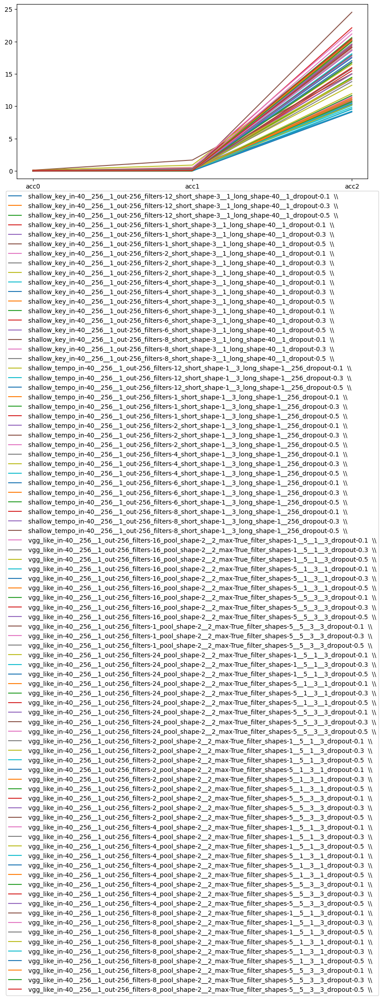

In [21]:
import re

plt.rcParams['figure.figsize'] = [10, 5]

l = []
name = []
acc0 = []
acc1 = []
acc2 = []
for ln in latex_report_whole.split("\n")[3:]:
    if ln == "":
        break
    s = ln.split('&')
    a = float(re.search("[\d,\.]+(?=%)", s[2]).group(0))
    b = float(re.search("[\d,\.]+(?=%)", s[3]).group(0))
    c = float(re.search("[\d,\.]+(?=%)", s[4]).group(0))
    y = [a, b, c]
    name.append(s[5])
    acc0.append(a)
    acc1.append(b)
    acc2.append(c)

    x = [0, 1, 2]
    xticks = ['acc0', 'acc1', 'acc2']
    plt.xticks(x, xticks)
    plt.plot(x, y, label=s[5])

plt.legend(bbox_to_anchor=(0.5, -0.05), loc='upper center')
plt.show()

In [22]:
print("best acc0", max(acc0), name[acc0.index(max(acc0))])
print("best acc1", max(acc1), name[acc1.index(max(acc1))])
print("best acc2", max(acc2), name[acc2.index(max(acc2))])

best acc0 0.112  shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5  \\
best acc1 1.676  shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5  \\
best acc2 24.525  shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3  \\


In [112]:
import re

plt.rcParams['figure.figsize'] = [10, 5]

entries = {}
for ln in latex_report_whole.split("\n")[3:]:
    if ln == "":
        break
    s = ln.split('&')
    k = re.sub('dropout-0.\d', '', s[5])
    acc = float(re.search("[\d,\.]+(?=%)", s[4]).group(0))
    
    if k in entries:
        if entries[k] < acc:
            entries[k] = acc
    else:
        print(k)
        entries[k] = acc

 shallow_key_in-40__256__1_out-256_filters-12_short_shape-3__1_long_shape-40__1_  \\
 shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_  \\
 shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_  \\
 shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_  \\
 shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_  \\
 shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_  \\
 shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_  \\
 shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_  \\
 shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_  \\
 shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_  \\
 shallow_tempo_in-40__256__1_out-256_filters-6_short_shape-1__3_long_shape-1__256_  \\
 shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-

In [120]:
best = {'key': 0, 'tempo': 0, 'vggKey': 0, 'vggTempo': 0, 'vggSquare': 0}

10.726
15.028
13.24
10.391
10.838
11.061


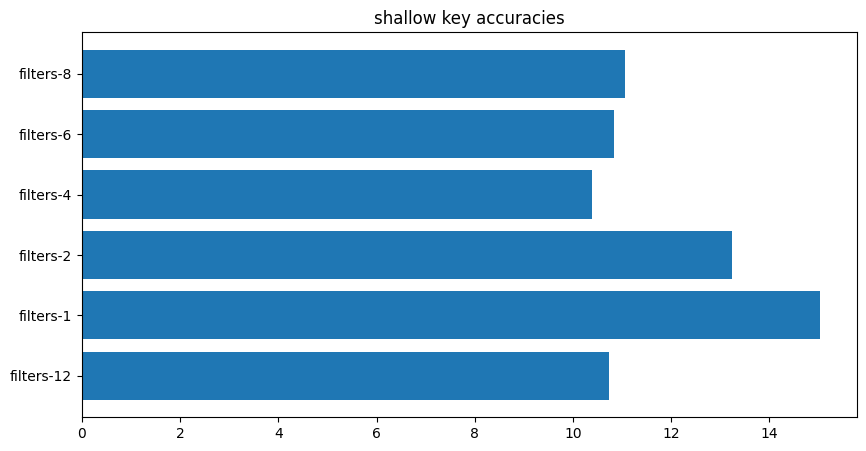

In [121]:
x = []
y = []
for k in entries.keys():
    if re.match(".*key*", k):
        print(entries[k])
        y.append(entries[k])
        x.append(re.search("filters-\d+", k).group(0))
        if best['key'] < entries[k]:
            best['key'] = entries[k]
plt.barh(x, y)    
plt.title('shallow key accuracies')
plt.show()

17.933
15.475
24.525
18.101
20.056
18.715


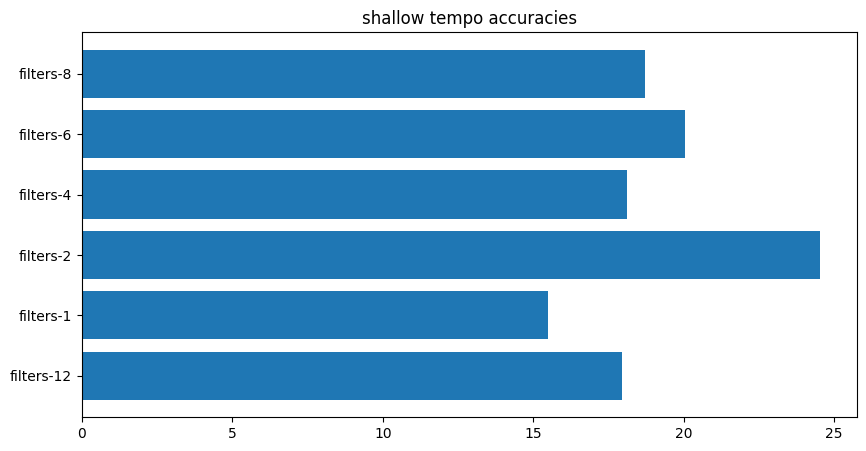

In [122]:
x = []
y = []
for k in entries.keys():
    if re.match(".*tempo.*", k):
        print(entries[k])
        y.append(entries[k])
        x.append(re.search("filters-\d+", k).group(0))
        if best['tempo'] < entries[k]:
            best['tempo'] = entries[k]
plt.barh(x, y)    
plt.title('shallow tempo accuracies')
plt.show()

10.726
11.006
11.676
11.006
10.503


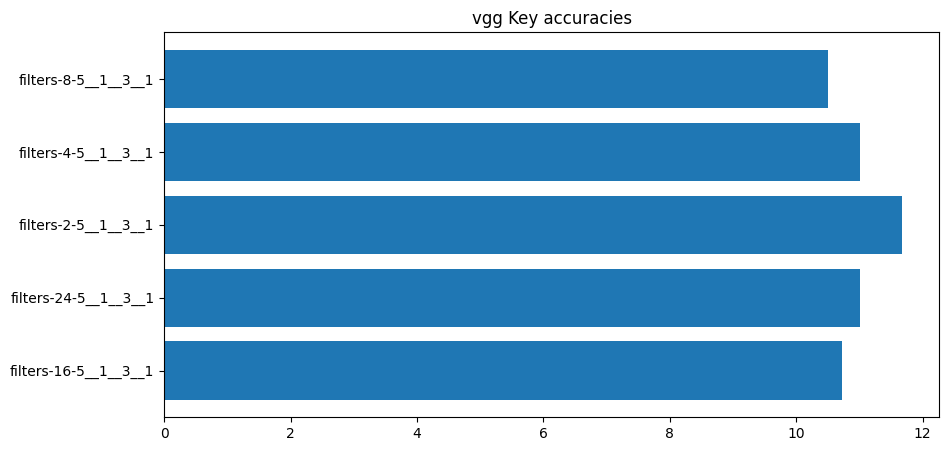

In [123]:
x = []
y = []
for k in entries.keys():
    if re.match(".*filter_shapes-5__1.*", k):
        print(entries[k])
        y.append(entries[k])
        x.append(re.search("filters-\d+", k).group(0) + "-" + re.search("\d__\d__\d__\d", k).group(0))
        if best['vggKey'] < entries[k]:
            best['vggKey'] = entries[k]
plt.barh(x, y)    
plt.title('vgg Key accuracies')
plt.show()

19.05
20.279
19.609
19.274
21.173


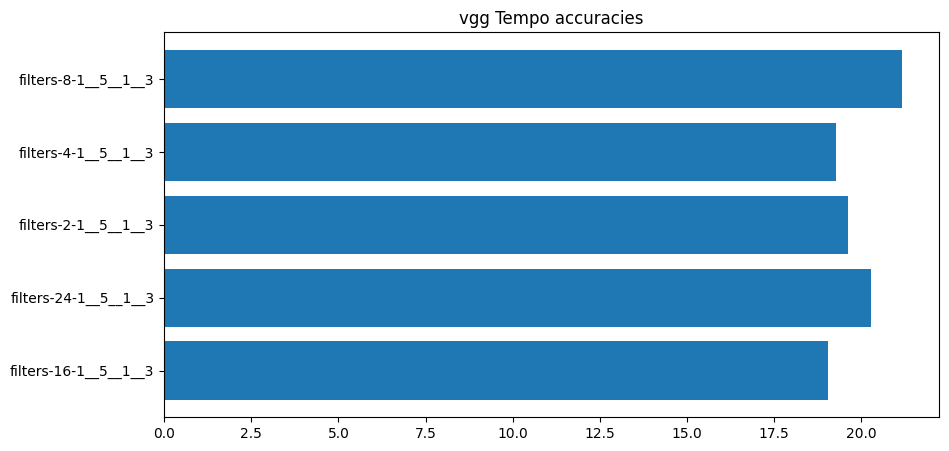

In [124]:
x = []
y = []
for k in entries.keys():
    if re.match(".*filter_shapes-1__5.*", k):
        print(entries[k])
        y.append(entries[k])
        x.append(re.search("filters-\d+", k).group(0) + "-" + re.search("\d__\d__\d__\d", k).group(0))
        if best['vggTempo'] < entries[k]:
            best['vggTempo'] = entries[k]
plt.barh(x, y)    
plt.title('vgg Tempo accuracies')
plt.show()

22.123
17.877
21.732
19.441
20.447
20.223


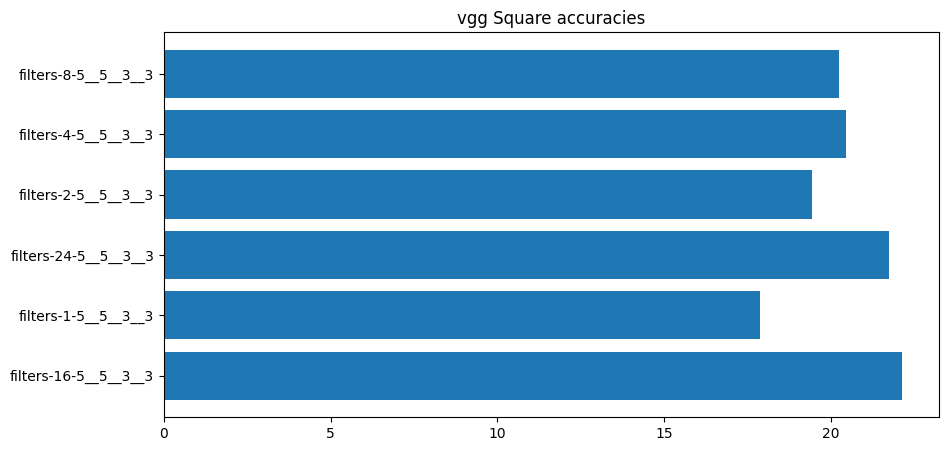

In [125]:
x = []
y = []
for k in entries.keys():
    if re.match(".*filter_shapes-5__5.*", k):
        print(entries[k])
        y.append(entries[k])
        x.append(re.search("filters-\d+", k).group(0) + "-" + re.search("\d__\d__\d__\d", k).group(0))
        if best['vggSquare'] < entries[k]:
            best['vggSquare'] = entries[k]
plt.barh(x, y)    
plt.title('vgg Square accuracies')
plt.show()

key 15.028
tempo 24.525
vggKey 11.676
vggTempo 21.173
vggSquare 22.123


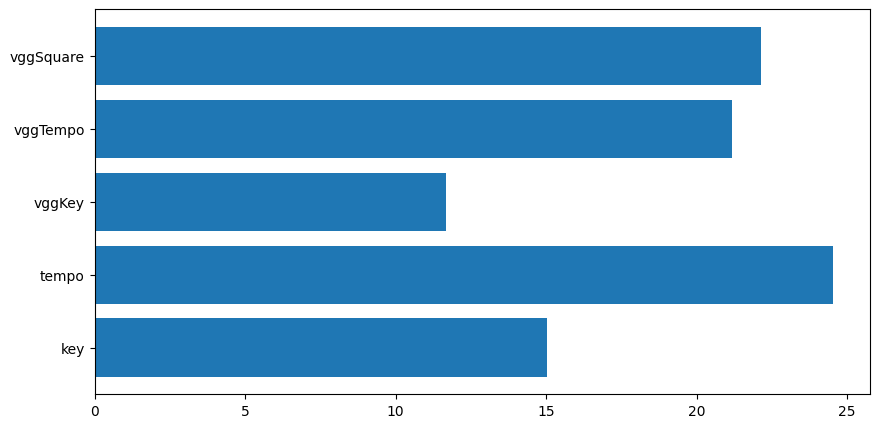

In [126]:
x = []
y = []
for k, v in best.items():
    print(k, v)
    x.append(k)
    y.append(v)

plt.barh(x, y)
plt.show()

# Redo Accuracy results

In [230]:
import re
import json

In [234]:
accuracy = {}
for k, v in models.items():
    for i in range(0, len(v)):
        model = v[i].load()
        pred = predict(model,
        input_shape=(40, 256, 1), windowed=False, ground_truth=truth,
        features=features, normalizer=std_normalizer)
        c = 0
        for x, y in pred.items():
            if predictions == int(truth.labels[x]):
                   c += 1
        if i == 0:
            accuracy[k] = [0] * len(v)
            accuracy[k][i] = c
        else:
            accuracy[k][i] = c
        del model

Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1_run=4.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=0.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3_run=1.h5 not 

Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=2.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=3.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-6_short_shape-3__1_long_shape-40__1_dropout-0.5_run=4.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=0.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=1.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=2.h5 not needed.
Local copy for ./modelsOsu/model_shallow_key_in-40__256__1_out-256_filters-8_short_shape-3__1_long_shape-40__1_dropout-0.1_run=3.h5 not 

Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=1.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=2.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=3.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-2_short_shape-1__3_long_shape-1__256_dropout-0.5_run=4.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-4_short_shape-1__3_long_shape-1__256_drop

Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=1.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=2.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=3.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.3_run=4.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__256_dropout-0.5_run=0.h5 not needed.
Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-12_short_shape-1__3_long_shape-1__2

Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=3.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.5_run=4.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=0.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=1.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=2.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-16_pool_shape-2__2_max-True_filter_shapes-1__5__1__3_dropout-0.1_run=3.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__

Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=0.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=1.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=2.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=3.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.3_run=4.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-4_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=0.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_ou

Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=3.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-24_pool_shape-2__2_max-True_filter_shapes-5__1__3__1_dropout-0.5_run=4.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=0.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=1.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=2.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-1_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.1_run=3.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_

Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=1.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=2.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=3.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.3_run=4.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=0.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_out-256_filters-8_pool_shape-2__2_max-True_filter_shapes-5__5__3__3_dropout-0.5_run=1.h5 not needed.
Local copy for ./modelsOsu/model_vgg_like_in-40__256__1_ou

In [ ]:
with open('accuracy.json', 'w') as f:
    #f.write(json.dump(accuracy))
    f.close()

In [204]:
f = open('accuracy.json', 'r')
accuracy = json.load(f)
f.close()

In [205]:
entries = {}
bestAccuracy = {}
for k, v in accuracy.items():
    bestAccuracy[k] = accuracy[k][accuracy[k].index(max(accuracy[k]))]

In [206]:
bestAccuracy

{'shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.1': 0.08100558659217877,
 'shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.3': 0.0782122905027933,
 'shallow_key_in-40__256__1_out-256_filters-1_short_shape-3__1_long_shape-40__1_dropout-0.5': 0.0782122905027933,
 'shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.1': 0.0782122905027933,
 'shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.3': 0.07541899441340782,
 'shallow_key_in-40__256__1_out-256_filters-2_short_shape-3__1_long_shape-40__1_dropout-0.5': 0.07541899441340782,
 'shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.1': 0.0782122905027933,
 'shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_dropout-0.3': 0.07541899441340782,
 'shallow_key_in-40__256__1_out-256_filters-4_short_shape-3__1_long_shape-40__1_drop

In [207]:
entries = {}
for k, v in bestAccuracy.items():
    k = re.sub('dropout-0\.\d', '', k)
    if k not in entries:
        entries[k] = v
    else:
        entries[k] = v if v > entries[k] else entries[k]

In [223]:
best = {'shallowKey': 0, 'shallowTempo': 0, 'vggKey': 0, 'vggTempo': 0, 'vggSquare': 0}

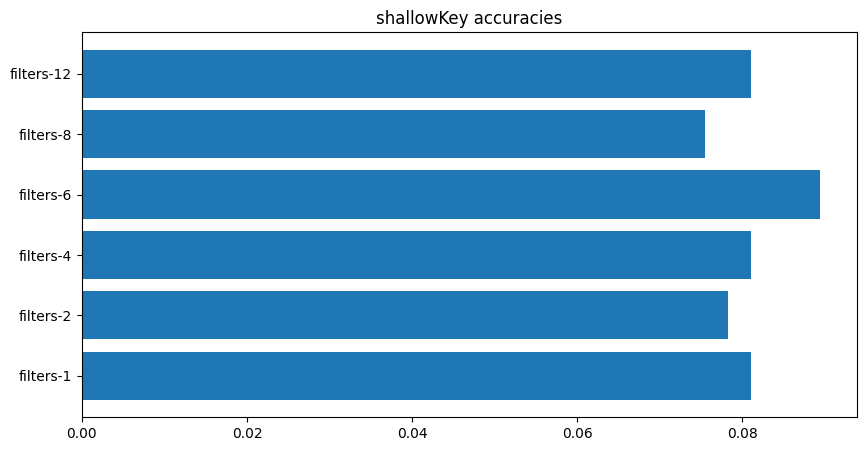

In [224]:
x = []
y = []
t = 'shallowKey'
for k, v in entries.items():
    if re.match('.*key.*', k):
        y.append(v)
        x.append(re.search('filters-\d+', k).group(0))
        best[t] = v if v > best[t] else best[t]
plt.barh(x, y)
plt.title(t + ' accuracies')
plt.show()

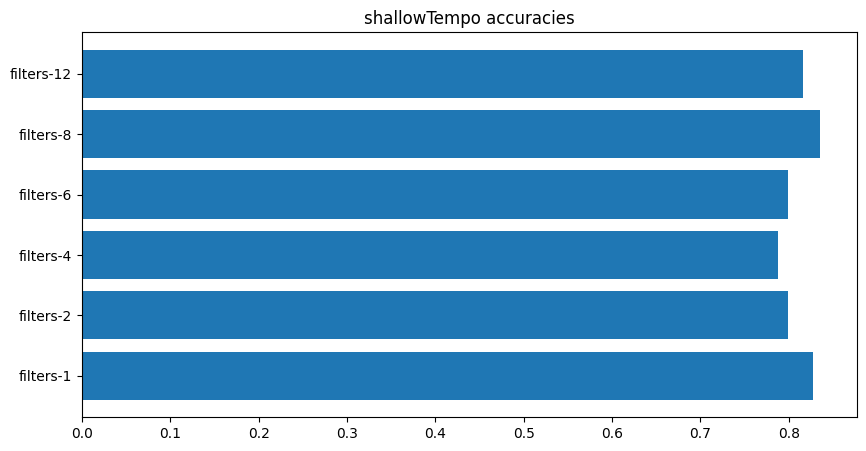

In [225]:
x = []
y = []
t = 'shallowTempo'
for k, v in entries.items():
    if re.match('.*tempo.*', k):
        y.append(v)
        x.append(re.search('filters-\d+', k).group(0))
        best[t] = v if v > best[t] else best[t]
plt.barh(x, y)
plt.title(t + ' accuracies')
plt.show()

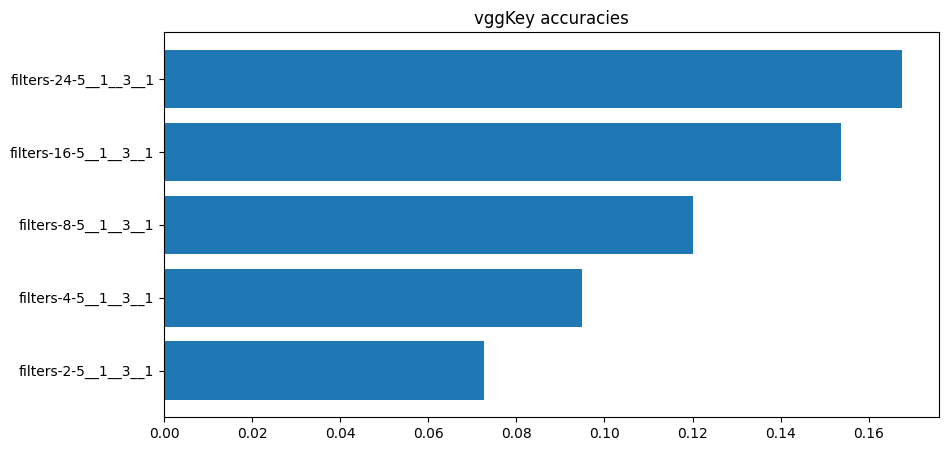

In [226]:
x = []
y = []
t = 'vggKey'
for k, v in entries.items():
    if re.match('.*filter_shapes-5__1.*', k):
        y.append(v)
        x.append(re.search("filters-\d+", k).group(0) + "-" + re.search("\d__\d__\d__\d", k).group(0))
        best[t] = v if v > best[t] else best[t]
plt.barh(x, y)
plt.title(t + ' accuracies')
plt.show()

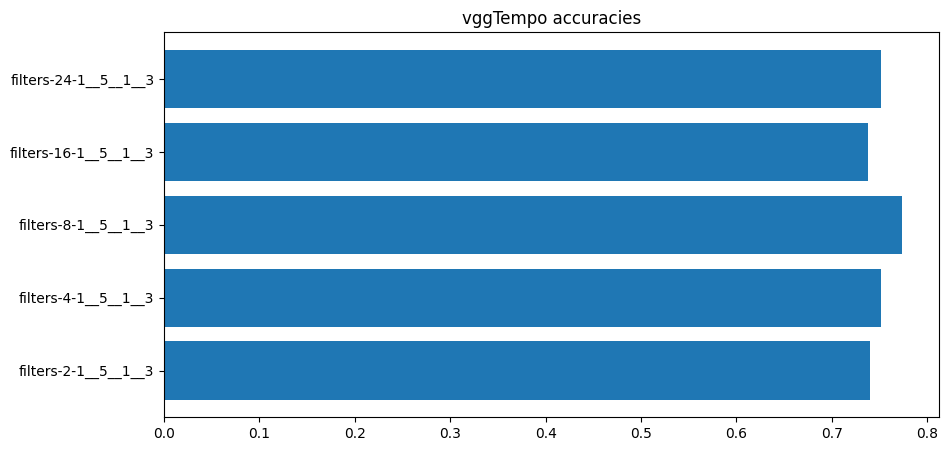

In [227]:
x = []
y = []
t = 'vggTempo'
for k, v in entries.items():
    if re.match('.*filter_shapes-1__5.*', k):
        y.append(v)
        x.append(re.search("filters-\d+", k).group(0) + "-" + re.search("\d__\d__\d__\d", k).group(0))
        best[t] = v if v > best[t] else best[t]
plt.barh(x, y)
plt.title(t + ' accuracies')
plt.show()

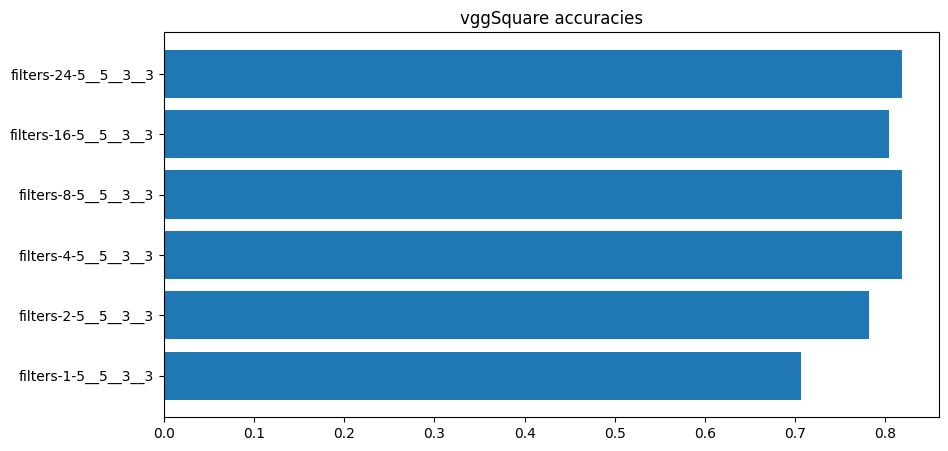

In [228]:
x = []
y = []
t = 'vggSquare'
for k, v in entries.items():
    if re.match('.*filter_shapes-5__5.*', k):
        y.append(v)
        x.append(re.search("filters-\d+", k).group(0) + "-" + re.search("\d__\d__\d__\d", k).group(0))
        best[t] = v if v > best[t] else best[t]
plt.barh(x, y)
plt.title(t + ' accuracies')
plt.show()

0.0893854748603352
0.835195530726257
0.16759776536312848
0.7737430167597765
0.8184357541899442


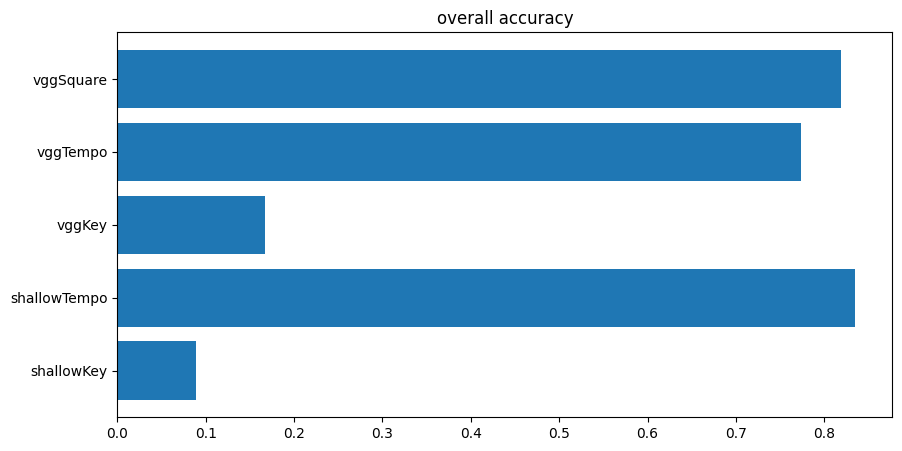

In [229]:
x = []
y = []
for k, v in best.items():
    x.append(k)
    y.append(v)
    print(v)
plt.barh(x, y)
plt.title('overall accuracy')
plt.show()

# Testing best model

In [235]:
k = 'shallow_tempo_in-40__256__1_out-256_filters-1_short_shape-1__3_long_shape-1__256_dropout-0.3'
modell = models[k]
model = modell[accuracy[k].index(max(accuracy[k]))].load()
predictions = predict(model,
        input_shape=(40, 256, 1), windowed=False, ground_truth=truth,
        features=features, normalizer=std_normalizer)

Local copy for ./modelsOsu/model_shallow_tempo_in-40__256__1_out-256_filters-8_short_shape-1__3_long_shape-1__256_dropout-0.3_run=0.h5 not needed.


In [236]:
c = 0
for k in predictions.keys():
    print(k, predictions[k], truth.labels[k])
    if predictions[k] == int(truth.labels[k]):
        c += 1

748291-1621084-0 347 347.0
748589-1609565-0 444 444.0
748836-1604098-0 368 368.0
750363-1580161-33734 353 353.0
750963-1581190-0 429 429.0
751782-1582610-0 333 333.0
751785-1582618-38869 353 353.0
751846-1582772-0 300 300.0
753005-1585398-0 390 390.0
753514-1589404-0 319 319.0
753514-1589404-67971 400 319.0
754110-1587703-44517 353 353.0
754219-1587909-0 349 348.0
754277-1588075-0 400 400.0
754464-1588391-144376 300 300.0
754464-1588391-167176 300 300.0
754464-1588391-188776 300 300.0
754464-1588391-203176 300 300.0
754464-1588391-238276 300 300.0
754464-1588391-5176 300 300.0
75509-213302-11459 313 313.0
757813-1596819-0 364 364.0
758130-1603339-0 326 326.0
760407-1599267-0 313 469.0
760407-1599267-75466 313 469.0
760407-1599267-97965 314 469.0
760473-1636694-0 333 250.0
760473-1636694-89506 333 250.0
760628-1658081-0 341 341.0
761500-1601237-0 288 433.0
762232-1602634-0 250 250.0
762635-1700716-0 349 349.0
763094-1604268-0 308 333.0
763094-1604268-133783 308 308.0
763094-1604268-1379

In [237]:
c / len(predictions)

0.7932960893854749